In [1]:
import os
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns

On this notebook I applied the KNN Classifier on the other datasets, with the goal to observe the different result considering the four datasets not mergeable 

In [3]:
#on the file utils.py are present the most used functions, that in some notebooks are copied, but for this notebook and for 
# the notebooks of the experiment on the entire dataset I import this functions from this file

#In file utils.py is also present a little explanation for all the functions

from utils import handle_warning,cross_valid,print_plot,compare_plots,preprocessed_dataset

# MIT-BIH ArrhythmiaDatabase

The results for the tests with KNN on this dataset are visible in the folder of the same name in the file KNN_Classifier.ipynb

# INCART2-leadArrhythmiaDatabase

First of all I applied all the pipeline used on the MIT-BIHArrhythmiaDatabase.csv dataset, on the INCART2-leadArrhythmiaDatabase.csv dataset

In [4]:
df2=pd.read_csv('C:/Users/matte/DataMiningJupyter/projectDM/datasets/starting_dataset/INCART2-leadArrhythmiaDatabase.csv',dtype={"record": "string"})

In [5]:
df2['type'].value_counts()

N       153546
VEB      20000
SVEB      1958
F          219
Q            6
Name: type, dtype: int64

In [6]:
df_cardio=preprocessed_dataset(df2)

In [7]:
df_cardio['type'].value_counts()

0.0    153546
2.0     20000
1.0      1958
Name: type, dtype: int64

In [8]:
df_cardio

,patient,type,0_pre-RR,0_post-RR,0_pPeak,0_tPeak,0_rPeak,0_sPeak,0_qPeak,0_qrs_interval,...,1_qPeak,1_qrs_interval,1_pq_interval,1_qt_interval,1_st_interval,1_qrs_morph0,1_qrs_morph1,1_qrs_morph2,1_qrs_morph3,1_qrs_morph4
0,0,0.0,-0.137054,-0.079354,0.069610,-0.083281,0.614133,-0.392761,0.047159,15,...,-0.023370,14,3,23,6,-0.023370,-0.011650,0.082608,0.101373,-0.183387
1,0,0.0,-0.079249,-0.050451,-0.097030,0.597254,-0.078704,-0.078704,-0.137781,3,...,0.081637,15,5,27,7,0.081637,0.102992,0.191225,0.217544,-0.068248
2,0,0.0,-0.050346,-1.900223,0.109399,0.680528,-0.010649,-0.010649,-0.720620,6,...,-0.148539,33,13,52,6,-0.148539,-0.060620,0.081080,0.204400,0.335172
3,0,2.0,-1.900120,1.828223,0.176376,0.256431,-0.101098,-0.707525,-0.101098,4,...,0.046898,21,9,34,4,0.046898,0.083728,0.279512,0.526785,0.450969
4,0,0.0,1.828330,-0.079354,0.585577,0.607461,-0.083499,-0.083499,-0.167858,3,...,-0.112552,32,5,43,6,-0.112552,0.012989,0.091491,0.134004,0.265232
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
175724,74,2.0,-0.313306,0.711893,0.167375,0.998450,-1.884460,-2.278752,-1.884460,3,...,-0.063313,31,8,44,5,-0.063313,0.026827,0.679694,1.798788,1.291884
175725,74,0.0,0.711564,0.230528,0.067664,0.986674,-0.321804,-0.321804,-0.743924,2,...,-0.038867,5,3,24,16,-0.038867,-0.370870,-0.697097,-0.948059,-1.078708
175726,74,0.0,0.230502,0.188670,-0.129754,0.746366,-0.303551,-0.303551,-0.875649,3,...,-0.113876,4,4,24,16,-0.113876,-0.113876,-0.452218,-0.738737,-0.917931
175727,74,0.0,0.188671,0.251457,-0.133953,0.747789,-0.626746,-0.626746,-0.871080,2,...,0.087784,18,8,42,16,0.087784,0.107684,0.308452,0.572327,-0.093598


In [9]:
import pandas as pd
from sklearn.model_selection import StratifiedGroupKFold
from sklearn.metrics import accuracy_score, classification_report, ConfusionMatrixDisplay
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import numpy as np
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import StratifiedKFold, cross_val_score
from sklearn.metrics import classification_report


pipe_normal = Pipeline([
        ('classification', KNeighborsClassifier(n_neighbors=10))
    ])
pipe_normal

Pipeline(steps=[('classification', KNeighborsClassifier(n_neighbors=10))])

Fold 1:
  Test:  patient=0
              precision    recall  f1-score   support

         0.0       0.98      0.99      0.98      2411
         2.0       0.93      0.83      0.87       344

    accuracy                           0.97      2755
   macro avg       0.95      0.91      0.93      2755
weighted avg       0.97      0.97      0.97      2755

                   0.0         2.0  accuracy    macro avg  weighted avg
precision     0.975889    0.925325  0.970236     0.950607      0.969575
recall        0.990460    0.828488  0.970236     0.909474      0.970236
f1-score      0.983121    0.874233  0.970236     0.928677      0.969525
support    2411.000000  344.000000  0.970236  2755.000000   2755.000000


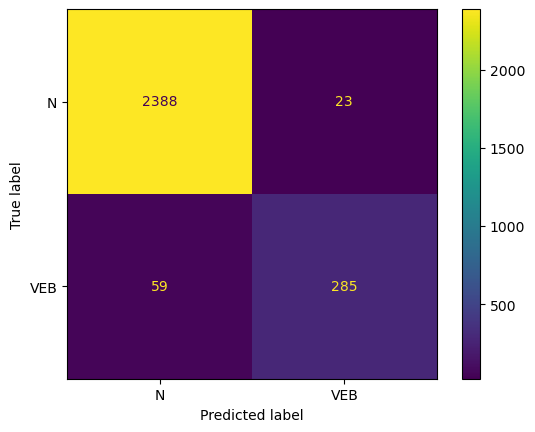

Fold 2:
  Test:  patient=1
              precision    recall  f1-score   support

         0.0       0.98      1.00      0.99      2443
         2.0       0.98      0.81      0.89       229

    accuracy                           0.98      2672
   macro avg       0.98      0.90      0.94      2672
weighted avg       0.98      0.98      0.98      2672

                   0.0         2.0  accuracy    macro avg  weighted avg
precision     0.982287    0.984043   0.98241     0.983165      0.982437
recall        0.998772    0.807860   0.98241     0.903316      0.982410
f1-score      0.990461    0.887290   0.98241     0.938875      0.981619
support    2443.000000  229.000000   0.98241  2672.000000   2672.000000


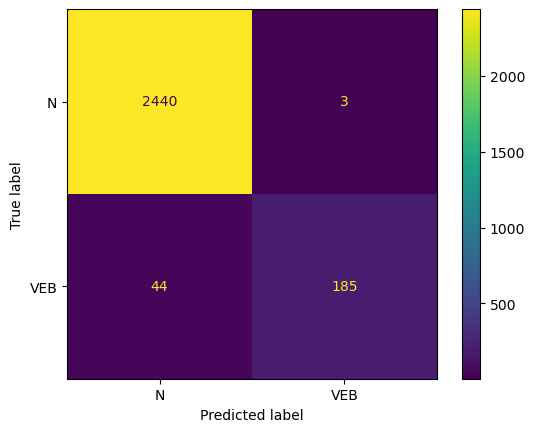

Fold 3:
  Test:  patient=2


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\

              precision    recall  f1-score   support

         0.0       0.99      1.00      1.00      2323
         1.0       0.00      0.00      0.00         2
         2.0       1.00      0.92      0.96       125

    accuracy                           1.00      2450
   macro avg       0.66      0.64      0.65      2450
weighted avg       0.99      1.00      0.99      2450

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.994861  NaN    1.000000  0.995102     0.664954      0.994311
recall        1.000000  0.0    0.920000  0.995102     0.640000      0.995102
f1-score      0.997424  NaN    0.958333  0.995102     0.651919      0.994615
support    2323.000000  2.0  125.000000  0.995102  2450.000000   2450.000000


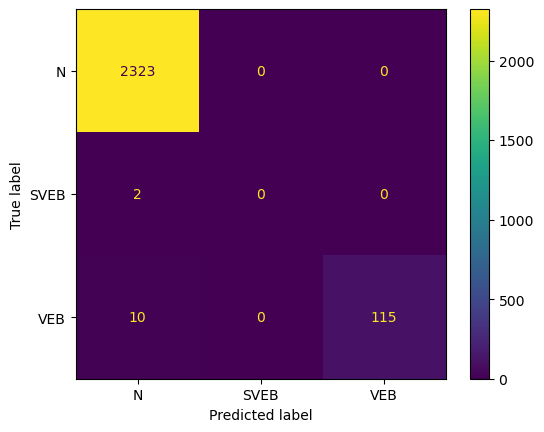

Fold 4:
  Test:  patient=3
              precision    recall  f1-score   support

         0.0       0.97      1.00      0.98      2268
         1.0       0.00      0.00      0.00        16
         2.0       0.87      0.51      0.65       121

    accuracy                           0.97      2405
   macro avg       0.61      0.50      0.54      2405
weighted avg       0.96      0.97      0.96      2405

                   0.0   1.0         2.0  accuracy    macro avg  weighted avg
precision     0.967866   NaN    0.873239  0.965073     0.613702      0.956666
recall        0.996032   0.0    0.512397  0.965073     0.502809      0.965073
f1-score      0.981747   NaN    0.645833  0.965073     0.542527      0.958315
support    2268.000000  16.0  121.000000  0.965073  2405.000000   2405.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\

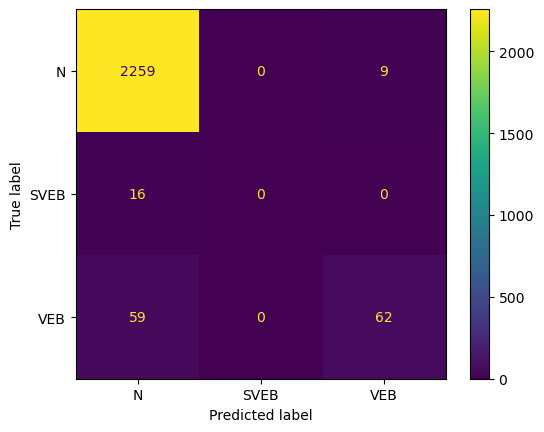

Fold 5:
  Test:  patient=4
              precision    recall  f1-score   support

         0.0       0.92      1.00      0.96      1518
         2.0       1.00      0.47      0.64       247

    accuracy                           0.93      1765
   macro avg       0.96      0.74      0.80      1765
weighted avg       0.93      0.93      0.91      1765

                   0.0         2.0  accuracy    macro avg  weighted avg
precision     0.921117    1.000000  0.926346     0.960558      0.932156
recall        1.000000    0.473684  0.926346     0.736842      0.926346
f1-score      0.958939    0.642857  0.926346     0.800898      0.914705
support    1518.000000  247.000000  0.926346  1765.000000   1765.000000


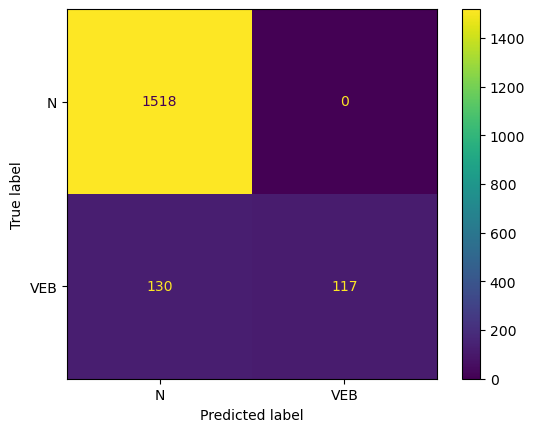

Fold 6:
  Test:  patient=5
              precision    recall  f1-score   support

         0.0       0.99      1.00      0.99      2434
         1.0       0.90      0.56      0.69        48
         2.0       1.00      0.89      0.94         9

    accuracy                           0.99      2491
   macro avg       0.96      0.82      0.88      2491
weighted avg       0.99      0.99      0.99      2491

                   0.0        1.0       2.0  accuracy    macro avg  \
precision     0.991031   0.900000  1.000000  0.989964     0.963677   
recall        0.998767   0.562500  0.888889  0.989964     0.816719   
f1-score      0.994884   0.692308  0.941176  0.989964     0.876123   
support    2434.000000  48.000000  9.000000  0.989964  2491.000000   

           weighted avg  
precision      0.989310  
recall         0.989964  
f1-score       0.988860  
support     2491.000000  


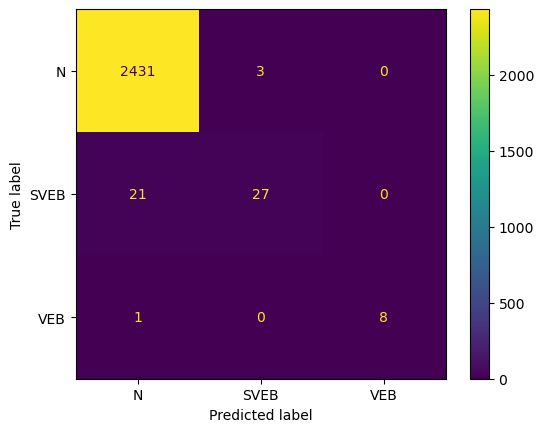

Fold 7:
  Test:  patient=6
              precision    recall  f1-score   support

         0.0       0.99      1.00      0.99      2638
         1.0       0.97      0.60      0.74        65
         2.0       1.00      1.00      1.00         1

    accuracy                           0.99      2704
   macro avg       0.99      0.87      0.91      2704
weighted avg       0.99      0.99      0.99      2704

                   0.0        1.0  2.0  accuracy    macro avg  weighted avg
precision     0.990237   0.975000  1.0  0.990015     0.988412      0.989874
recall        0.999621   0.600000  1.0  0.990015     0.866540      0.990015
f1-score      0.994907   0.742857  1.0  0.990015     0.912588      0.988850
support    2638.000000  65.000000  1.0  0.990015  2704.000000   2704.000000


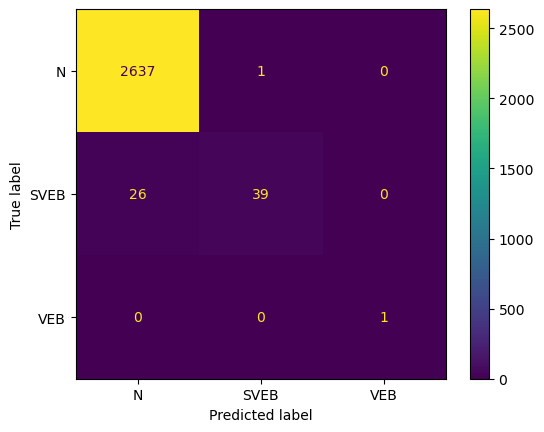

Fold 8:
  Test:  patient=7


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\

              precision    recall  f1-score   support

         0.0       0.94      1.00      0.97      1776
         1.0       0.00      0.00      0.00         2
         2.0       0.98      0.69      0.81       350

    accuracy                           0.95      2128
   macro avg       0.64      0.56      0.59      2128
weighted avg       0.95      0.95      0.94      2128

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.940552  NaN    0.983607  0.945489     0.641386      0.946749
recall        0.997748  0.0    0.685714  0.945489     0.561154      0.945489
f1-score      0.968306  NaN    0.808081  0.945489     0.592129      0.941043
support    1776.000000  2.0  350.000000  0.945489  2128.000000   2128.000000


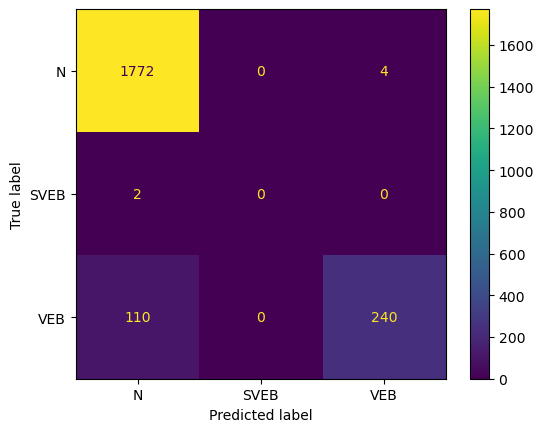

Fold 9:
  Test:  patient=8
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2946
         2.0       1.00      0.80      0.89        41

    accuracy                           1.00      2987
   macro avg       1.00      0.90      0.95      2987
weighted avg       1.00      1.00      1.00      2987

                   0.0        2.0  accuracy    macro avg  weighted avg
precision     0.997292   1.000000  0.997322     0.998646      0.997329
recall        1.000000   0.804878  0.997322     0.902439      0.997322
f1-score      0.998644   0.891892  0.997322     0.945268      0.997179
support    2946.000000  41.000000  0.997322  2987.000000   2987.000000


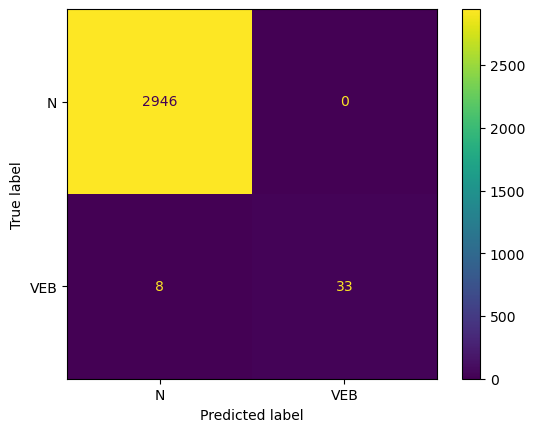

Fold 10:
  Test:  patient=9


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       0.99      1.00      0.99      3597
         1.0       0.00      0.00      0.00         0
         2.0       0.76      0.64      0.69        83

    accuracy                           0.99      3680
   macro avg       0.58      0.54      0.56      3680
weighted avg       0.99      0.99      0.99      3680

                   0.0  1.0        2.0  accuracy    macro avg  weighted avg
precision     0.993065  0.0   0.757143  0.987228     0.583403      0.987744
recall        0.995274  NaN   0.638554  0.987228     0.544609      0.987228
f1-score      0.994168  NaN   0.692810  0.987228     0.562326      0.987371
support    3597.000000  0.0  83.000000  0.987228  3680.000000   3680.000000


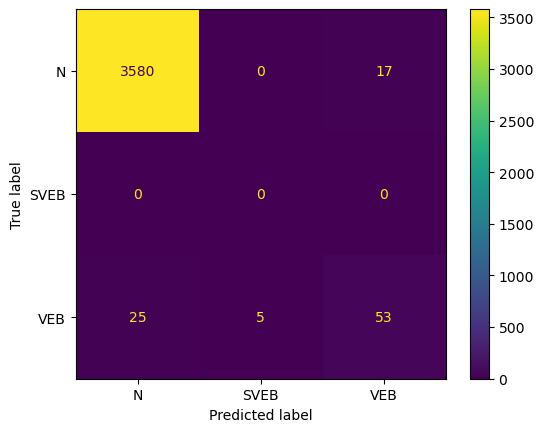

Fold 11:
  Test:  patient=10
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2076
         2.0       0.33      0.50      0.40         4

    accuracy                           1.00      2080
   macro avg       0.67      0.75      0.70      2080
weighted avg       1.00      1.00      1.00      2080

                   0.0       2.0  accuracy    macro avg  weighted avg
precision     0.999036  0.333333  0.997115     0.666185      0.997755
recall        0.998073  0.500000  0.997115     0.749037      0.997115
f1-score      0.998554  0.400000  0.997115     0.699277      0.997403
support    2076.000000  4.000000  0.997115  2080.000000   2080.000000


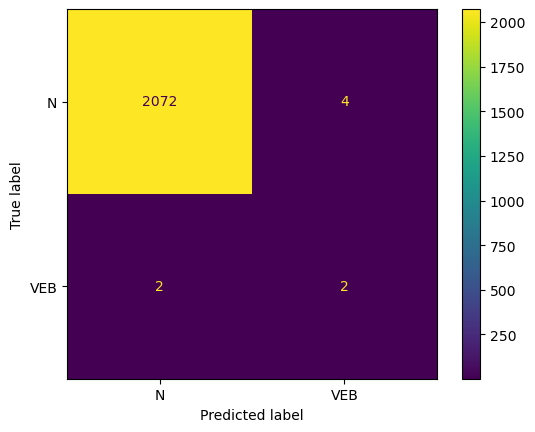

Fold 12:
  Test:  patient=11
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2798
         1.0       0.00      0.00      0.00         1
         2.0       0.50      0.33      0.40         6

    accuracy                           1.00      2805
   macro avg       0.50      0.44      0.47      2805
weighted avg       1.00      1.00      1.00      2805

                   0.0  1.0       2.0  accuracy    macro avg  weighted avg
precision     0.998215  NaN  0.500000  0.997504     0.499405      0.996793
recall        0.999285  0.0  0.333333  0.997504     0.444206      0.997504
f1-score      0.998750  NaN  0.400000  0.997504     0.466250      0.997113
support    2798.000000  1.0  6.000000  0.997504  2805.000000   2805.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\

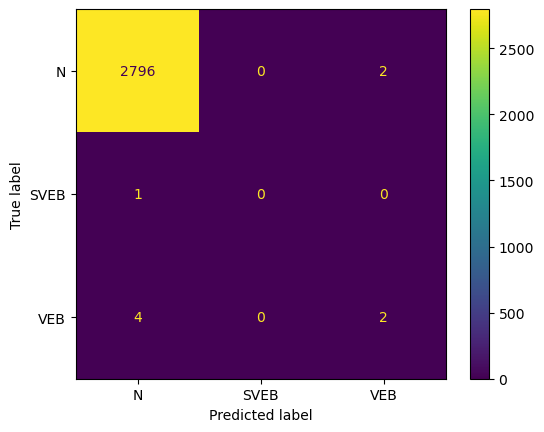

Fold 13:
  Test:  patient=12
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1791
         2.0       1.00      1.00      1.00       230

    accuracy                           1.00      2021
   macro avg       1.00      1.00      1.00      2021
weighted avg       1.00      1.00      1.00      2021

              0.0    2.0  accuracy  macro avg  weighted avg
precision     1.0    1.0       1.0        1.0           1.0
recall        1.0    1.0       1.0        1.0           1.0
f1-score      1.0    1.0       1.0        1.0           1.0
support    1791.0  230.0       1.0     2021.0        2021.0


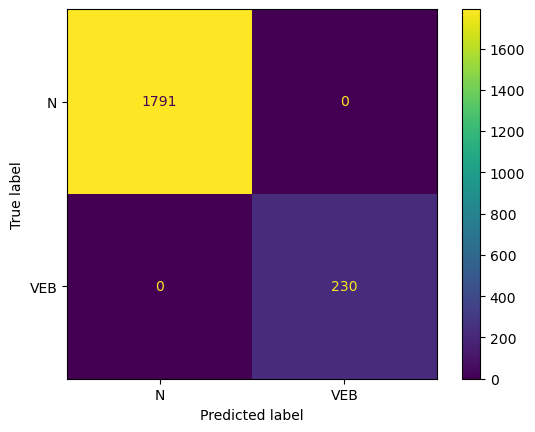

Fold 14:
  Test:  patient=13
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1800
         2.0       1.00      0.91      0.95        64

    accuracy                           1.00      1864
   macro avg       1.00      0.95      0.97      1864
weighted avg       1.00      1.00      1.00      1864

                   0.0       2.0  accuracy    macro avg  weighted avg
precision     0.996678   1.00000  0.996781     0.998339      0.996792
recall        1.000000   0.90625  0.996781     0.953125      0.996781
f1-score      0.998336   0.95082  0.996781     0.974578      0.996705
support    1800.000000  64.00000  0.996781  1864.000000   1864.000000


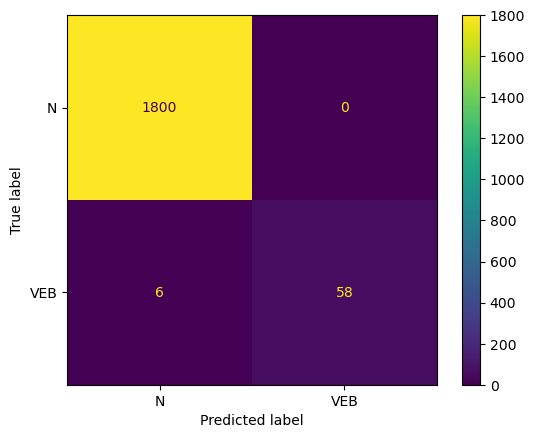

Fold 15:
  Test:  patient=14
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2630
         2.0       0.00      0.00      0.00         3

    accuracy                           1.00      2633
   macro avg       0.50      0.50      0.50      2633
weighted avg       1.00      1.00      1.00      2633

                  0.0  2.0  accuracy    macro avg  weighted avg
precision     0.99886  0.0  0.998101     0.499430      0.997722
recall        0.99924  0.0  0.998101     0.499620      0.998101
f1-score      0.99905  0.0  0.998101     0.499525      0.997911
support    2630.00000  3.0  0.998101  2633.000000   2633.000000


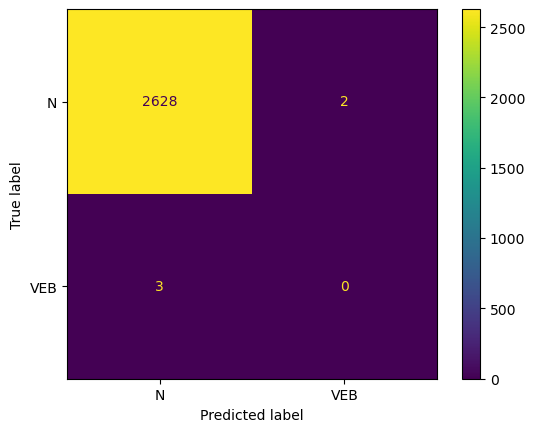

Fold 16:
  Test:  patient=15
              precision    recall  f1-score   support

         0.0       1.00      0.93      0.96      1518
         2.0       0.01      0.50      0.02         2

    accuracy                           0.93      1520
   macro avg       0.50      0.72      0.49      1520
weighted avg       1.00      0.93      0.96      1520

                   0.0       2.0  accuracy    macro avg  weighted avg
precision     0.999292  0.009346  0.929605     0.504319      0.997990
recall        0.930171  0.500000  0.929605     0.715086      0.929605
f1-score      0.963494  0.018349  0.929605     0.490921      0.962250
support    1518.000000  2.000000  0.929605  1520.000000   1520.000000


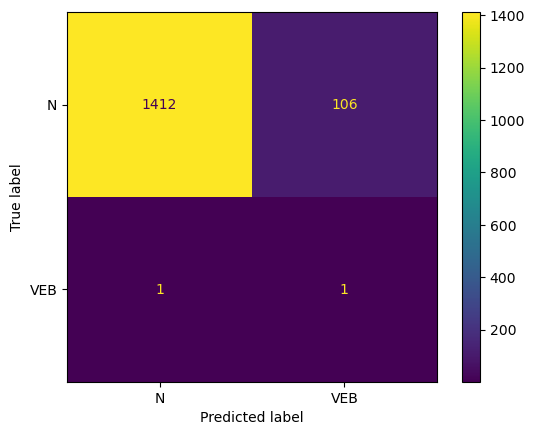

Fold 17:
  Test:  patient=16
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1644
         2.0       0.70      0.70      0.70        27

    accuracy                           0.99      1671
   macro avg       0.85      0.85      0.85      1671
weighted avg       0.99      0.99      0.99      1671

                   0.0        2.0  accuracy    macro avg  weighted avg
precision     0.995134   0.703704  0.990425     0.849419      0.990425
recall        0.995134   0.703704  0.990425     0.849419      0.990425
f1-score      0.995134   0.703704  0.990425     0.849419      0.990425
support    1644.000000  27.000000  0.990425  1671.000000   1671.000000


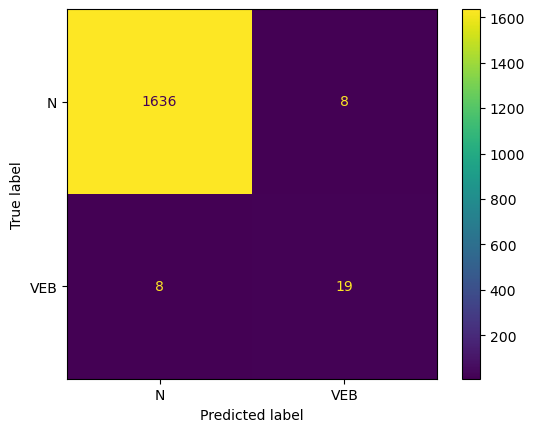

Fold 18:
  Test:  patient=17


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       0.99      1.00      0.99      2660
         1.0       0.00      0.00      0.00         0
         2.0       0.98      0.90      0.94       366

    accuracy                           0.99      3026
   macro avg       0.65      0.63      0.64      3026
weighted avg       0.99      0.99      0.99      3026

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.986602  0.0    0.976331  0.985129     0.654311      0.985360
recall        0.996617  NaN    0.901639  0.985129     0.632752      0.985129
f1-score      0.991584  NaN    0.937500  0.985129     0.643028      0.985043
support    2660.000000  0.0  366.000000  0.985129  3026.000000   3026.000000


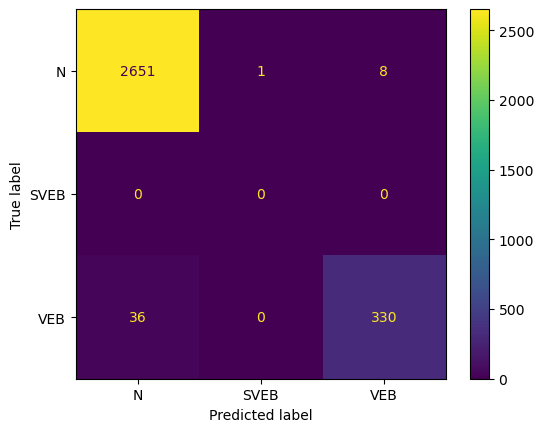

Fold 19:
  Test:  patient=18


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       1.00      0.89      0.94      1211
         1.0       0.00      0.00      0.00         0
         2.0       0.87      1.00      0.93       849

    accuracy                           0.94      2060
   macro avg       0.62      0.63      0.62      2060
weighted avg       0.95      0.94      0.94      2060

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.0    0.870769  0.937379     0.623590      0.946739
recall        0.893476  NaN    1.000000  0.937379     0.631159      0.937379
f1-score      0.943742  NaN    0.930921  0.937379     0.624888      0.938458
support    1211.000000  0.0  849.000000  0.937379  2060.000000   2060.000000


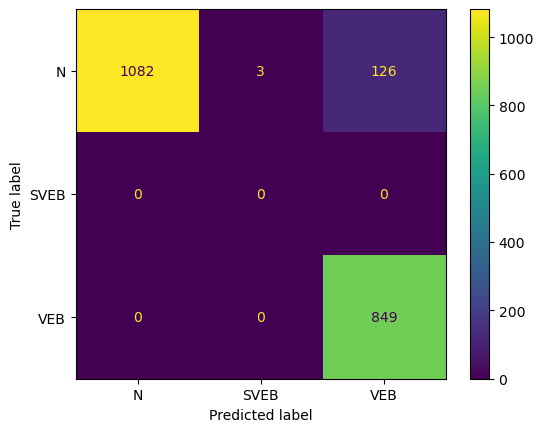

Fold 20:
  Test:  patient=19
              precision    recall  f1-score   support

         0.0       0.94      1.00      0.97      2360
         1.0       0.96      0.26      0.41       179
         2.0       0.99      0.81      0.89       110

    accuracy                           0.94      2649
   macro avg       0.96      0.69      0.76      2649
weighted avg       0.94      0.94      0.93      2649

                   0.0         1.0         2.0  accuracy    macro avg  \
precision     0.939442    0.959184    0.988889  0.941487     0.962505   
recall        0.999153    0.262570    0.809091  0.941487     0.690271   
f1-score      0.968378    0.412281    0.890000  0.941487     0.756886   
support    2360.000000  179.000000  110.000000  0.941487  2649.000000   

           weighted avg  
precision      0.942829  
recall         0.941487  
f1-score       0.927546  
support     2649.000000  


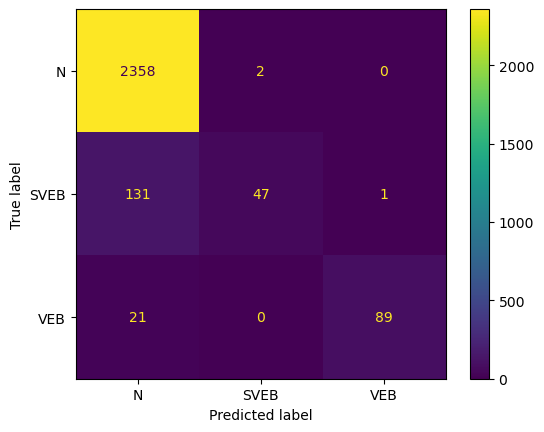

Fold 21:
  Test:  patient=20
              precision    recall  f1-score   support

         0.0       0.97      1.00      0.98      2070
         1.0       0.87      0.43      0.58       104
         2.0       1.00      0.75      0.86         8

    accuracy                           0.97      2182
   macro avg       0.95      0.73      0.81      2182
weighted avg       0.97      0.97      0.96      2182

                   0.0         1.0       2.0  accuracy    macro avg  \
precision     0.971281    0.865385  1.000000  0.968836     0.945555   
recall        0.996618    0.432692  0.750000  0.968836     0.726437   
f1-score      0.983786    0.576923  0.857143  0.968836     0.805951   
support    2070.000000  104.000000  8.000000  0.968836  2182.000000   

           weighted avg  
precision      0.966339  
recall         0.968836  
f1-score       0.963930  
support     2182.000000  


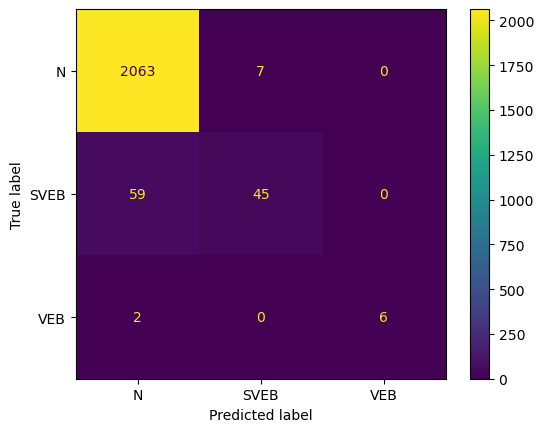

Fold 22:
  Test:  patient=21
              precision    recall  f1-score   support

         0.0       0.95      1.00      0.97      2814
         1.0       0.84      0.34      0.48       124
         2.0       0.97      0.57      0.72       185

    accuracy                           0.95      3123
   macro avg       0.92      0.64      0.73      3123
weighted avg       0.94      0.95      0.94      3123

                   0.0         1.0         2.0  accuracy    macro avg  \
precision     0.947368    0.840000    0.972477  0.946526     0.919948   
recall        0.997868    0.338710    0.572973  0.946526     0.636517   
f1-score      0.971963    0.482759    0.721088  0.946526     0.725270   
support    2814.000000  124.000000  185.000000  0.946526  3123.000000   

           weighted avg  
precision      0.944593  
recall         0.946526  
f1-score       0.937677  
support     3123.000000  


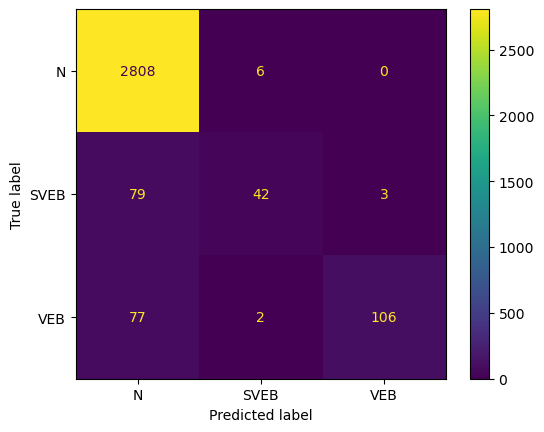

Fold 23:
  Test:  patient=22
              precision    recall  f1-score   support

         0.0       1.00      0.99      0.99      2190
         2.0       0.20      0.38      0.26        13

    accuracy                           0.99      2203
   macro avg       0.60      0.69      0.63      2203
weighted avg       0.99      0.99      0.99      2203

                   0.0        2.0  accuracy    macro avg  weighted avg
precision     0.996327   0.200000   0.98729     0.598163      0.991628
recall        0.990868   0.384615   0.98729     0.687741      0.987290
f1-score      0.993590   0.263158   0.98729     0.628374      0.989279
support    2190.000000  13.000000   0.98729  2203.000000   2203.000000


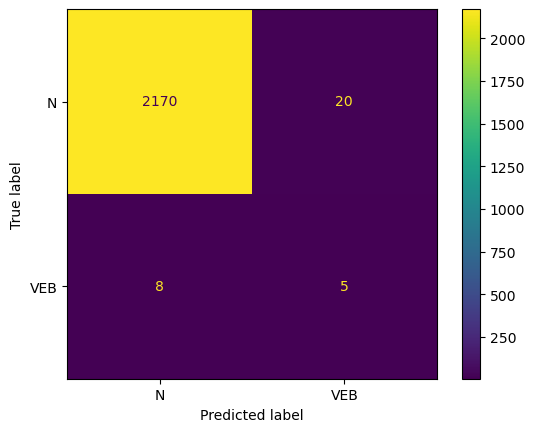

Fold 24:
  Test:  patient=23
              precision    recall  f1-score   support

         0.0       1.00      0.97      0.98      2563
         1.0       0.00      0.00      0.00         0
         2.0       0.02      0.33      0.04         6

    accuracy                           0.96      2569
   macro avg       0.34      0.43      0.34      2569
weighted avg       1.00      0.96      0.98      2569

                   0.0  1.0       2.0  accuracy    macro avg  weighted avg
precision     0.998387  0.0  0.023529  0.964578     0.340639      0.996110
recall        0.966055  NaN  0.333333  0.964578     0.433130      0.964578
f1-score      0.981955  NaN  0.043956  0.964578     0.341970      0.979764
support    2563.000000  0.0  6.000000  0.964578  2569.000000   2569.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

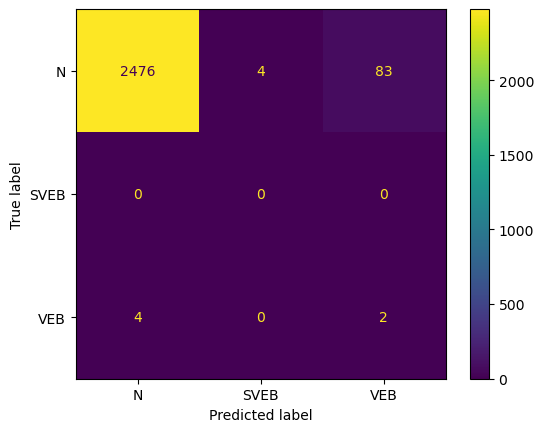

Fold 25:
  Test:  patient=24
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1703
         1.0       0.50      0.50      0.50         2
         2.0       1.00      0.60      0.75         5

    accuracy                           1.00      1710
   macro avg       0.83      0.70      0.75      1710
weighted avg       1.00      1.00      1.00      1710

                   0.0  1.0   2.0  accuracy    macro avg  weighted avg
precision     0.998827  0.5  1.00  0.998246     0.832942      0.998247
recall        1.000000  0.5  0.60  0.998246     0.700000      0.998246
f1-score      0.999413  0.5  0.75  0.998246     0.749804      0.998100
support    1703.000000  2.0  5.00  0.998246  1710.000000   1710.000000


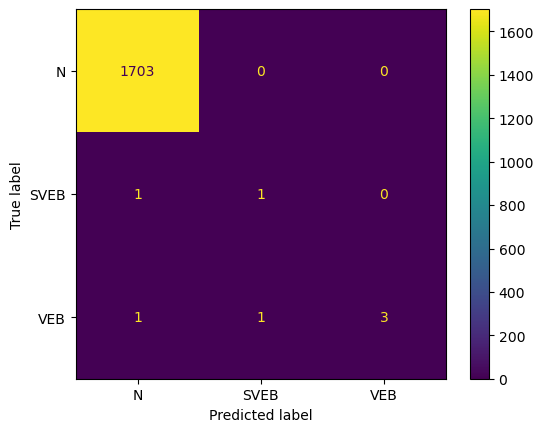

Fold 26:
  Test:  patient=25
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1496
         1.0       1.00      0.43      0.60         7
         2.0       0.43      0.75      0.55         4

    accuracy                           0.99      1507
   macro avg       0.81      0.73      0.71      1507
weighted avg       1.00      0.99      0.99      1507

                   0.0       1.0       2.0  accuracy    macro avg  \
precision     0.996660  1.000000  0.428571  0.994028     0.808410   
recall        0.997326  0.428571  0.750000  0.994028     0.725299   
f1-score      0.996993  0.600000  0.545455  0.994028     0.714149   
support    1496.000000  7.000000  4.000000  0.994028  1507.000000   

           weighted avg  
precision      0.995168  
recall         0.994028  
f1-score       0.993950  
support     1507.000000  


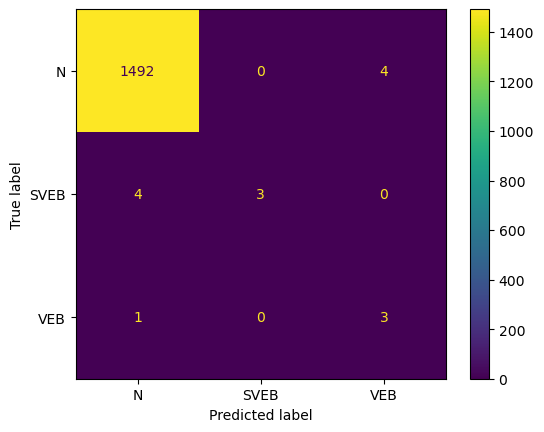

Fold 27:
  Test:  patient=26
              precision    recall  f1-score   support

         0.0       0.99      1.00      0.99      1884
         1.0       0.00      0.00      0.00         0
         2.0       0.99      0.98      0.99       719

    accuracy                           0.99      2603
   macro avg       0.66      0.66      0.66      2603
weighted avg       0.99      0.99      0.99      2603

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.992600  0.0    0.992958  0.992317     0.661853      0.992699
recall        0.996815  NaN    0.980529  0.992317     0.659115      0.992317
f1-score      0.994703  NaN    0.986704  0.992317     0.660469      0.992494
support    1884.000000  0.0  719.000000  0.992317  2603.000000   2603.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

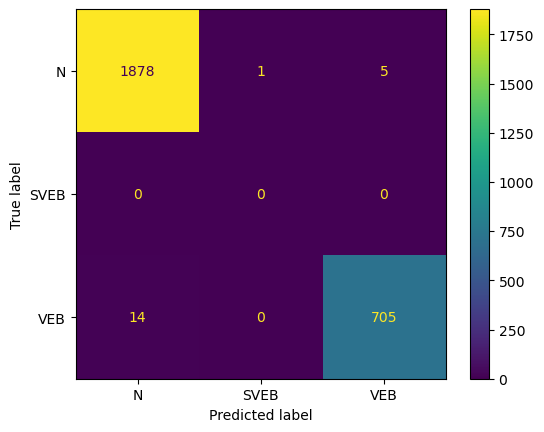

Fold 28:
  Test:  patient=27
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1711
         2.0       0.38      0.75      0.50         4

    accuracy                           1.00      1715
   macro avg       0.69      0.87      0.75      1715
weighted avg       1.00      1.00      1.00      1715

                   0.0    2.0  accuracy    macro avg  weighted avg
precision     0.999414  0.375  0.996501     0.687207      0.997958
recall        0.997078  0.750  0.996501     0.873539      0.996501
f1-score      0.998245  0.500  0.996501     0.749122      0.997083
support    1711.000000  4.000  0.996501  1715.000000   1715.000000


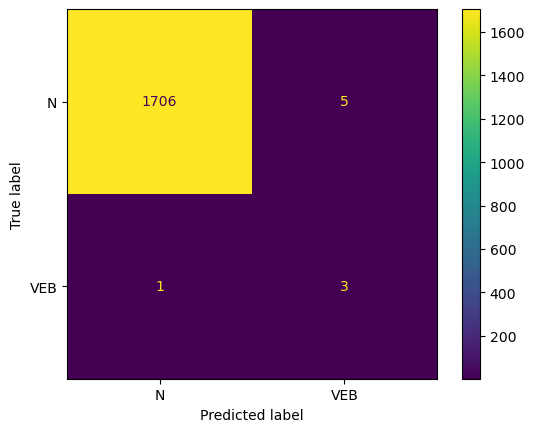

Fold 29:
  Test:  patient=28
              precision    recall  f1-score   support

         0.0       0.94      0.99      0.96      1835
         1.0       0.00      0.00      0.00         0
         2.0       0.98      0.84      0.90       783

    accuracy                           0.94      2618
   macro avg       0.64      0.61      0.62      2618
weighted avg       0.95      0.94      0.95      2618

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.937081  0.0    0.977679  0.944996     0.638253      0.949223
recall        0.990191  NaN    0.839080  0.944996     0.609757      0.944996
f1-score      0.962904  NaN    0.903093  0.944996     0.621999      0.945016
support    1835.000000  0.0  783.000000  0.944996  2618.000000   2618.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

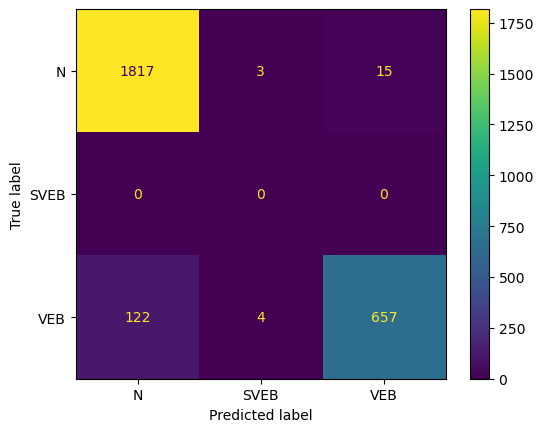

Fold 30:
  Test:  patient=29


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       0.96      1.00      0.98      1705
         1.0       0.00      0.00      0.00         0
         2.0       1.00      0.89      0.94       755

    accuracy                           0.97      2460
   macro avg       0.65      0.63      0.64      2460
weighted avg       0.97      0.97      0.97      2460

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.957865  0.0    1.000000  0.966667     0.652622      0.970797
recall        1.000000  NaN    0.891391  0.966667     0.630464      0.966667
f1-score      0.978479  NaN    0.942577  0.966667     0.640352      0.967460
support    1705.000000  0.0  755.000000  0.966667  2460.000000   2460.000000


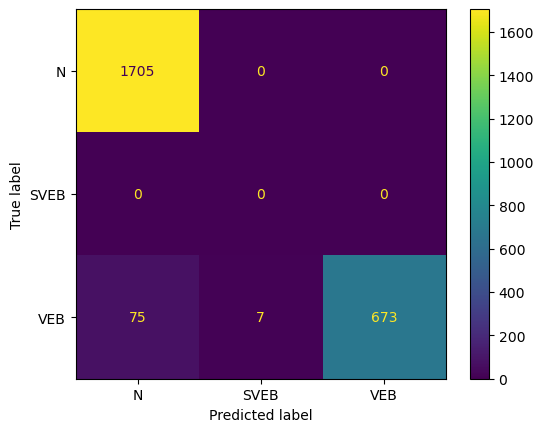

Fold 31:
  Test:  patient=30


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       0.87      1.00      0.93      1843
         1.0       0.00      0.00      0.00         0
         2.0       0.99      0.78      0.88      1364

    accuracy                           0.91      3207
   macro avg       0.62      0.59      0.60      3207
weighted avg       0.92      0.91      0.91      3207

                   0.0  1.0          2.0  accuracy    macro avg  weighted avg
precision     0.871795  0.0     0.993494  0.905831     0.621763      0.923556
recall        0.996202  NaN     0.783724  0.905831     0.593309      0.905831
f1-score      0.929856  NaN     0.876230  0.905831     0.602028      0.907047
support    1843.000000  0.0  1364.000000  0.905831  3207.000000   3207.000000


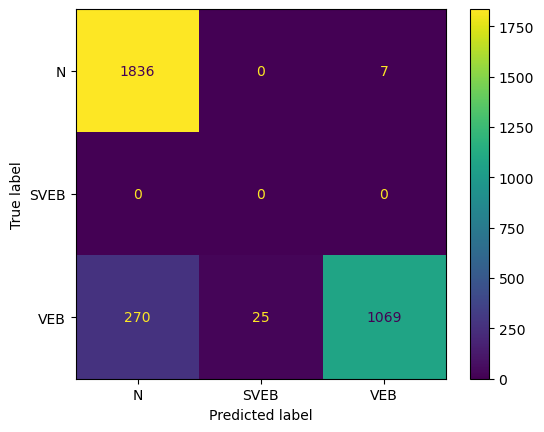

Fold 32:
  Test:  patient=31
              precision    recall  f1-score   support

         0.0       1.00      0.98      0.99      1560
         1.0       0.00      0.00      0.00         0
         2.0       0.71      0.96      0.82        57

    accuracy                           0.98      1617
   macro avg       0.57      0.65      0.60      1617
weighted avg       0.99      0.98      0.98      1617

                   0.0  1.0        2.0  accuracy    macro avg  weighted avg
precision     0.998695  0.0   0.714286  0.980829     0.570994      0.988670
recall        0.981410  NaN   0.964912  0.980829     0.648774      0.980829
f1-score      0.989977  NaN   0.820896  0.980829     0.603624      0.984017
support    1560.000000  0.0  57.000000  0.980829  1617.000000   1617.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

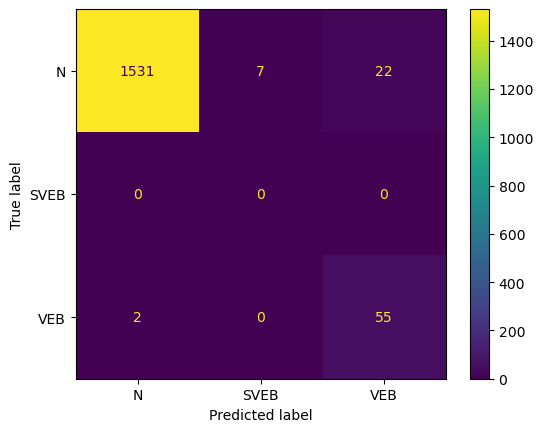

Fold 33:
  Test:  patient=32
              precision    recall  f1-score   support

         0.0       0.98      0.98      0.98      1245
         1.0       0.97      0.92      0.94       589
         2.0       0.00      0.00      0.00         1

    accuracy                           0.96      1835
   macro avg       0.65      0.63      0.64      1835
weighted avg       0.98      0.96      0.97      1835

                   0.0         1.0  2.0  accuracy    macro avg  weighted avg
precision     0.981571    0.967742  0.0  0.961853     0.649771      0.976597
recall        0.983936    0.916808  0.0  0.961853     0.633581      0.961853
f1-score      0.982752    0.941587  0.0  0.961853     0.641446      0.969003
support    1245.000000  589.000000  1.0  0.961853  1835.000000   1835.000000


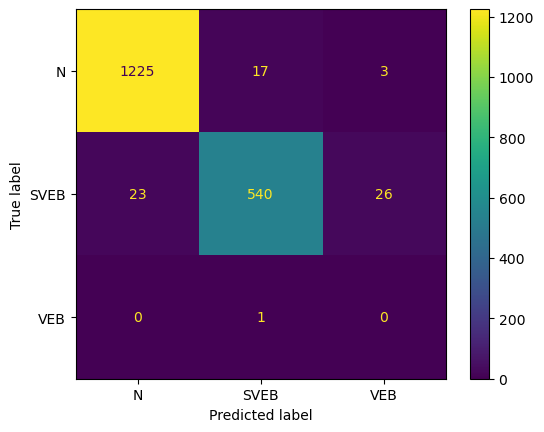

Fold 34:
  Test:  patient=33
              precision    recall  f1-score   support

         0.0       0.98      1.00      0.99      1427
         1.0       0.99      0.91      0.95       536
         2.0       0.00      0.00      0.00         0

    accuracy                           0.97      1963
   macro avg       0.66      0.64      0.65      1963
weighted avg       0.98      0.97      0.98      1963

                   0.0         1.0  2.0  accuracy    macro avg  weighted avg
precision     0.980703    0.991853  0.0  0.973001     0.657519      0.983748
recall        0.997197    0.908582  NaN  0.973001     0.635260      0.973001
f1-score      0.988881    0.948393  NaN  0.973001     0.645758      0.977826
support    1427.000000  536.000000  0.0  0.973001  1963.000000   1963.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

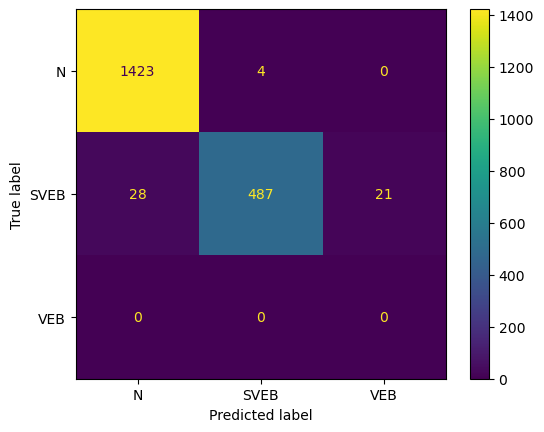

Fold 35:
  Test:  patient=34
              precision    recall  f1-score   support

         0.0       0.97      1.00      0.98      3199
         1.0       0.00      0.00      0.00         0
         2.0       0.96      0.80      0.87       457

    accuracy                           0.97      3656
   macro avg       0.65      0.60      0.62      3656
weighted avg       0.97      0.97      0.97      3656

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.973411  0.0    0.963158   0.97128     0.645523      0.972129
recall        0.995624  NaN    0.800875   0.97128     0.598833      0.971280
f1-score      0.984392  NaN    0.874552   0.97128     0.619648      0.970662
support    3199.000000  0.0  457.000000   0.97128  3656.000000   3656.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

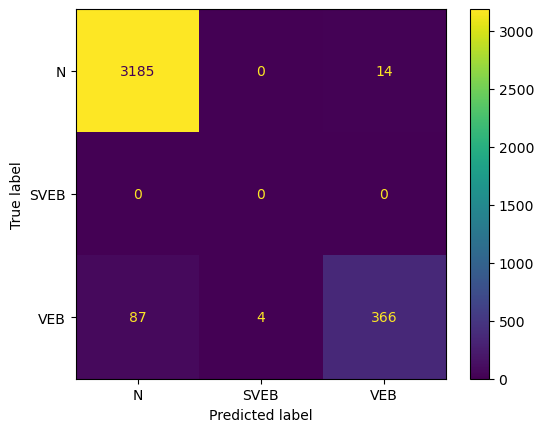

Fold 36:
  Test:  patient=35
              precision    recall  f1-score   support

         0.0       0.99      0.99      0.99      3447
         2.0       0.94      0.91      0.92       450

    accuracy                           0.98      3897
   macro avg       0.96      0.95      0.96      3897
weighted avg       0.98      0.98      0.98      3897

                   0.0         2.0  accuracy    macro avg  weighted avg
precision     0.988157    0.940230  0.982807     0.964194      0.982623
recall        0.992457    0.908889  0.982807     0.950673      0.982807
f1-score      0.990303    0.924294  0.982807     0.957298      0.982680
support    3447.000000  450.000000  0.982807  3897.000000   3897.000000


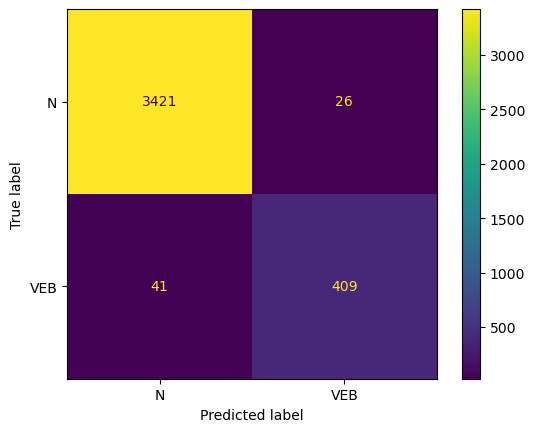

Fold 37:
  Test:  patient=36
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2007
         2.0       1.00      1.00      1.00       452

    accuracy                           1.00      2459
   macro avg       1.00      1.00      1.00      2459
weighted avg       1.00      1.00      1.00      2459

                   0.0         2.0  accuracy    macro avg  weighted avg
precision     1.000000    0.995595  0.999187     0.997797      0.999190
recall        0.999003    1.000000  0.999187     0.999502      0.999187
f1-score      0.999501    0.997792  0.999187     0.998647      0.999187
support    2007.000000  452.000000  0.999187  2459.000000   2459.000000


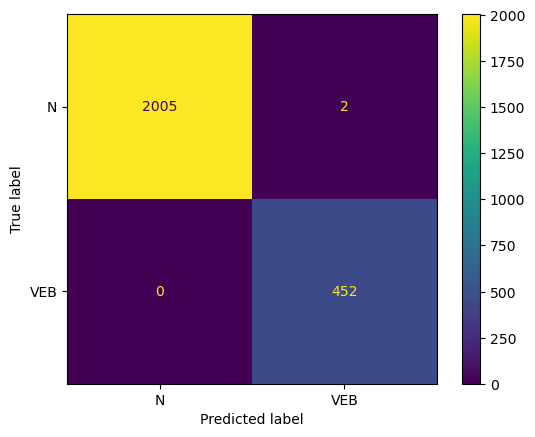

Fold 38:
  Test:  patient=37


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       0.96      0.99      0.98      2153
         1.0       0.00      0.00      0.00         0
         2.0       0.96      0.82      0.88       543

    accuracy                           0.96      2696
   macro avg       0.64      0.60      0.62      2696
weighted avg       0.96      0.96      0.96      2696

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.961279  0.0    0.963043  0.956231     0.641441      0.961634
recall        0.991640  NaN    0.815838  0.956231     0.602493      0.956231
f1-score      0.976223  NaN    0.883350  0.956231     0.619858      0.957518
support    2153.000000  0.0  543.000000  0.956231  2696.000000   2696.000000


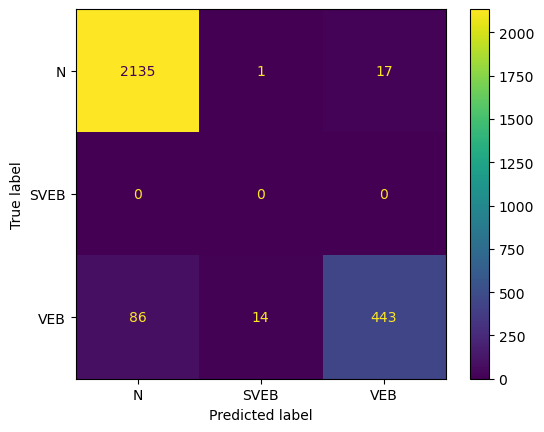

Fold 39:
  Test:  patient=38


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       0.98      1.00      0.99      1460
         1.0       0.00      0.00      0.00         0
         2.0       1.00      0.90      0.95       313

    accuracy                           0.98      1773
   macro avg       0.66      0.63      0.65      1773
weighted avg       0.98      0.98      0.98      1773

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.981183  0.0    1.000000   0.98308     0.660394      0.984505
recall        1.000000  NaN    0.904153   0.98308     0.634718      0.983080
f1-score      0.990502  NaN    0.949664   0.98308     0.646722      0.983293
support    1460.000000  0.0  313.000000   0.98308  1773.000000   1773.000000


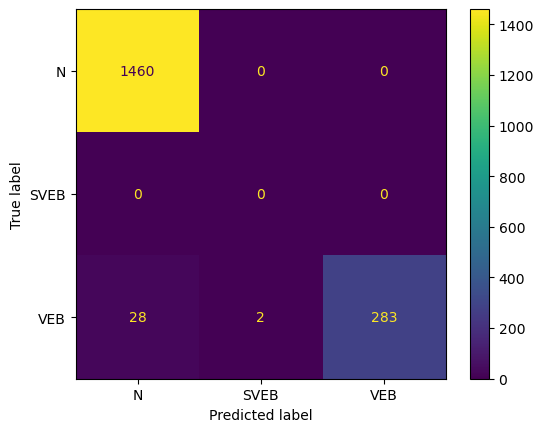

Fold 40:
  Test:  patient=39
              precision    recall  f1-score   support

         0.0       0.99      0.99      0.99      2566
         1.0       0.00      0.00      0.00         6
         2.0       0.79      0.83      0.81        92

    accuracy                           0.98      2664
   macro avg       0.59      0.61      0.60      2664
weighted avg       0.98      0.98      0.98      2664

                   0.0  1.0        2.0  accuracy    macro avg  weighted avg
precision     0.991430  0.0   0.791667  0.983859     0.594365      0.982298
recall        0.991816  0.0   0.826087  0.983859     0.605968      0.983859
f1-score      0.991623  0.0   0.808511  0.983859     0.600044      0.983066
support    2566.000000  6.0  92.000000  0.983859  2664.000000   2664.000000


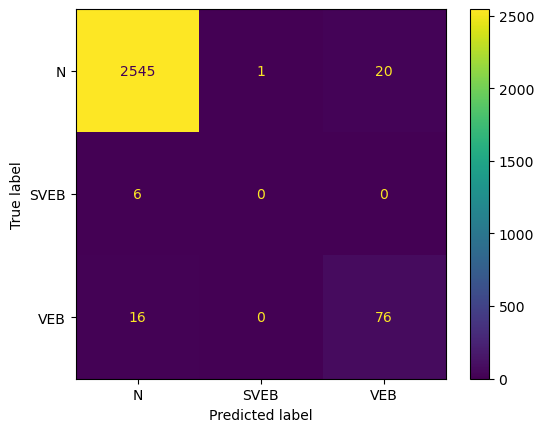

Fold 41:
  Test:  patient=40
              precision    recall  f1-score   support

         0.0       1.00      0.91      0.95      1622
         1.0       0.00      0.00      0.00         5
         2.0       0.01      1.00      0.01         1

    accuracy                           0.91      1628
   macro avg       0.34      0.64      0.32      1628
weighted avg       0.99      0.91      0.95      1628

                   0.0  1.0       2.0  accuracy    macro avg  weighted avg
precision     0.997983  0.0  0.007194  0.912162     0.335059      0.994309
recall        0.914920  0.0  1.000000  0.912162     0.638307      0.912162
f1-score      0.954648  0.0  0.014286  0.912162     0.322978      0.951138
support    1622.000000  5.0  1.000000  0.912162  1628.000000   1628.000000


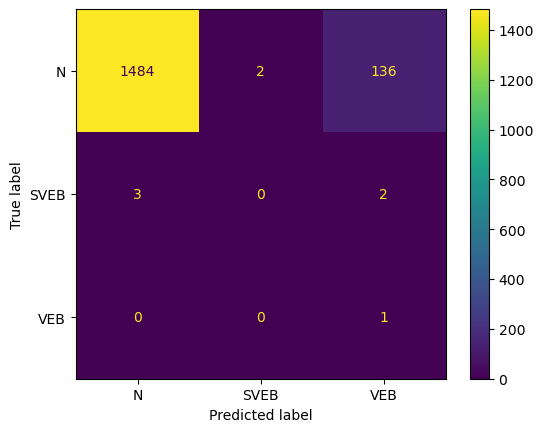

Fold 42:
  Test:  patient=41


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1544
         1.0       0.00      0.00      0.00         0
         2.0       1.00      1.00      1.00      1554

    accuracy                           1.00      3098
   macro avg       0.67      0.67      0.67      3098
weighted avg       1.00      1.00      1.00      3098

                   0.0  1.0          2.0  accuracy    macro avg  weighted avg
precision     0.999352  0.0     0.999356  0.999032     0.666236      0.999354
recall        0.999352  NaN     0.998713  0.999032     0.666022      0.999032
f1-score      0.999352  NaN     0.999034  0.999032     0.666129      0.999193
support    1544.000000  0.0  1554.000000  0.999032  3098.000000   3098.000000


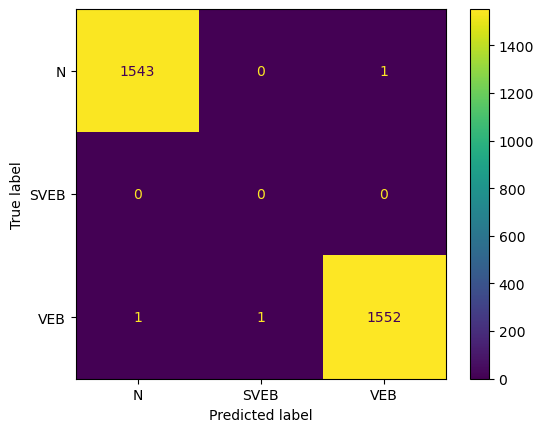

Fold 43:
  Test:  patient=42
              precision    recall  f1-score   support

         0.0       0.99      1.00      0.99      1085
         2.0       1.00      0.99      0.99      1120

    accuracy                           0.99      2205
   macro avg       0.99      0.99      0.99      2205
weighted avg       0.99      0.99      0.99      2205

                   0.0          2.0  accuracy    macro avg  weighted avg
precision     0.991751     0.997307  0.994558     0.994529      0.994573
recall        0.997235     0.991964  0.994558     0.994600      0.994558
f1-score      0.994485     0.994628  0.994558     0.994557      0.994558
support    1085.000000  1120.000000  0.994558  2205.000000   2205.000000


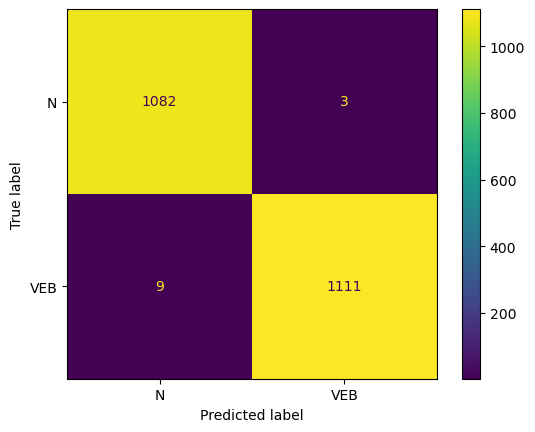

Fold 44:
  Test:  patient=43
              precision    recall  f1-score   support

         0.0       0.99      1.00      1.00      1802
         1.0       0.00      0.00      0.00         8
         2.0       1.00      1.00      1.00       683

    accuracy                           1.00      2493
   macro avg       0.66      0.67      0.66      2493
weighted avg       0.99      1.00      0.99      2493

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.993929  NaN    0.998532  0.995187     0.664154      0.992001
recall        0.999445  0.0    0.995608  0.995187     0.665018      0.995187
f1-score      0.996680  NaN    0.997067  0.995187     0.664582      0.993588
support    1802.000000  8.0  683.000000  0.995187  2493.000000   2493.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\

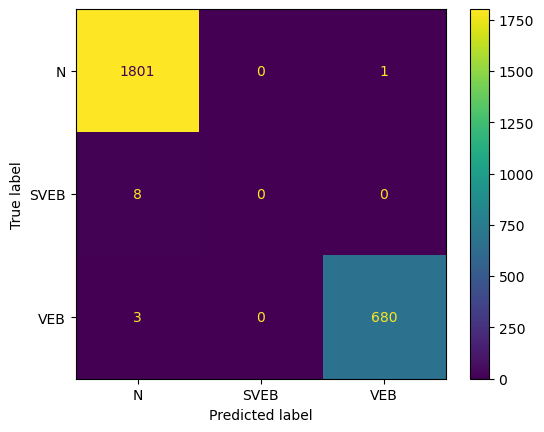

Fold 45:
  Test:  patient=44
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1435
         2.0       1.00      1.00      1.00       491

    accuracy                           1.00      1926
   macro avg       1.00      1.00      1.00      1926
weighted avg       1.00      1.00      1.00      1926

                   0.0         2.0  accuracy    macro avg  weighted avg
precision     0.998608    1.000000  0.998962     0.999304      0.998963
recall        1.000000    0.995927  0.998962     0.997963      0.998962
f1-score      0.999304    0.997959  0.998962     0.998631      0.998961
support    1435.000000  491.000000  0.998962  1926.000000   1926.000000


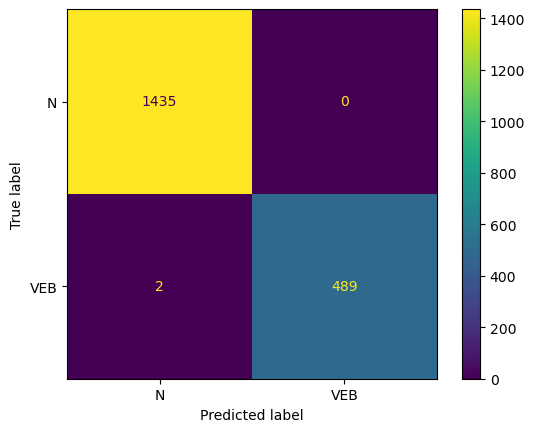

Fold 46:
  Test:  patient=45
              precision    recall  f1-score   support

         0.0       0.99      1.00      0.99      2230
         1.0       0.00      0.00      0.00         1
         2.0       1.00      0.95      0.97       422

    accuracy                           0.99      2653
   macro avg       0.66      0.65      0.66      2653
weighted avg       0.99      0.99      0.99      2653

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.990663  NaN    0.995050  0.991331     0.661904      0.990987
recall        0.999103  0.0    0.952607  0.991331     0.650570      0.991331
f1-score      0.994865  NaN    0.973366  0.991331     0.656077      0.991070
support    2230.000000  1.0  422.000000  0.991331  2653.000000   2653.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\

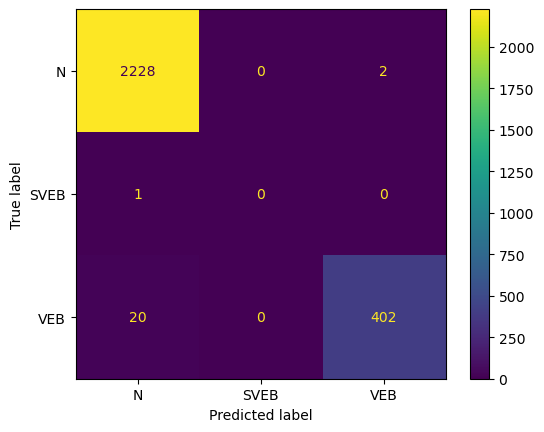

Fold 47:
  Test:  patient=46
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1857
         1.0       0.00      0.00      0.00         1
         2.0       1.00      0.90      0.95        93

    accuracy                           0.99      1951
   macro avg       0.67      0.63      0.65      1951
weighted avg       1.00      0.99      1.00      1951

                   0.0  1.0        2.0  accuracy    macro avg  weighted avg
precision     0.995710  0.0   1.000000  0.994874     0.665237      0.995405
recall        1.000000  0.0   0.903226  0.994874     0.634409      0.994874
f1-score      0.997851  0.0   0.949153  0.994874     0.649001      0.995018
support    1857.000000  1.0  93.000000  0.994874  1951.000000   1951.000000


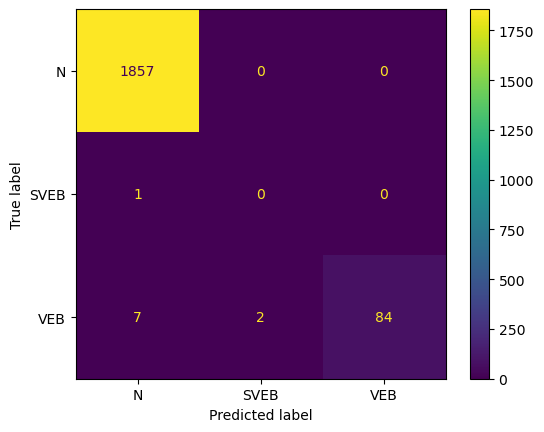

Fold 48:
  Test:  patient=47
              precision    recall  f1-score   support

         0.0       0.99      1.00      0.99      2117
         1.0       0.00      0.00      0.00         2
         2.0       1.00      0.91      0.95       235

    accuracy                           0.99      2354
   macro avg       0.66      0.64      0.65      2354
weighted avg       0.99      0.99      0.99      2354

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.988790  NaN    1.000000  0.989805     0.662930      0.989069
recall        1.000000  0.0    0.906383  0.989805     0.635461      0.989805
f1-score      0.994364  NaN    0.950893  0.989805     0.648419      0.989179
support    2117.000000  2.0  235.000000  0.989805  2354.000000   2354.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\

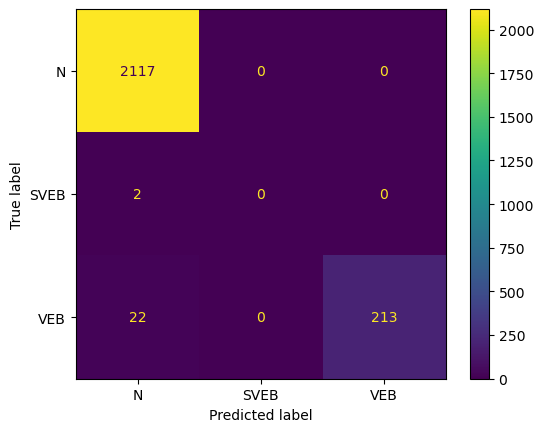

Fold 49:
  Test:  patient=48
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2119
         2.0       1.00      0.93      0.96        27

    accuracy                           1.00      2146
   macro avg       1.00      0.96      0.98      2146
weighted avg       1.00      1.00      1.00      2146

                   0.0        2.0  accuracy    macro avg  weighted avg
precision     0.999057   1.000000  0.999068     0.999529      0.999069
recall        1.000000   0.925926  0.999068     0.962963      0.999068
f1-score      0.999528   0.961538  0.999068     0.980533      0.999050
support    2119.000000  27.000000  0.999068  2146.000000   2146.000000


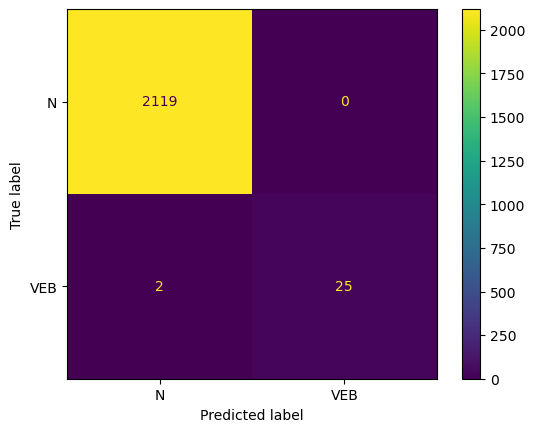

Fold 50:
  Test:  patient=49
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2993
         2.0       0.75      0.75      0.75         4

    accuracy                           1.00      2997
   macro avg       0.87      0.87      0.87      2997
weighted avg       1.00      1.00      1.00      2997

                   0.0   2.0  accuracy    macro avg  weighted avg
precision     0.999666  0.75  0.999333     0.874833      0.999333
recall        0.999666  0.75  0.999333     0.874833      0.999333
f1-score      0.999666  0.75  0.999333     0.874833      0.999333
support    2993.000000  4.00  0.999333  2997.000000   2997.000000


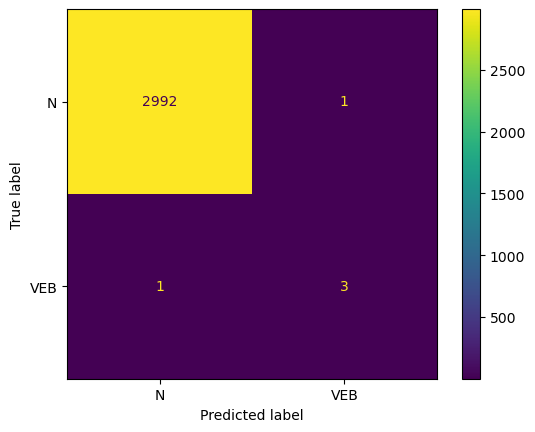

Fold 51:
  Test:  patient=50
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1969
         1.0       0.00      0.00      0.00         3
         2.0       1.00      1.00      1.00       802

    accuracy                           1.00      2774
   macro avg       0.66      0.67      0.67      2774
weighted avg       1.00      1.00      1.00      2774

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.997465  NaN    0.997506  0.997477     0.664990      0.996398
recall        0.998984  0.0    0.997506  0.997477     0.665497      0.997477
f1-score      0.998224  NaN    0.997506  0.997477     0.665243      0.996937
support    1969.000000  3.0  802.000000  0.997477  2774.000000   2774.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\

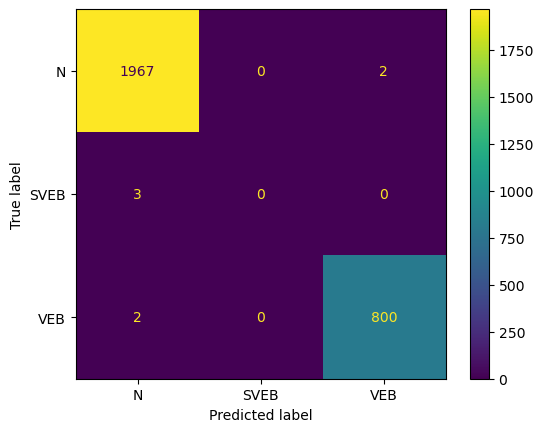

Fold 52:
  Test:  patient=51
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1608
         2.0       1.00      1.00      1.00       137

    accuracy                           1.00      1745
   macro avg       1.00      1.00      1.00      1745
weighted avg       1.00      1.00      1.00      1745

              0.0    2.0  accuracy  macro avg  weighted avg
precision     1.0    1.0       1.0        1.0           1.0
recall        1.0    1.0       1.0        1.0           1.0
f1-score      1.0    1.0       1.0        1.0           1.0
support    1608.0  137.0       1.0     1745.0        1745.0


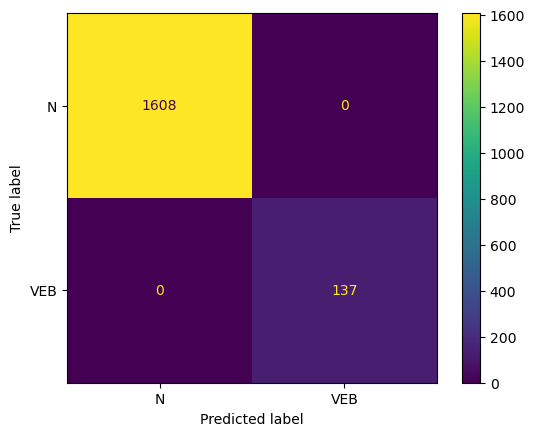

Fold 53:
  Test:  patient=52
              precision    recall  f1-score   support

         0.0       0.99      1.00      0.99      1150
         2.0       1.00      0.99      0.99      1110

    accuracy                           0.99      2260
   macro avg       0.99      0.99      0.99      2260
weighted avg       0.99      0.99      0.99      2260

                   0.0          2.0  accuracy    macro avg  weighted avg
precision     0.987124     1.000000  0.993363     0.993562      0.993448
recall        1.000000     0.986486  0.993363     0.993243      0.993363
f1-score      0.993521     0.993197  0.993363     0.993359      0.993362
support    1150.000000  1110.000000  0.993363  2260.000000   2260.000000


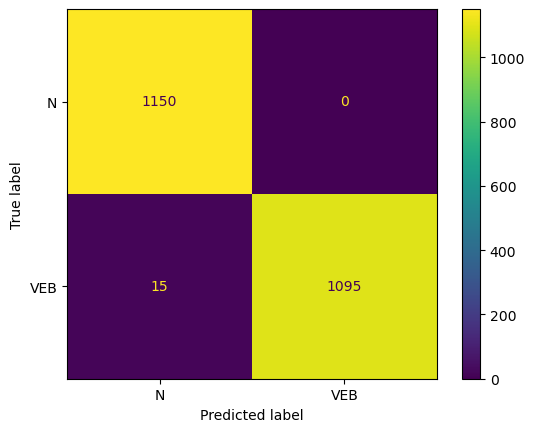

Fold 54:
  Test:  patient=53
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2338
         1.0       1.00      1.00      1.00         1
         2.0       0.88      0.68      0.77        22

    accuracy                           1.00      2361
   macro avg       0.96      0.89      0.92      2361
weighted avg       1.00      1.00      1.00      2361

                   0.0  1.0        2.0  accuracy    macro avg  weighted avg
precision     0.997012  1.0   0.882353  0.996188     0.959788      0.995945
recall        0.999145  1.0   0.681818  0.996188     0.893654      0.996188
f1-score      0.998077  1.0   0.769231  0.996188     0.922436      0.995946
support    2338.000000  1.0  22.000000  0.996188  2361.000000   2361.000000


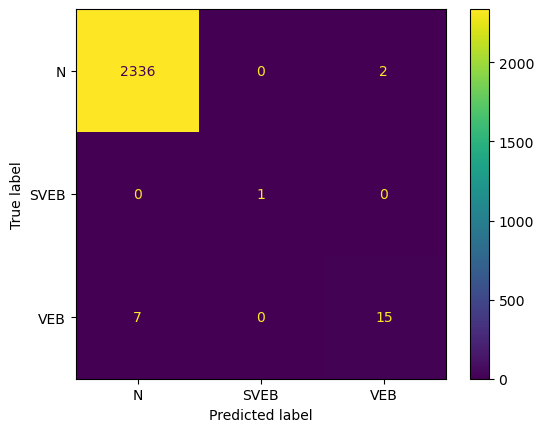

Fold 55:
  Test:  patient=54
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2146
         1.0       1.00      1.00      1.00         1
         2.0       1.00      0.65      0.79        17

    accuracy                           1.00      2164
   macro avg       1.00      0.88      0.93      2164
weighted avg       1.00      1.00      1.00      2164

                   0.0  1.0        2.0  accuracy    macro avg  weighted avg
precision     0.997212  1.0   1.000000  0.997227     0.999071      0.997235
recall        1.000000  1.0   0.647059  0.997227     0.882353      0.997227
f1-score      0.998604  1.0   0.785714  0.997227     0.928106      0.996932
support    2146.000000  1.0  17.000000  0.997227  2164.000000   2164.000000


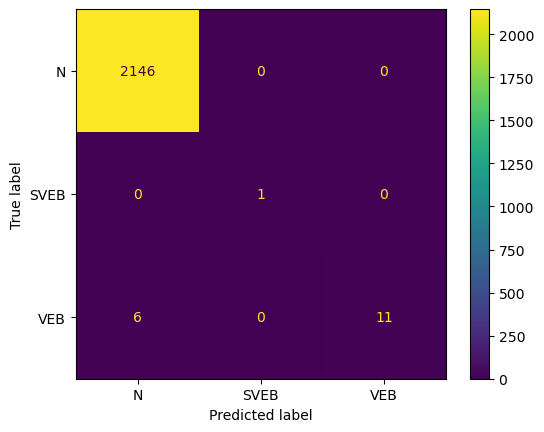

Fold 56:
  Test:  patient=55


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\

              precision    recall  f1-score   support

         0.0       0.98      1.00      0.99      1670
         1.0       0.00      0.00      0.00        26
         2.0       1.00      0.71      0.83         7

    accuracy                           0.98      1703
   macro avg       0.66      0.57      0.61      1703
weighted avg       0.97      0.98      0.98      1703

                   0.0   1.0       2.0  accuracy    macro avg  weighted avg
precision     0.983510   NaN  1.000000  0.983558     0.661170      0.968562
recall        1.000000   0.0  0.714286  0.983558     0.571429      0.983558
f1-score      0.991686   NaN  0.833333  0.983558     0.608340      0.975895
support    1670.000000  26.0  7.000000  0.983558  1703.000000   1703.000000


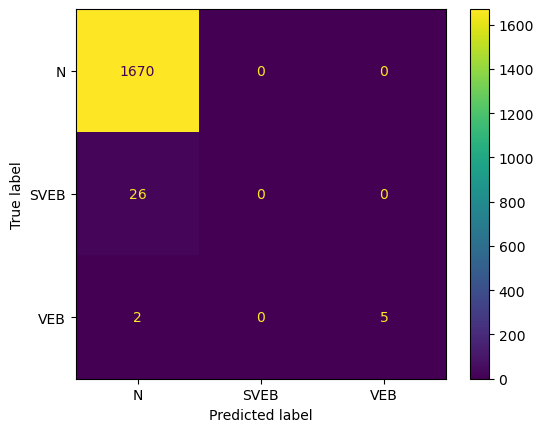

Fold 57:
  Test:  patient=56
              precision    recall  f1-score   support

         0.0       0.99      1.00      1.00      2840
         1.0       0.00      0.00      0.00         3
         2.0       0.69      0.43      0.53        21

    accuracy                           0.99      2864
   macro avg       0.56      0.48      0.51      2864
weighted avg       0.99      0.99      0.99      2864

                   0.0  1.0        2.0  accuracy    macro avg  weighted avg
precision     0.994739  NaN   0.692308  0.993366     0.562349      0.991479
recall        0.998592  0.0   0.428571  0.993366     0.475721      0.993366
f1-score      0.996661  NaN   0.529412  0.993366     0.508691      0.992191
support    2840.000000  3.0  21.000000  0.993366  2864.000000   2864.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\

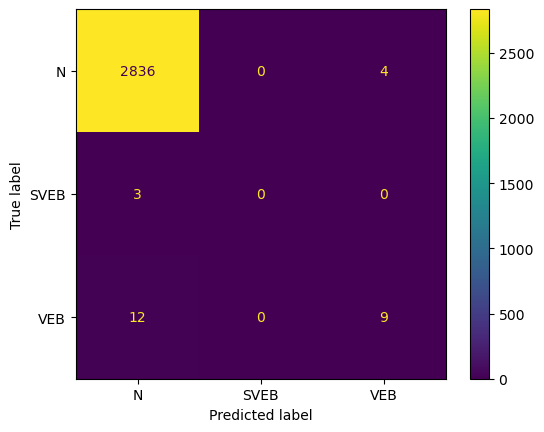

Fold 58:
  Test:  patient=57
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2311
         2.0       0.79      0.92      0.85        12

    accuracy                           1.00      2323
   macro avg       0.89      0.96      0.92      2323
weighted avg       1.00      1.00      1.00      2323

                   0.0        2.0  accuracy    macro avg  weighted avg
precision     0.999567   0.785714  0.998278     0.892641      0.998462
recall        0.998702   0.916667  0.998278     0.957684      0.998278
f1-score      0.999134   0.846154  0.998278     0.922644      0.998344
support    2311.000000  12.000000  0.998278  2323.000000   2323.000000


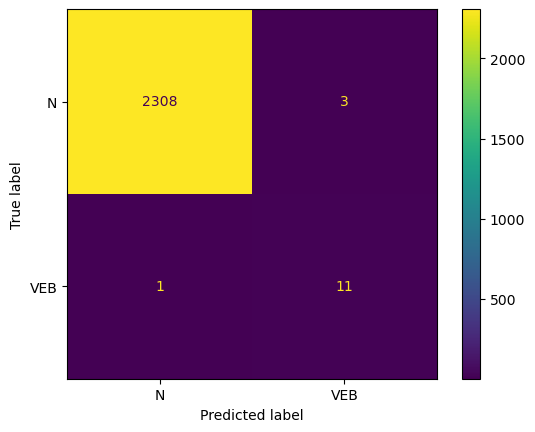

Fold 59:
  Test:  patient=58
              precision    recall  f1-score   support

         0.0       0.97      1.00      0.99      2065
         2.0       0.92      0.28      0.43        81

    accuracy                           0.97      2146
   macro avg       0.95      0.64      0.71      2146
weighted avg       0.97      0.97      0.96      2146

                   0.0        2.0  accuracy    macro avg  weighted avg
precision     0.972654   0.920000  0.972041     0.946327      0.970667
recall        0.999031   0.283951  0.972041     0.641491      0.972041
f1-score      0.985667   0.433962  0.972041     0.709814      0.964843
support    2065.000000  81.000000  0.972041  2146.000000   2146.000000


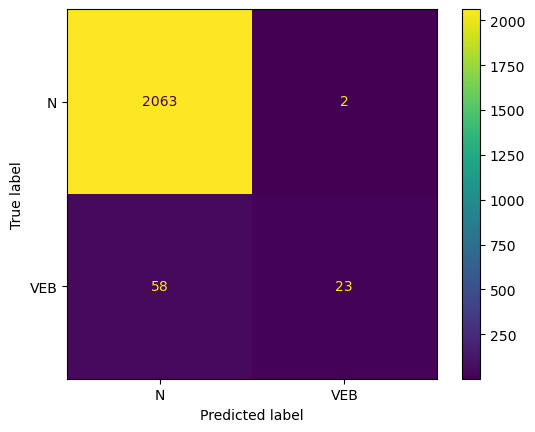

Fold 60:
  Test:  patient=59
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2473
         2.0       0.00      0.00      0.00         0

    accuracy                           1.00      2473
   macro avg       0.50      0.50      0.50      2473
weighted avg       1.00      1.00      1.00      2473

                   0.0  2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.0  0.999191     0.500000      1.000000
recall        0.999191  NaN  0.999191     0.499596      0.999191
f1-score      0.999595  NaN  0.999191     0.499798      0.999595
support    2473.000000  0.0  0.999191  2473.000000   2473.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

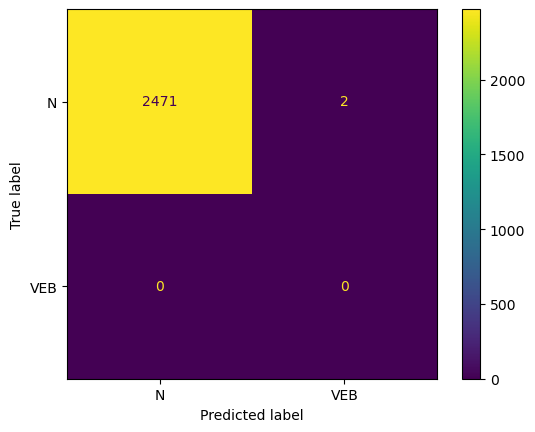

Fold 61:
  Test:  patient=60
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1451
         1.0       0.00      0.00      0.00         1

    accuracy                           1.00      1452
   macro avg       0.50      0.50      0.50      1452
weighted avg       1.00      1.00      1.00      1452

                   0.0  1.0  accuracy    macro avg  weighted avg
precision     0.999311  NaN  0.999311     0.499656      0.998623
recall        1.000000  0.0  0.999311     0.500000      0.999311
f1-score      0.999656  NaN  0.999311     0.499828      0.998967
support    1451.000000  1.0  0.999311  1452.000000   1452.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\

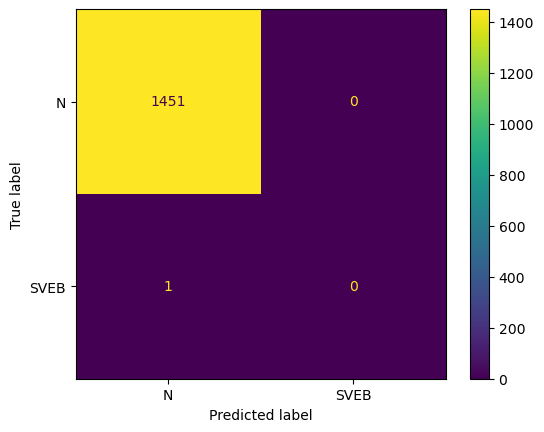

Fold 62:
  Test:  patient=61
              precision    recall  f1-score   support

         0.0       0.84      1.00      0.91      1451
         1.0       0.00      0.00      0.00         9
         2.0       1.00      0.66      0.79       795

    accuracy                           0.88      2255
   macro avg       0.61      0.55      0.57      2255
weighted avg       0.89      0.88      0.87      2255

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.838542  NaN    0.996205  0.875388     0.611582      0.890779
recall        0.998622  0.0    0.660377  0.875388     0.553000      0.875388
f1-score      0.911607  NaN    0.794251  0.875388     0.568620      0.866595
support    1451.000000  9.0  795.000000  0.875388  2255.000000   2255.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\

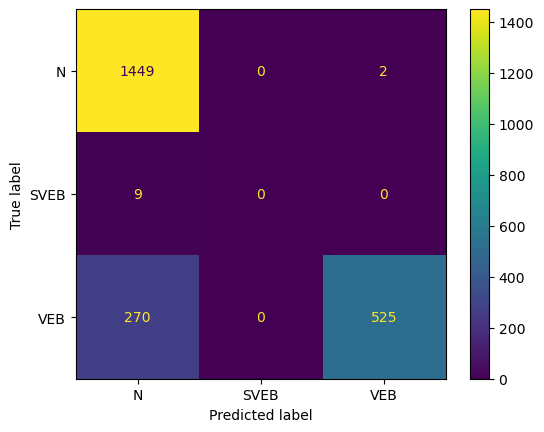

Fold 63:
  Test:  patient=62
              precision    recall  f1-score   support

         0.0       0.97      1.00      0.99      1845
         1.0       0.00      0.00      0.00         1
         2.0       1.00      0.64      0.78       138

    accuracy                           0.97      1984
   macro avg       0.66      0.55      0.59      1984
weighted avg       0.98      0.97      0.97      1984

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.974643  0.0    1.000000  0.974294     0.658214      0.975916
recall        1.000000  0.0    0.637681  0.974294     0.545894      0.974294
f1-score      0.987159  0.0    0.778761  0.974294     0.588640      0.972166
support    1845.000000  1.0  138.000000  0.974294  1984.000000   1984.000000


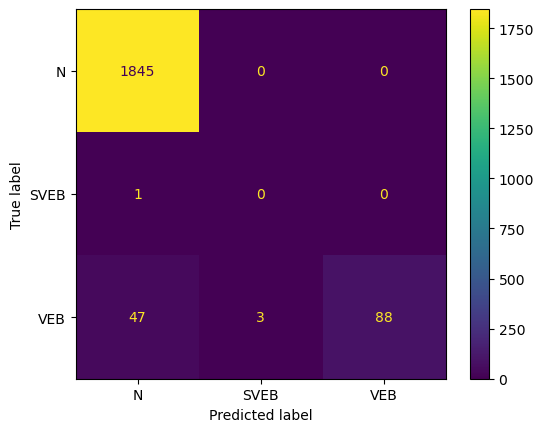

Fold 64:
  Test:  patient=63
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1885
         2.0       0.69      0.78      0.73        23

    accuracy                           0.99      1908
   macro avg       0.84      0.89      0.87      1908
weighted avg       0.99      0.99      0.99      1908

                   0.0        2.0  accuracy    macro avg  weighted avg
precision     0.997343   0.692308  0.993187     0.844825      0.993666
recall        0.995756   0.782609  0.993187     0.889182      0.993187
f1-score      0.996549   0.734694  0.993187     0.865621      0.993392
support    1885.000000  23.000000  0.993187  1908.000000   1908.000000


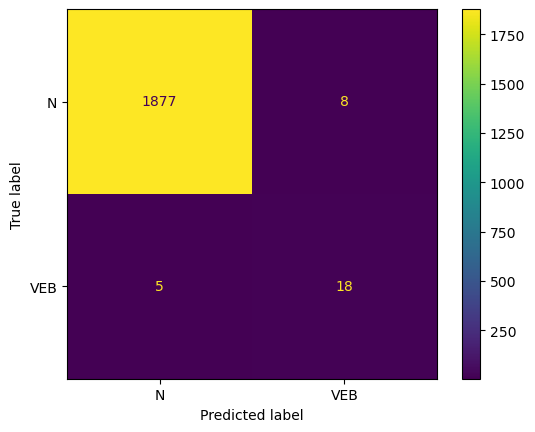

Fold 65:
  Test:  patient=64
              precision    recall  f1-score   support

         0.0       0.98      1.00      0.99      2271
         1.0       0.00      0.00      0.00         5
         2.0       0.99      0.88      0.93       382

    accuracy                           0.98      2658
   macro avg       0.66      0.63      0.64      2658
weighted avg       0.98      0.98      0.98      2658

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.978439  0.0    0.994065  0.979684     0.657501      0.978844
recall        0.999119  0.0    0.876963  0.979684     0.625361      0.979684
f1-score      0.988671  0.0    0.931850  0.979684     0.640174      0.978645
support    2271.000000  5.0  382.000000  0.979684  2658.000000   2658.000000


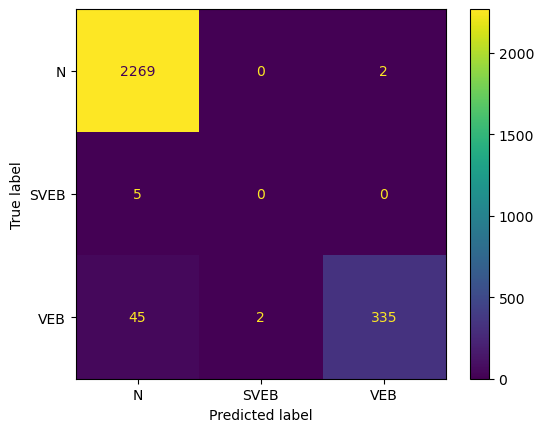

Fold 66:
  Test:  patient=65
              precision    recall  f1-score   support

         0.0       1.00      0.99      1.00      2137
         1.0       0.00      0.00      0.00         1
         2.0       0.93      0.98      0.95       200

    accuracy                           0.99      2338
   macro avg       0.64      0.66      0.65      2338
weighted avg       0.99      0.99      0.99      2338

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.997649  NaN    0.928910  0.991446     0.642186      0.991342
recall        0.992981  0.0    0.980000  0.991446     0.657660      0.991446
f1-score      0.995310  NaN    0.953771  0.991446     0.649694      0.991331
support    2137.000000  1.0  200.000000  0.991446  2338.000000   2338.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\

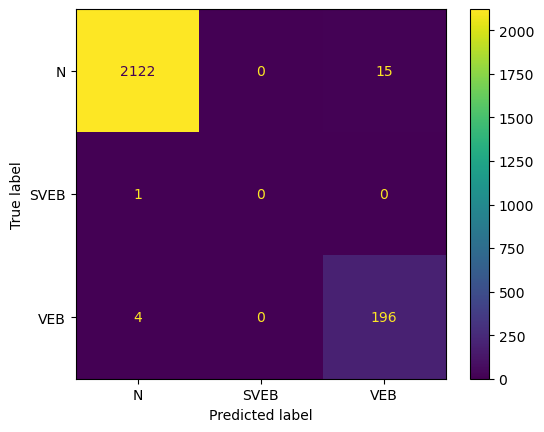

Fold 67:
  Test:  patient=66
              precision    recall  f1-score   support

         0.0       0.99      1.00      0.99      2436
         1.0       0.00      0.00      0.00         5
         2.0       0.99      0.95      0.97       531

    accuracy                           0.99      2972
   macro avg       0.66      0.65      0.65      2972
weighted avg       0.99      0.99      0.99      2972

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.991031  0.0    0.990138  0.986878     0.660390      0.989205
recall        0.997947  0.0    0.945386  0.986878     0.647778      0.986878
f1-score      0.994477  0.0    0.967245  0.986878     0.653907      0.987939
support    2436.000000  5.0  531.000000  0.986878  2972.000000   2972.000000


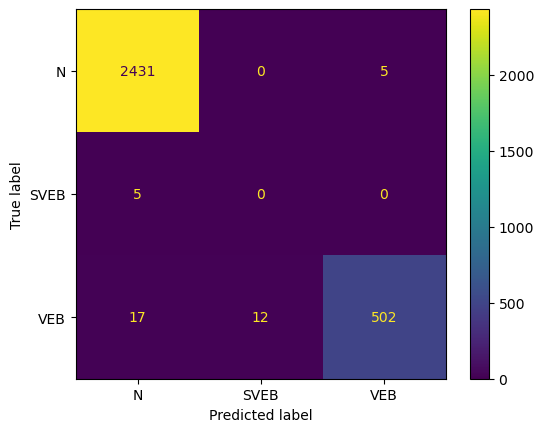

Fold 68:
  Test:  patient=67
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2480
         1.0       0.00      0.00      0.00         2
         2.0       0.99      0.99      0.99       161

    accuracy                           1.00      2643
   macro avg       0.66      0.66      0.66      2643
weighted avg       1.00      1.00      1.00      2643

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.998389  NaN    0.993750  0.998108     0.664046      0.997351
recall        0.999597  0.0    0.987578  0.998108     0.662391      0.998108
f1-score      0.998993  NaN    0.990654  0.998108     0.663216      0.997729
support    2480.000000  2.0  161.000000  0.998108  2643.000000   2643.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\

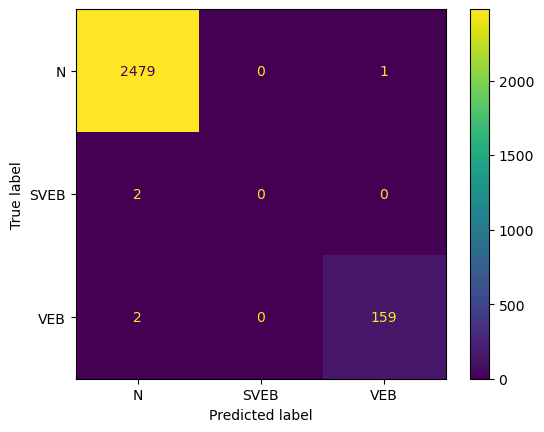

Fold 69:
  Test:  patient=68
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1998
         1.0       0.00      0.00      0.00         1
         2.0       1.00      0.99      0.99       167

    accuracy                           1.00      2166
   macro avg       0.67      0.66      0.66      2166
weighted avg       1.00      1.00      1.00      2166

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.998501  NaN    1.000000  0.998615     0.666167      0.998155
recall        1.000000  0.0    0.988024  0.998615     0.662675      0.998615
f1-score      0.999250  NaN    0.993976  0.998615     0.664409      0.998382
support    1998.000000  1.0  167.000000  0.998615  2166.000000   2166.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\

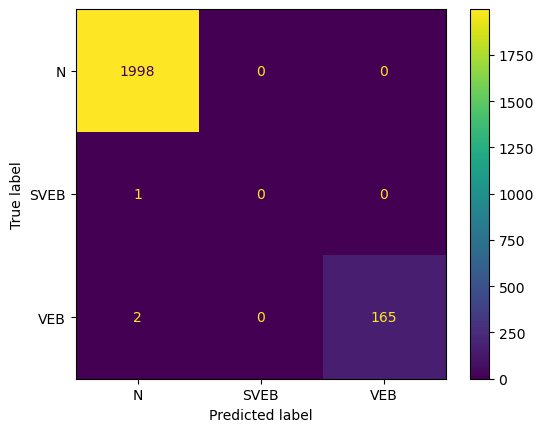

Fold 70:
  Test:  patient=69
              precision    recall  f1-score   support

         0.0       0.91      0.77      0.83      1539
         1.0       0.00      0.00      0.00       126
         2.0       0.00      0.00      0.00         0

    accuracy                           0.71      1665
   macro avg       0.30      0.26      0.28      1665
weighted avg       0.84      0.71      0.77      1665

                   0.0    1.0  2.0  accuracy    macro avg  weighted avg
precision     0.905271    NaN  0.0  0.711712     0.301757      0.836764
recall        0.769981    0.0  NaN  0.711712     0.256660      0.711712
f1-score      0.832163    NaN  NaN  0.711712     0.277388      0.769188
support    1539.000000  126.0  0.0  0.711712  1665.000000   1665.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMM

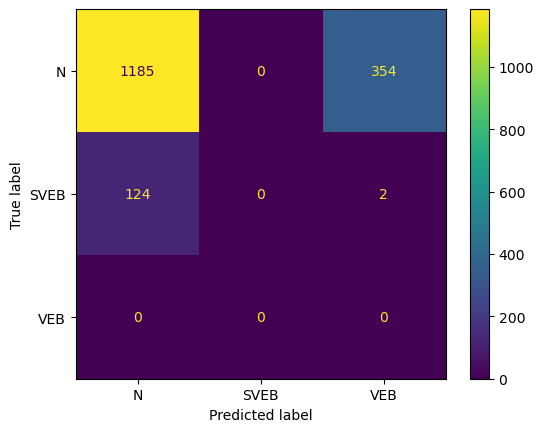

Fold 71:
  Test:  patient=70


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       1.00      0.89      0.94      1634
         1.0       0.17      0.91      0.29        35
         2.0       0.00      0.00      0.00         0

    accuracy                           0.89      1669
   macro avg       0.39      0.60      0.41      1669
weighted avg       0.98      0.89      0.93      1669

                   0.0        1.0  2.0  accuracy    macro avg  weighted avg
precision     0.998622   0.173913  0.0  0.887358     0.390845      0.981327
recall        0.886781   0.914286  NaN  0.887358     0.600356      0.887358
f1-score      0.939384   0.292237  NaN  0.887358     0.410541      0.925813
support    1634.000000  35.000000  0.0  0.887358  1669.000000   1669.000000


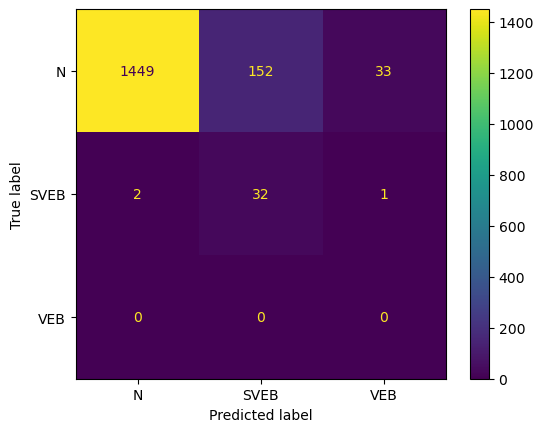

Fold 72:
  Test:  patient=71
              precision    recall  f1-score   support

         0.0       0.99      0.97      0.98      1874
         1.0       0.10      0.62      0.17         8
         2.0       0.96      0.96      0.96       386

    accuracy                           0.97      2268
   macro avg       0.68      0.85      0.70      2268
weighted avg       0.98      0.97      0.97      2268

                   0.0       1.0         2.0  accuracy    macro avg  \
precision     0.991262  0.100000    0.961240   0.96649     0.684167   
recall        0.968517  0.625000    0.963731   0.96649     0.852416   
f1-score      0.979757  0.172414    0.962484   0.96649     0.704885   
support    1874.000000  8.000000  386.000000   0.96649  2268.000000   

           weighted avg  
precision      0.983008  
recall         0.966490  
f1-score       0.973970  
support     2268.000000  


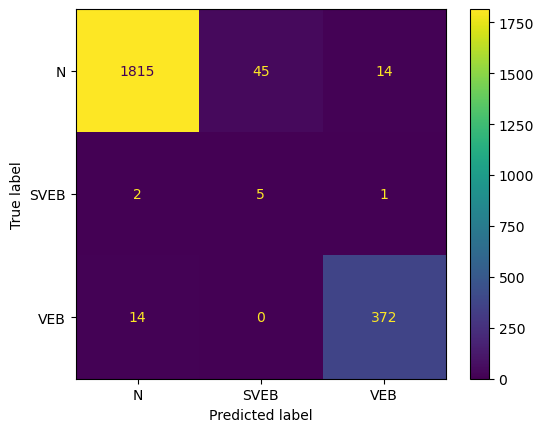

Fold 73:
  Test:  patient=72
              precision    recall  f1-score   support

         0.0       0.98      1.00      0.99      1888
         1.0       0.00      0.00      0.00        32
         2.0       0.92      0.93      0.92        70

    accuracy                           0.98      1990
   macro avg       0.63      0.64      0.64      1990
weighted avg       0.97      0.98      0.97      1990

                   0.0   1.0        2.0  accuracy    macro avg  weighted avg
precision     0.983325   NaN   0.915493  0.980905     0.632939      0.965126
recall        0.999470   0.0   0.928571  0.980905     0.642681      0.980905
f1-score      0.991332   NaN   0.921986  0.980905     0.637773      0.972951
support    1888.000000  32.0  70.000000  0.980905  1990.000000   1990.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\

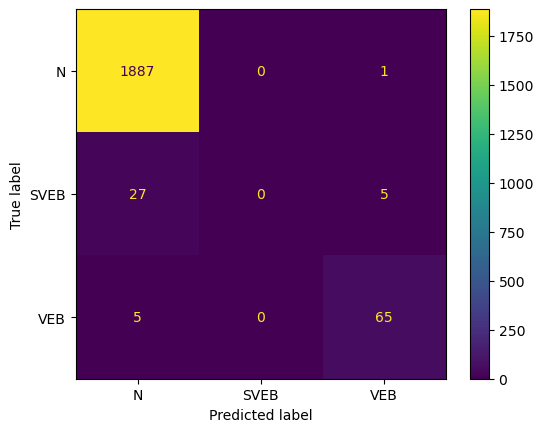

Fold 74:
  Test:  patient=73
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2081
         2.0       1.00      0.99      0.99       274

    accuracy                           1.00      2355
   macro avg       1.00      0.99      1.00      2355
weighted avg       1.00      1.00      1.00      2355

                   0.0         2.0  accuracy    macro avg  weighted avg
precision     0.998560    0.996324  0.998301     0.997442      0.998300
recall        0.999519    0.989051  0.998301     0.994285      0.998301
f1-score      0.999039    0.992674  0.998301     0.995857      0.998299
support    2081.000000  274.000000  0.998301  2355.000000   2355.000000


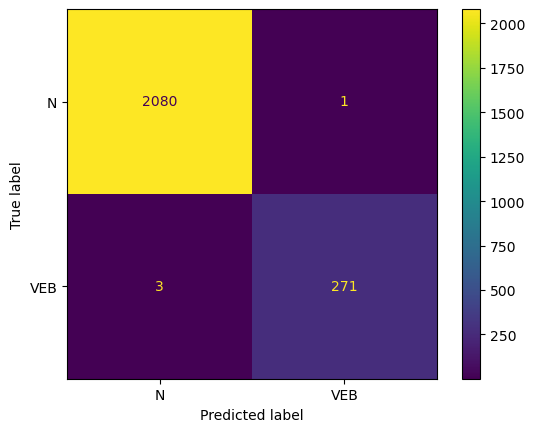

Fold 75:
  Test:  patient=74
              precision    recall  f1-score   support

         0.0       0.96      1.00      0.98      1482
         2.0       1.00      0.91      0.95       612

    accuracy                           0.97      2094
   macro avg       0.98      0.96      0.97      2094
weighted avg       0.97      0.97      0.97      2094

                   0.0         2.0  accuracy    macro avg  weighted avg
precision     0.964216    1.000000  0.973734     0.982108      0.974674
recall        1.000000    0.910131  0.973734     0.955065      0.973734
f1-score      0.981782    0.952951  0.973734     0.967367      0.973356
support    1482.000000  612.000000  0.973734  2094.000000   2094.000000


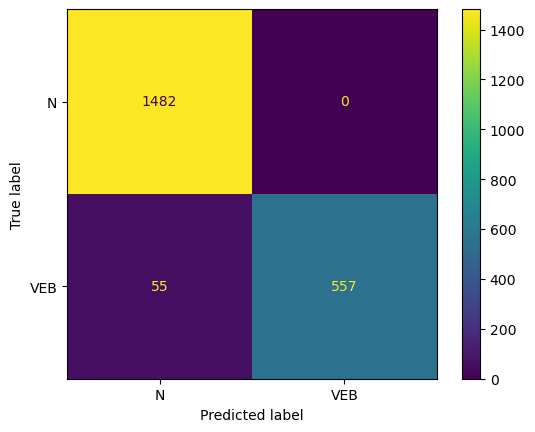

C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\numpy\core\fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\numpy\core\_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [10]:
from sklearn.model_selection import LeaveOneGroupOut
import time
X=df_cardio.drop('type',axis=1)
y=df_cardio['type']
groups=df_cardio['patient']
skf = LeaveOneGroupOut()


start_time=time.time()
df_normal, acc_normal,confusion_matrix_final,list_f1score = cross_valid(pipe_normal, skf, X, y,groups)
end_time=time.time()

In [11]:
df_normal

,0.0,2.0,macro avg,weighted avg,1.0
f1-score,0.985236,0.785343,0.711076,0.976238,0.440093
precision,0.982552,0.793664,0.737237,0.980995,0.321034
recall,0.988821,0.782824,0.713065,0.974681,0.235826
support,2047.280000,270.270270,2340.053333,2340.053333,39.959184


In [12]:
print("Time"+str(end_time-start_time))

Time62.37139320373535


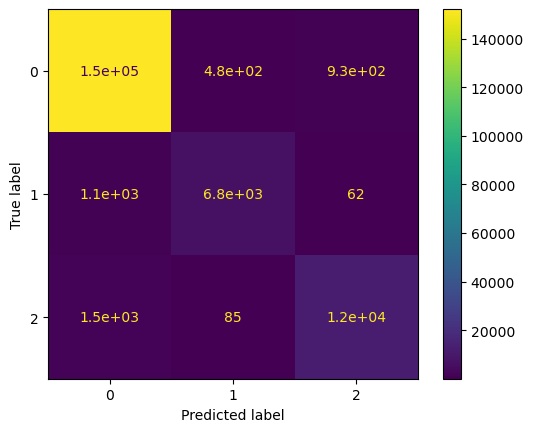

In [14]:
ConfusionMatrixDisplay(confusion_matrix_final).plot()

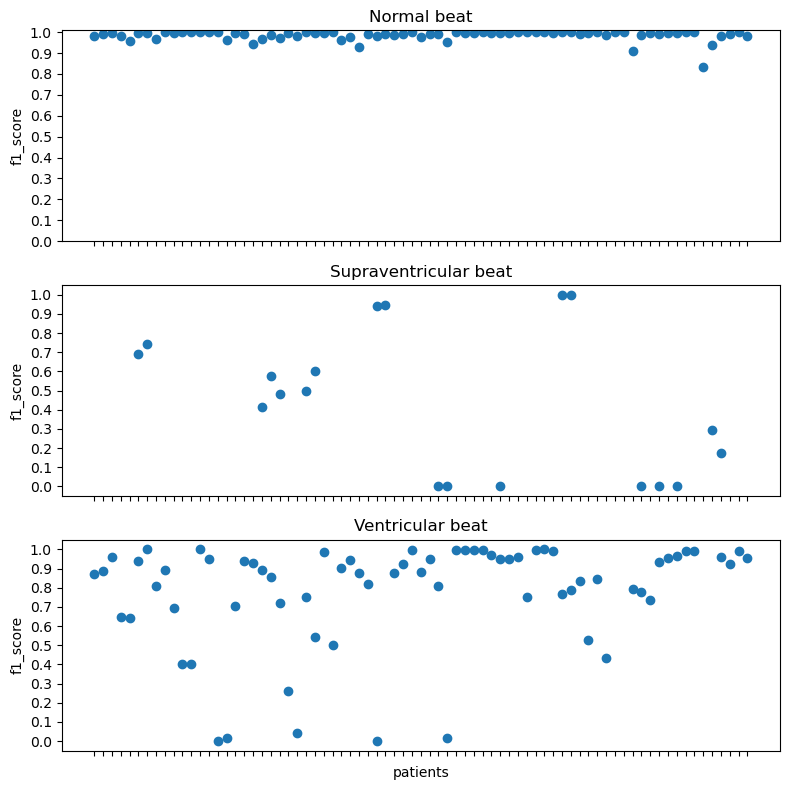

In [15]:
print_plot(list_f1score)

In [16]:
pipe_smote = Pipeline([
        ('sampling', SMOTE(random_state = 123)),
        ('classification', KNeighborsClassifier(n_neighbors=10))
    ])
pipe_smote

Pipeline(steps=[('sampling', SMOTE(random_state=123)),
                ('classification', KNeighborsClassifier(n_neighbors=10))])

Fold 1:
  Test:  patient=0
              precision    recall  f1-score   support

         0.0       0.99      0.97      0.98      2411
         1.0       0.00      0.00      0.00         0
         2.0       0.82      0.95      0.88       344

    accuracy                           0.97      2755
   macro avg       0.60      0.64      0.62      2755
weighted avg       0.97      0.97      0.97      2755

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.994040  0.0    0.815920  0.966606     0.603320      0.971799
recall        0.968478  NaN    0.953488  0.966606     0.640655      0.966606
f1-score      0.981092  NaN    0.879357  0.966606     0.620150      0.968389
support    2411.000000  0.0  344.000000  0.966606  2755.000000   2755.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

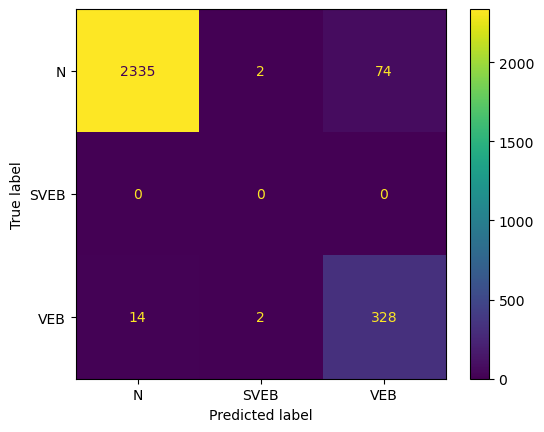

Fold 2:
  Test:  patient=1
              precision    recall  f1-score   support

         0.0       0.99      0.98      0.98      2443
         1.0       0.00      0.00      0.00         0
         2.0       0.79      0.93      0.86       229

    accuracy                           0.97      2672
   macro avg       0.60      0.64      0.61      2672
weighted avg       0.98      0.97      0.97      2672

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.993747  0.0    0.792593  0.972305     0.595447      0.976508
recall        0.975849  NaN    0.934498  0.972305     0.636782      0.972305
f1-score      0.984717  NaN    0.857715  0.972305     0.614144      0.973833
support    2443.000000  0.0  229.000000  0.972305  2672.000000   2672.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

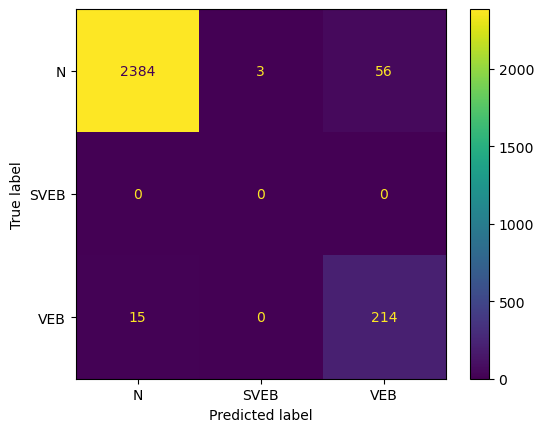

Fold 3:
  Test:  patient=2
              precision    recall  f1-score   support

         0.0       1.00      0.94      0.97      2323
         1.0       0.00      0.00      0.00         2
         2.0       0.86      0.96      0.91       125

    accuracy                           0.94      2450
   macro avg       0.62      0.63      0.63      2450
weighted avg       0.99      0.94      0.97      2450

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.997269  0.0    0.857143  0.943265     0.618137      0.989306
recall        0.943177  0.0    0.960000  0.943265     0.634392      0.943265
f1-score      0.969469  0.0    0.905660  0.943265     0.625043      0.965422
support    2323.000000  2.0  125.000000  0.943265  2450.000000   2450.000000


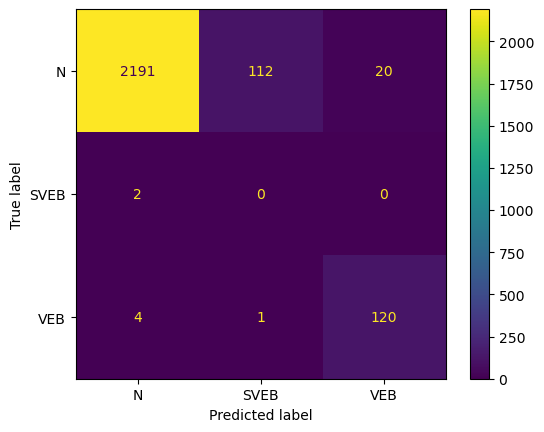

Fold 4:
  Test:  patient=3
              precision    recall  f1-score   support

         0.0       0.98      0.94      0.96      2268
         1.0       0.00      0.00      0.00        16
         2.0       0.41      0.73      0.52       121

    accuracy                           0.92      2405
   macro avg       0.46      0.56      0.49      2405
weighted avg       0.94      0.92      0.93      2405

                   0.0   1.0         2.0  accuracy    macro avg  weighted avg
precision     0.978401   0.0    0.409302   0.92183     0.462568      0.943259
recall        0.938713   0.0    0.727273   0.92183     0.555328      0.921830
f1-score      0.958146   0.0    0.523810   0.92183     0.493985      0.929919
support    2268.000000  16.0  121.000000   0.92183  2405.000000   2405.000000


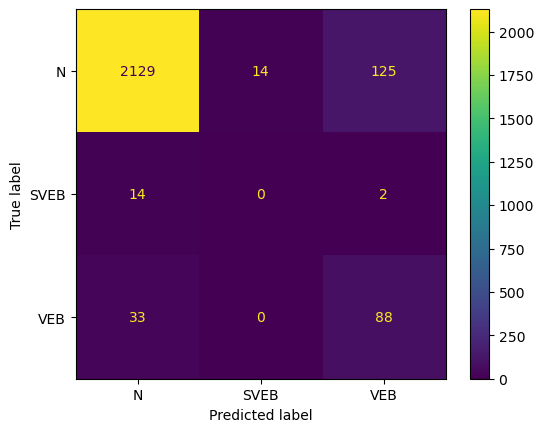

Fold 5:
  Test:  patient=4
              precision    recall  f1-score   support

         0.0       0.95      1.00      0.98      1518
         2.0       1.00      0.70      0.83       247

    accuracy                           0.96      1765
   macro avg       0.98      0.85      0.90      1765
weighted avg       0.96      0.96      0.96      1765

                   0.0         2.0  accuracy    macro avg  weighted avg
precision     0.954117    1.000000   0.95864     0.977058      0.960538
recall        1.000000    0.704453   0.95864     0.852227      0.958640
f1-score      0.976520    0.826603   0.95864     0.901562      0.955540
support    1518.000000  247.000000   0.95864  1765.000000   1765.000000


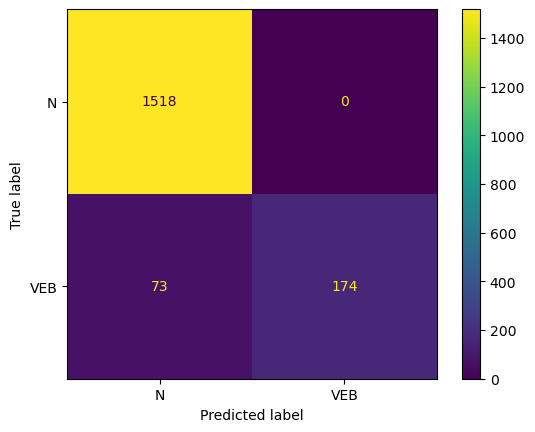

Fold 6:
  Test:  patient=5
              precision    recall  f1-score   support

         0.0       1.00      0.99      0.99      2434
         1.0       0.59      0.92      0.72        48
         2.0       1.00      0.89      0.94         9

    accuracy                           0.99      2491
   macro avg       0.86      0.93      0.89      2491
weighted avg       0.99      0.99      0.99      2491

                   0.0        1.0       2.0  accuracy    macro avg  \
precision     0.998340   0.594595  1.000000  0.986351     0.864311   
recall        0.988085   0.916667  0.888889  0.986351     0.931214   
f1-score      0.993186   0.721311  0.941176  0.986351     0.885225   
support    2434.000000  48.000000  9.000000  0.986351  2491.000000   

           weighted avg  
precision      0.990566  
recall         0.986351  
f1-score       0.987759  
support     2491.000000  


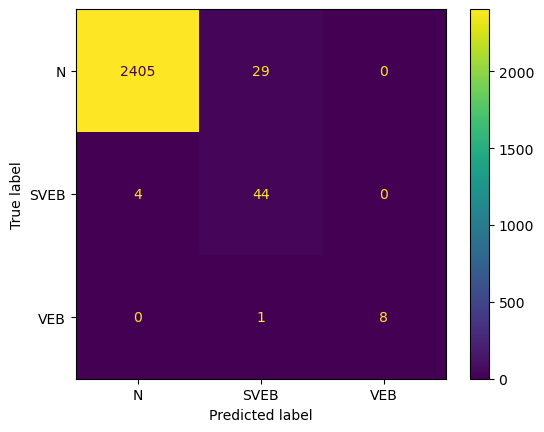

Fold 7:
  Test:  patient=6
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2638
         1.0       0.91      0.80      0.85        65
         2.0       0.20      1.00      0.33         1

    accuracy                           0.99      2704
   macro avg       0.70      0.93      0.73      2704
weighted avg       0.99      0.99      0.99      2704

                   0.0        1.0       2.0  accuracy    macro avg  \
precision     0.995079   0.912281  0.200000  0.991864     0.702453   
recall        0.996588   0.800000  1.000000  0.991864     0.932196   
f1-score      0.995833   0.852459  0.333333  0.991864     0.727209   
support    2638.000000  65.000000  1.000000  0.991864  2704.000000   

           weighted avg  
precision      0.992795  
recall         0.991864  
f1-score       0.992142  
support     2704.000000  


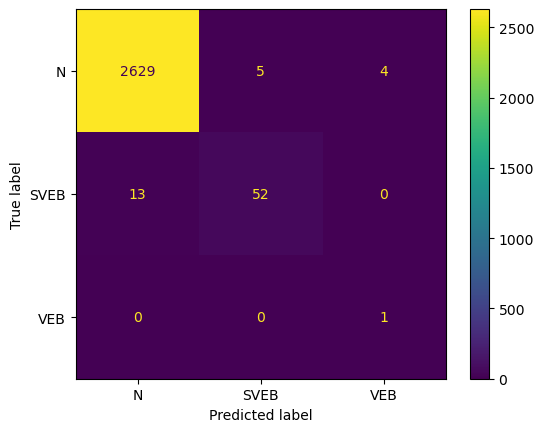

Fold 8:
  Test:  patient=7
              precision    recall  f1-score   support

         0.0       0.98      0.97      0.98      1776
         1.0       0.00      0.00      0.00         2
         2.0       0.96      0.92      0.94       350

    accuracy                           0.96      2128
   macro avg       0.65      0.63      0.64      2128
weighted avg       0.98      0.96      0.97      2128

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.983485  0.0    0.958209  0.962406     0.647231      0.978404
recall        0.972410  0.0    0.917143  0.962406     0.629851      0.962406
f1-score      0.977916  0.0    0.937226  0.962406     0.638381      0.970305
support    1776.000000  2.0  350.000000  0.962406  2128.000000   2128.000000


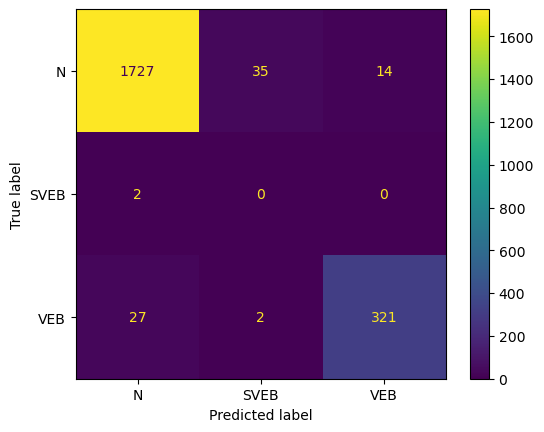

Fold 9:
  Test:  patient=8


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2946
         1.0       0.00      0.00      0.00         0
         2.0       0.86      0.90      0.88        41

    accuracy                           1.00      2987
   macro avg       0.62      0.63      0.63      2987
weighted avg       1.00      1.00      1.00      2987

                   0.0  1.0        2.0  accuracy    macro avg  weighted avg
precision     0.998640  0.0   0.860465  0.995983     0.619702      0.996744
recall        0.997284  NaN   0.902439  0.995983     0.633241      0.995983
f1-score      0.997962  NaN   0.880952  0.995983     0.626305      0.996356
support    2946.000000  0.0  41.000000  0.995983  2987.000000   2987.000000


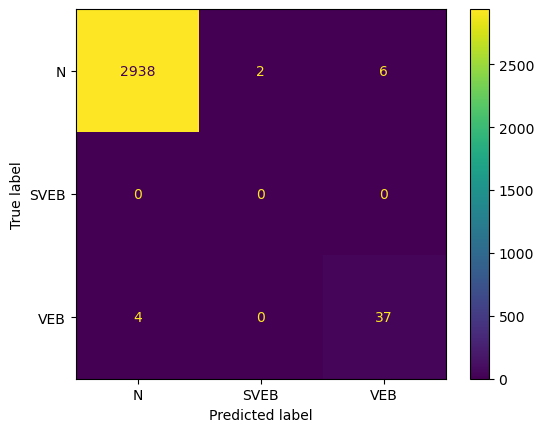

Fold 10:
  Test:  patient=9


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       1.00      0.99      1.00      3597
         1.0       0.00      0.00      0.00         0
         2.0       0.76      0.94      0.84        83

    accuracy                           0.99      3680
   macro avg       0.59      0.64      0.61      3680
weighted avg       0.99      0.99      0.99      3680

                   0.0  1.0        2.0  accuracy    macro avg  weighted avg
precision     0.999161  0.0   0.757282  0.991848     0.585481      0.993705
recall        0.993050  NaN   0.939759  0.991848     0.644270      0.991848
f1-score      0.996096  NaN   0.838710  0.991848     0.611602      0.992546
support    3597.000000  0.0  83.000000  0.991848  3680.000000   3680.000000


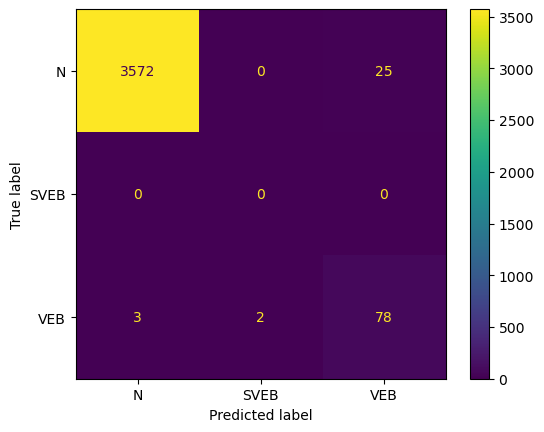

Fold 11:
  Test:  patient=10
              precision    recall  f1-score   support

         0.0       1.00      0.99      1.00      2076
         2.0       0.25      1.00      0.40         4

    accuracy                           0.99      2080
   macro avg       0.62      1.00      0.70      2080
weighted avg       1.00      0.99      1.00      2080

                   0.0   2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.25  0.994231     0.625000      0.998558
recall        0.994220  1.00  0.994231     0.997110      0.994231
f1-score      0.997101  0.40  0.994231     0.698551      0.995953
support    2076.000000  4.00  0.994231  2080.000000   2080.000000


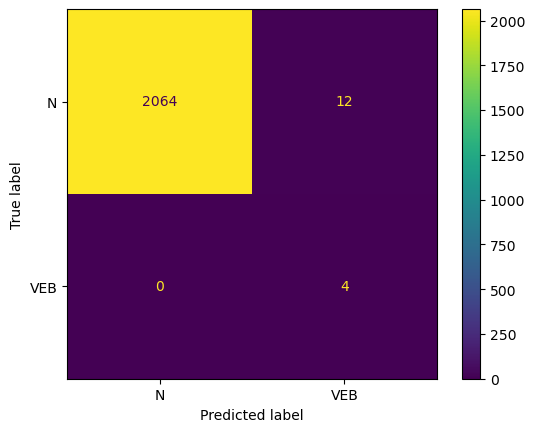

Fold 12:
  Test:  patient=11
              precision    recall  f1-score   support

         0.0       1.00      0.99      0.99      2798
         1.0       0.00      0.00      0.00         1
         2.0       0.20      0.33      0.25         6

    accuracy                           0.99      2805
   macro avg       0.40      0.44      0.41      2805
weighted avg       1.00      0.99      0.99      2805

                   0.0  1.0       2.0  accuracy    macro avg  weighted avg
precision     0.998199  0.0  0.200000  0.988948     0.399400      0.996136
recall        0.990708  0.0  0.333333  0.988948     0.441347      0.988948
f1-score      0.994439  0.0  0.250000  0.988948     0.414813      0.992493
support    2798.000000  1.0  6.000000  0.988948  2805.000000   2805.000000


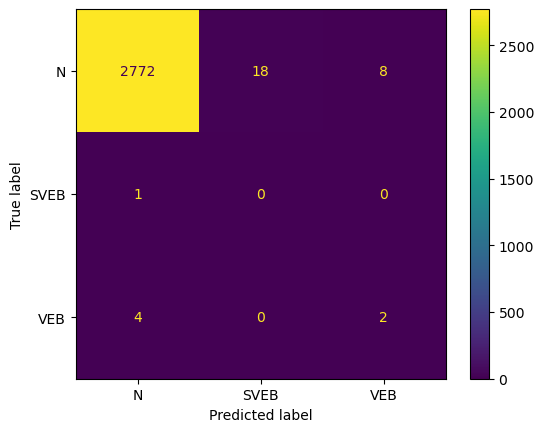

Fold 13:
  Test:  patient=12
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1791
         2.0       0.98      1.00      0.99       230

    accuracy                           1.00      2021
   macro avg       0.99      1.00      0.99      2021
weighted avg       1.00      1.00      1.00      2021

                   0.0         2.0  accuracy    macro avg  weighted avg
precision     1.000000    0.978723  0.997526     0.989362      0.997579
recall        0.997208    1.000000  0.997526     0.998604      0.997526
f1-score      0.998602    0.989247  0.997526     0.993925      0.997538
support    1791.000000  230.000000  0.997526  2021.000000   2021.000000


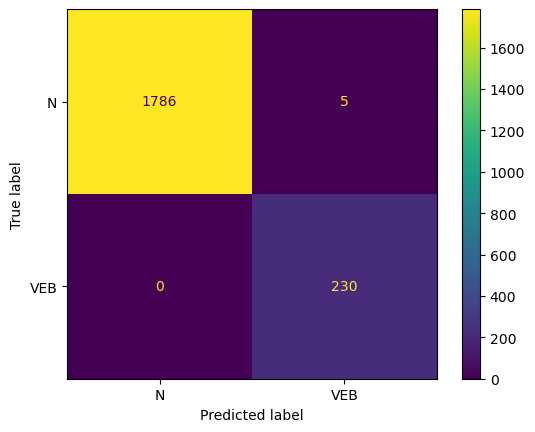

Fold 14:
  Test:  patient=13
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1800
         1.0       0.00      0.00      0.00         0
         2.0       0.97      0.91      0.94        64

    accuracy                           0.99      1864
   macro avg       0.66      0.63      0.64      1864
weighted avg       1.00      0.99      1.00      1864

                   0.0  1.0        2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.0   0.966667  0.994635     0.655556      0.998856
recall        0.997778  NaN   0.906250  0.994635     0.634676      0.994635
f1-score      0.998888  NaN   0.935484  0.994635     0.644791      0.996711
support    1800.000000  0.0  64.000000  0.994635  1864.000000   1864.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

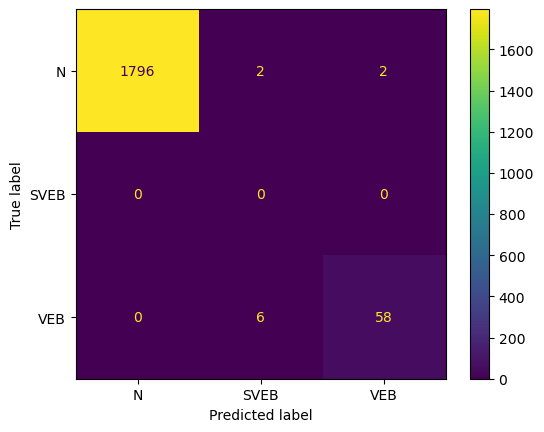

Fold 15:
  Test:  patient=14


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       1.00      0.93      0.97      2630
         1.0       0.00      0.00      0.00         0
         2.0       0.00      0.00      0.00         3

    accuracy                           0.93      2633
   macro avg       0.33      0.31      0.32      2633
weighted avg       1.00      0.93      0.96      2633

                   0.0  1.0  2.0  accuracy    macro avg  weighted avg
precision     0.999186  0.0  0.0  0.932397     0.333062      0.998048
recall        0.933460  NaN  0.0  0.932397     0.311153      0.932397
f1-score      0.965205  NaN  0.0  0.932397     0.321735      0.964106
support    2630.000000  0.0  3.0  0.932397  2633.000000   2633.000000


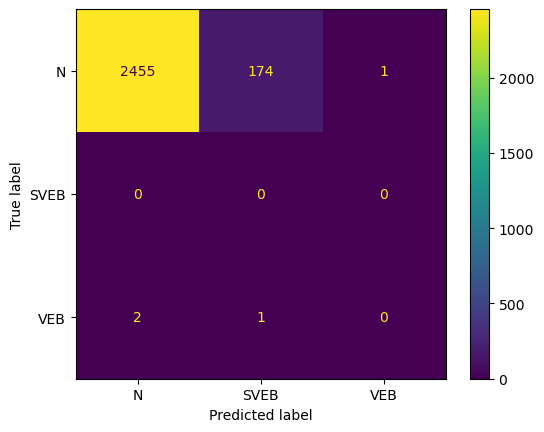

Fold 16:
  Test:  patient=15
              precision    recall  f1-score   support

         0.0       1.00      0.93      0.96      1518
         1.0       0.00      0.00      0.00         0
         2.0       0.02      1.00      0.03         2

    accuracy                           0.93      1520
   macro avg       0.34      0.64      0.33      1520
weighted avg       1.00      0.93      0.96      1520

                   0.0  1.0       2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.0  0.017699  0.925658     0.339233      0.998707
recall        0.925560  NaN  1.000000  0.925658     0.641853      0.925658
f1-score      0.961341  NaN  0.034783  0.925658     0.332041      0.960122
support    1518.000000  0.0  2.000000  0.925658  1520.000000   1520.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

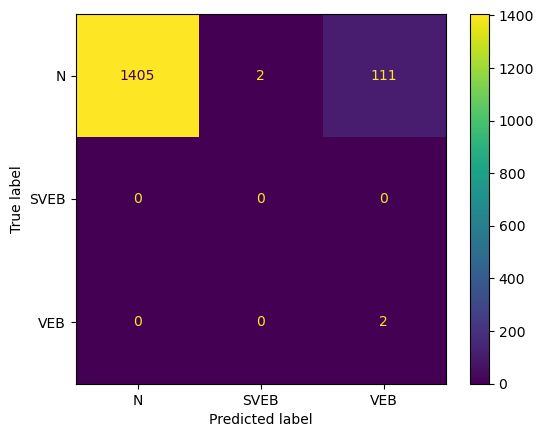

Fold 17:
  Test:  patient=16
              precision    recall  f1-score   support

         0.0       1.00      0.99      0.99      1644
         1.0       0.00      0.00      0.00         0
         2.0       0.53      0.70      0.60        27

    accuracy                           0.98      1671
   macro avg       0.51      0.56      0.53      1671
weighted avg       0.99      0.98      0.99      1671

                   0.0  1.0        2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.0   0.527778  0.982047     0.509259      0.992370
recall        0.986618  NaN   0.703704  0.982047     0.563441      0.982047
f1-score      0.993264  NaN   0.603175  0.982047     0.532146      0.986961
support    1644.000000  0.0  27.000000  0.982047  1671.000000   1671.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

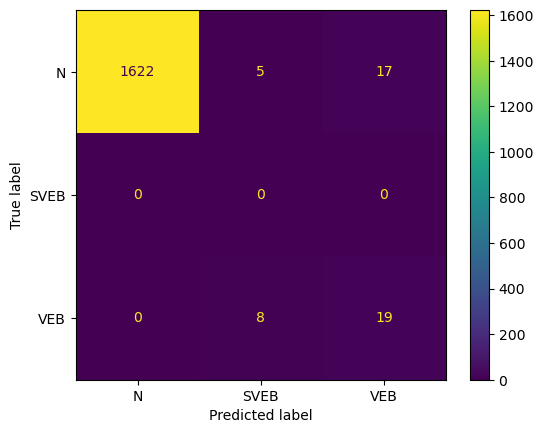

Fold 18:
  Test:  patient=17


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       1.00      0.96      0.98      2660
         1.0       0.00      0.00      0.00         0
         2.0       0.92      0.98      0.95       366

    accuracy                           0.96      3026
   macro avg       0.64      0.65      0.64      3026
weighted avg       0.99      0.96      0.97      3026

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.997651  0.0    0.923077  0.961005     0.640243      0.988631
recall        0.957895  NaN    0.983607  0.961005     0.647167      0.961005
f1-score      0.977369  NaN    0.952381  0.961005     0.643250      0.974346
support    2660.000000  0.0  366.000000  0.961005  3026.000000   3026.000000


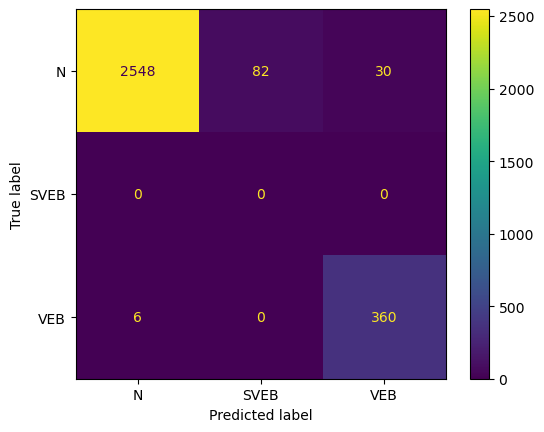

Fold 19:
  Test:  patient=18
              precision    recall  f1-score   support

         0.0       1.00      0.78      0.87      1211
         1.0       0.00      0.00      0.00         0
         2.0       0.85      1.00      0.92       849

    accuracy                           0.87      2060
   macro avg       0.62      0.59      0.60      2060
weighted avg       0.94      0.87      0.89      2060

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.0    0.854985  0.868447     0.618328      0.940234
recall        0.776218  NaN    1.000000  0.868447     0.592073      0.868447
f1-score      0.874012  NaN    0.921824  0.868447     0.598612      0.893717
support    1211.000000  0.0  849.000000  0.868447  2060.000000   2060.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

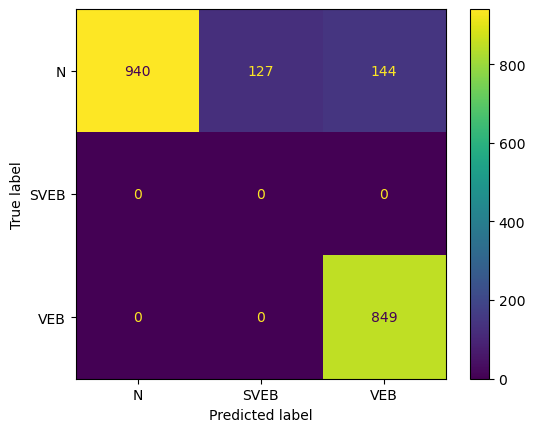

Fold 20:
  Test:  patient=19
              precision    recall  f1-score   support

         0.0       0.98      0.95      0.97      2360
         1.0       0.54      0.75      0.63       179
         2.0       0.95      0.94      0.94       110

    accuracy                           0.94      2649
   macro avg       0.83      0.88      0.85      2649
weighted avg       0.95      0.94      0.94      2649

                   0.0         1.0         2.0  accuracy    macro avg  \
precision     0.979939    0.544355    0.953704   0.93809     0.825999   
recall        0.952119    0.754190    0.936364   0.93809     0.880891   
f1-score      0.965828    0.632319    0.944954   0.93809     0.847700   
support    2360.000000  179.000000  110.000000   0.93809  2649.000000   

           weighted avg  
precision      0.949416  
recall         0.938090  
f1-score       0.942426  
support     2649.000000  


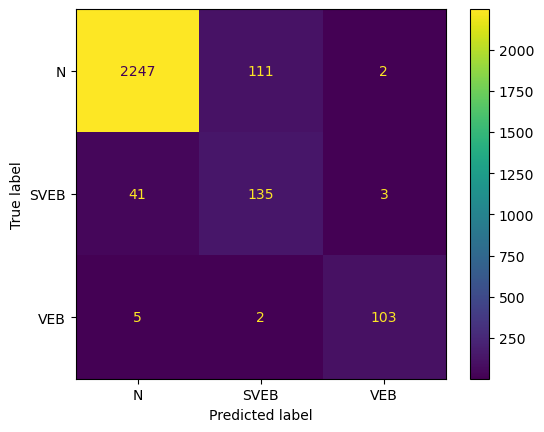

Fold 21:
  Test:  patient=20
              precision    recall  f1-score   support

         0.0       0.99      0.86      0.92      2070
         1.0       0.24      0.88      0.38       104
         2.0       1.00      1.00      1.00         8

    accuracy                           0.86      2182
   macro avg       0.74      0.91      0.77      2182
weighted avg       0.96      0.86      0.89      2182

                   0.0         1.0  2.0  accuracy    macro avg  weighted avg
precision     0.993289    0.238342  1.0  0.859762     0.743877      0.957330
recall        0.857971    0.884615  1.0  0.859762     0.914195      0.859762
f1-score      0.920684    0.375510  1.0  0.859762     0.765398      0.894991
support    2070.000000  104.000000  8.0  0.859762  2182.000000   2182.000000


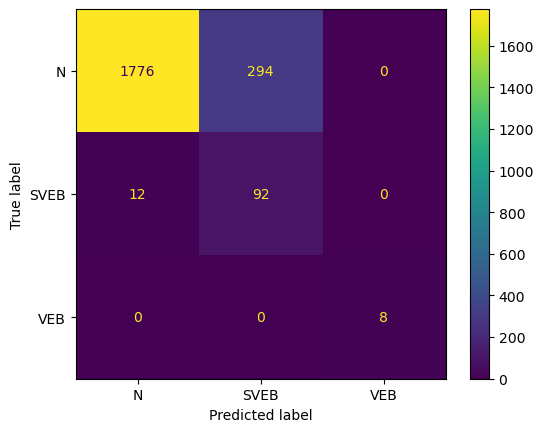

Fold 22:
  Test:  patient=21
              precision    recall  f1-score   support

         0.0       0.98      0.94      0.96      2814
         1.0       0.36      0.80      0.49       124
         2.0       0.97      0.79      0.87       185

    accuracy                           0.93      3123
   macro avg       0.77      0.84      0.78      3123
weighted avg       0.96      0.93      0.94      3123

                   0.0         1.0         2.0  accuracy    macro avg  \
precision     0.982196    0.358696    0.966887  0.926353     0.769260   
recall        0.941009    0.798387    0.789189  0.926353     0.842862   
f1-score      0.961162    0.495000    0.869048  0.926353     0.775070   
support    2814.000000  124.000000  185.000000  0.926353  3123.000000   

           weighted avg  
precision      0.956533  
recall         0.926353  
f1-score       0.937196  
support     3123.000000  


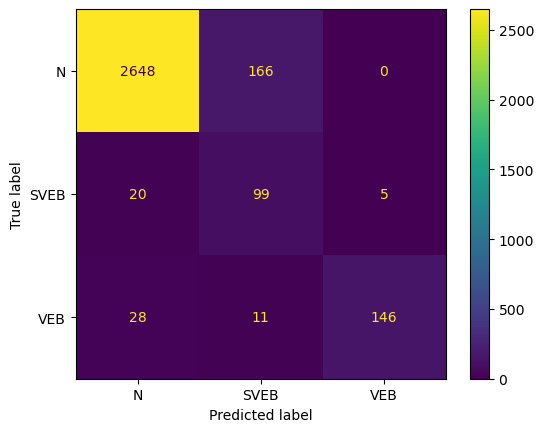

Fold 23:
  Test:  patient=22
              precision    recall  f1-score   support

         0.0       1.00      0.93      0.96      2190
         1.0       0.00      0.00      0.00         0
         2.0       0.10      1.00      0.19        13

    accuracy                           0.93      2203
   macro avg       0.37      0.64      0.38      2203
weighted avg       0.99      0.93      0.96      2203

                   0.0  1.0        2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.0   0.104000  0.930095     0.368000      0.994713
recall        0.929680  NaN   1.000000  0.930095     0.643227      0.930095
f1-score      0.963559  NaN   0.188406  0.930095     0.383988      0.958985
support    2190.000000  0.0  13.000000  0.930095  2203.000000   2203.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

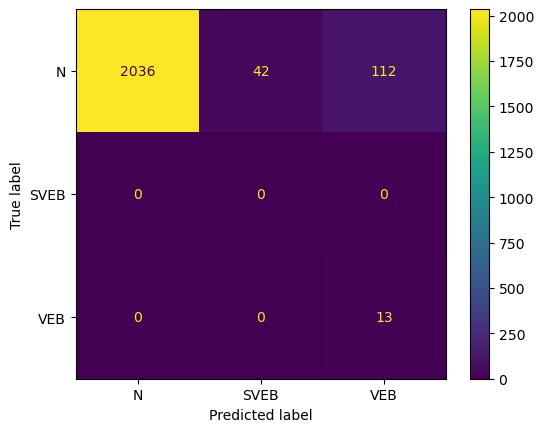

Fold 24:
  Test:  patient=23
              precision    recall  f1-score   support

         0.0       1.00      0.90      0.95      2563
         1.0       0.00      0.00      0.00         0
         2.0       0.02      0.83      0.04         6

    accuracy                           0.90      2569
   macro avg       0.34      0.58      0.33      2569
weighted avg       1.00      0.90      0.94      2569

                   0.0  1.0       2.0  accuracy    macro avg  weighted avg
precision     0.999565  0.0  0.018939  0.896069     0.339501      0.997275
recall        0.896215  NaN  0.833333  0.896069     0.576516      0.896069
f1-score      0.945073  NaN  0.037037  0.896069     0.327370      0.942952
support    2563.000000  0.0  6.000000  0.896069  2569.000000   2569.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

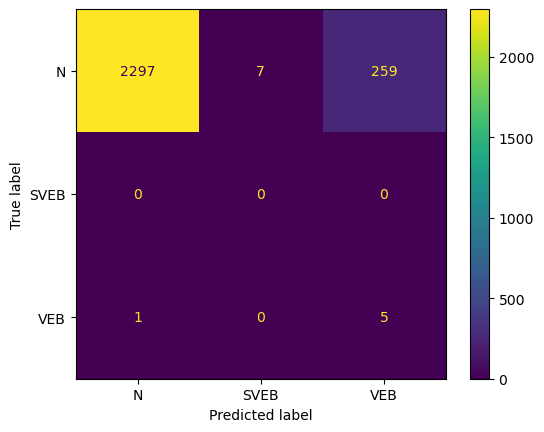

Fold 25:
  Test:  patient=24
              precision    recall  f1-score   support

         0.0       1.00      0.93      0.96      1703
         1.0       0.01      0.50      0.02         2
         2.0       0.13      0.60      0.21         5

    accuracy                           0.93      1710
   macro avg       0.38      0.68      0.40      1710
weighted avg       1.00      0.93      0.96      1710

                   0.0       1.0       2.0  accuracy    macro avg  \
precision     0.998734  0.009346  0.130435  0.925146     0.379505   
recall        0.926600  0.500000  0.600000  0.925146     0.675533   
f1-score      0.961316  0.018349  0.214286  0.925146     0.397983   
support    1703.000000  2.000000  5.000000  0.925146  1710.000000   

           weighted avg  
precision      0.995038  
recall         0.925146  
f1-score       0.958029  
support     1710.000000  


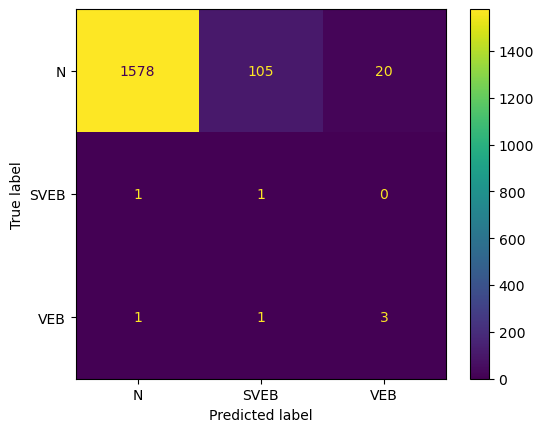

Fold 26:
  Test:  patient=25
              precision    recall  f1-score   support

         0.0       1.00      0.99      0.99      1496
         1.0       0.80      0.57      0.67         7
         2.0       0.24      1.00      0.38         4

    accuracy                           0.99      1507
   macro avg       0.68      0.85      0.68      1507
weighted avg       1.00      0.99      0.99      1507

                   0.0       1.0       2.0  accuracy    macro avg  \
precision     0.997980  0.800000  0.235294  0.988719     0.677758   
recall        0.990642  0.571429  1.000000  0.988719     0.854023   
f1-score      0.994297  0.666667  0.380952  0.988719     0.680639   
support    1496.000000  7.000000  4.000000  0.988719  1507.000000   

           weighted avg  
precision      0.995036  
recall         0.988719  
f1-score       0.991147  
support     1507.000000  


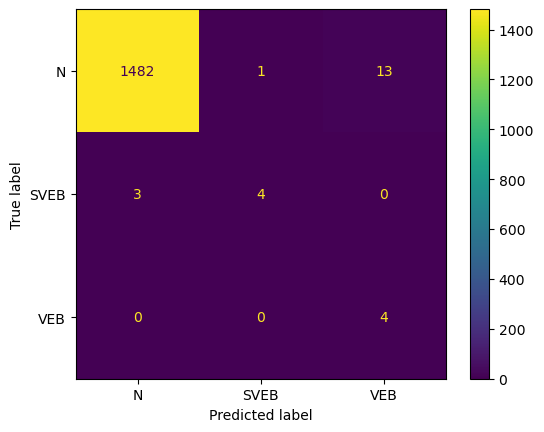

Fold 27:
  Test:  patient=26
              precision    recall  f1-score   support

         0.0       1.00      0.99      0.99      1884
         1.0       0.00      0.00      0.00         0
         2.0       0.99      1.00      0.99       719

    accuracy                           0.99      2603
   macro avg       0.66      0.66      0.66      2603
weighted avg       1.00      0.99      0.99      2603

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.0    0.987637  0.991548     0.662546      0.996585
recall        0.988323  NaN    1.000000  0.991548     0.662774      0.991548
f1-score      0.994127  NaN    0.993780  0.991548     0.662636      0.994031
support    1884.000000  0.0  719.000000  0.991548  2603.000000   2603.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

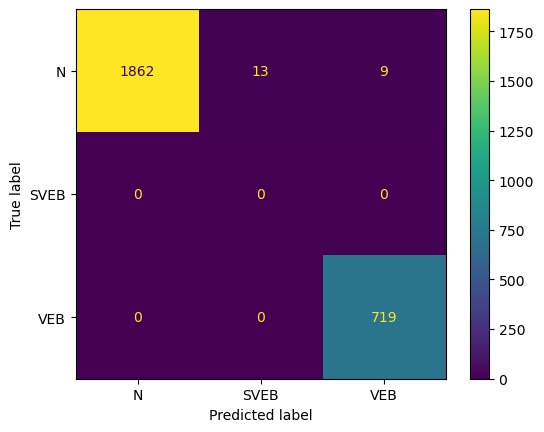

Fold 28:
  Test:  patient=27
              precision    recall  f1-score   support

         0.0       1.00      0.99      0.99      1711
         1.0       0.00      0.00      0.00         0
         2.0       0.15      0.75      0.25         4

    accuracy                           0.99      1715
   macro avg       0.38      0.58      0.41      1715
weighted avg       1.00      0.99      0.99      1715

                   0.0  1.0   2.0  accuracy    macro avg  weighted avg
precision     0.999409  0.0  0.15  0.988338     0.383136      0.997428
recall        0.988895  NaN  0.75  0.988338     0.579632      0.988338
f1-score      0.994125  NaN  0.25  0.988338     0.414708      0.992389
support    1711.000000  0.0  4.00  0.988338  1715.000000   1715.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

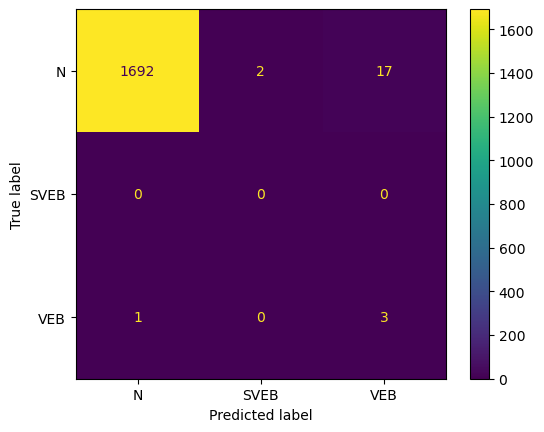

Fold 29:
  Test:  patient=28


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       0.98      0.96      0.97      1835
         1.0       0.00      0.00      0.00         0
         2.0       0.93      0.95      0.94       783

    accuracy                           0.96      2618
   macro avg       0.64      0.64      0.64      2618
weighted avg       0.97      0.96      0.96      2618

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.981667  0.0    0.929912  0.958747     0.637193      0.966188
recall        0.962943  NaN    0.948914  0.958747     0.637286      0.958747
f1-score      0.972215  NaN    0.939317  0.958747     0.637177      0.962376
support    1835.000000  0.0  783.000000  0.958747  2618.000000   2618.000000


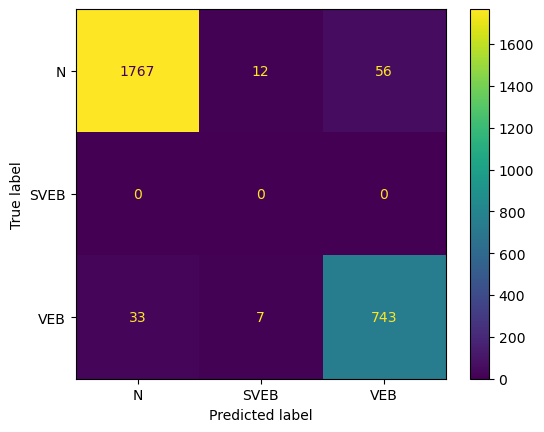

Fold 30:
  Test:  patient=29
              precision    recall  f1-score   support

         0.0       0.99      0.99      0.99      1705
         1.0       0.00      0.00      0.00         0
         2.0       0.99      0.97      0.98       755

    accuracy                           0.99      2460
   macro avg       0.66      0.65      0.66      2460
weighted avg       0.99      0.99      0.99      2460

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.992970  0.0    0.989160  0.985772     0.660710      0.991801
recall        0.994135  NaN    0.966887  0.985772     0.653674      0.985772
f1-score      0.993552  NaN    0.977897  0.985772     0.657150      0.988747
support    1705.000000  0.0  755.000000  0.985772  2460.000000   2460.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

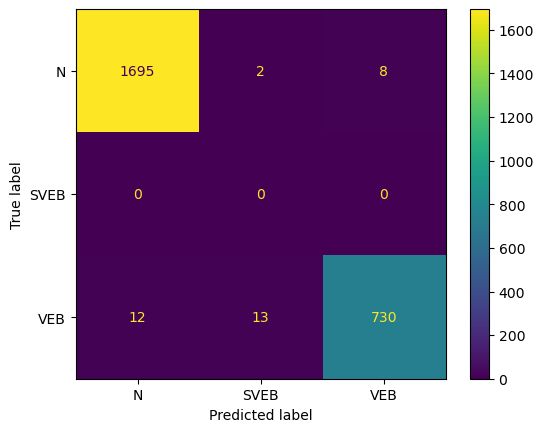

Fold 31:
  Test:  patient=30
              precision    recall  f1-score   support

         0.0       0.97      0.98      0.97      1843
         1.0       0.00      0.00      0.00         0
         2.0       0.97      0.92      0.95      1364

    accuracy                           0.95      3207
   macro avg       0.65      0.63      0.64      3207
weighted avg       0.97      0.95      0.96      3207

                   0.0  1.0          2.0  accuracy    macro avg  weighted avg
precision     0.966238  0.0     0.972868  0.953539     0.646369      0.969058
recall        0.978296  NaN     0.920088  0.953539     0.632795      0.953539
f1-score      0.972230  NaN     0.945742  0.953539     0.639324      0.960964
support    1843.000000  0.0  1364.000000  0.953539  3207.000000   3207.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

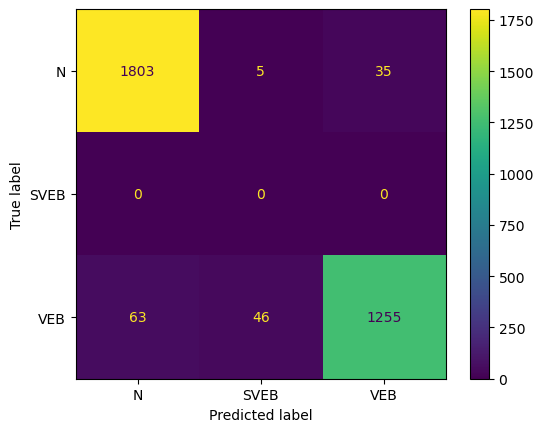

Fold 32:
  Test:  patient=31
              precision    recall  f1-score   support

         0.0       1.00      0.95      0.98      1560
         1.0       0.00      0.00      0.00         0
         2.0       0.54      1.00      0.70        57

    accuracy                           0.96      1617
   macro avg       0.51      0.65      0.56      1617
weighted avg       0.98      0.96      0.97      1617

                   0.0  1.0        2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.0   0.542857  0.956092     0.514286      0.983886
recall        0.954487  NaN   1.000000  0.956092     0.651496      0.956092
f1-score      0.976714  NaN   0.703704  0.956092     0.560139      0.967090
support    1560.000000  0.0  57.000000  0.956092  1617.000000   1617.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

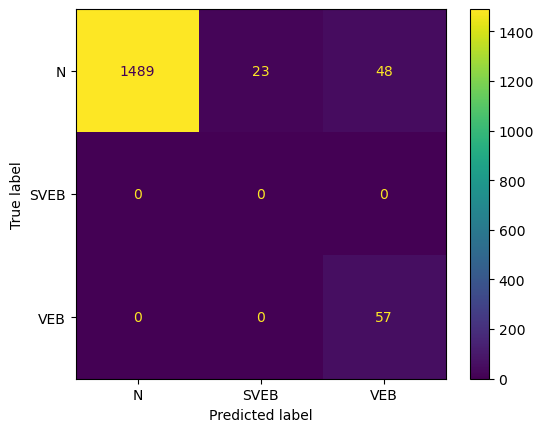

Fold 33:
  Test:  patient=32
              precision    recall  f1-score   support

         0.0       0.99      0.94      0.96      1245
         1.0       0.88      0.96      0.92       589
         2.0       0.00      0.00      0.00         1

    accuracy                           0.94      1835
   macro avg       0.62      0.63      0.63      1835
weighted avg       0.96      0.94      0.95      1835

                   0.0         1.0  2.0  accuracy    macro avg  weighted avg
precision     0.991497    0.883359  0.0  0.944959     0.624952      0.956246
recall        0.936546    0.964346  0.0  0.944959     0.633631      0.944959
f1-score      0.963238    0.922078  0.0  0.944959     0.628439      0.949502
support    1245.000000  589.000000  1.0  0.944959  1835.000000   1835.000000


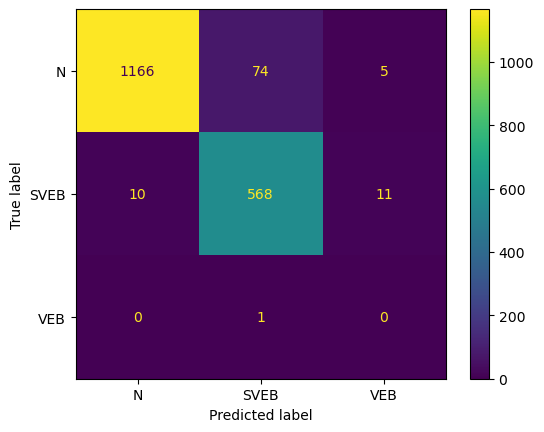

Fold 34:
  Test:  patient=33
              precision    recall  f1-score   support

         0.0       0.99      0.94      0.97      1427
         1.0       0.85      0.96      0.90       536
         2.0       0.00      0.00      0.00         0

    accuracy                           0.94      1963
   macro avg       0.62      0.63      0.62      1963
weighted avg       0.96      0.94      0.95      1963

                   0.0         1.0  2.0  accuracy    macro avg  weighted avg
precision     0.994056    0.853577  0.0  0.942944     0.615878      0.955698
recall        0.937631    0.957090  NaN  0.942944     0.631574      0.942944
f1-score      0.965020    0.902375  NaN  0.942944     0.622465      0.947914
support    1427.000000  536.000000  0.0  0.942944  1963.000000   1963.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

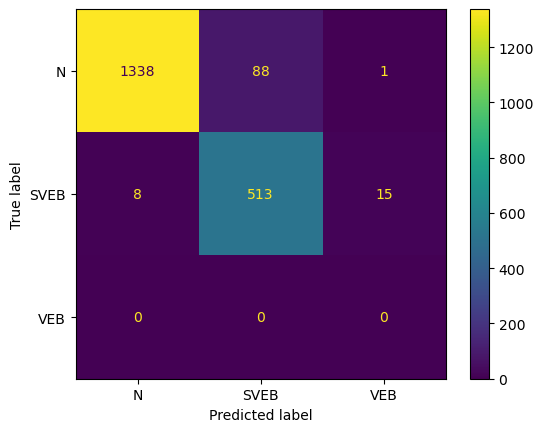

Fold 35:
  Test:  patient=34
              precision    recall  f1-score   support

         0.0       0.99      0.99      0.99      3199
         1.0       0.00      0.00      0.00         0
         2.0       0.94      0.91      0.92       457

    accuracy                           0.98      3656
   macro avg       0.64      0.63      0.64      3656
weighted avg       0.98      0.98      0.98      3656

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.989032  0.0    0.936652  0.976477     0.641894      0.982484
recall        0.986558  NaN    0.905908  0.976477     0.630822      0.976477
f1-score      0.987793  NaN    0.921023  0.976477     0.636272      0.979447
support    3199.000000  0.0  457.000000  0.976477  3656.000000   3656.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

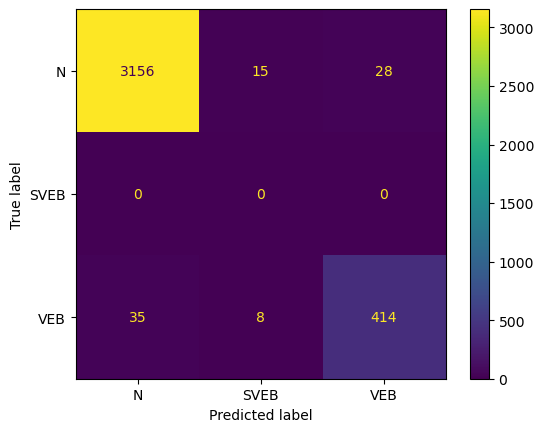

Fold 36:
  Test:  patient=35
              precision    recall  f1-score   support

         0.0       1.00      0.97      0.98      3447
         1.0       0.00      0.00      0.00         0
         2.0       0.82      0.96      0.88       450

    accuracy                           0.97      3897
   macro avg       0.60      0.64      0.62      3897
weighted avg       0.98      0.97      0.97      3897

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.996118  0.0    0.815094  0.966898     0.603738      0.975215
recall        0.967798  NaN    0.960000  0.966898     0.642599      0.966898
f1-score      0.981754  NaN    0.881633  0.966898     0.621129      0.970193
support    3447.000000  0.0  450.000000  0.966898  3897.000000   3897.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

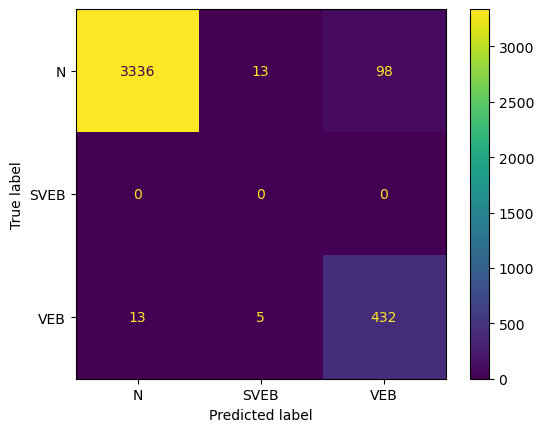

Fold 37:
  Test:  patient=36


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       1.00      0.96      0.98      2007
         1.0       0.00      0.00      0.00         0
         2.0       0.98      1.00      0.99       452

    accuracy                           0.97      2459
   macro avg       0.66      0.65      0.66      2459
weighted avg       1.00      0.97      0.98      2459

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.0    0.976242  0.971126     0.658747      0.995633
recall        0.964624  NaN    1.000000  0.971126     0.654875      0.971126
f1-score      0.981993  NaN    0.987978  0.971126     0.656657      0.983093
support    2007.000000  0.0  452.000000  0.971126  2459.000000   2459.000000


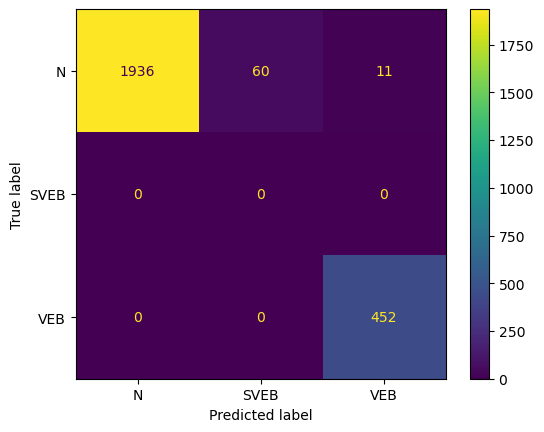

Fold 38:
  Test:  patient=37
              precision    recall  f1-score   support

         0.0       0.99      0.96      0.97      2153
         1.0       0.00      0.00      0.00         0
         2.0       0.87      0.92      0.89       543

    accuracy                           0.95      2696
   macro avg       0.62      0.63      0.62      2696
weighted avg       0.96      0.95      0.96      2696

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.987578  0.0    0.869110  0.951409     0.618896      0.963717
recall        0.960056  NaN    0.917127  0.951409     0.625728      0.951409
f1-score      0.973622  NaN    0.892473  0.951409     0.622032      0.957278
support    2153.000000  0.0  543.000000  0.951409  2696.000000   2696.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

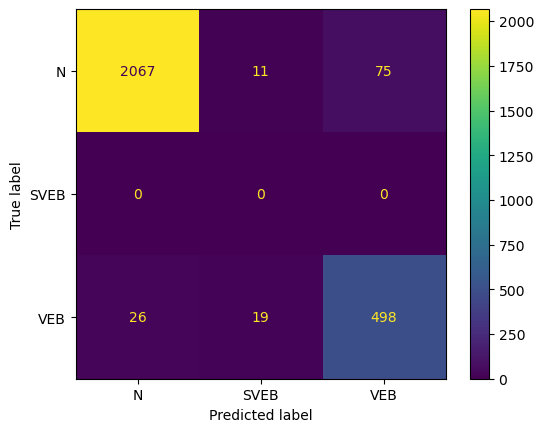

Fold 39:
  Test:  patient=38
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1460
         1.0       0.00      0.00      0.00         0
         2.0       1.00      0.97      0.98       313

    accuracy                           0.99      1773
   macro avg       0.67      0.66      0.66      1773
weighted avg       1.00      0.99      1.00      1773

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.996585  0.0    1.000000  0.993796     0.665528      0.997188
recall        0.999315  NaN    0.968051  0.993796     0.655789      0.993796
f1-score      0.997948  NaN    0.983766  0.993796     0.660571      0.995444
support    1460.000000  0.0  313.000000  0.993796  1773.000000   1773.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

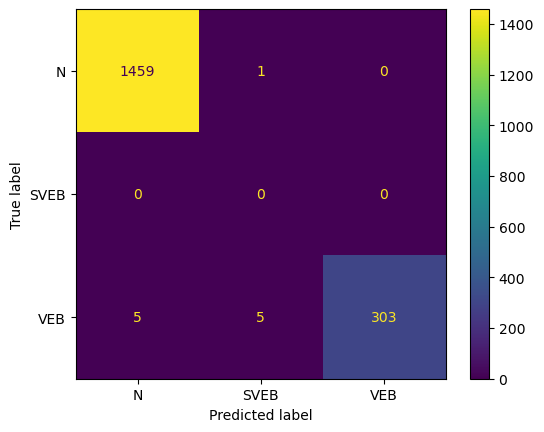

Fold 40:
  Test:  patient=39
              precision    recall  f1-score   support

         0.0       1.00      0.97      0.99      2566
         1.0       0.06      0.33      0.11         6
         2.0       0.69      0.98      0.81        92

    accuracy                           0.97      2664
   macro avg       0.58      0.76      0.63      2664
weighted avg       0.99      0.97      0.98      2664

                   0.0       1.0        2.0  accuracy    macro avg  \
precision     0.998002  0.064516   0.687023  0.971847     0.583180   
recall        0.973110  0.333333   0.978261  0.971847     0.761568   
f1-score      0.985399  0.108108   0.807175  0.971847     0.633561   
support    2566.000000  6.000000  92.000000  0.971847  2664.000000   

           weighted avg  
precision      0.985160  
recall         0.971847  
f1-score       0.977268  
support     2664.000000  


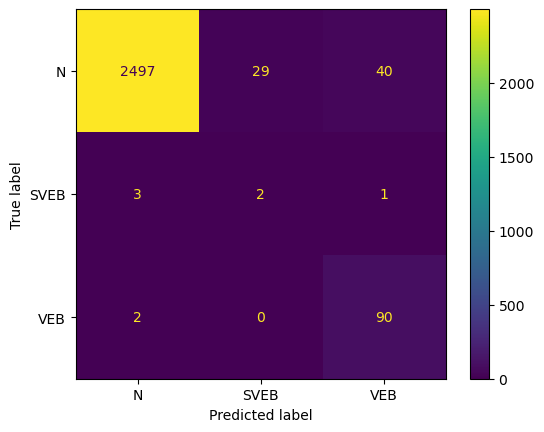

Fold 41:
  Test:  patient=40
              precision    recall  f1-score   support

         0.0       1.00      0.83      0.90      1622
         1.0       0.03      0.20      0.05         5
         2.0       0.00      1.00      0.01         1

    accuracy                           0.82      1628
   macro avg       0.34      0.68      0.32      1628
weighted avg       0.99      0.82      0.90      1628

                   0.0       1.0       2.0  accuracy    macro avg  \
precision     0.998510  0.030303  0.003953  0.824324     0.344255   
recall        0.826141  0.200000  1.000000  0.824324     0.675380   
f1-score      0.904184  0.052632  0.007874  0.824324     0.321563   
support    1622.000000  5.000000  1.000000  0.824324  1628.000000   

           weighted avg  
precision      0.994925  
recall         0.824324  
f1-score       0.901018  
support     1628.000000  


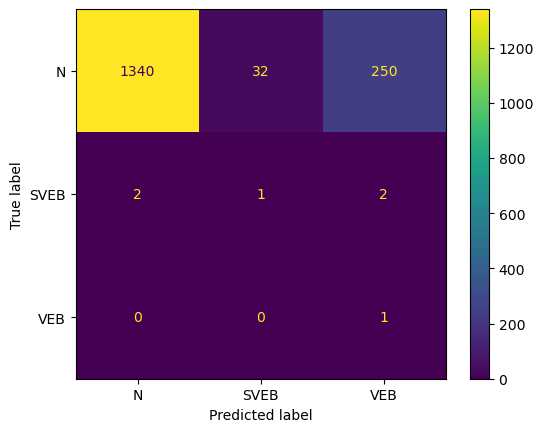

Fold 42:
  Test:  patient=41
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1544
         1.0       0.00      0.00      0.00         0
         2.0       1.00      1.00      1.00      1554

    accuracy                           1.00      3098
   macro avg       0.67      0.67      0.67      3098
weighted avg       1.00      1.00      1.00      3098

                   0.0  1.0          2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.0     0.998071  0.998386     0.666024      0.999032
recall        0.998057  NaN     0.998713  0.998386     0.665590      0.998386
f1-score      0.999028  NaN     0.998392  0.998386     0.665806      0.998709
support    1544.000000  0.0  1554.000000  0.998386  3098.000000   3098.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

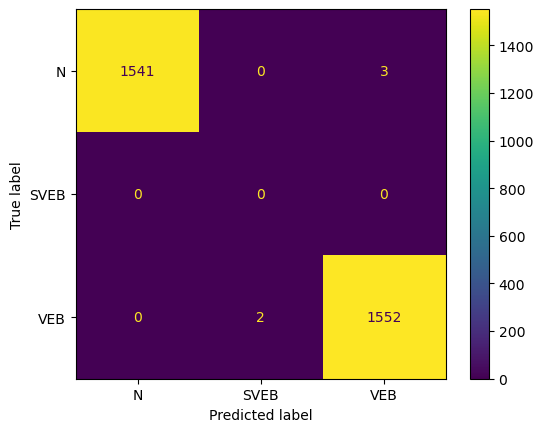

Fold 43:
  Test:  patient=42
              precision    recall  f1-score   support

         0.0       0.99      1.00      1.00      1085
         1.0       0.00      0.00      0.00         0
         2.0       1.00      0.99      1.00      1120

    accuracy                           1.00      2205
   macro avg       0.66      0.66      0.66      2205
weighted avg       1.00      1.00      1.00      2205

                   0.0  1.0          2.0  accuracy    macro avg  weighted avg
precision     0.994485  0.0     0.997312  0.995465     0.663932      0.995921
recall        0.997235  NaN     0.993750  0.995465     0.663662      0.995465
f1-score      0.995858  NaN     0.995528  0.995465     0.663795      0.995690
support    1085.000000  0.0  1120.000000  0.995465  2205.000000   2205.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

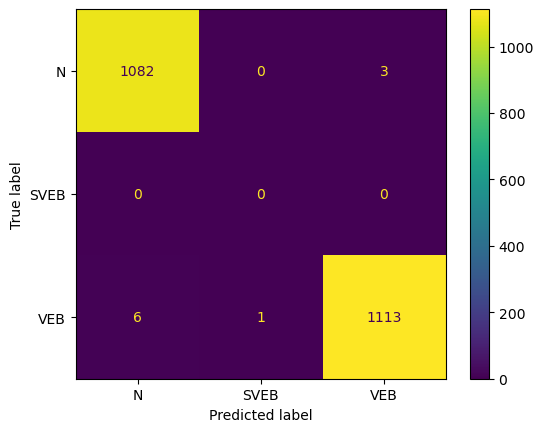

Fold 44:
  Test:  patient=43
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1802
         1.0       1.00      0.12      0.22         8
         2.0       1.00      1.00      1.00       683

    accuracy                           1.00      2493
   macro avg       1.00      0.71      0.74      2493
weighted avg       1.00      1.00      1.00      2493

                   0.0       1.0         2.0  accuracy    macro avg  \
precision     0.996128  1.000000    0.998538  0.996791     0.998222   
recall        0.999445  0.125000    1.000000  0.996791     0.708148   
f1-score      0.997784  0.222222    0.999268  0.996791     0.739758   
support    1802.000000  8.000000  683.000000  0.996791  2493.000000   

           weighted avg  
precision      0.996801  
recall         0.996791  
f1-score       0.995702  
support     2493.000000  


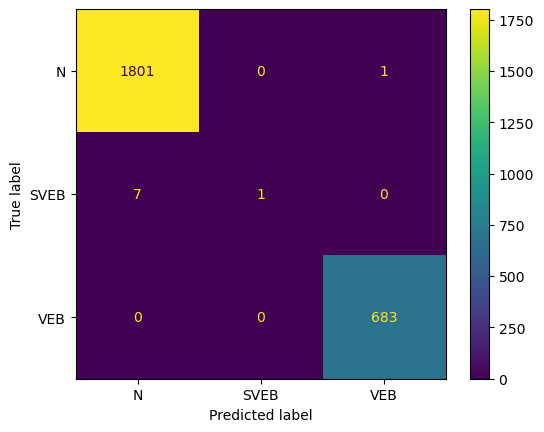

Fold 45:
  Test:  patient=44
              precision    recall  f1-score   support

         0.0       1.00      0.92      0.96      1435
         1.0       0.00      0.00      0.00         0
         2.0       1.00      1.00      1.00       491

    accuracy                           0.94      1926
   macro avg       0.67      0.64      0.65      1926
weighted avg       1.00      0.94      0.97      1926

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.999246  0.0    1.000000  0.942368     0.666415      0.999438
recall        0.923345  NaN    0.997963  0.942368     0.640436      0.942368
f1-score      0.959797  NaN    0.998981  0.942368     0.652926      0.969786
support    1435.000000  0.0  491.000000  0.942368  1926.000000   1926.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

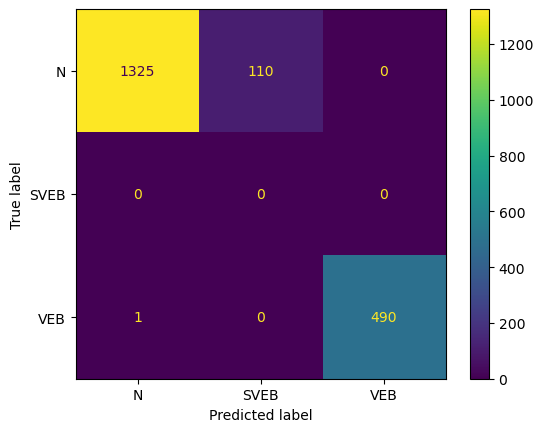

Fold 46:
  Test:  patient=45
              precision    recall  f1-score   support

         0.0       1.00      0.95      0.97      2230
         1.0       0.01      1.00      0.02         1
         2.0       0.98      0.98      0.98       422

    accuracy                           0.95      2653
   macro avg       0.66      0.98      0.66      2653
weighted avg       0.99      0.95      0.97      2653

                   0.0       1.0         2.0  accuracy    macro avg  \
precision     0.996704  0.009346    0.981043  0.954391     0.662364   
recall        0.949327  1.000000    0.981043  0.954391     0.976790   
f1-score      0.972439  0.018519    0.981043  0.954391     0.657333   
support    2230.000000  1.000000  422.000000  0.954391  2653.000000   

           weighted avg  
precision      0.993841  
recall         0.954391  
f1-score       0.973448  
support     2653.000000  


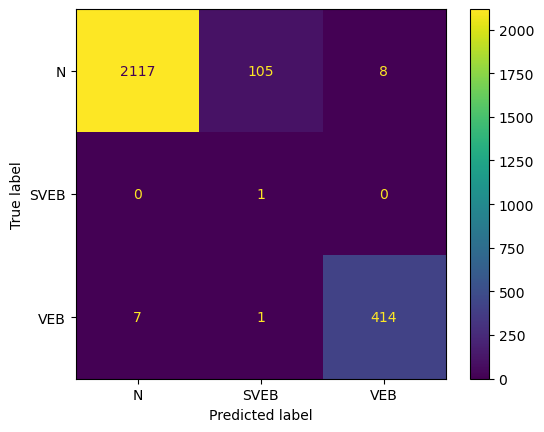

Fold 47:
  Test:  patient=46
              precision    recall  f1-score   support

         0.0       1.00      0.99      0.99      1857
         1.0       0.00      0.00      0.00         1
         2.0       0.99      0.98      0.98        93

    accuracy                           0.99      1951
   macro avg       0.66      0.66      0.66      1951
weighted avg       1.00      0.99      0.99      1951

                   0.0  1.0        2.0  accuracy    macro avg  weighted avg
precision     0.998914  0.0   0.989130  0.989749     0.662682      0.997936
recall        0.990845  0.0   0.978495  0.989749     0.656447      0.989749
f1-score      0.994863  0.0   0.983784  0.989749     0.659549      0.993825
support    1857.000000  1.0  93.000000  0.989749  1951.000000   1951.000000


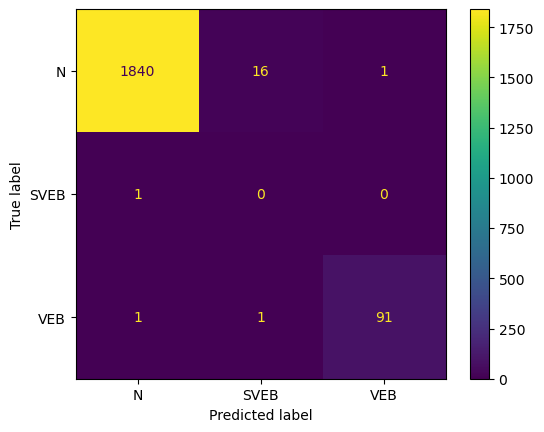

Fold 48:
  Test:  patient=47
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2117
         1.0       0.00      0.00      0.00         2
         2.0       1.00      0.97      0.98       235

    accuracy                           0.99      2354
   macro avg       0.66      0.65      0.66      2354
weighted avg       0.99      0.99      0.99      2354

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.995292  0.0    0.995614  0.994477     0.663635      0.994478
recall        0.998583  0.0    0.965957  0.994477     0.654847      0.994477
f1-score      0.996935  0.0    0.980562  0.994477     0.659165      0.994453
support    2117.000000  2.0  235.000000  0.994477  2354.000000   2354.000000


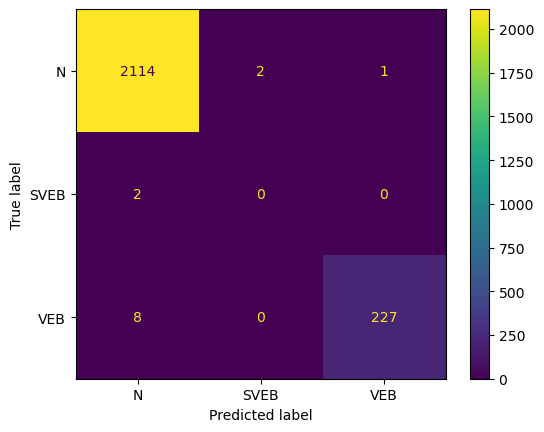

Fold 49:
  Test:  patient=48
              precision    recall  f1-score   support

         0.0       1.00      0.99      1.00      2119
         1.0       0.00      0.00      0.00         0
         2.0       1.00      1.00      1.00        27

    accuracy                           0.99      2146
   macro avg       0.67      0.66      0.67      2146
weighted avg       1.00      0.99      1.00      2146

                   0.0  1.0   2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.0   1.0  0.991146     0.666667      1.000000
recall        0.991034  NaN   1.0  0.991146     0.663678      0.991146
f1-score      0.995497  NaN   1.0  0.991146     0.665166      0.995553
support    2119.000000  0.0  27.0  0.991146  2146.000000   2146.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

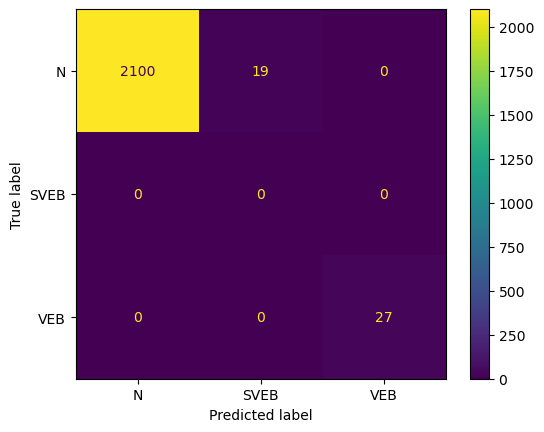

Fold 50:
  Test:  patient=49
              precision    recall  f1-score   support

         0.0       1.00      0.99      1.00      2993
         1.0       0.00      0.00      0.00         0
         2.0       0.30      0.75      0.43         4

    accuracy                           0.99      2997
   macro avg       0.43      0.58      0.48      2997
weighted avg       1.00      0.99      1.00      2997

                   0.0  1.0       2.0  accuracy    macro avg  weighted avg
precision     0.999664  0.0  0.300000  0.994328     0.433221      0.998730
recall        0.994654  NaN  0.750000  0.994328     0.581551      0.994328
f1-score      0.997153  NaN  0.428571  0.994328     0.475241      0.996394
support    2993.000000  0.0  4.000000  0.994328  2997.000000   2997.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

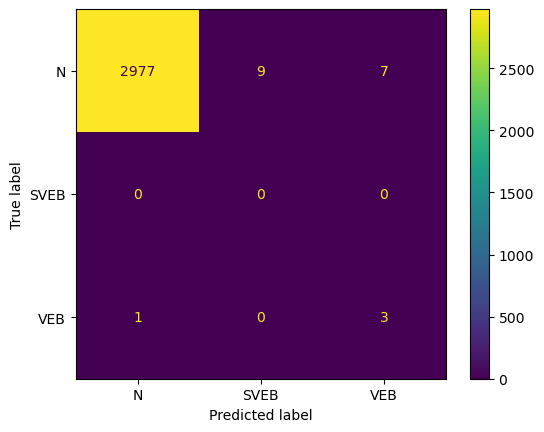

Fold 51:
  Test:  patient=50
              precision    recall  f1-score   support

         0.0       1.00      0.98      0.99      1969
         1.0       0.00      0.00      0.00         3
         2.0       0.98      1.00      0.99       802

    accuracy                           0.99      2774
   macro avg       0.66      0.66      0.66      2774
weighted avg       0.99      0.99      0.99      2774

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.998451  0.0    0.982843  0.986301     0.660431      0.992859
recall        0.982224  0.0    1.000000  0.986301     0.660741      0.986301
f1-score      0.990271  0.0    0.991347  0.986301     0.660540      0.989512
support    1969.000000  3.0  802.000000  0.986301  2774.000000   2774.000000


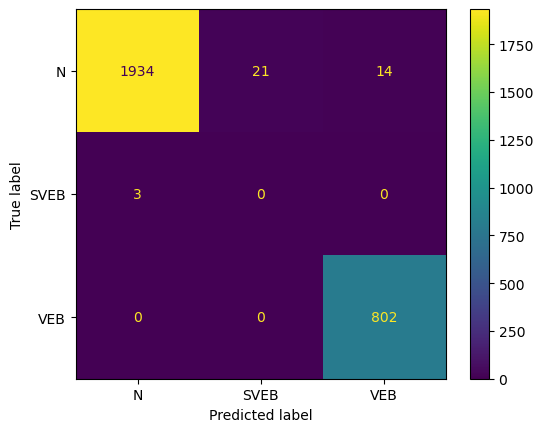

Fold 52:
  Test:  patient=51
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1608
         1.0       0.00      0.00      0.00         0
         2.0       1.00      1.00      1.00       137

    accuracy                           1.00      1745
   macro avg       0.67      0.67      0.67      1745
weighted avg       1.00      1.00      1.00      1745

                   0.0  1.0    2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.0    1.0  0.999427     0.666667      1.000000
recall        0.999378  NaN    1.0  0.999427     0.666459      0.999427
f1-score      0.999689  NaN    1.0  0.999427     0.666563      0.999713
support    1608.000000  0.0  137.0  0.999427  1745.000000   1745.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

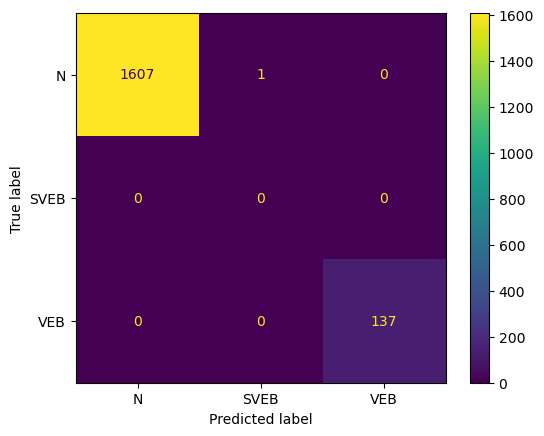

Fold 53:
  Test:  patient=52
              precision    recall  f1-score   support

         0.0       0.99      1.00      0.99      1150
         1.0       0.00      0.00      0.00         0
         2.0       1.00      0.99      0.99      1110

    accuracy                           0.99      2260
   macro avg       0.66      0.66      0.66      2260
weighted avg       0.99      0.99      0.99      2260

                   0.0  1.0          2.0  accuracy    macro avg  weighted avg
precision     0.990501  0.0     0.999091  0.993805     0.663197      0.994720
recall        0.997391  NaN     0.990090  0.993805     0.662494      0.993805
f1-score      0.993934  NaN     0.994570  0.993805     0.662835      0.994247
support    1150.000000  0.0  1110.000000  0.993805  2260.000000   2260.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

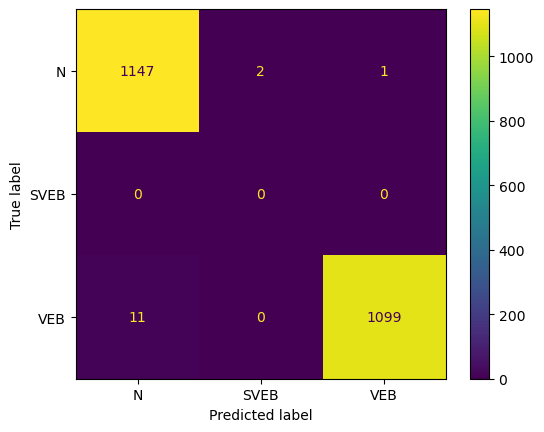

Fold 54:
  Test:  patient=53
              precision    recall  f1-score   support

         0.0       1.00      0.99      1.00      2338
         1.0       0.09      1.00      0.17         1
         2.0       0.81      0.77      0.79        22

    accuracy                           0.99      2361
   macro avg       0.63      0.92      0.65      2361
weighted avg       1.00      0.99      0.99      2361

                   0.0       1.0        2.0  accuracy    macro avg  \
precision     0.998712  0.090909   0.809524    0.9928     0.633048   
recall        0.994867  1.000000   0.772727    0.9928     0.922532   
f1-score      0.996786  0.166667   0.790698    0.9928     0.651383   
support    2338.000000  1.000000  22.000000    0.9928  2361.000000   

           weighted avg  
precision      0.996565  
recall         0.992800  
f1-score       0.994514  
support     2361.000000  


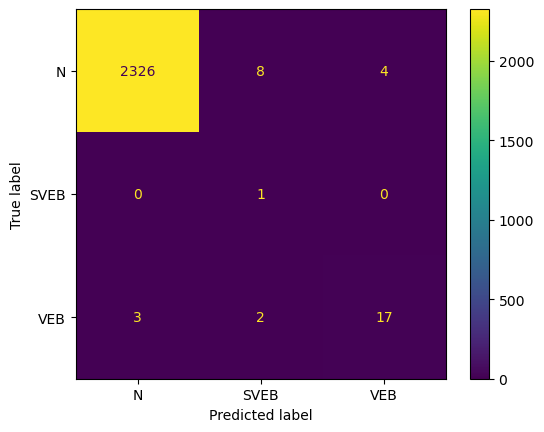

Fold 55:
  Test:  patient=54
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2146
         1.0       0.11      1.00      0.20         1
         2.0       1.00      0.82      0.90        17

    accuracy                           0.99      2164
   macro avg       0.70      0.94      0.70      2164
weighted avg       1.00      0.99      1.00      2164

                   0.0       1.0        2.0  accuracy    macro avg  \
precision     0.998599  0.111111   1.000000  0.994917     0.703237   
recall        0.996272  1.000000   0.823529  0.994917     0.939934   
f1-score      0.997434  0.200000   0.903226  0.994917     0.700220   
support    2146.000000  1.000000  17.000000  0.994917  2164.000000   

           weighted avg  
precision      0.998200  
recall         0.994917  
f1-score       0.996326  
support     2164.000000  


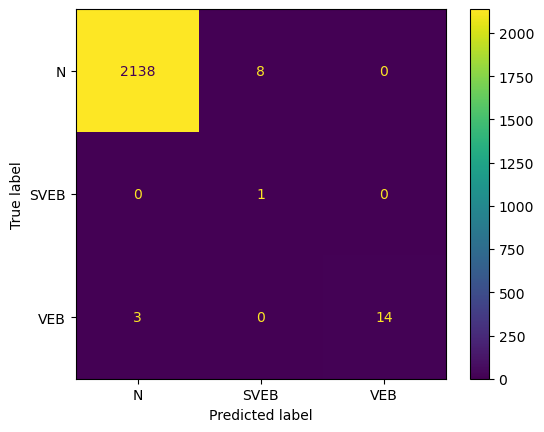

Fold 56:
  Test:  patient=55
              precision    recall  f1-score   support

         0.0       0.99      1.00      1.00      1670
         1.0       1.00      0.38      0.56        26
         2.0       1.00      1.00      1.00         7

    accuracy                           0.99      1703
   macro avg       1.00      0.79      0.85      1703
weighted avg       0.99      0.99      0.99      1703

                   0.0        1.0  2.0  accuracy    macro avg  weighted avg
precision     0.990510   1.000000  1.0  0.990605     0.996837      0.990694
recall        1.000000   0.384615  1.0  0.990605     0.794872      0.990605
f1-score      0.995232   0.555556  1.0  0.990605     0.850263      0.988539
support    1670.000000  26.000000  7.0  0.990605  1703.000000   1703.000000


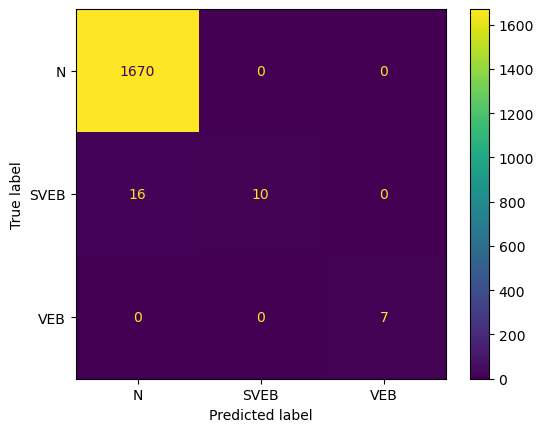

Fold 57:
  Test:  patient=56
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2840
         1.0       0.00      0.00      0.00         3
         2.0       0.50      0.57      0.53        21

    accuracy                           0.99      2864
   macro avg       0.50      0.52      0.51      2864
weighted avg       0.99      0.99      0.99      2864

                   0.0  1.0        2.0  accuracy    macro avg  weighted avg
precision     0.995775  NaN   0.500000   0.99162     0.498592      0.991096
recall        0.995775  0.0   0.571429   0.99162     0.522401      0.991620
f1-score      0.995775  NaN   0.533333   0.99162     0.509703      0.991341
support    2840.000000  3.0  21.000000   0.99162  2864.000000   2864.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\

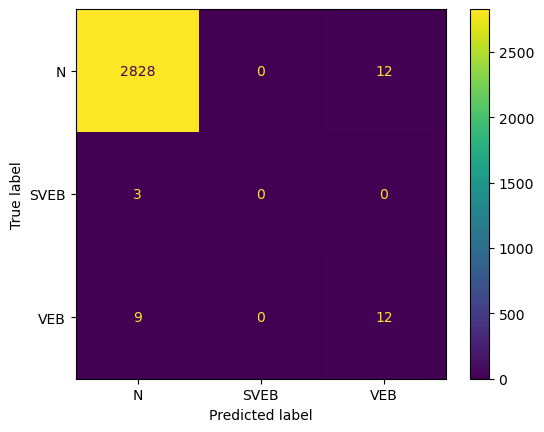

Fold 58:
  Test:  patient=57
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2311
         1.0       0.00      0.00      0.00         0
         2.0       0.80      1.00      0.89        12

    accuracy                           1.00      2323
   macro avg       0.60      0.67      0.63      2323
weighted avg       1.00      1.00      1.00      2323

                   0.0  1.0        2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.0   0.800000  0.997848     0.600000      0.998967
recall        0.997836  NaN   1.000000  0.997848     0.665945      0.997848
f1-score      0.998917  NaN   0.888889  0.997848     0.629269      0.998349
support    2311.000000  0.0  12.000000  0.997848  2323.000000   2323.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

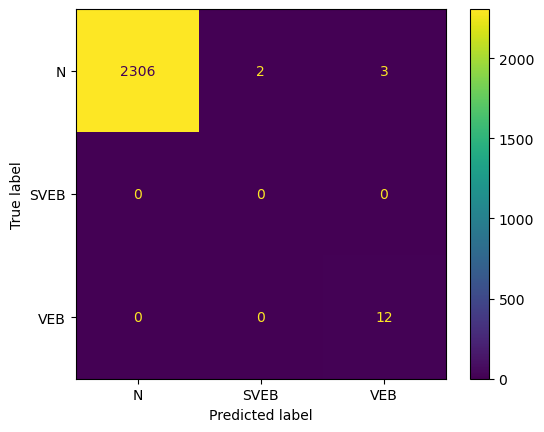

Fold 59:
  Test:  patient=58
              precision    recall  f1-score   support

         0.0       0.97      0.99      0.98      2065
         1.0       0.00      0.00      0.00         0
         2.0       0.74      0.31      0.43        81

    accuracy                           0.97      2146
   macro avg       0.57      0.43      0.47      2146
weighted avg       0.96      0.97      0.96      2146

                   0.0  1.0        2.0  accuracy    macro avg  weighted avg
precision     0.973384  0.0   0.735294  0.965983     0.569559      0.964397
recall        0.991768  NaN   0.308642  0.965983     0.433470      0.965983
f1-score      0.982490  NaN   0.434783  0.965983     0.472424      0.961817
support    2065.000000  0.0  81.000000  0.965983  2146.000000   2146.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

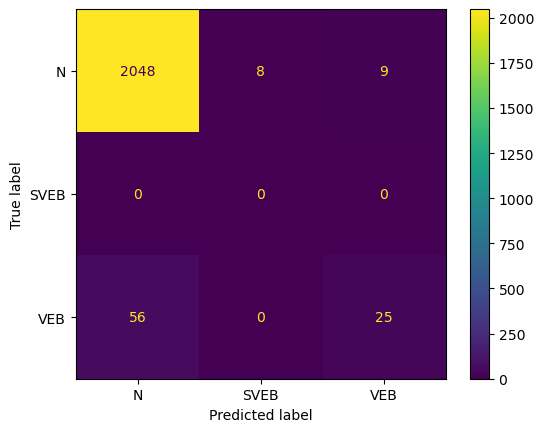

Fold 60:
  Test:  patient=59
              precision    recall  f1-score   support

         0.0       1.00      0.99      1.00      2473
         1.0       0.00      0.00      0.00         0
         2.0       0.00      0.00      0.00         0

    accuracy                           0.99      2473
   macro avg       0.33      0.33      0.33      2473
weighted avg       1.00      0.99      1.00      2473

                   0.0  1.0  2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.0  0.0  0.994743     0.333333      1.000000
recall        0.994743  NaN  NaN  0.994743     0.331581      0.994743
f1-score      0.997365  NaN  NaN  0.994743     0.332455      0.997365
support    2473.000000  0.0  0.0  0.994743  2473.000000   2473.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

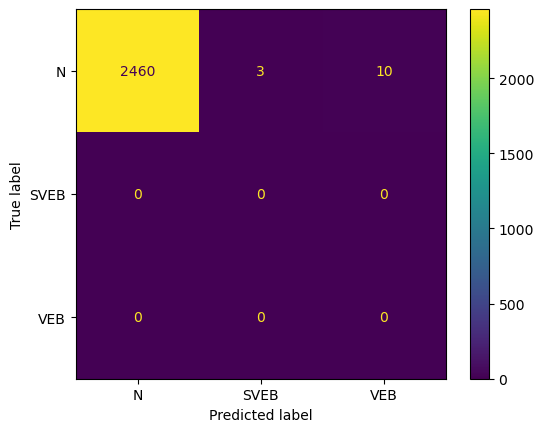

Fold 61:
  Test:  patient=60
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1451
         1.0       0.00      0.00      0.00         1

    accuracy                           1.00      1452
   macro avg       0.50      0.50      0.50      1452
weighted avg       1.00      1.00      1.00      1452

                   0.0  1.0  accuracy    macro avg  weighted avg
precision     0.999311  NaN  0.999311     0.499656      0.998623
recall        1.000000  0.0  0.999311     0.500000      0.999311
f1-score      0.999656  NaN  0.999311     0.499828      0.998967
support    1451.000000  1.0  0.999311  1452.000000   1452.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\

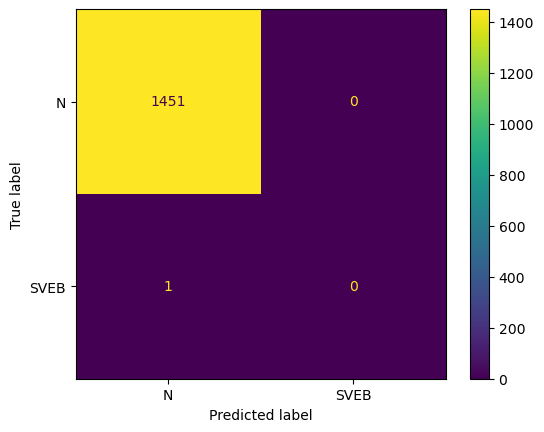

Fold 62:
  Test:  patient=61
              precision    recall  f1-score   support

         0.0       0.94      1.00      0.97      1451
         1.0       0.00      0.00      0.00         9
         2.0       0.99      0.90      0.94       795

    accuracy                           0.96      2255
   macro avg       0.65      0.63      0.64      2255
weighted avg       0.96      0.96      0.96      2255

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.942559  0.0    0.993036  0.956541     0.645198      0.956593
recall        0.995176  0.0    0.896855  0.956541     0.630677      0.956541
f1-score      0.968153  0.0    0.942498  0.956541     0.636884      0.955244
support    1451.000000  9.0  795.000000  0.956541  2255.000000   2255.000000


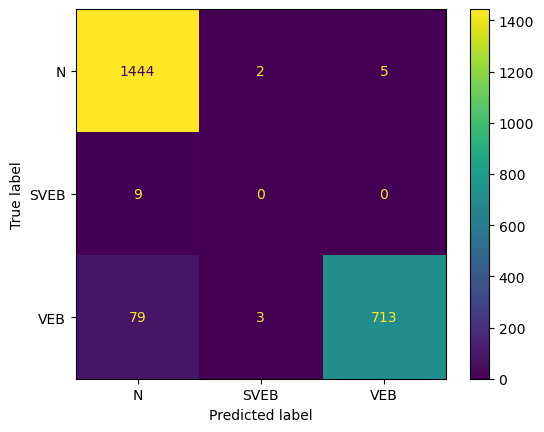

Fold 63:
  Test:  patient=62
              precision    recall  f1-score   support

         0.0       0.99      1.00      0.99      1845
         1.0       0.00      0.00      0.00         1
         2.0       0.98      0.81      0.89       138

    accuracy                           0.98      1984
   macro avg       0.66      0.60      0.63      1984
weighted avg       0.99      0.98      0.98      1984

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.986602  0.0    0.982456  0.984375     0.656353      0.985817
recall        0.997832  0.0    0.811594  0.984375     0.603142      0.984375
f1-score      0.992185  0.0    0.888889  0.984375     0.627025      0.984500
support    1845.000000  1.0  138.000000  0.984375  1984.000000   1984.000000


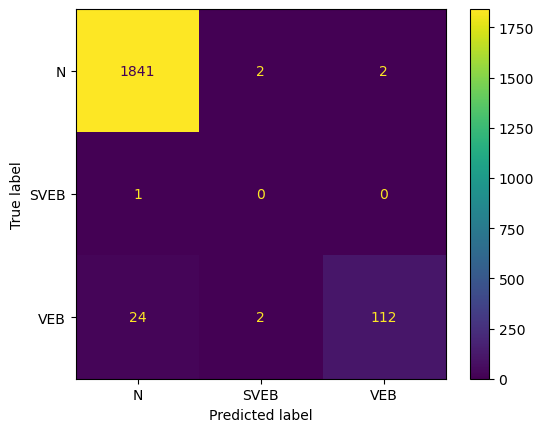

Fold 64:
  Test:  patient=63
              precision    recall  f1-score   support

         0.0       1.00      0.98      0.99      1885
         1.0       0.00      0.00      0.00         0
         2.0       0.38      1.00      0.55        23

    accuracy                           0.98      1908
   macro avg       0.46      0.66      0.51      1908
weighted avg       0.99      0.98      0.98      1908

                   0.0  1.0        2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.0   0.377049  0.976939     0.459016      0.992491
recall        0.976658  NaN   1.000000  0.976939     0.658886      0.976939
f1-score      0.988191  NaN   0.547619  0.976939     0.511937      0.982880
support    1885.000000  0.0  23.000000  0.976939  1908.000000   1908.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

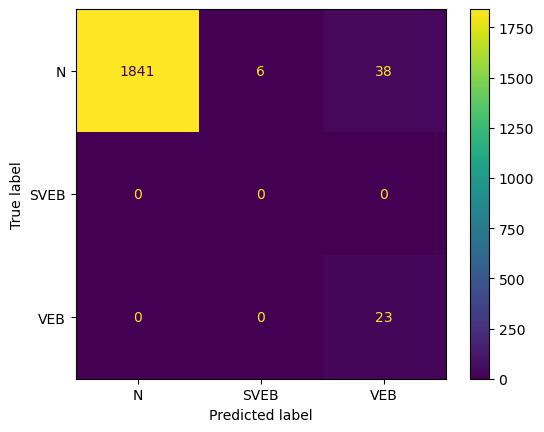

Fold 65:
  Test:  patient=64
              precision    recall  f1-score   support

         0.0       0.98      0.97      0.98      2271
         1.0       0.00      0.00      0.00         5
         2.0       0.97      0.90      0.93       382

    accuracy                           0.96      2658
   macro avg       0.65      0.62      0.64      2658
weighted avg       0.98      0.96      0.97      2658

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.982222  0.0    0.971751  0.960873     0.651325      0.978870
recall        0.973140  0.0    0.900524  0.960873     0.624554      0.960873
f1-score      0.977660  0.0    0.934783  0.960873     0.637481      0.969659
support    2271.000000  5.0  382.000000  0.960873  2658.000000   2658.000000


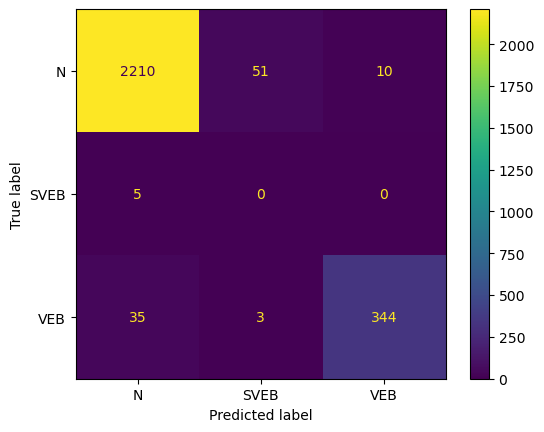

Fold 66:
  Test:  patient=65
              precision    recall  f1-score   support

         0.0       1.00      0.97      0.98      2137
         1.0       0.00      0.00      0.00         1
         2.0       0.92      0.99      0.95       200

    accuracy                           0.97      2338
   macro avg       0.64      0.65      0.65      2338
weighted avg       0.99      0.97      0.98      2338

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.999516  0.0    0.920930  0.968349     0.640149      0.992366
recall        0.966776  0.0    0.990000  0.968349     0.652259      0.968349
f1-score      0.982873  0.0    0.954217  0.968349     0.645697      0.980002
support    2137.000000  1.0  200.000000  0.968349  2338.000000   2338.000000


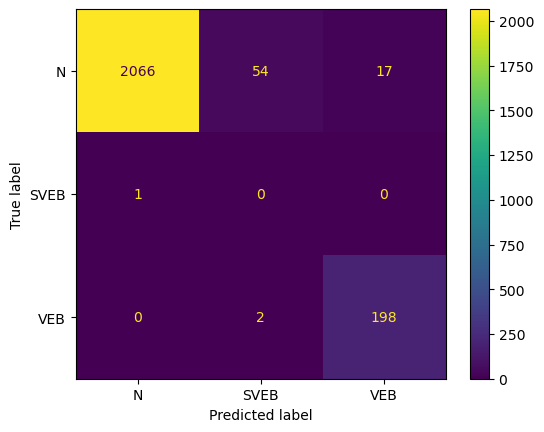

Fold 67:
  Test:  patient=66
              precision    recall  f1-score   support

         0.0       1.00      0.98      0.99      2436
         1.0       0.00      0.00      0.00         5
         2.0       0.98      0.98      0.98       531

    accuracy                           0.98      2972
   macro avg       0.66      0.65      0.66      2972
weighted avg       0.99      0.98      0.99      2972

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.997078  0.0    0.981203  0.979475     0.659427      0.992565
recall        0.980706  0.0    0.983051  0.979475     0.654586      0.979475
f1-score      0.988825  0.0    0.982126  0.979475     0.656984      0.985964
support    2436.000000  5.0  531.000000  0.979475  2972.000000   2972.000000


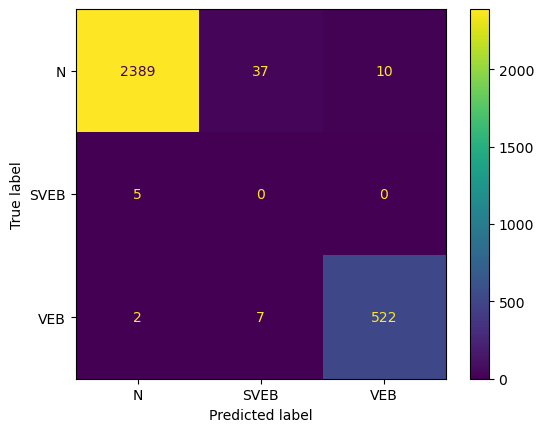

Fold 68:
  Test:  patient=67
              precision    recall  f1-score   support

         0.0       1.00      0.97      0.99      2480
         1.0       0.00      0.00      0.00         2
         2.0       0.99      0.99      0.99       161

    accuracy                           0.97      2643
   macro avg       0.66      0.66      0.66      2643
weighted avg       1.00      0.97      0.98      2643

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.998757  0.0    0.987654  0.972758     0.662137      0.997325
recall        0.972177  0.0    0.993789  0.972758     0.655322      0.972758
f1-score      0.985288  0.0    0.990712  0.972758     0.658667      0.984873
support    2480.000000  2.0  161.000000  0.972758  2643.000000   2643.000000


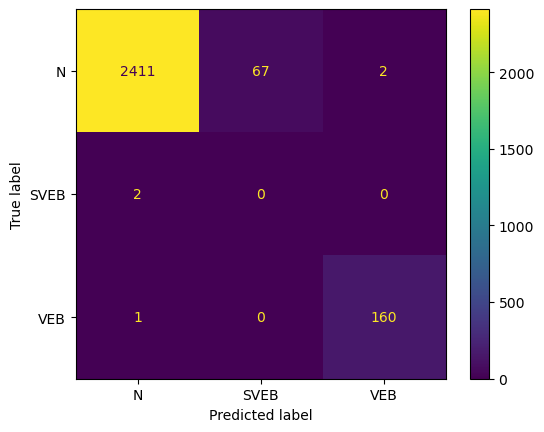

Fold 69:
  Test:  patient=68
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1998
         1.0       0.00      0.00      0.00         1
         2.0       0.99      0.99      0.99       167

    accuracy                           1.00      2166
   macro avg       0.66      0.66      0.66      2166
weighted avg       1.00      1.00      1.00      2166

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.998999  0.0    0.994012  0.998153     0.664337      0.998153
recall        0.998999  0.0    0.994012  0.998153     0.664337      0.998153
f1-score      0.998999  0.0    0.994012  0.998153     0.664337      0.998153
support    1998.000000  1.0  167.000000  0.998153  2166.000000   2166.000000


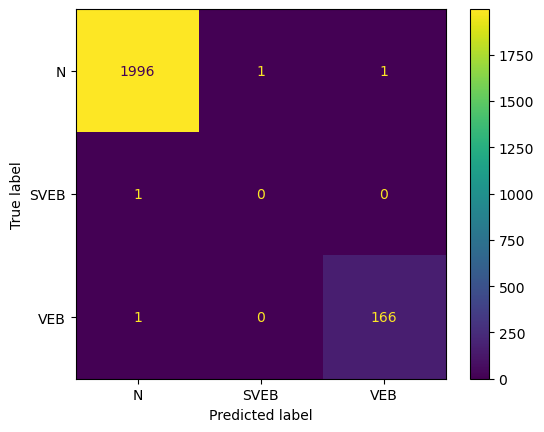

Fold 70:
  Test:  patient=69
              precision    recall  f1-score   support

         0.0       0.95      0.70      0.80      1539
         1.0       0.36      0.58      0.44       126
         2.0       0.00      0.00      0.00         0

    accuracy                           0.69      1665
   macro avg       0.44      0.43      0.42      1665
weighted avg       0.91      0.69      0.78      1665

                   0.0         1.0  2.0  accuracy    macro avg  weighted avg
precision     0.952847    0.359606  0.0  0.687087     0.437484      0.907953
recall        0.695906    0.579365  NaN  0.687087     0.425091      0.687087
f1-score      0.804356    0.443769  NaN  0.687087     0.416042      0.777068
support    1539.000000  126.000000  0.0  0.687087  1665.000000   1665.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

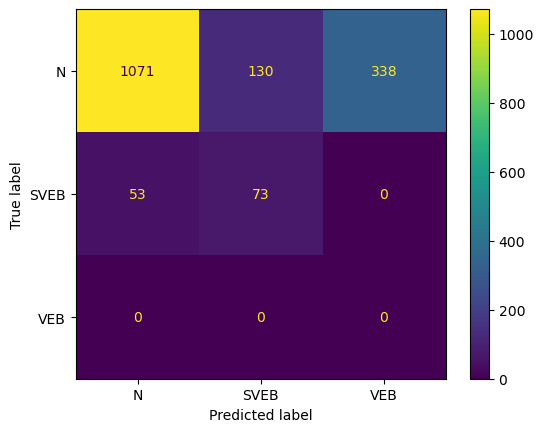

Fold 71:
  Test:  patient=70
              precision    recall  f1-score   support

         0.0       1.00      0.87      0.93      1634
         1.0       0.16      0.94      0.28        35
         2.0       0.00      0.00      0.00         0

    accuracy                           0.88      1669
   macro avg       0.39      0.61      0.40      1669
weighted avg       0.98      0.88      0.92      1669

                   0.0        1.0  2.0  accuracy    macro avg  weighted avg
precision     0.998601   0.163366  0.0  0.875374     0.387323      0.981086
recall        0.873929   0.942857  NaN  0.875374     0.605595      0.875374
f1-score      0.932115   0.278481  NaN  0.875374     0.403532      0.918408
support    1634.000000  35.000000  0.0  0.875374  1669.000000   1669.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

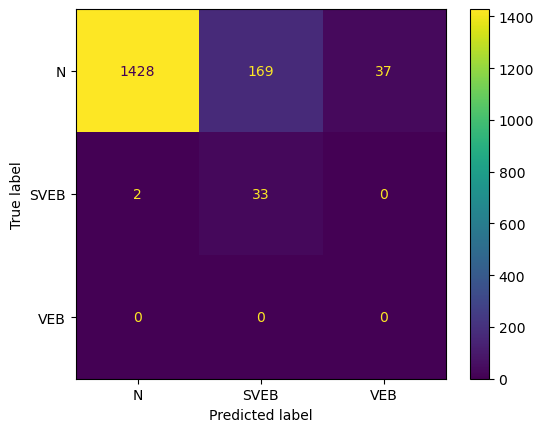

Fold 72:
  Test:  patient=71
              precision    recall  f1-score   support

         0.0       1.00      0.95      0.97      1874
         1.0       0.09      0.62      0.16         8
         2.0       0.88      0.99      0.93       386

    accuracy                           0.95      2268
   macro avg       0.66      0.85      0.69      2268
weighted avg       0.97      0.95      0.96      2268

                   0.0       1.0         2.0  accuracy    macro avg  \
precision     0.996625  0.092593    0.876147   0.95194     0.655122   
recall        0.945571  0.625000    0.989637   0.95194     0.853403   
f1-score      0.970427  0.161290    0.929440   0.95194     0.687053   
support    1874.000000  8.000000  386.000000   0.95194  2268.000000   

           weighted avg  
precision      0.972932  
recall         0.951940  
f1-score       0.960597  
support     2268.000000  


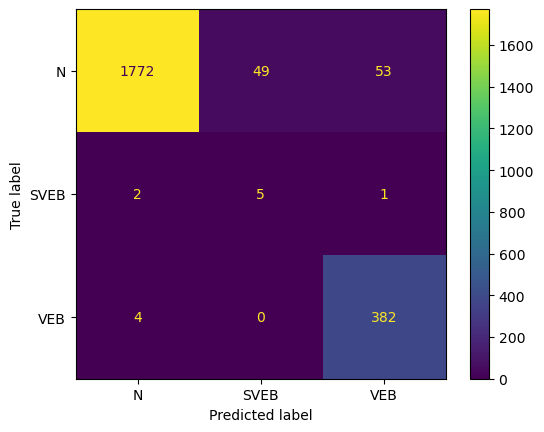

Fold 73:
  Test:  patient=72
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1888
         1.0       0.90      0.84      0.87        32
         2.0       0.97      0.96      0.96        70

    accuracy                           0.99      1990
   macro avg       0.96      0.93      0.94      1990
weighted avg       0.99      0.99      0.99      1990

                   0.0        1.0        2.0  accuracy    macro avg  \
precision     0.995769   0.900000   0.971014  0.993467     0.955595   
recall        0.997352   0.843750   0.957143  0.993467     0.932748   
f1-score      0.996560   0.870968   0.964029  0.993467     0.943852   
support    1888.000000  32.000000  70.000000  0.993467  1990.000000   

           weighted avg  
precision      0.993359  
recall         0.993467  
f1-score       0.993396  
support     1990.000000  


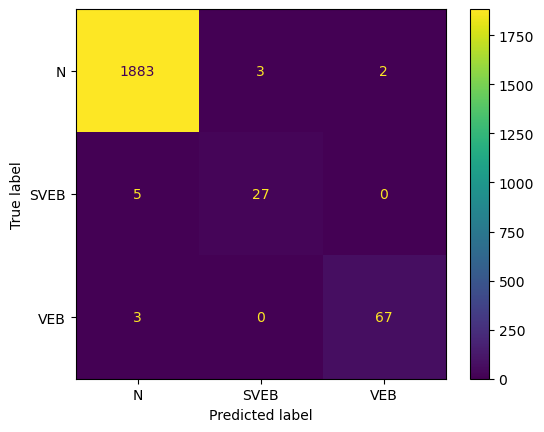

Fold 74:
  Test:  patient=73


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2081
         1.0       0.00      0.00      0.00         0
         2.0       1.00      1.00      1.00       274

    accuracy                           1.00      2355
   macro avg       0.67      0.67      0.67      2355
weighted avg       1.00      1.00      1.00      2355

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.0    0.996364  0.999151     0.665455      0.999577
recall        0.999039  NaN    1.000000  0.999151     0.666346      0.999151
f1-score      0.999519  NaN    0.998179  0.999151     0.665899      0.999363
support    2081.000000  0.0  274.000000  0.999151  2355.000000   2355.000000


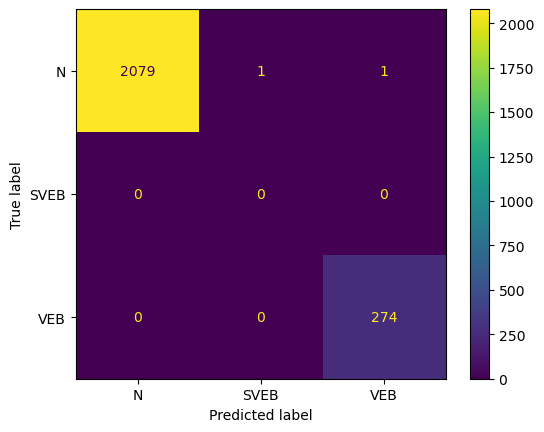

Fold 75:
  Test:  patient=74
              precision    recall  f1-score   support

         0.0       0.99      1.00      1.00      1482
         2.0       1.00      0.98      0.99       612

    accuracy                           0.99      2094
   macro avg       1.00      0.99      0.99      2094
weighted avg       0.99      0.99      0.99      2094

                   0.0         2.0  accuracy    macro avg  weighted avg
precision     0.992632    1.000000  0.994747     0.996316      0.994786
recall        1.000000    0.982026  0.994747     0.991013      0.994747
f1-score      0.996303    0.990932  0.994747     0.993617      0.994733
support    1482.000000  612.000000  0.994747  2094.000000   2094.000000


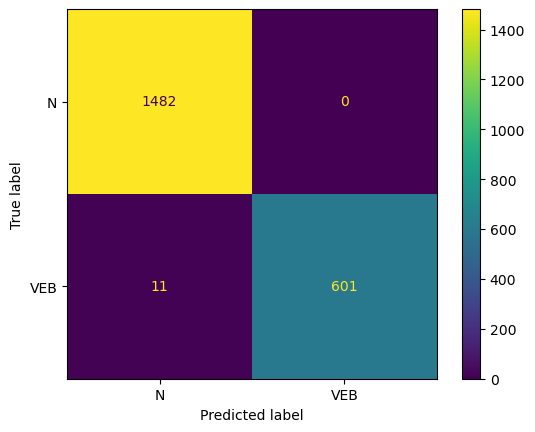

C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\numpy\core\fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\numpy\core\_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [17]:
from sklearn.model_selection import LeaveOneGroupOut
import time
X=df_cardio.drop('type',axis=1)
y=df_cardio['type']
groups=df_cardio['patient']
skf = LeaveOneGroupOut()


start_time=time.time()
df_smote, acc_smote,confusion_matrix_final,list_f = cross_valid(pipe_smote, skf, X, y,groups)
end_time=time.time()

In [18]:
df_smote

,0.0,1.0,2.0,macro avg,weighted avg
f1-score,0.978471,0.254832,0.770841,0.622649,0.972743
precision,0.993314,0.130671,0.713212,0.623911,0.985406
recall,0.965499,0.393907,0.885142,0.679520,0.963223
support,2047.280000,27.577465,270.270270,2340.053333,2340.053333


In [19]:
print("Time"+str(end_time-start_time))

Time166.06485629081726


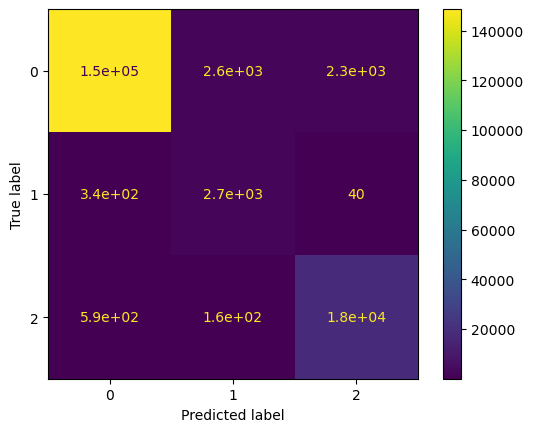

In [20]:
ConfusionMatrixDisplay(confusion_matrix_final).plot()

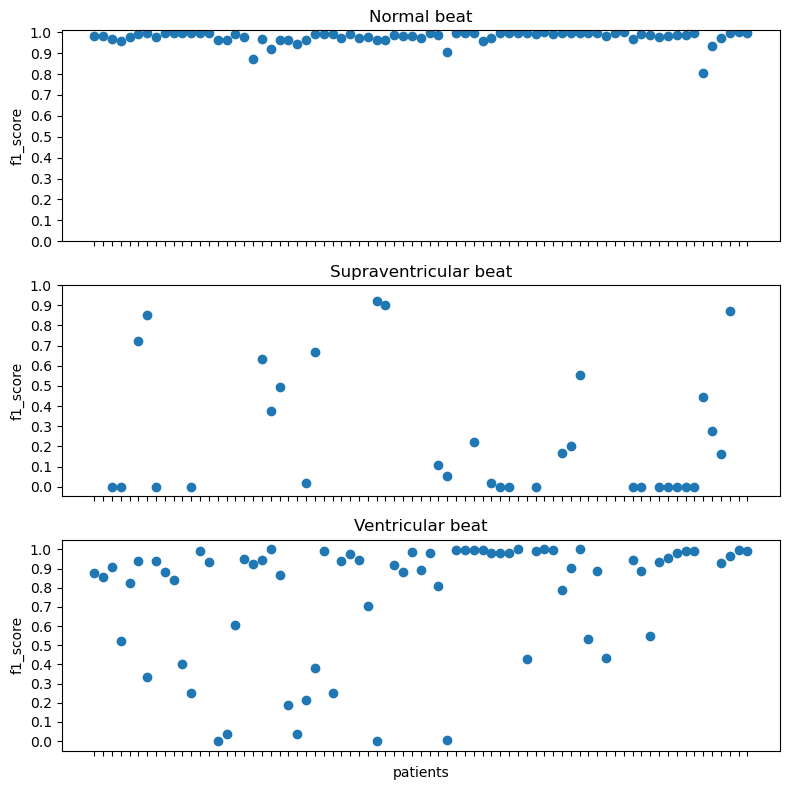

In [21]:
print_plot(list_f)

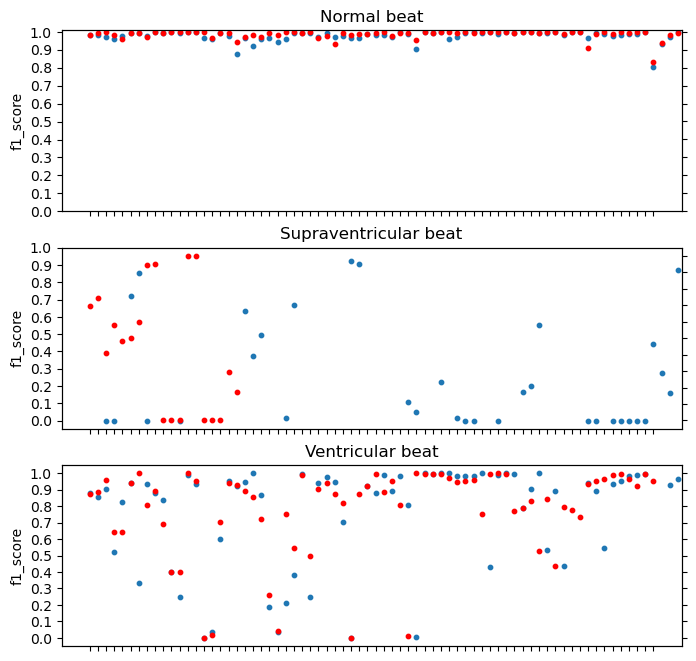

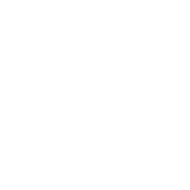

In [22]:
compare_plots(list_f1score,list_f)

In [23]:
pipe_smote_PCA = Pipeline([
        ('sampling', SMOTE(random_state = 123)),
        ('scaler', StandardScaler()),  
        ("pca", PCA()),
        ('classification', KNeighborsClassifier(n_neighbors=10))
    ])
pipe_smote_PCA

Pipeline(steps=[('sampling', SMOTE(random_state=123)),
                ('scaler', StandardScaler()), ('pca', PCA()),
                ('classification', KNeighborsClassifier(n_neighbors=10))])

Fold 1:
  Test:  patient=0
              precision    recall  f1-score   support

         0.0       1.00      0.98      0.99      2411
         2.0       0.87      0.99      0.93       344

    accuracy                           0.98      2755
   macro avg       0.93      0.99      0.96      2755
weighted avg       0.98      0.98      0.98      2755

                   0.0         2.0  accuracy    macro avg  weighted avg
precision     0.999153    0.865823  0.980036     0.932488      0.982504
recall        0.978017    0.994186  0.980036     0.986102      0.980036
f1-score      0.988472    0.925575  0.980036     0.957024      0.980618
support    2411.000000  344.000000  0.980036  2755.000000   2755.000000


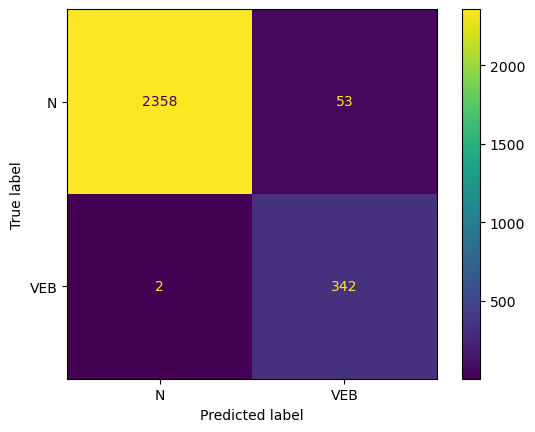

Fold 2:
  Test:  patient=1
              precision    recall  f1-score   support

         0.0       1.00      0.94      0.97      2443
         2.0       0.61      0.97      0.75       229

    accuracy                           0.94      2672
   macro avg       0.80      0.95      0.86      2672
weighted avg       0.96      0.94      0.95      2672

                   0.0         2.0  accuracy    macro avg  weighted avg
precision     0.996535    0.608815  0.943862     0.802675      0.963306
recall        0.941875    0.965066  0.943862     0.953470      0.943862
f1-score      0.968434    0.746622  0.943862     0.857528      0.949424
support    2443.000000  229.000000  0.943862  2672.000000   2672.000000


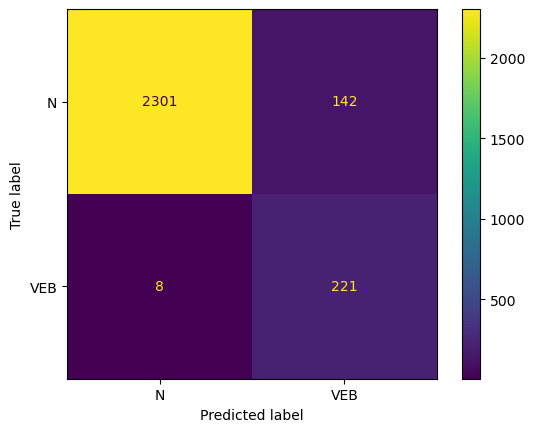

Fold 3:
  Test:  patient=2
              precision    recall  f1-score   support

         0.0       1.00      0.94      0.97      2323
         1.0       0.01      1.00      0.03         2
         2.0       0.99      1.00      1.00       125

    accuracy                           0.94      2450
   macro avg       0.67      0.98      0.66      2450
weighted avg       1.00      0.94      0.97      2450

                   0.0       1.0         2.0  accuracy    macro avg  \
precision     1.000000  0.013333    0.992063  0.939184     0.668466   
recall        0.935859  1.000000    1.000000  0.939184     0.978620   
f1-score      0.966867  0.026316    0.996016  0.939184     0.663066   
support    2323.000000  2.000000  125.000000  0.939184  2450.000000   

           weighted avg  
precision      0.998790  
recall         0.939184  
f1-score       0.967586  
support     2450.000000  


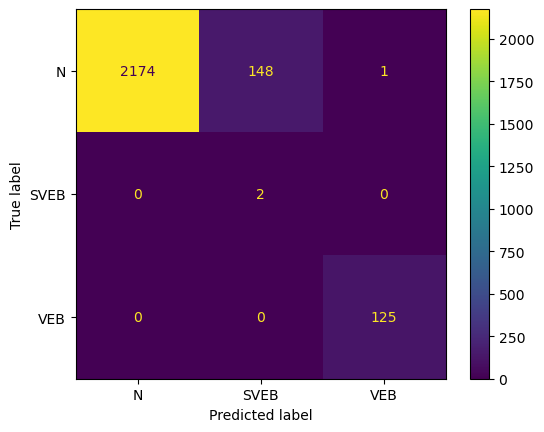

Fold 4:
  Test:  patient=3
              precision    recall  f1-score   support

         0.0       0.98      0.99      0.99      2268
         1.0       1.00      0.06      0.12        16
         2.0       0.83      0.79      0.81       121

    accuracy                           0.98      2405
   macro avg       0.94      0.61      0.64      2405
weighted avg       0.98      0.98      0.97      2405

                   0.0        1.0         2.0  accuracy    macro avg  \
precision     0.982962   1.000000    0.826087  0.975468     0.936350   
recall        0.992063   0.062500    0.785124  0.975468     0.613229   
f1-score      0.987492   0.117647    0.805085  0.975468     0.636741   
support    2268.000000  16.000000  121.000000  0.975468  2405.000000   

           weighted avg  
precision      0.975183  
recall         0.975468  
f1-score       0.972528  
support     2405.000000  


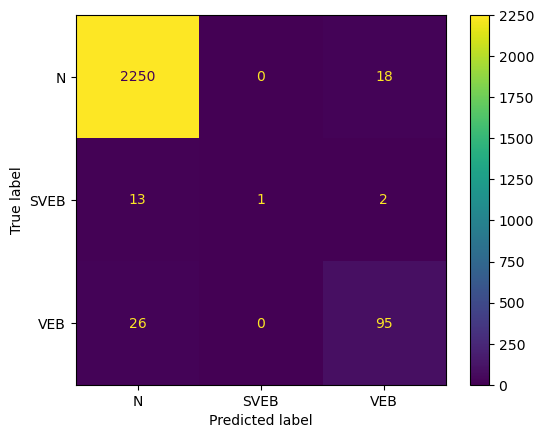

Fold 5:
  Test:  patient=4
              precision    recall  f1-score   support

         0.0       0.97      1.00      0.99      1518
         1.0       0.00      0.00      0.00         0
         2.0       1.00      0.83      0.90       247

    accuracy                           0.97      1765
   macro avg       0.66      0.61      0.63      1765
weighted avg       0.98      0.97      0.97      1765

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.973042  0.0    0.995122  0.974504     0.656055      0.976132
recall        0.998682  NaN    0.825911  0.974504     0.608198      0.974504
f1-score      0.985696  NaN    0.902655  0.974504     0.629450      0.974075
support    1518.000000  0.0  247.000000  0.974504  1765.000000   1765.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

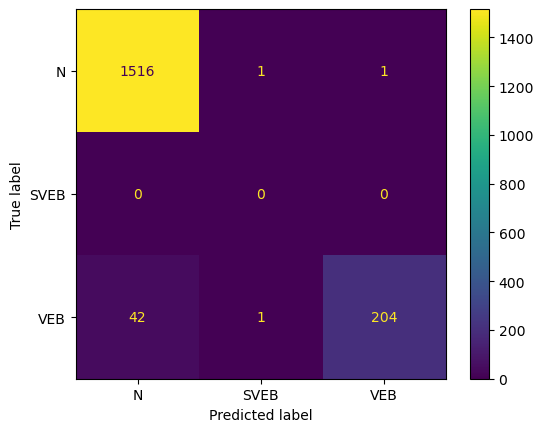

Fold 6:
  Test:  patient=5
              precision    recall  f1-score   support

         0.0       1.00      0.99      0.99      2434
         1.0       0.59      1.00      0.74        48
         2.0       1.00      1.00      1.00         9

    accuracy                           0.99      2491
   macro avg       0.86      1.00      0.91      2491
weighted avg       0.99      0.99      0.99      2491

                   0.0        1.0  2.0  accuracy    macro avg  weighted avg
precision     1.000000   0.585366  1.0  0.986351     0.861789      0.992010
recall        0.986031   1.000000  1.0  0.986351     0.995344      0.986351
f1-score      0.992966   0.738462  1.0  0.986351     0.910476      0.988088
support    2434.000000  48.000000  9.0  0.986351  2491.000000   2491.000000


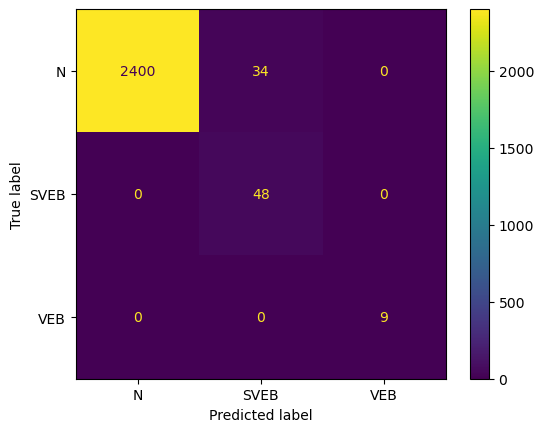

Fold 7:
  Test:  patient=6
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2638
         1.0       0.90      0.95      0.93        65
         2.0       0.50      1.00      0.67         1

    accuracy                           1.00      2704
   macro avg       0.80      0.98      0.86      2704
weighted avg       1.00      1.00      1.00      2704

                   0.0        1.0       2.0  accuracy    macro avg  \
precision     0.999240   0.898551  0.500000  0.996302     0.799264   
recall        0.997346   0.953846  1.000000  0.996302     0.983731   
f1-score      0.998293   0.925373  0.666667  0.996302     0.863444   
support    2638.000000  65.000000  1.000000  0.996302  2704.000000   

           weighted avg  
precision      0.996635  
recall         0.996302  
f1-score       0.996417  
support     2704.000000  


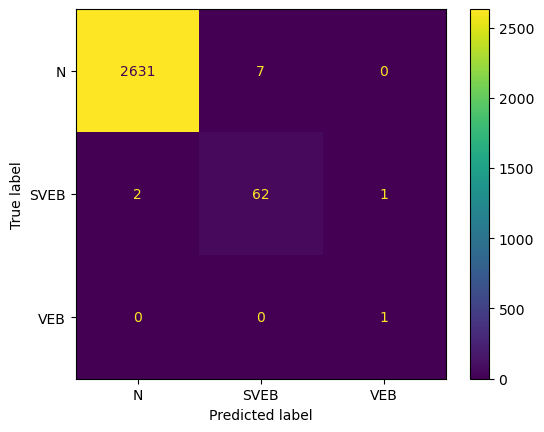

Fold 8:
  Test:  patient=7
              precision    recall  f1-score   support

         0.0       0.99      0.98      0.99      1776
         1.0       0.03      0.50      0.05         2
         2.0       0.98      0.93      0.95       350

    accuracy                           0.97      2128
   macro avg       0.67      0.80      0.66      2128
weighted avg       0.99      0.97      0.98      2128

                   0.0       1.0         2.0  accuracy    macro avg  \
precision     0.991458  0.025000    0.978916  0.971335     0.665125   
recall        0.980293  0.500000    0.928571  0.971335     0.802955   
f1-score      0.985844  0.047619    0.953079  0.971335     0.662181   
support    1776.000000  2.000000  350.000000  0.971335  2128.000000   

           weighted avg  
precision      0.988487  
recall         0.971335  
f1-score       0.979573  
support     2128.000000  


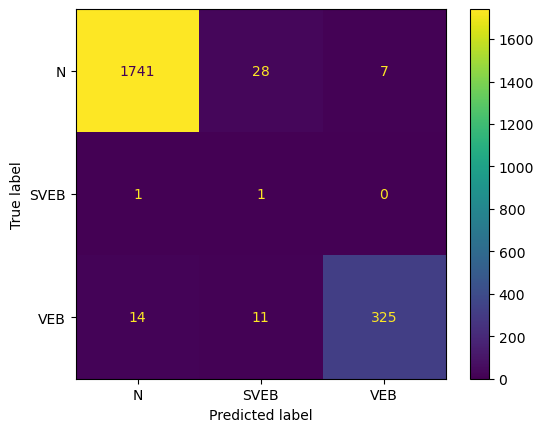

Fold 9:
  Test:  patient=8


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       1.00      0.99      0.99      2946
         1.0       0.00      0.00      0.00         0
         2.0       0.93      0.95      0.94        41

    accuracy                           0.99      2987
   macro avg       0.64      0.65      0.64      2987
weighted avg       1.00      0.99      0.99      2987

                   0.0  1.0        2.0  accuracy    macro avg  weighted avg
precision     0.999656  0.0   0.928571  0.985939     0.642742      0.998680
recall        0.986422  NaN   0.951220  0.985939     0.645881      0.985939
f1-score      0.992995  NaN   0.939759  0.985939     0.644251      0.992264
support    2946.000000  0.0  41.000000  0.985939  2987.000000   2987.000000


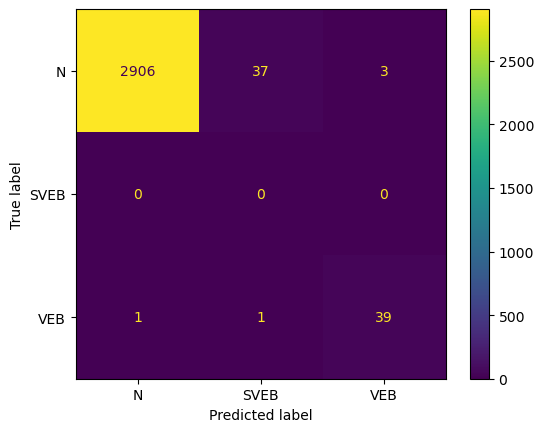

Fold 10:
  Test:  patient=9


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      3597
         1.0       0.00      0.00      0.00         0
         2.0       0.99      1.00      0.99        83

    accuracy                           1.00      3680
   macro avg       0.66      0.67      0.66      3680
weighted avg       1.00      1.00      1.00      3680

                   0.0  1.0        2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.0   0.988095   0.99837     0.662698      0.999731
recall        0.998332  NaN   1.000000   0.99837     0.666111      0.998370
f1-score      0.999165  NaN   0.994012   0.99837     0.664392      0.999049
support    3597.000000  0.0  83.000000   0.99837  3680.000000   3680.000000


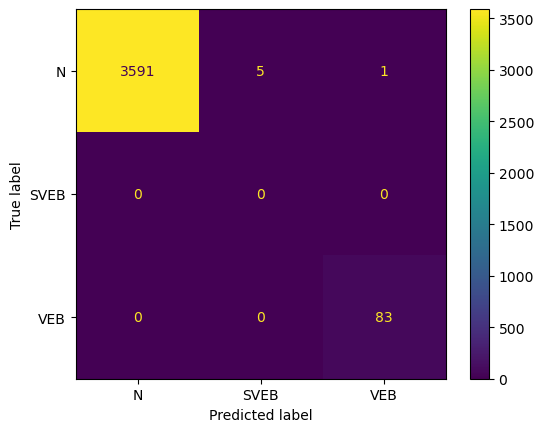

Fold 11:
  Test:  patient=10


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       1.00      0.98      0.99      2076
         1.0       0.00      0.00      0.00         0
         2.0       0.43      0.75      0.55         4

    accuracy                           0.98      2080
   macro avg       0.48      0.58      0.51      2080
weighted avg       1.00      0.98      0.99      2080

                   0.0  1.0       2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.0  0.428571  0.978846     0.476190      0.998901
recall        0.979287  NaN  0.750000  0.978846     0.576429      0.978846
f1-score      0.989535  NaN  0.545455  0.978846     0.511663      0.988681
support    2076.000000  0.0  4.000000  0.978846  2080.000000   2080.000000


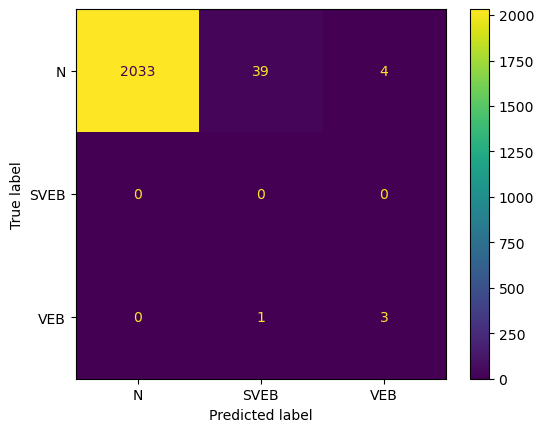

Fold 12:
  Test:  patient=11
              precision    recall  f1-score   support

         0.0       1.00      0.99      1.00      2798
         1.0       0.07      1.00      0.13         1
         2.0       0.33      0.83      0.48         6

    accuracy                           0.99      2805
   macro avg       0.47      0.94      0.54      2805
weighted avg       1.00      0.99      0.99      2805

                   0.0       1.0       2.0  accuracy    macro avg  \
precision     0.999640  0.071429  0.333333  0.991444     0.468134   
recall        0.991780  1.000000  0.833333  0.991444     0.941704   
f1-score      0.995694  0.133333  0.476190  0.991444     0.535073   
support    2798.000000  1.000000  6.000000  0.991444  2805.000000   

           weighted avg  
precision      0.997884  
recall         0.991444  
f1-score       0.994276  
support     2805.000000  


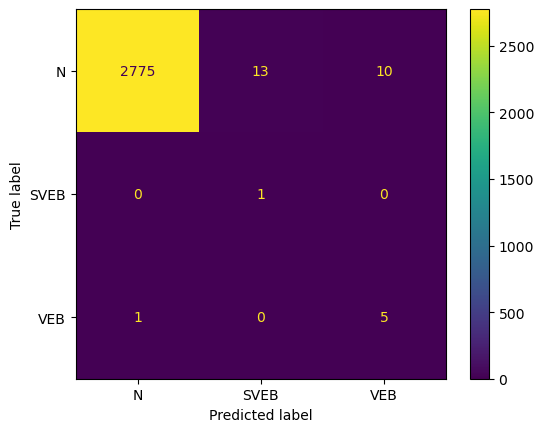

Fold 13:
  Test:  patient=12
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1791
         1.0       0.00      0.00      0.00         0
         2.0       0.98      1.00      0.99       230

    accuracy                           1.00      2021
   macro avg       0.66      0.67      0.66      2021
weighted avg       1.00      1.00      1.00      2021

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.0    0.978723  0.996536     0.659574      0.997579
recall        0.996092  NaN    1.000000  0.996536     0.665364      0.996536
f1-score      0.998042  NaN    0.989247  0.996536     0.662430      0.997041
support    1791.000000  0.0  230.000000  0.996536  2021.000000   2021.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

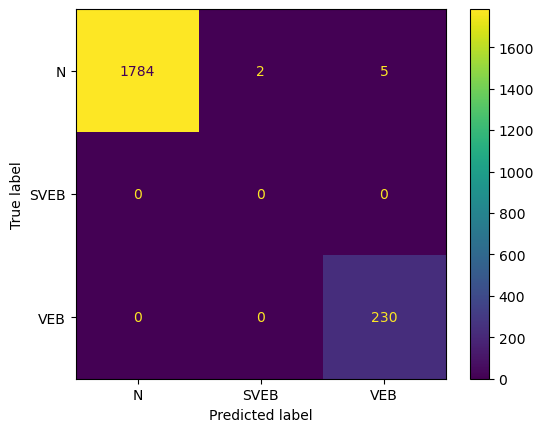

Fold 14:
  Test:  patient=13
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1800
         1.0       0.00      0.00      0.00         0
         2.0       0.97      1.00      0.98        64

    accuracy                           1.00      1864
   macro avg       0.66      0.67      0.66      1864
weighted avg       1.00      1.00      1.00      1864

                   0.0  1.0        2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.0   0.969697  0.996781     0.656566      0.998960
recall        0.996667  NaN   1.000000  0.996781     0.665556      0.996781
f1-score      0.998331  NaN   0.984615  0.996781     0.660982      0.997860
support    1800.000000  0.0  64.000000  0.996781  1864.000000   1864.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

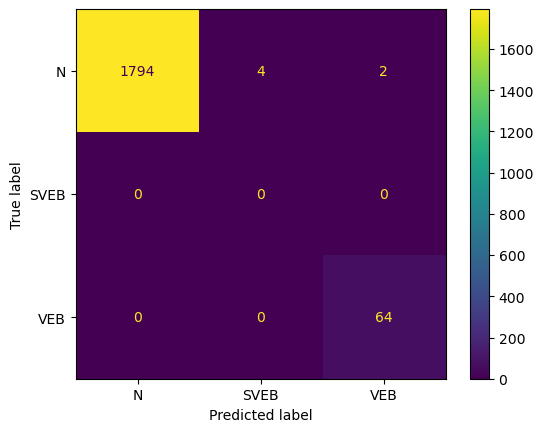

Fold 15:
  Test:  patient=14
              precision    recall  f1-score   support

         0.0       1.00      0.94      0.97      2630
         1.0       0.00      0.00      0.00         0
         2.0       1.00      0.67      0.80         3

    accuracy                           0.94      2633
   macro avg       0.67      0.54      0.59      2633
weighted avg       1.00      0.94      0.97      2633

                   0.0  1.0       2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.0  1.000000   0.94379     0.666667      1.000000
recall        0.944106  NaN  0.666667   0.94379     0.536924      0.943790
f1-score      0.971250  NaN  0.800000   0.94379     0.590417      0.971055
support    2630.000000  0.0  3.000000   0.94379  2633.000000   2633.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

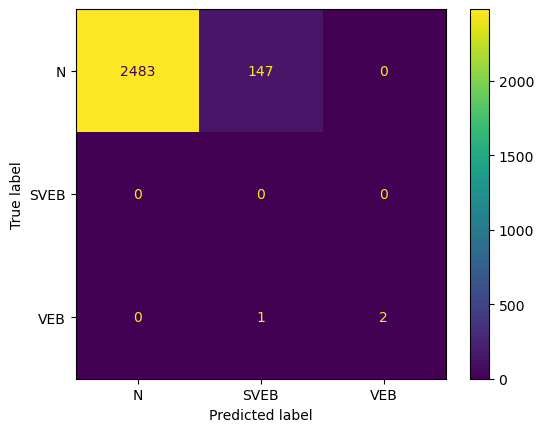

Fold 16:
  Test:  patient=15


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       1.00      0.98      0.99      1518
         1.0       0.00      0.00      0.00         0
         2.0       0.00      0.00      0.00         2

    accuracy                           0.98      1520
   macro avg       0.33      0.33      0.33      1520
weighted avg       1.00      0.98      0.99      1520

                   0.0  1.0  2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.0  0.0  0.981579     0.333333      0.998684
recall        0.982872  NaN  0.0  0.981579     0.327624      0.981579
f1-score      0.991362  NaN  0.0  0.981579     0.330454      0.990058
support    1518.000000  0.0  2.0  0.981579  1520.000000   1520.000000


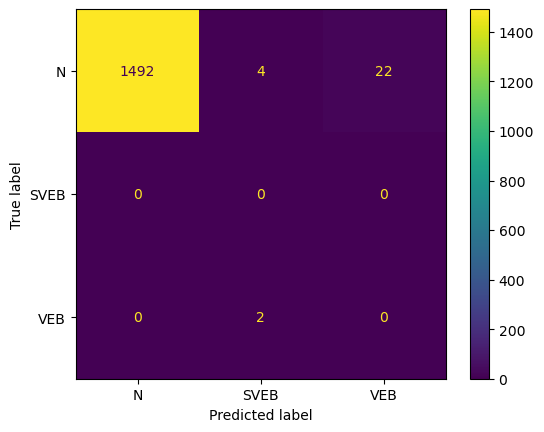

Fold 17:
  Test:  patient=16
              precision    recall  f1-score   support

         0.0       1.00      0.96      0.98      1644
         1.0       0.00      0.00      0.00         0
         2.0       0.05      0.11      0.07        27

    accuracy                           0.95      1671
   macro avg       0.35      0.36      0.35      1671
weighted avg       0.98      0.95      0.97      1671

                   0.0  1.0        2.0  accuracy    macro avg  weighted avg
precision     0.998107  0.0   0.047619  0.948534     0.348575      0.982749
recall        0.962287  NaN   0.111111  0.948534     0.357799      0.948534
f1-score      0.979870  NaN   0.066667  0.948534     0.348846      0.965114
support    1644.000000  0.0  27.000000  0.948534  1671.000000   1671.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

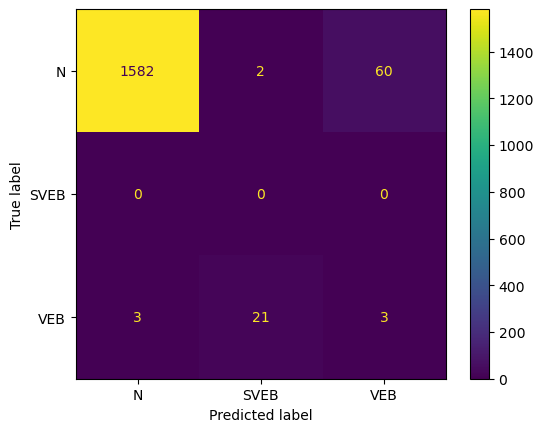

Fold 18:
  Test:  patient=17
              precision    recall  f1-score   support

         0.0       1.00      0.99      1.00      2660
         1.0       0.00      0.00      0.00         0
         2.0       0.96      0.96      0.96       366

    accuracy                           0.99      3026
   macro avg       0.65      0.65      0.65      3026
weighted avg       0.99      0.99      0.99      3026

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.998864  0.0    0.956640  0.988764     0.651835      0.993757
recall        0.992105  NaN    0.964481  0.988764     0.652195      0.988764
f1-score      0.995473  NaN    0.960544  0.988764     0.652006      0.991249
support    2660.000000  0.0  366.000000  0.988764  3026.000000   3026.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

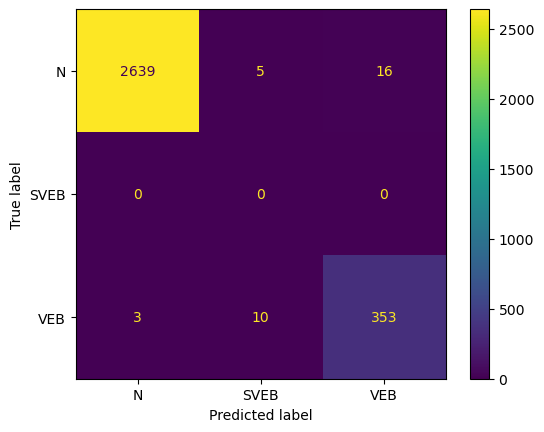

Fold 19:
  Test:  patient=18


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       1.00      0.94      0.97      1211
         1.0       0.00      0.00      0.00         0
         2.0       0.73      0.22      0.34       849

    accuracy                           0.64      2060
   macro avg       0.58      0.39      0.44      2060
weighted avg       0.89      0.64      0.71      2060

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.0    0.733333  0.642233     0.577778      0.890097
recall        0.938068  NaN    0.220259  0.642233     0.386109      0.642233
f1-score      0.968044  NaN    0.338768  0.642233     0.435604      0.708697
support    1211.000000  0.0  849.000000  0.642233  2060.000000   2060.000000


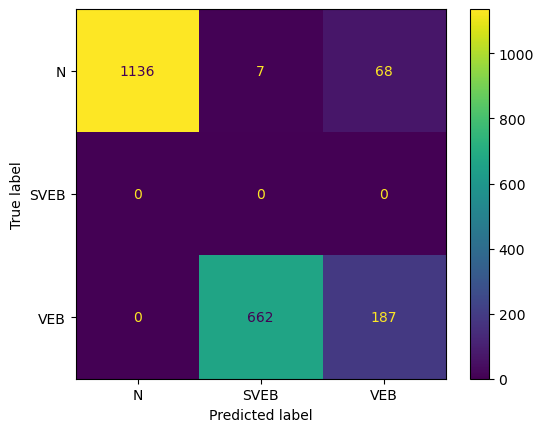

Fold 20:
  Test:  patient=19
              precision    recall  f1-score   support

         0.0       0.99      0.99      0.99      2360
         1.0       0.89      0.82      0.85       179
         2.0       0.98      0.98      0.98       110

    accuracy                           0.98      2649
   macro avg       0.95      0.93      0.94      2649
weighted avg       0.98      0.98      0.98      2649

                   0.0         1.0         2.0  accuracy    macro avg  \
precision     0.986099    0.890909    0.981818  0.979992     0.952942   
recall        0.991949    0.821229    0.981818  0.979992     0.931665   
f1-score      0.989016    0.854651    0.981818  0.979992     0.941828   
support    2360.000000  179.000000  110.000000  0.979992  2649.000000   

           weighted avg  
precision      0.979489  
recall         0.979992  
f1-score       0.979637  
support     2649.000000  


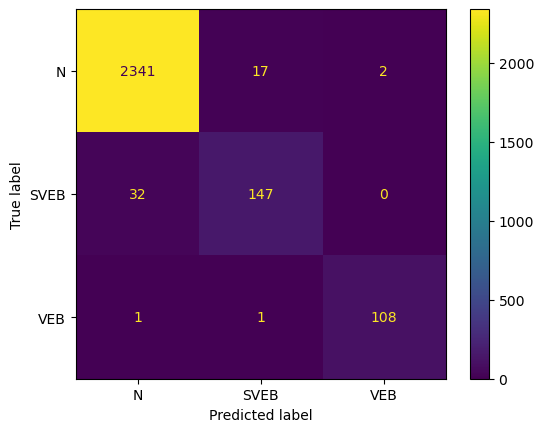

Fold 21:
  Test:  patient=20
              precision    recall  f1-score   support

         0.0       0.99      0.90      0.95      2070
         1.0       0.32      0.90      0.47       104
         2.0       1.00      1.00      1.00         8

    accuracy                           0.90      2182
   macro avg       0.77      0.94      0.81      2182
weighted avg       0.96      0.90      0.93      2182

                   0.0         1.0  2.0  accuracy    macro avg  weighted avg
precision     0.994687    0.321918  1.0  0.904675     0.772201      0.962640
recall        0.904348    0.903846  1.0  0.904675     0.936065      0.904675
f1-score      0.947368    0.474747  1.0  0.904675     0.807372      0.925035
support    2070.000000  104.000000  8.0  0.904675  2182.000000   2182.000000


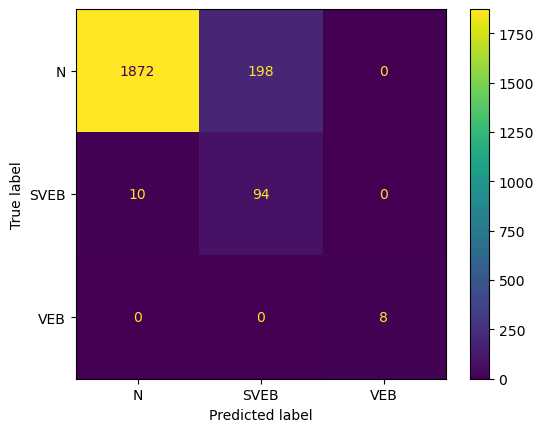

Fold 22:
  Test:  patient=21
              precision    recall  f1-score   support

         0.0       0.99      0.87      0.93      2814
         1.0       0.24      0.97      0.39       124
         2.0       0.99      0.84      0.91       185

    accuracy                           0.88      3123
   macro avg       0.74      0.90      0.74      3123
weighted avg       0.96      0.88      0.91      3123

                   0.0         1.0         2.0  accuracy    macro avg  \
precision     0.994346    0.244898    0.993631  0.876721     0.744291   
recall        0.874911    0.967742    0.843243  0.876721     0.895299   
f1-score      0.930813    0.390879    0.912281  0.876721     0.744658   
support    2814.000000  124.000000  185.000000  0.876721  3123.000000   

           weighted avg  
precision      0.964546  
recall         0.876721  
f1-score       0.908277  
support     3123.000000  


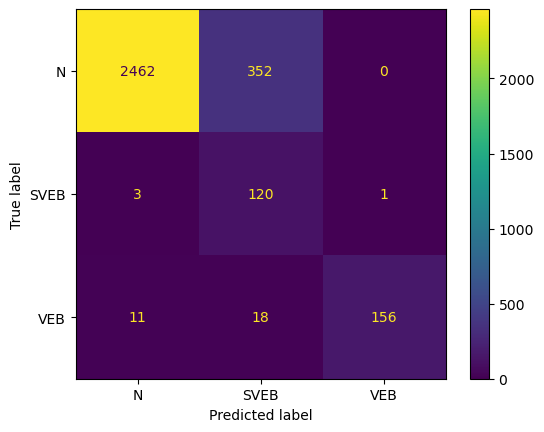

Fold 23:
  Test:  patient=22
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2190
         2.0       1.00      1.00      1.00        13

    accuracy                           1.00      2203
   macro avg       1.00      1.00      1.00      2203
weighted avg       1.00      1.00      1.00      2203

              0.0   2.0  accuracy  macro avg  weighted avg
precision     1.0   1.0       1.0        1.0           1.0
recall        1.0   1.0       1.0        1.0           1.0
f1-score      1.0   1.0       1.0        1.0           1.0
support    2190.0  13.0       1.0     2203.0        2203.0


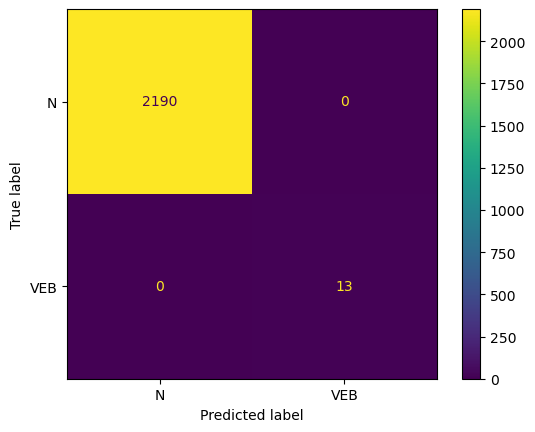

Fold 24:
  Test:  patient=23
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2563
         2.0       0.35      1.00      0.52         6

    accuracy                           1.00      2569
   macro avg       0.68      1.00      0.76      2569
weighted avg       1.00      1.00      1.00      2569

                   0.0       2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.352941  0.995718     0.676471      0.998489
recall        0.995708  1.000000  0.995718     0.997854      0.995718
f1-score      0.997849  0.521739  0.995718     0.759794      0.996737
support    2563.000000  6.000000  0.995718  2569.000000   2569.000000


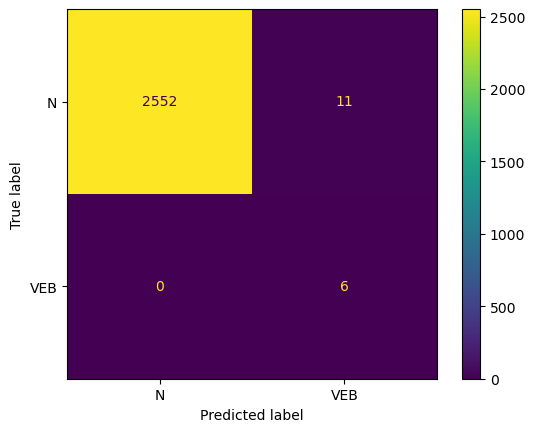

Fold 25:
  Test:  patient=24
              precision    recall  f1-score   support

         0.0       1.00      0.99      0.99      1703
         1.0       0.11      1.00      0.20         2
         2.0       0.00      0.00      0.00         5

    accuracy                           0.99      1710
   macro avg       0.37      0.66      0.40      1710
weighted avg       0.99      0.99      0.99      1710

                   0.0       1.0  2.0  accuracy    macro avg  weighted avg
precision     0.998227  0.111111  NaN  0.988889     0.369779      0.994271
recall        0.991779  1.000000  0.0  0.988889     0.663926      0.988889
f1-score      0.994993  0.200000  NaN  0.988889     0.398331      0.991153
support    1703.000000  2.000000  5.0  0.988889  1710.000000   1710.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\

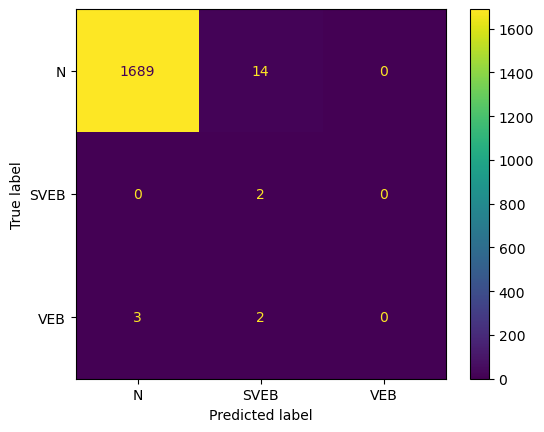

Fold 26:
  Test:  patient=25
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1496
         1.0       1.00      0.43      0.60         7
         2.0       0.60      0.75      0.67         4

    accuracy                           1.00      1507
   macro avg       0.87      0.73      0.76      1507
weighted avg       1.00      1.00      1.00      1507

                   0.0       1.0       2.0  accuracy    macro avg  \
precision     0.997999  1.000000  0.600000  0.996682     0.866000   
recall        1.000000  0.428571  0.750000  0.996682     0.726190   
f1-score      0.998998  0.600000  0.666667  0.996682     0.755222   
support    1496.000000  7.000000  4.000000  0.996682  1507.000000   

           weighted avg  
precision      0.996952  
recall         0.996682  
f1-score       0.996263  
support     1507.000000  


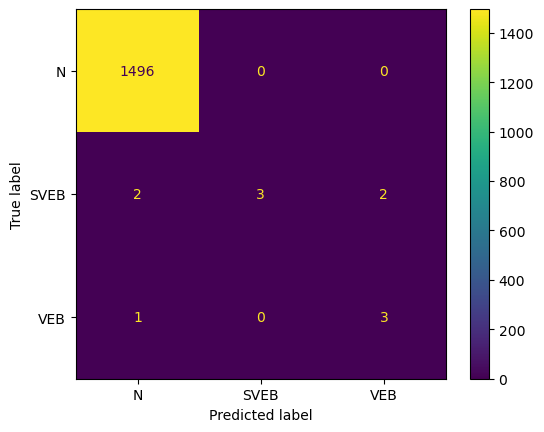

Fold 27:
  Test:  patient=26
              precision    recall  f1-score   support

         0.0       1.00      0.99      0.99      1884
         1.0       0.00      0.00      0.00         0
         2.0       0.99      1.00      1.00       719

    accuracy                           0.99      2603
   macro avg       0.66      0.66      0.66      2603
weighted avg       1.00      0.99      0.99      2603

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.998927  0.0    0.994452   0.99078     0.664460      0.997691
recall        0.988323  NaN    0.997218   0.99078     0.661847      0.990780
f1-score      0.993597  NaN    0.995833   0.99078     0.663143      0.994214
support    1884.000000  0.0  719.000000   0.99078  2603.000000   2603.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

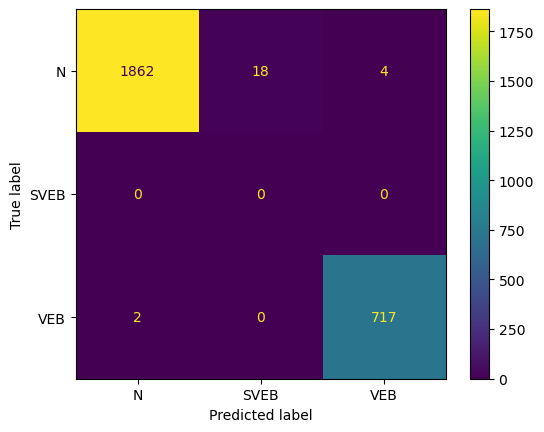

Fold 28:
  Test:  patient=27
              precision    recall  f1-score   support

         0.0       1.00      0.93      0.96      1711
         1.0       0.00      0.00      0.00         0
         2.0       0.33      0.75      0.46         4

    accuracy                           0.93      1715
   macro avg       0.44      0.56      0.47      1715
weighted avg       1.00      0.93      0.96      1715

                   0.0  1.0       2.0  accuracy    macro avg  weighted avg
precision     0.999371  0.0  0.333333  0.927697     0.444235      0.997817
recall        0.928112  NaN  0.750000  0.927697     0.559371      0.927697
f1-score      0.962424  NaN  0.461538  0.927697     0.474654      0.961256
support    1711.000000  0.0  4.000000  0.927697  1715.000000   1715.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

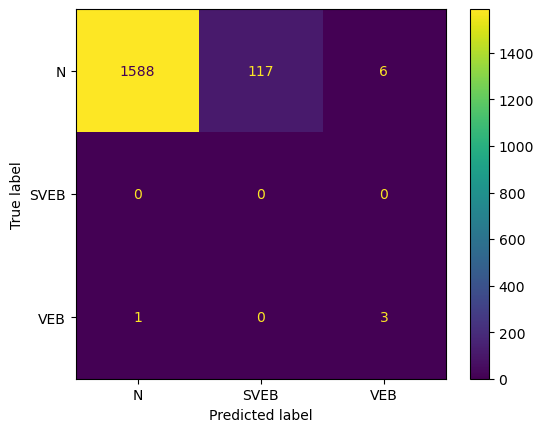

Fold 29:
  Test:  patient=28
              precision    recall  f1-score   support

         0.0       0.99      1.00      0.99      1835
         1.0       0.00      0.00      0.00         0
         2.0       0.99      0.98      0.99       783

    accuracy                           0.99      2618
   macro avg       0.66      0.66      0.66      2618
weighted avg       0.99      0.99      0.99      2618

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.992942  0.0    0.994825  0.992361     0.662589      0.993506
recall        0.996730  NaN    0.982120  0.992361     0.659617      0.992361
f1-score      0.994833  NaN    0.988432  0.992361     0.661088      0.992918
support    1835.000000  0.0  783.000000  0.992361  2618.000000   2618.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

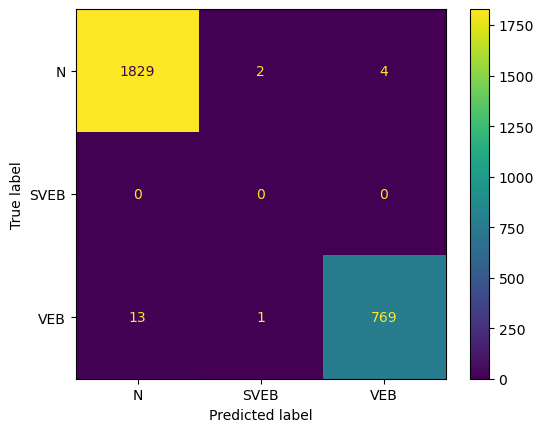

Fold 30:
  Test:  patient=29
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1705
         2.0       1.00      1.00      1.00       755

    accuracy                           1.00      2460
   macro avg       1.00      1.00      1.00      2460
weighted avg       1.00      1.00      1.00      2460

                   0.0         2.0  accuracy    macro avg  weighted avg
precision     0.999414    1.000000  0.999593     0.999707      0.999594
recall        1.000000    0.998675  0.999593     0.999338      0.999593
f1-score      0.999707    0.999337  0.999593     0.999522      0.999593
support    1705.000000  755.000000  0.999593  2460.000000   2460.000000


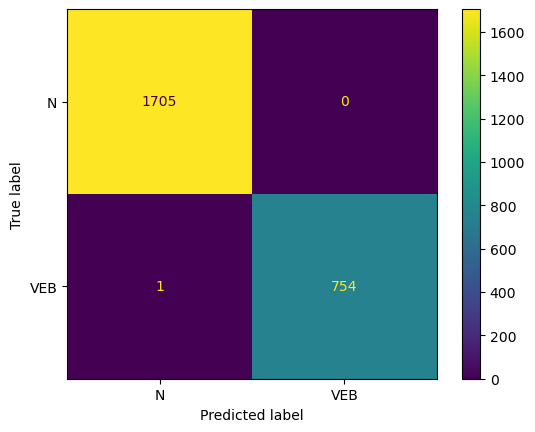

Fold 31:
  Test:  patient=30
              precision    recall  f1-score   support

         0.0       0.99      0.99      0.99      1843
         1.0       0.00      0.00      0.00         0
         2.0       0.99      0.98      0.98      1364

    accuracy                           0.99      3207
   macro avg       0.66      0.66      0.66      3207
weighted avg       0.99      0.99      0.99      3207

                   0.0  1.0          2.0  accuracy    macro avg  weighted avg
precision     0.988095  0.0     0.987426  0.985656     0.658507      0.987811
recall        0.990776  NaN     0.978739  0.985656     0.656505      0.985656
f1-score      0.989434  NaN     0.983063  0.985656     0.657499      0.986724
support    1843.000000  0.0  1364.000000  0.985656  3207.000000   3207.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

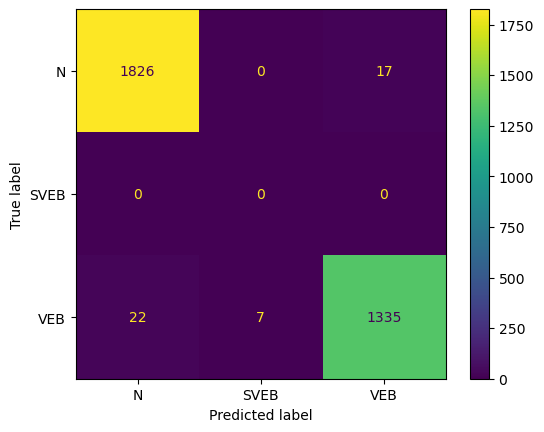

Fold 32:
  Test:  patient=31
              precision    recall  f1-score   support

         0.0       1.00      0.97      0.98      1560
         1.0       0.00      0.00      0.00         0
         2.0       0.93      1.00      0.97        57

    accuracy                           0.97      1617
   macro avg       0.64      0.66      0.65      1617
weighted avg       1.00      0.97      0.98      1617

                   0.0  1.0        2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.0   0.934426  0.970934     0.644809      0.997688
recall        0.969872  NaN   1.000000  0.970934     0.656624      0.970934
f1-score      0.984705  NaN   0.966102  0.970934     0.650269      0.984050
support    1560.000000  0.0  57.000000  0.970934  1617.000000   1617.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

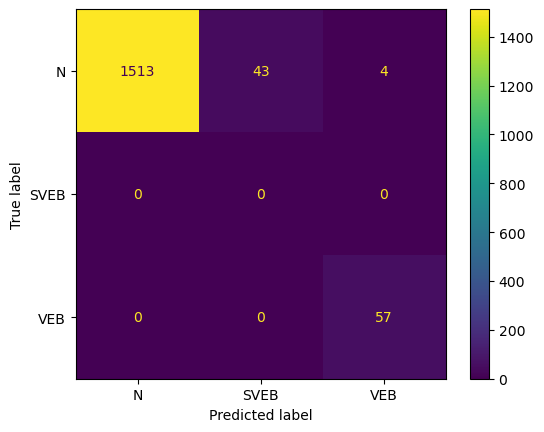

Fold 33:
  Test:  patient=32
              precision    recall  f1-score   support

         0.0       0.97      0.99      0.98      1245
         1.0       0.98      0.88      0.93       589
         2.0       0.00      0.00      0.00         1

    accuracy                           0.96      1835
   macro avg       0.65      0.62      0.64      1835
weighted avg       0.97      0.96      0.96      1835

                   0.0         1.0  2.0  accuracy    macro avg  weighted avg
precision     0.970958    0.982890  0.0  0.955858     0.651282      0.974258
recall        0.993574    0.877759  0.0  0.955858     0.623778      0.955858
f1-score      0.982136    0.927354  0.0  0.955858     0.636497      0.964017
support    1245.000000  589.000000  1.0  0.955858  1835.000000   1835.000000


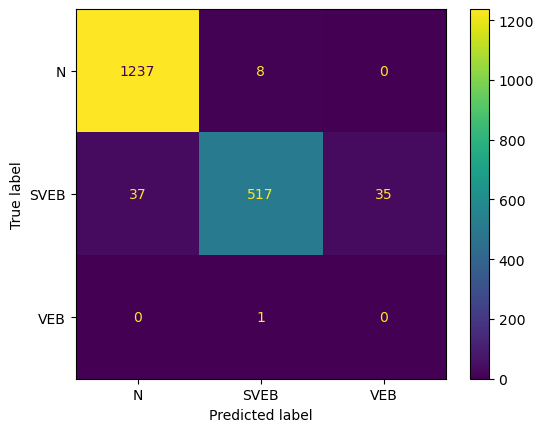

Fold 34:
  Test:  patient=33


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       1.00      0.98      0.99      1427
         1.0       0.94      0.98      0.96       536
         2.0       0.00      0.00      0.00         0

    accuracy                           0.98      1963
   macro avg       0.65      0.65      0.65      1963
weighted avg       0.98      0.98      0.98      1963

                   0.0         1.0  2.0  accuracy    macro avg  weighted avg
precision     0.999283    0.938959  0.0  0.976057     0.646080      0.982811
recall        0.976174    0.975746  NaN  0.976057     0.650640      0.976057
f1-score      0.987593    0.956999  NaN  0.976057     0.648197      0.979239
support    1427.000000  536.000000  0.0  0.976057  1963.000000   1963.000000


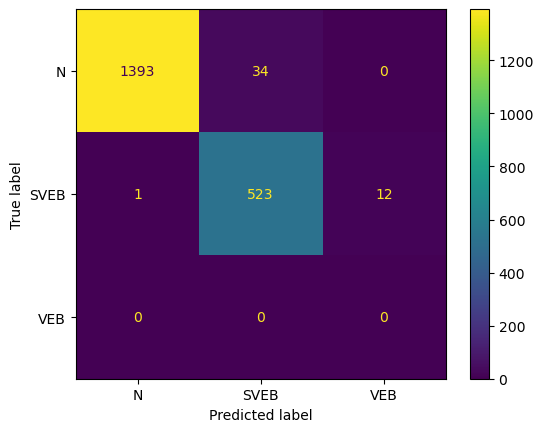

Fold 35:
  Test:  patient=34
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      3199
         1.0       0.00      0.00      0.00         0
         2.0       0.98      0.98      0.98       457

    accuracy                           0.99      3656
   macro avg       0.66      0.66      0.66      3656
weighted avg       1.00      0.99      0.99      3656

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.997806  0.0    0.978261  0.993982     0.658689      0.995363
recall        0.995311  NaN    0.984683  0.993982     0.659998      0.993982
f1-score      0.996557  NaN    0.981461  0.993982     0.659339      0.994670
support    3199.000000  0.0  457.000000  0.993982  3656.000000   3656.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

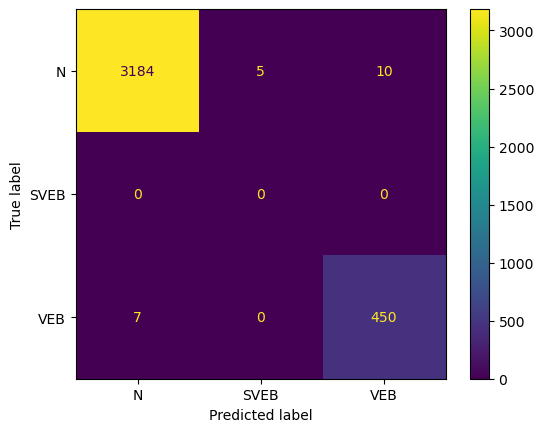

Fold 36:
  Test:  patient=35
              precision    recall  f1-score   support

         0.0       1.00      0.99      0.99      3447
         1.0       0.00      0.00      0.00         0
         2.0       0.92      0.99      0.95       450

    accuracy                           0.99      3897
   macro avg       0.64      0.66      0.65      3897
weighted avg       0.99      0.99      0.99      3897

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.998534  0.0    0.915464  0.987939     0.637999      0.988942
recall        0.988106  NaN    0.986667  0.987939     0.658257      0.987939
f1-score      0.993293  NaN    0.949733  0.987939     0.647675      0.988262
support    3447.000000  0.0  450.000000  0.987939  3897.000000   3897.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

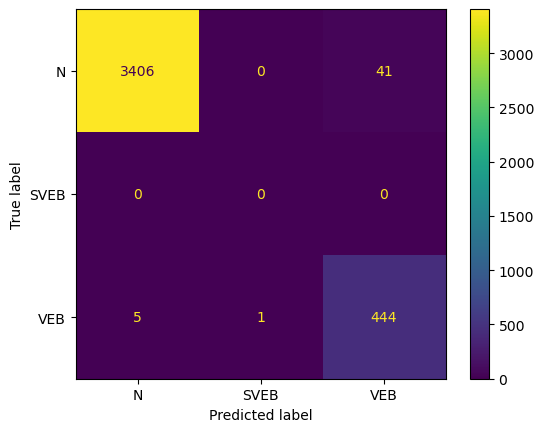

Fold 37:
  Test:  patient=36
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2007
         1.0       0.00      0.00      0.00         0
         2.0       1.00      1.00      1.00       452

    accuracy                           1.00      2459
   macro avg       0.67      0.67      0.67      2459
weighted avg       1.00      1.00      1.00      2459

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.0    0.997792  0.999187     0.665931      0.999594
recall        0.999003  NaN    1.000000  0.999187     0.666334      0.999187
f1-score      0.999501  NaN    0.998895  0.999187     0.666132      0.999390
support    2007.000000  0.0  452.000000  0.999187  2459.000000   2459.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

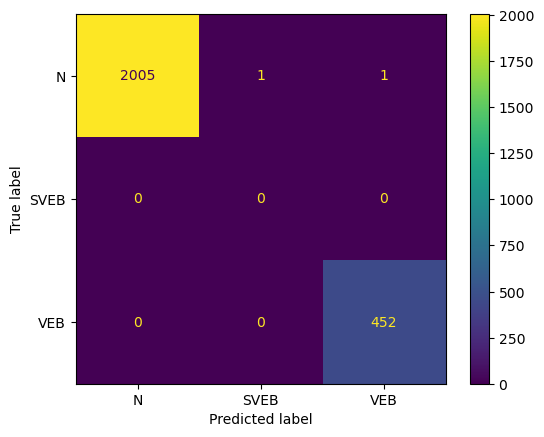

Fold 38:
  Test:  patient=37
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2153
         1.0       0.00      0.00      0.00         0
         2.0       1.00      0.99      1.00       543

    accuracy                           1.00      2696
   macro avg       0.67      0.66      0.67      2696
weighted avg       1.00      1.00      1.00      2696

              0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     1.0  0.0    1.000000  0.998516     0.666667      1.000000
recall        1.0  NaN    0.992634  0.998516     0.664211      0.998516
f1-score      1.0  NaN    0.996303  0.998516     0.665434      0.999255
support    2153.0  0.0  543.000000  0.998516  2696.000000   2696.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

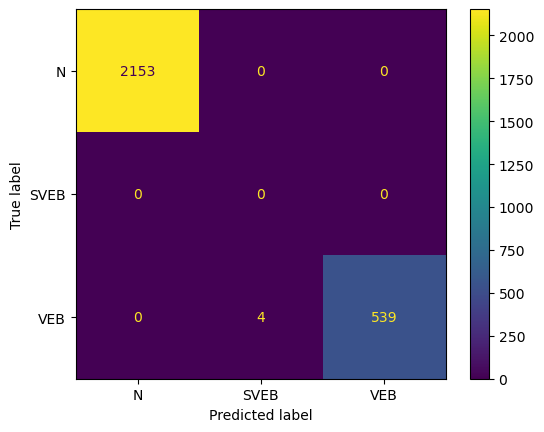

Fold 39:
  Test:  patient=38
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1460
         1.0       0.00      0.00      0.00         0
         2.0       1.00      0.99      1.00       313

    accuracy                           1.00      1773
   macro avg       0.67      0.66      0.67      1773
weighted avg       1.00      1.00      1.00      1773

              0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     1.0  0.0    1.000000  0.998872     0.666667      1.000000
recall        1.0  NaN    0.993610  0.998872     0.664537      0.998872
f1-score      1.0  NaN    0.996795  0.998872     0.665598      0.999434
support    1460.0  0.0  313.000000  0.998872  1773.000000   1773.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

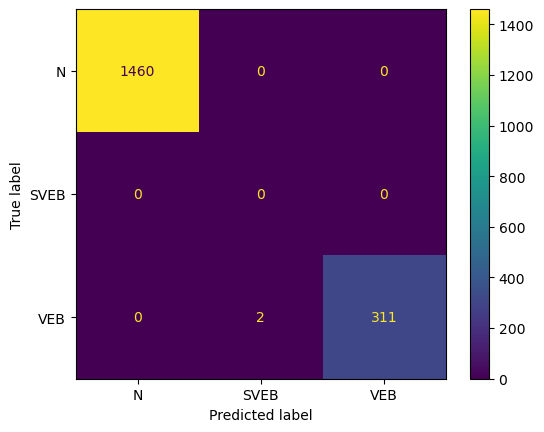

Fold 40:
  Test:  patient=39
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2566
         1.0       0.50      0.17      0.25         6
         2.0       0.95      1.00      0.97        92

    accuracy                           1.00      2664
   macro avg       0.82      0.72      0.74      2664
weighted avg       1.00      1.00      1.00      2664

                   0.0       1.0        2.0  accuracy    macro avg  \
precision     0.998441  0.500000   0.948454  0.996246     0.815631   
recall        0.998051  0.166667   1.000000  0.996246     0.721573   
f1-score      0.998246  0.250000   0.973545  0.996246     0.740597   
support    2566.000000  6.000000  92.000000  0.996246  2664.000000   

           weighted avg  
precision      0.995592  
recall         0.996246  
f1-score       0.995708  
support     2664.000000  


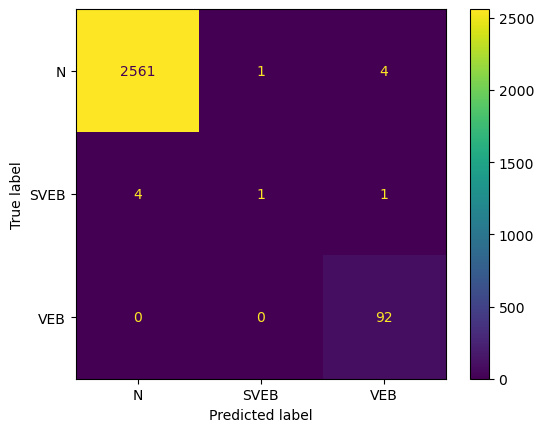

Fold 41:
  Test:  patient=40
              precision    recall  f1-score   support

         0.0       1.00      0.86      0.93      1622
         1.0       0.02      0.80      0.04         5
         2.0       0.03      1.00      0.06         1

    accuracy                           0.86      1628
   macro avg       0.35      0.89      0.34      1628
weighted avg       1.00      0.86      0.92      1628

                   0.0       1.0       2.0  accuracy    macro avg  \
precision     1.000000  0.020202  0.031250  0.861794     0.350484   
recall        0.861899  0.800000  1.000000  0.861794     0.887300   
f1-score      0.925828  0.039409  0.060606  0.861794     0.341948   
support    1622.000000  5.000000  1.000000  0.861794  1628.000000   

           weighted avg  
precision      0.996396  
recall         0.861794  
f1-score       0.922574  
support     1628.000000  


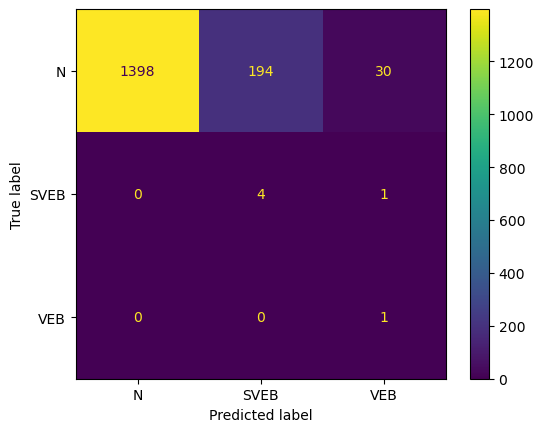

Fold 42:
  Test:  patient=41


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1544
         1.0       0.00      0.00      0.00         0
         2.0       1.00      1.00      1.00      1554

    accuracy                           1.00      3098
   macro avg       0.67      0.67      0.67      3098
weighted avg       1.00      1.00      1.00      3098

                   0.0  1.0          2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.0     0.998715  0.998386     0.666238      0.999355
recall        0.996762  NaN     1.000000  0.998386     0.665587      0.998386
f1-score      0.998378  NaN     0.999357  0.998386     0.665912      0.998869
support    1544.000000  0.0  1554.000000  0.998386  3098.000000   3098.000000


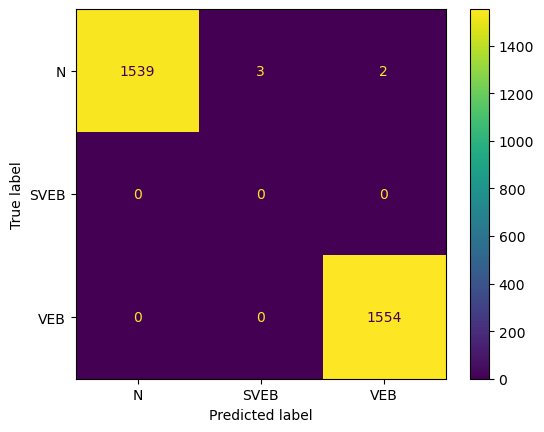

Fold 43:
  Test:  patient=42
              precision    recall  f1-score   support

         0.0       1.00      0.99      0.99      1085
         2.0       0.99      1.00      1.00      1120

    accuracy                           1.00      2205
   macro avg       1.00      0.99      1.00      2205
weighted avg       1.00      1.00      1.00      2205

                   0.0          2.0  accuracy    macro avg  weighted avg
precision     0.997222     0.992889  0.995011     0.995056      0.995021
recall        0.992627     0.997321  0.995011     0.994974      0.995011
f1-score      0.994919     0.995100  0.995011     0.995010      0.995011
support    1085.000000  1120.000000  0.995011  2205.000000   2205.000000


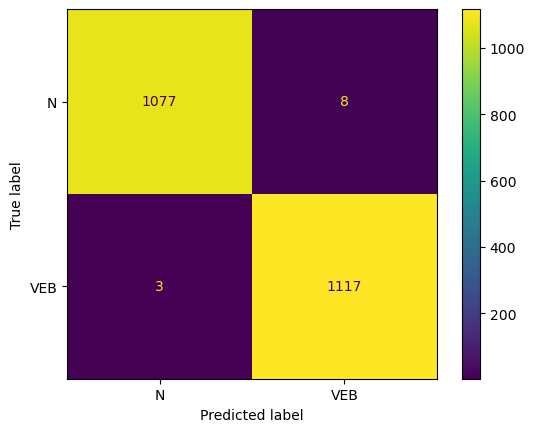

Fold 44:
  Test:  patient=43
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1802
         1.0       1.00      0.12      0.22         8
         2.0       1.00      1.00      1.00       683

    accuracy                           1.00      2493
   macro avg       1.00      0.71      0.74      2493
weighted avg       1.00      1.00      1.00      2493

                   0.0       1.0         2.0  accuracy    macro avg  \
precision     0.996128  1.000000    0.998538  0.996791     0.998222   
recall        0.999445  0.125000    1.000000  0.996791     0.708148   
f1-score      0.997784  0.222222    0.999268  0.996791     0.739758   
support    1802.000000  8.000000  683.000000  0.996791  2493.000000   

           weighted avg  
precision      0.996801  
recall         0.996791  
f1-score       0.995702  
support     2493.000000  


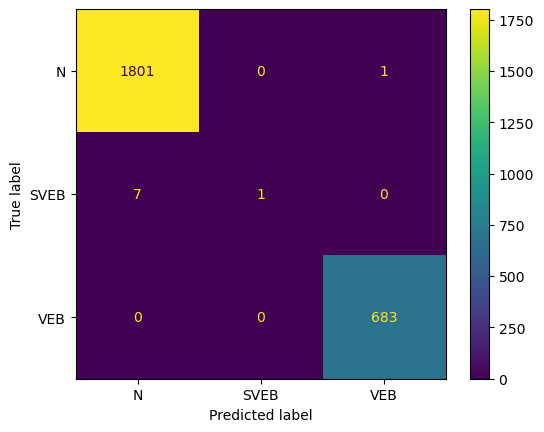

Fold 45:
  Test:  patient=44
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1435
         1.0       0.00      0.00      0.00         0
         2.0       1.00      1.00      1.00       491

    accuracy                           1.00      1926
   macro avg       0.67      0.67      0.67      1926
weighted avg       1.00      1.00      1.00      1926

                   0.0  1.0    2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.0    1.0  0.998962     0.666667      1.000000
recall        0.998606  NaN    1.0  0.998962     0.666202      0.998962
f1-score      0.999303  NaN    1.0  0.998962     0.666434      0.999480
support    1435.000000  0.0  491.0  0.998962  1926.000000   1926.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

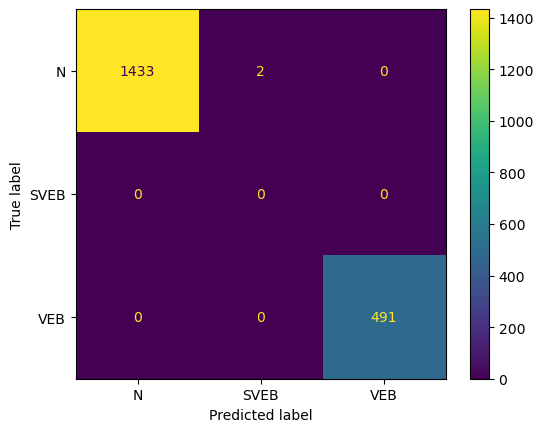

Fold 46:
  Test:  patient=45
              precision    recall  f1-score   support

         0.0       1.00      0.98      0.99      2230
         1.0       0.03      1.00      0.06         1
         2.0       0.99      1.00      1.00       422

    accuracy                           0.99      2653
   macro avg       0.67      0.99      0.68      2653
weighted avg       1.00      0.99      0.99      2653

                   0.0       1.0         2.0  accuracy    macro avg  \
precision     1.000000  0.030303    0.992941  0.986807     0.674415   
recall        0.984305  1.000000    1.000000  0.986807     0.994768   
f1-score      0.992090  0.058824    0.996458  0.986807     0.682457   
support    2230.000000  1.000000  422.000000  0.986807  2653.000000   

           weighted avg  
precision      0.998512  
recall         0.986807  
f1-score       0.992433  
support     2653.000000  


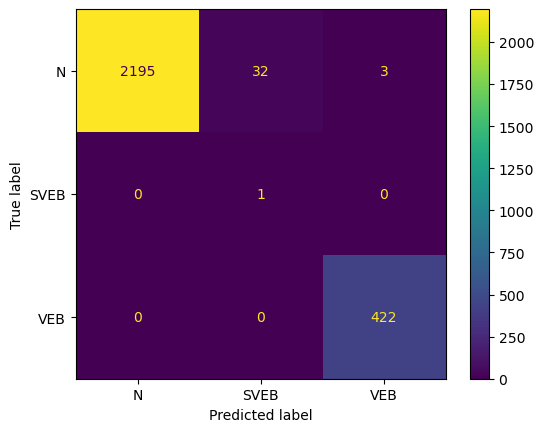

Fold 47:
  Test:  patient=46
              precision    recall  f1-score   support

         0.0       1.00      0.98      0.99      1857
         1.0       0.00      0.00      0.00         1
         2.0       0.82      1.00      0.90        93

    accuracy                           0.99      1951
   macro avg       0.61      0.66      0.63      1951
weighted avg       0.99      0.99      0.99      1951

                   0.0  1.0        2.0  accuracy    macro avg  weighted avg
precision     0.999454  0.0   0.815789  0.985136     0.605081      0.990186
recall        0.984922  0.0   1.000000  0.985136     0.661641      0.985136
f1-score      0.992135  0.0   0.898551  0.985136     0.630228      0.987165
support    1857.000000  1.0  93.000000  0.985136  1951.000000   1951.000000


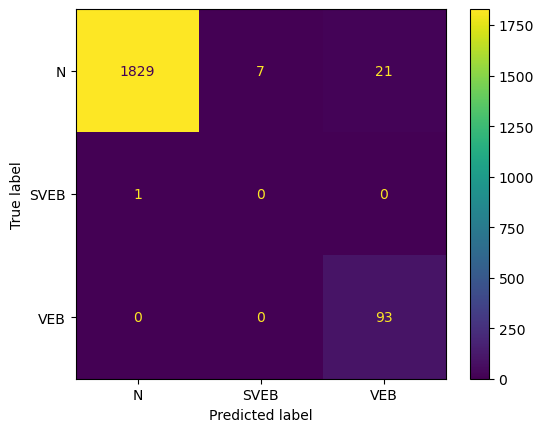

Fold 48:
  Test:  patient=47
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2117
         1.0       0.00      0.00      0.00         2
         2.0       1.00      1.00      1.00       235

    accuracy                           1.00      2354
   macro avg       0.67      0.67      0.67      2354
weighted avg       1.00      1.00      1.00      2354

                   0.0  1.0    2.0  accuracy    macro avg  weighted avg
precision     0.999056  0.0    1.0  0.998726     0.666352      0.998301
recall        0.999528  0.0    1.0  0.998726     0.666509      0.998726
f1-score      0.999292  0.0    1.0  0.998726     0.666431      0.998513
support    2117.000000  2.0  235.0  0.998726  2354.000000   2354.000000


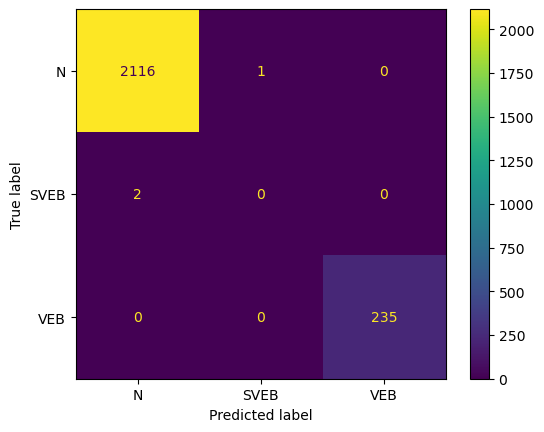

Fold 49:
  Test:  patient=48
              precision    recall  f1-score   support

         0.0       1.00      0.98      0.99      2119
         1.0       0.00      0.00      0.00         0
         2.0       1.00      1.00      1.00        27

    accuracy                           0.98      2146
   macro avg       0.67      0.66      0.66      2146
weighted avg       1.00      0.98      0.99      2146

                   0.0  1.0   2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.0   1.0  0.984157     0.666667      1.000000
recall        0.983955  NaN   1.0  0.984157     0.661318      0.984157
f1-score      0.991912  NaN   1.0  0.984157     0.663971      0.992014
support    2119.000000  0.0  27.0  0.984157  2146.000000   2146.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

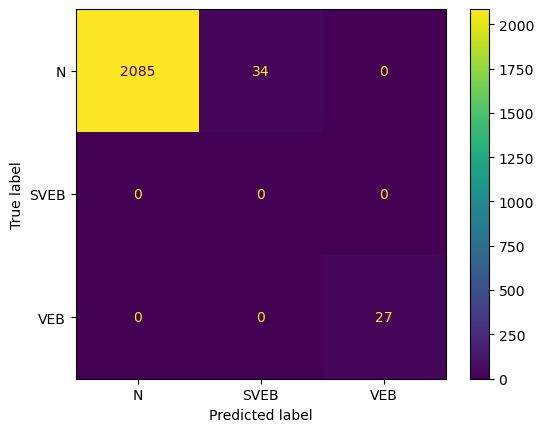

Fold 50:
  Test:  patient=49
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2993
         1.0       0.00      0.00      0.00         0
         2.0       0.50      0.75      0.60         4

    accuracy                           0.99      2997
   macro avg       0.50      0.58      0.53      2997
weighted avg       1.00      0.99      1.00      2997

                   0.0  1.0   2.0  accuracy    macro avg  weighted avg
precision     0.999664  0.0  0.50  0.994995     0.499888      0.998998
recall        0.995322  NaN  0.75  0.994995     0.581774      0.994995
f1-score      0.997489  NaN  0.60  0.994995     0.532496      0.996958
support    2993.000000  0.0  4.00  0.994995  2997.000000   2997.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

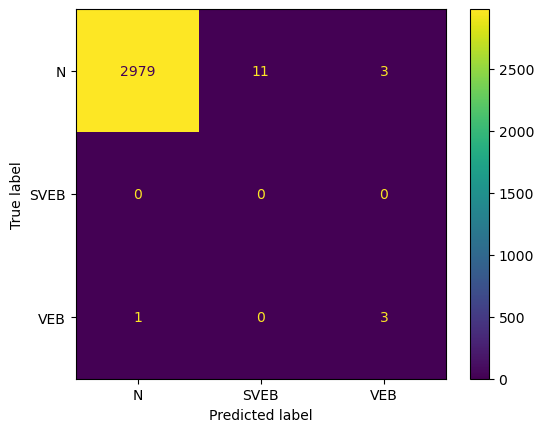

Fold 51:
  Test:  patient=50
              precision    recall  f1-score   support

         0.0       1.00      0.98      0.99      1969
         1.0       0.00      0.00      0.00         3
         2.0       0.96      1.00      0.98       802

    accuracy                           0.99      2774
   macro avg       0.65      0.66      0.66      2774
weighted avg       0.99      0.99      0.99      2774

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.998450  0.0    0.961631  0.985941     0.653360      0.986726
recall        0.981717  0.0    1.000000  0.985941     0.660572      0.985941
f1-score      0.990013  0.0    0.980440  0.985941     0.656818      0.986175
support    1969.000000  3.0  802.000000  0.985941  2774.000000   2774.000000


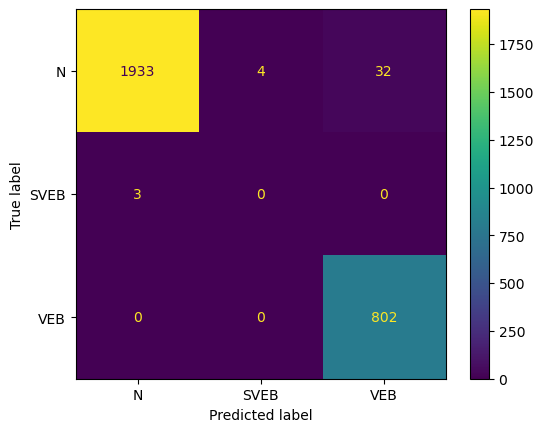

Fold 52:
  Test:  patient=51
              precision    recall  f1-score   support

         0.0       1.00      0.94      0.97      1608
         1.0       0.00      0.00      0.00         0
         2.0       1.00      1.00      1.00       137

    accuracy                           0.95      1745
   macro avg       0.67      0.65      0.66      1745
weighted avg       1.00      0.95      0.97      1745

                   0.0  1.0    2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.0    1.0  0.945559     0.666667      1.000000
recall        0.940920  NaN    1.0  0.945559     0.646973      0.945559
f1-score      0.969561  NaN    1.0  0.945559     0.656520      0.971951
support    1608.000000  0.0  137.0  0.945559  1745.000000   1745.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

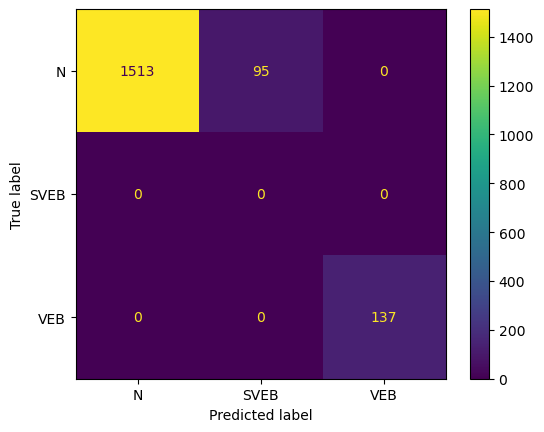

Fold 53:
  Test:  patient=52
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1150
         1.0       0.00      0.00      0.00         0
         2.0       1.00      1.00      1.00      1110

    accuracy                           1.00      2260
   macro avg       0.67      0.67      0.67      2260
weighted avg       1.00      1.00      1.00      2260

                   0.0  1.0     2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.0     1.0  0.999115     0.666667      1.000000
recall        0.998261  NaN     1.0  0.999115     0.666087      0.999115
f1-score      0.999130  NaN     1.0  0.999115     0.666377      0.999557
support    1150.000000  0.0  1110.0  0.999115  2260.000000   2260.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

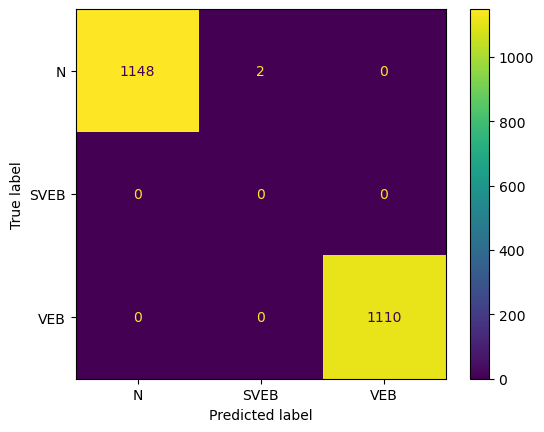

Fold 54:
  Test:  patient=53
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2338
         1.0       0.50      1.00      0.67         1
         2.0       0.66      0.95      0.78        22

    accuracy                           0.99      2361
   macro avg       0.72      0.98      0.81      2361
weighted avg       1.00      0.99      1.00      2361

                   0.0       1.0        2.0  accuracy    macro avg  \
precision     1.000000  0.500000   0.656250  0.994917     0.718750   
recall        0.995295  1.000000   0.954545  0.994917     0.983280   
f1-score      0.997642  0.666667   0.777778  0.994917     0.814029   
support    2338.000000  1.000000  22.000000  0.994917  2361.000000   

           weighted avg  
precision      0.996585  
recall         0.994917  
f1-score       0.995453  
support     2361.000000  


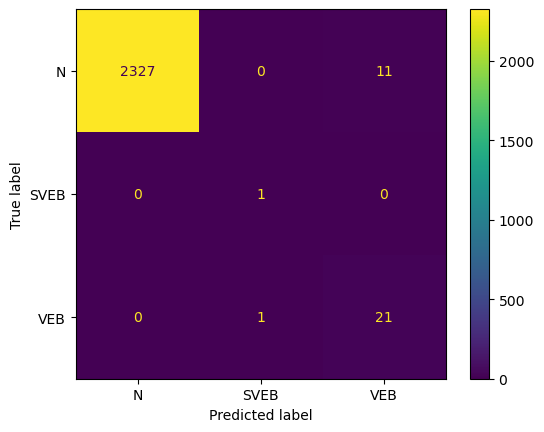

Fold 55:
  Test:  patient=54
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2146
         1.0       0.50      1.00      0.67         1
         2.0       1.00      0.94      0.97        17

    accuracy                           1.00      2164
   macro avg       0.83      0.98      0.88      2164
weighted avg       1.00      1.00      1.00      2164

              0.0       1.0        2.0  accuracy    macro avg  weighted avg
precision     1.0  0.500000   1.000000  0.999538     0.833333      0.999769
recall        1.0  1.000000   0.941176  0.999538     0.980392      0.999538
f1-score      1.0  0.666667   0.969697  0.999538     0.878788      0.999608
support    2146.0  1.000000  17.000000  0.999538  2164.000000   2164.000000


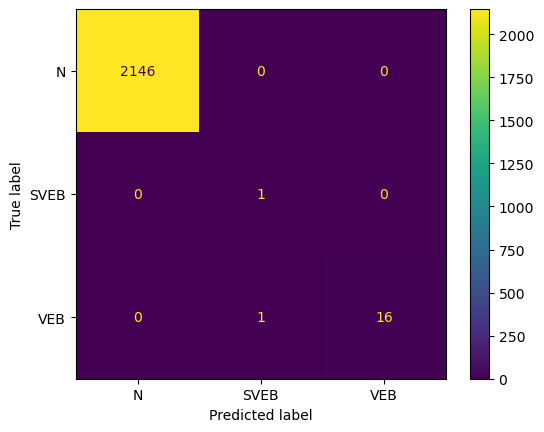

Fold 56:
  Test:  patient=55
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1670
         1.0       0.85      0.88      0.87        26
         2.0       1.00      1.00      1.00         7

    accuracy                           1.00      1703
   macro avg       0.95      0.96      0.96      1703
weighted avg       1.00      1.00      1.00      1703

                   0.0        1.0  2.0  accuracy    macro avg  weighted avg
precision     0.998203   0.851852  1.0   0.99589     0.950018      0.995976
recall        0.997605   0.884615  1.0   0.99589     0.960740      0.995890
f1-score      0.997904   0.867925  1.0   0.99589     0.955276      0.995928
support    1670.000000  26.000000  7.0   0.99589  1703.000000   1703.000000


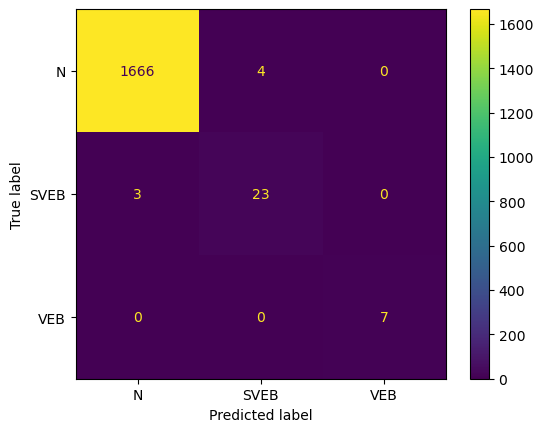

Fold 57:
  Test:  patient=56
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2840
         1.0       0.12      0.33      0.18         3
         2.0       0.91      1.00      0.95        21

    accuracy                           1.00      2864
   macro avg       0.68      0.78      0.71      2864
weighted avg       1.00      1.00      1.00      2864

                   0.0       1.0        2.0  accuracy    macro avg  \
precision     0.999294  0.125000   0.913043  0.996159     0.679113   
recall        0.996831  0.333333   1.000000  0.996159     0.776721   
f1-score      0.998061  0.181818   0.954545  0.996159     0.711475   
support    2840.000000  3.000000  21.000000  0.996159  2864.000000   

           weighted avg  
precision      0.997746  
recall         0.996159  
f1-score       0.996887  
support     2864.000000  


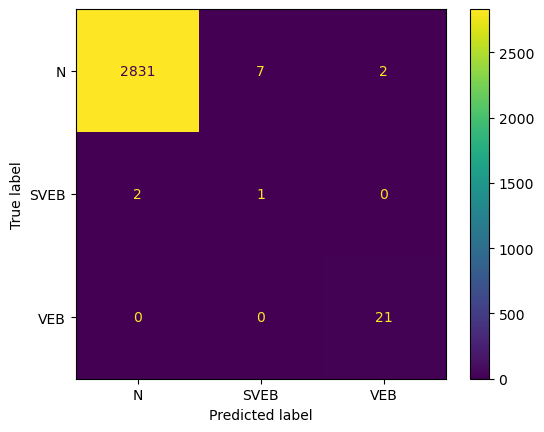

Fold 58:
  Test:  patient=57


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2311
         1.0       0.00      0.00      0.00         0
         2.0       0.92      1.00      0.96        12

    accuracy                           1.00      2323
   macro avg       0.64      0.67      0.65      2323
weighted avg       1.00      1.00      1.00      2323

                   0.0  1.0        2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.0   0.923077  0.995265     0.641026      0.999603
recall        0.995240  NaN   1.000000  0.995265     0.665080      0.995265
f1-score      0.997614  NaN   0.960000  0.995265     0.652538      0.997420
support    2311.000000  0.0  12.000000  0.995265  2323.000000   2323.000000


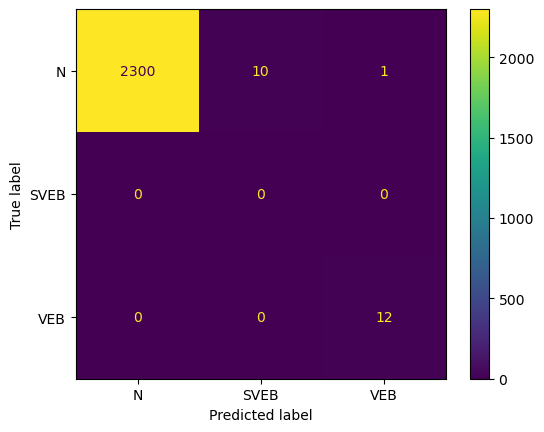

Fold 59:
  Test:  patient=58
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2065
         2.0       0.93      1.00      0.96        81

    accuracy                           1.00      2146
   macro avg       0.97      1.00      0.98      2146
weighted avg       1.00      1.00      1.00      2146

                   0.0        2.0  accuracy    macro avg  weighted avg
precision     1.000000   0.931034  0.997204     0.965517      0.997397
recall        0.997094   1.000000  0.997204     0.998547      0.997204
f1-score      0.998545   0.964286  0.997204     0.981415      0.997252
support    2065.000000  81.000000  0.997204  2146.000000   2146.000000


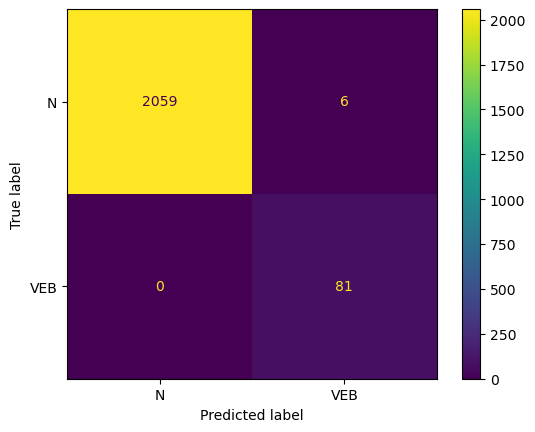

Fold 60:
  Test:  patient=59
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2473
         2.0       0.00      0.00      0.00         0

    accuracy                           1.00      2473
   macro avg       0.50      0.50      0.50      2473
weighted avg       1.00      1.00      1.00      2473

                   0.0  2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.0  0.999596     0.500000      1.000000
recall        0.999596  NaN  0.999596     0.499798      0.999596
f1-score      0.999798  NaN  0.999596     0.499899      0.999798
support    2473.000000  0.0  0.999596  2473.000000   2473.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

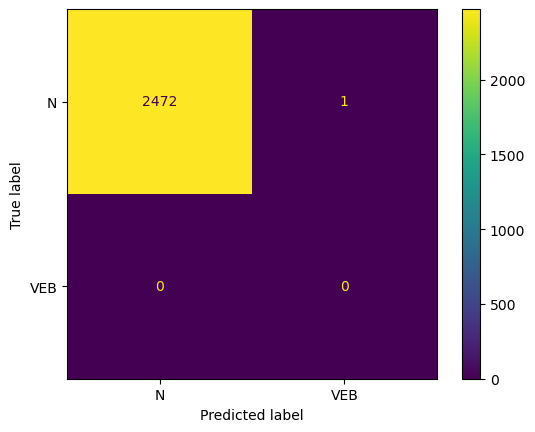

Fold 61:
  Test:  patient=60
              precision    recall  f1-score   support

         0.0       1.00      0.99      0.99      1451
         1.0       0.05      1.00      0.09         1

    accuracy                           0.99      1452
   macro avg       0.52      0.99      0.54      1452
weighted avg       1.00      0.99      0.99      1452

                   0.0       1.0  accuracy    macro avg  weighted avg
precision     1.000000  0.045455  0.985537     0.522727      0.999343
recall        0.985527  1.000000  0.985537     0.992764      0.985537
f1-score      0.992711  0.086957  0.985537     0.539834      0.992087
support    1451.000000  1.000000  0.985537  1452.000000   1452.000000


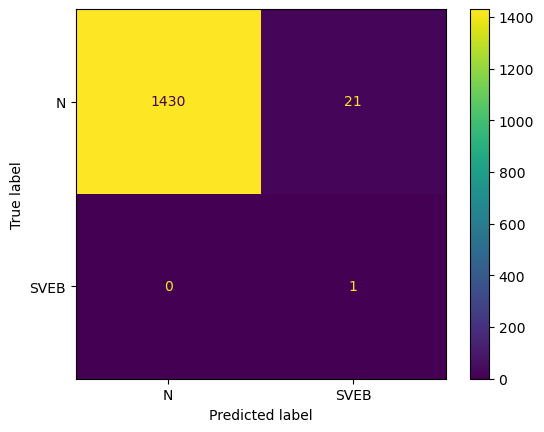

Fold 62:
  Test:  patient=61
              precision    recall  f1-score   support

         0.0       0.93      1.00      0.96      1451
         1.0       0.03      0.33      0.05         9
         2.0       1.00      0.74      0.85       795

    accuracy                           0.90      2255
   macro avg       0.65      0.69      0.62      2255
weighted avg       0.95      0.90      0.92      2255

                   0.0       1.0         2.0  accuracy    macro avg  \
precision     0.928067  0.028037    0.996616  0.903326     0.650907   
recall        0.995865  0.333333    0.740881  0.903326     0.690026   
f1-score      0.960771  0.051724    0.849928  0.903326     0.620808   
support    1451.000000  9.000000  795.000000  0.903326  2255.000000   

           weighted avg  
precision      0.948642  
recall         0.903326  
f1-score       0.918065  
support     2255.000000  


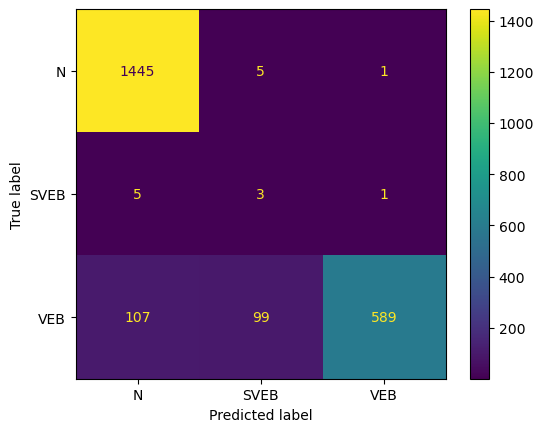

Fold 63:
  Test:  patient=62
              precision    recall  f1-score   support

         0.0       0.99      1.00      1.00      1845
         1.0       0.00      0.00      0.00         1
         2.0       1.00      0.86      0.93       138

    accuracy                           0.99      1984
   macro avg       0.66      0.62      0.64      1984
weighted avg       0.99      0.99      0.99      1984

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.994609  0.0    1.000000  0.989919     0.664870      0.994483
recall        1.000000  0.0    0.862319  0.989919     0.620773      0.989919
f1-score      0.997297  0.0    0.926070  0.989919     0.641122      0.991840
support    1845.000000  1.0  138.000000  0.989919  1984.000000   1984.000000


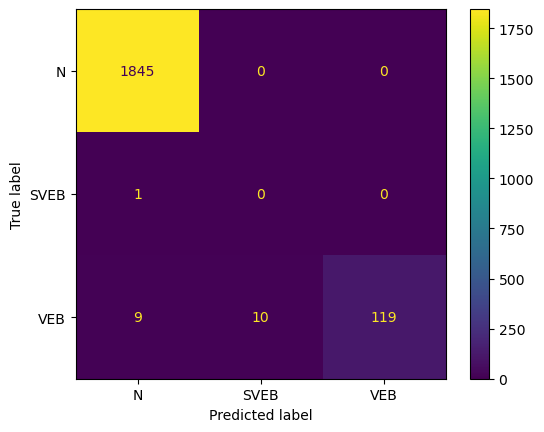

Fold 64:
  Test:  patient=63
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1885
         1.0       0.00      0.00      0.00         0
         2.0       0.95      0.91      0.93        23

    accuracy                           1.00      1908
   macro avg       0.65      0.64      0.64      1908
weighted avg       1.00      1.00      1.00      1908

                   0.0  1.0        2.0  accuracy    macro avg  weighted avg
precision     0.999469  0.0   0.954545  0.998428     0.651338      0.998928
recall        0.999469  NaN   0.913043  0.998428     0.637504      0.998428
f1-score      0.999469  NaN   0.933333  0.998428     0.644268      0.998672
support    1885.000000  0.0  23.000000  0.998428  1908.000000   1908.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

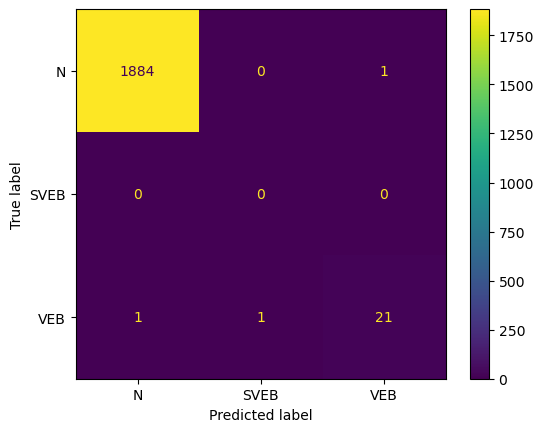

Fold 65:
  Test:  patient=64
              precision    recall  f1-score   support

         0.0       1.00      0.99      0.99      2271
         1.0       0.07      0.40      0.12         5
         2.0       1.00      0.99      0.99       382

    accuracy                           0.99      2658
   macro avg       0.69      0.79      0.70      2658
weighted avg       1.00      0.99      0.99      2658

                   0.0       1.0         2.0  accuracy    macro avg  \
precision     0.996893  0.074074    0.997354  0.987585     0.689441   
recall        0.988992  0.400000    0.986911  0.987585     0.791968   
f1-score      0.992927  0.125000    0.992105  0.987585     0.703344   
support    2271.000000  5.000000  382.000000  0.987585  2658.000000   

           weighted avg  
precision      0.995223  
recall         0.987585  
f1-score       0.991176  
support     2658.000000  


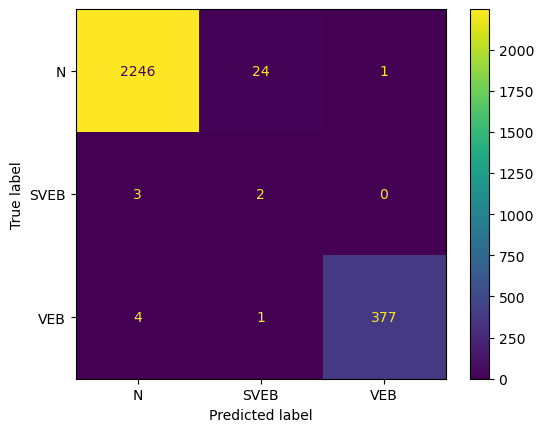

Fold 66:
  Test:  patient=65
              precision    recall  f1-score   support

         0.0       1.00      0.98      0.99      2137
         1.0       0.00      0.00      0.00         1
         2.0       0.99      0.99      0.99       200

    accuracy                           0.98      2338
   macro avg       0.66      0.66      0.66      2338
weighted avg       1.00      0.98      0.99      2338

                   0.0  1.0     2.0  accuracy    macro avg  weighted avg
precision     0.998564  0.0    0.99  0.976903     0.662855      0.997404
recall        0.976135  0.0    0.99  0.976903     0.655378      0.976903
f1-score      0.987222  0.0    0.99  0.976903     0.659074      0.987037
support    2137.000000  1.0  200.00  0.976903  2338.000000   2338.000000


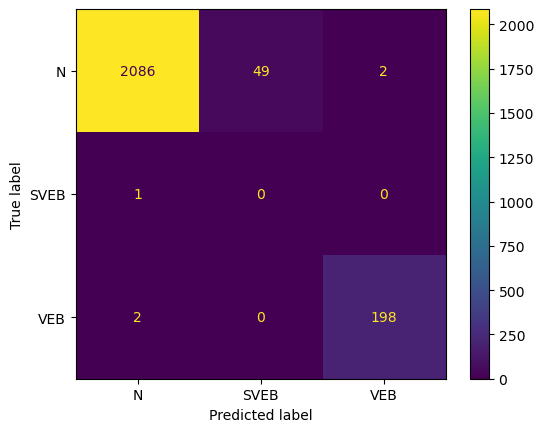

Fold 67:
  Test:  patient=66
              precision    recall  f1-score   support

         0.0       1.00      0.99      0.99      2436
         1.0       0.00      0.00      0.00         5
         2.0       1.00      0.99      0.99       531

    accuracy                           0.99      2972
   macro avg       0.66      0.66      0.66      2972
weighted avg       1.00      0.99      0.99      2972

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.997101  0.0    0.996219   0.98755     0.664440      0.995266
recall        0.988506  0.0    0.992467   0.98755     0.660324      0.987550
f1-score      0.992785  0.0    0.994340   0.98755     0.662375      0.991393
support    2436.000000  5.0  531.000000   0.98755  2972.000000   2972.000000


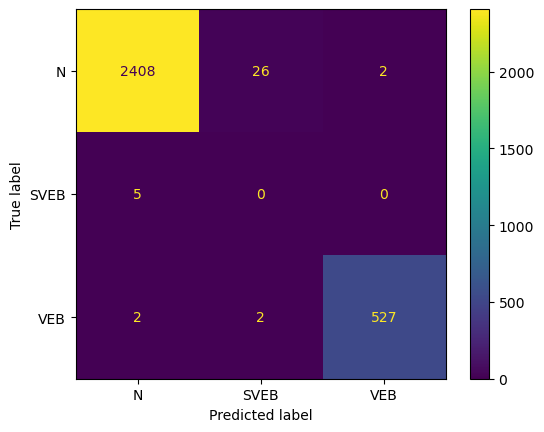

Fold 68:
  Test:  patient=67
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2480
         1.0       0.10      0.50      0.17         2
         2.0       0.99      1.00      1.00       161

    accuracy                           1.00      2643
   macro avg       0.70      0.83      0.72      2643
weighted avg       1.00      1.00      1.00      2643

                   0.0       1.0         2.0  accuracy    macro avg  \
precision     0.999595  0.100000    0.993827  0.995838     0.697807   
recall        0.995968  0.500000    1.000000  0.995838     0.831989   
f1-score      0.997778  0.166667    0.996904  0.995838     0.720450   
support    2480.000000  2.000000  161.000000  0.995838  2643.000000   

           weighted avg  
precision      0.998563  
recall         0.995838  
f1-score       0.997096  
support     2643.000000  


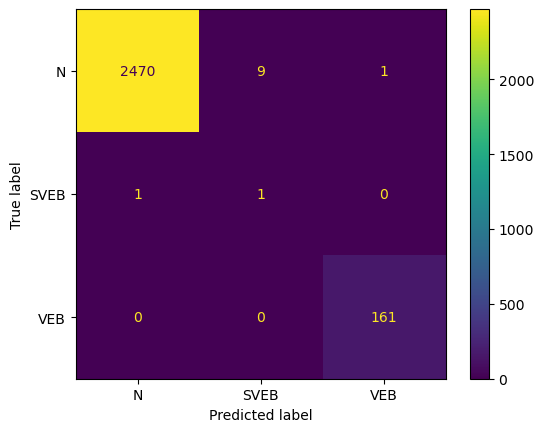

Fold 69:
  Test:  patient=68
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1998
         1.0       0.50      1.00      0.67         1
         2.0       0.99      1.00      1.00       167

    accuracy                           1.00      2166
   macro avg       0.83      1.00      0.89      2166
weighted avg       1.00      1.00      1.00      2166

                   0.0       1.0         2.0  accuracy    macro avg  \
precision     1.000000  0.500000    0.994048  0.999077     0.831349   
recall        0.998999  1.000000    1.000000  0.999077     0.999666   
f1-score      0.999499  0.666667    0.997015  0.999077     0.887727   
support    1998.000000  1.000000  167.000000  0.999077  2166.000000   

           weighted avg  
precision      0.999310  
recall         0.999077  
f1-score       0.999154  
support     2166.000000  


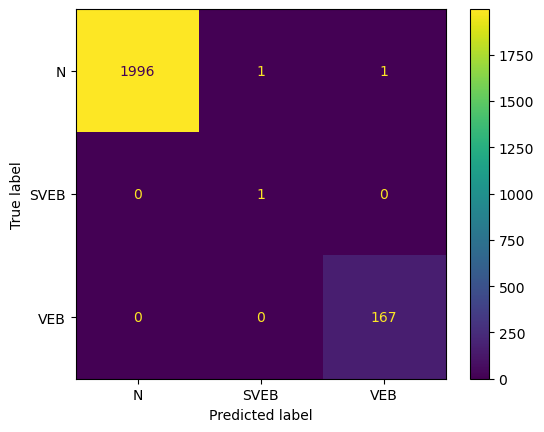

Fold 70:
  Test:  patient=69


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       1.00      0.76      0.87      1539
         1.0       0.42      0.99      0.59       126
         2.0       0.00      0.00      0.00         0

    accuracy                           0.78      1665
   macro avg       0.47      0.58      0.48      1665
weighted avg       0.96      0.78      0.84      1665

                   0.0         1.0  2.0  accuracy    macro avg  weighted avg
precision     1.000000    0.419463  0.0   0.77958     0.473154      0.956067
recall        0.762183    0.992063  NaN   0.77958     0.584749      0.779580
f1-score      0.865044    0.589623  NaN   0.77958     0.484889      0.844202
support    1539.000000  126.000000  0.0   0.77958  1665.000000   1665.000000


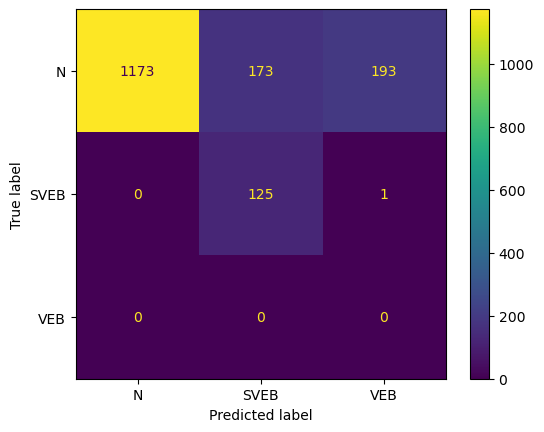

Fold 71:
  Test:  patient=70
              precision    recall  f1-score   support

         0.0       1.00      0.94      0.97      1634
         1.0       0.46      0.83      0.59        35
         2.0       0.00      0.00      0.00         0

    accuracy                           0.94      1669
   macro avg       0.49      0.59      0.52      1669
weighted avg       0.99      0.94      0.96      1669

                   0.0        1.0  2.0  accuracy    macro avg  weighted avg
precision     0.998046   0.460317  0.0  0.935291     0.486121      0.986769
recall        0.937576   0.828571  NaN  0.935291     0.588716      0.935291
f1-score      0.966867   0.591837  NaN  0.935291     0.519568      0.959002
support    1634.000000  35.000000  0.0  0.935291  1669.000000   1669.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

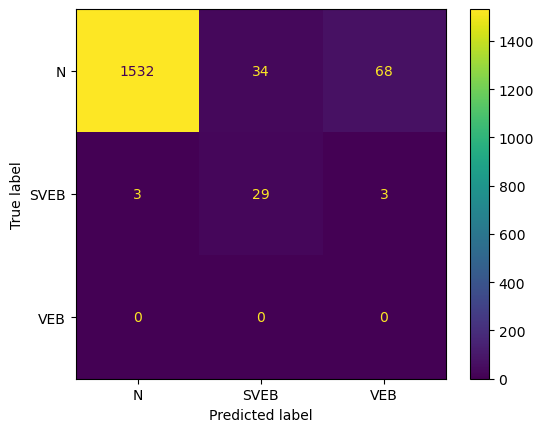

Fold 72:
  Test:  patient=71
              precision    recall  f1-score   support

         0.0       1.00      0.49      0.65      1874
         1.0       0.13      0.75      0.22         8
         2.0       0.29      0.98      0.45       386

    accuracy                           0.57      2268
   macro avg       0.47      0.74      0.44      2268
weighted avg       0.87      0.57      0.62      2268

                   0.0       1.0         2.0  accuracy    macro avg  \
precision     0.997805  0.127660    0.290076  0.570988     0.471847   
recall        0.485059  0.750000    0.984456  0.570988     0.739838   
f1-score      0.652783  0.218182    0.448113  0.570988     0.439693   
support    1874.000000  8.000000  386.000000  0.570988  2268.000000   

           weighted avg  
precision      0.874284  
recall         0.570988  
f1-score       0.616416  
support     2268.000000  


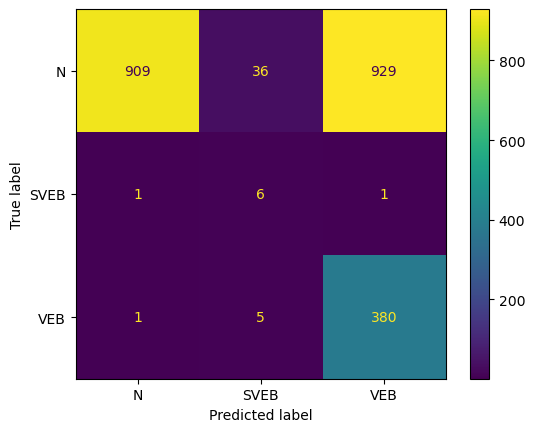

Fold 73:
  Test:  patient=72
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1888
         1.0       0.85      0.91      0.88        32
         2.0       0.99      0.96      0.97        70

    accuracy                           0.99      1990
   macro avg       0.95      0.95      0.95      1990
weighted avg       0.99      0.99      0.99      1990

                   0.0        1.0        2.0  accuracy    macro avg  \
precision     0.997352   0.852941   0.985294  0.994472     0.945196   
recall        0.997352   0.906250   0.957143  0.994472     0.953582   
f1-score      0.997352   0.878788   0.971014  0.994472     0.949051   
support    1888.000000  32.000000  70.000000  0.994472  1990.000000   

           weighted avg  
precision      0.994605  
recall         0.994472  
f1-score       0.994519  
support     1990.000000  


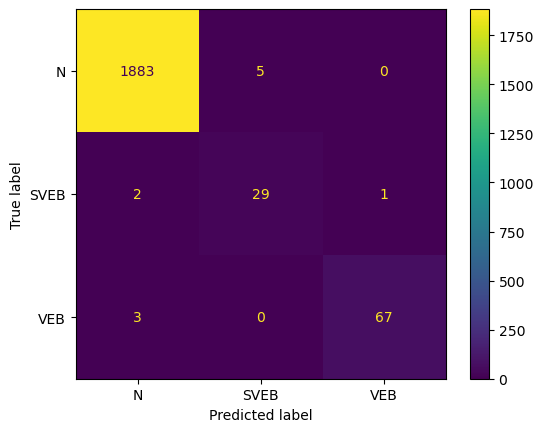

Fold 74:
  Test:  patient=73
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2081
         2.0       1.00      1.00      1.00       274

    accuracy                           1.00      2355
   macro avg       1.00      1.00      1.00      2355
weighted avg       1.00      1.00      1.00      2355

                   0.0         2.0  accuracy    macro avg  weighted avg
precision     1.000000    0.996364  0.999575     0.998182      0.999577
recall        0.999519    1.000000  0.999575     0.999760      0.999575
f1-score      0.999760    0.998179  0.999575     0.998969      0.999576
support    2081.000000  274.000000  0.999575  2355.000000   2355.000000


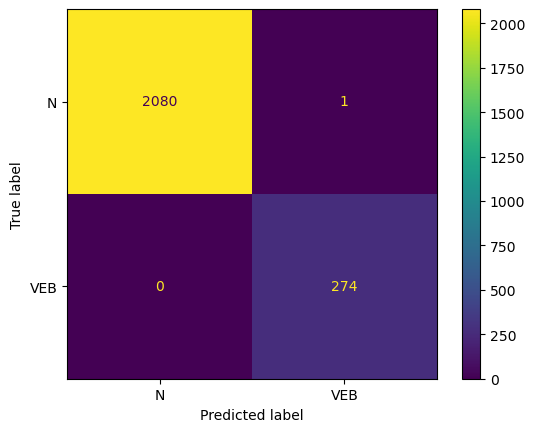

Fold 75:
  Test:  patient=74
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1482
         2.0       1.00      1.00      1.00       612

    accuracy                           1.00      2094
   macro avg       1.00      1.00      1.00      2094
weighted avg       1.00      1.00      1.00      2094

              0.0    2.0  accuracy  macro avg  weighted avg
precision     1.0    1.0       1.0        1.0           1.0
recall        1.0    1.0       1.0        1.0           1.0
f1-score      1.0    1.0       1.0        1.0           1.0
support    1482.0  612.0       1.0     2094.0        2094.0


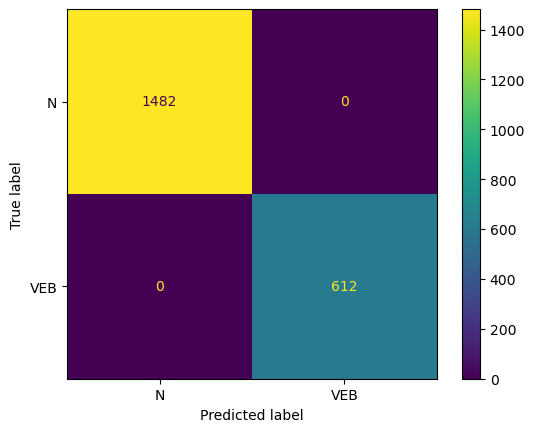

C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\numpy\core\fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\numpy\core\_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [24]:
X=df_cardio.drop('type',axis=1)
y=df_cardio['type']
groups=df_cardio['patient']
skf = LeaveOneGroupOut()


start_time=time.time()
df_smote_PCA, acc_smote_PCA,confusion_matrix_final_PCA,list_PCA = cross_valid(pipe_smote_PCA, skf, X, y,groups)
end_time=time.time()

In [25]:
print("Time"+str(end_time-start_time))

Time287.5094804763794


In [26]:
df_smote_PCA

,0.0,2.0,macro avg,weighted avg,1.0
f1-score,0.983127,0.850980,0.687838,0.975180,0.353399
precision,0.996650,0.795257,0.690733,0.989639,0.203379
recall,0.972960,0.890080,0.747606,0.967336,0.625308
support,2047.280000,270.270270,2340.053333,2340.053333,30.123077


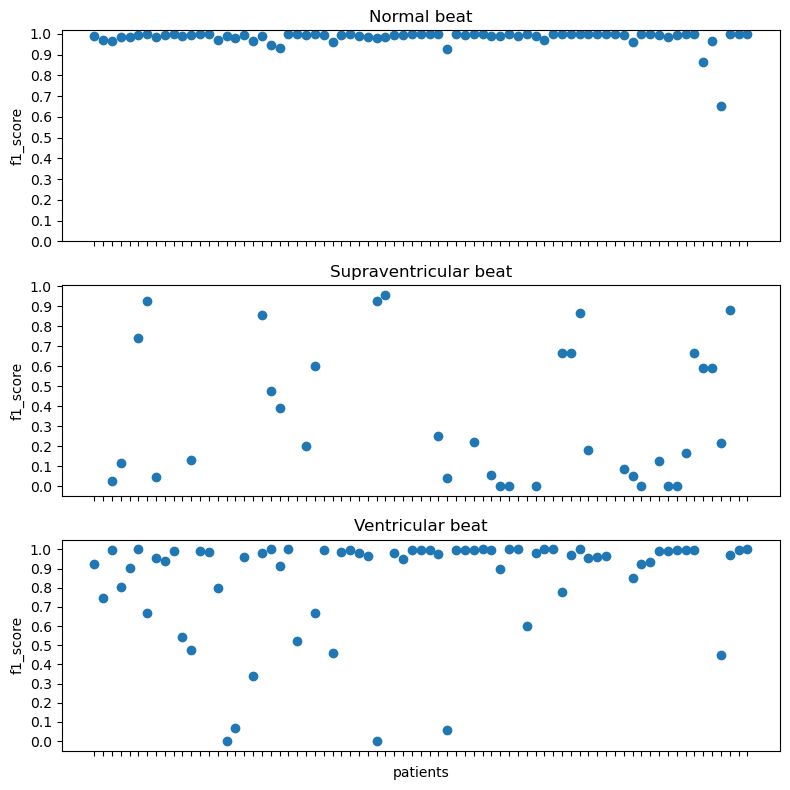

In [27]:
print_plot(list_PCA)

In [30]:
from sklearn.feature_selection import SelectKBest, mutual_info_classif
pipe_f30 = Pipeline([
        ('f_classif', SelectKBest(mutual_info_classif, k=30)),
        ('sampling', SMOTE(random_state = 123)),
        ('classification', KNeighborsClassifier(n_neighbors=10))
    ])
pipe_f30

Pipeline(steps=[('f_classif',
                 SelectKBest(k=30,
                             score_func=<function mutual_info_classif at 0x000001C029B55C60>)),
                ('sampling', SMOTE(random_state=123)),
                ('classification', KNeighborsClassifier(n_neighbors=10))])

Fold 1:
  Test:  patient=0
              precision    recall  f1-score   support

         0.0       0.99      0.97      0.98      2411
         1.0       0.00      0.00      0.00         0
         2.0       0.82      0.95      0.88       344

    accuracy                           0.97      2755
   macro avg       0.60      0.64      0.62      2755
weighted avg       0.97      0.97      0.97      2755

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.994043  0.0    0.817955  0.966969     0.603999      0.972056
recall        0.968893  NaN    0.953488  0.966969     0.640794      0.966969
f1-score      0.981306  NaN    0.880537  0.966969     0.620614      0.968724
support    2411.000000  0.0  344.000000  0.966969  2755.000000   2755.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

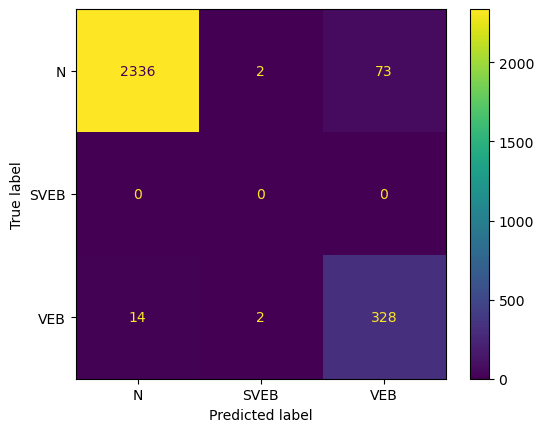

Fold 2:
  Test:  patient=1
              precision    recall  f1-score   support

         0.0       0.99      0.98      0.98      2443
         1.0       0.00      0.00      0.00         0
         2.0       0.79      0.93      0.86       229

    accuracy                           0.97      2672
   macro avg       0.60      0.64      0.61      2672
weighted avg       0.98      0.97      0.97      2672

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.993336  0.0    0.791822  0.972305     0.595053      0.976066
recall        0.976259  NaN    0.930131  0.972305     0.635463      0.972305
f1-score      0.984723  NaN    0.855422  0.972305     0.613382      0.973642
support    2443.000000  0.0  229.000000  0.972305  2672.000000   2672.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

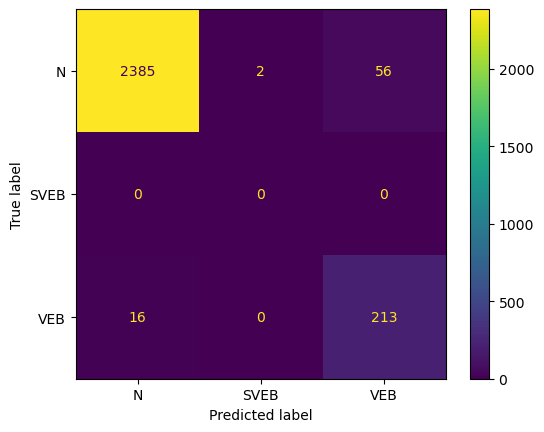

Fold 3:
  Test:  patient=2
              precision    recall  f1-score   support

         0.0       1.00      0.94      0.97      2323
         1.0       0.00      0.00      0.00         2
         2.0       0.86      0.96      0.91       125

    accuracy                           0.94      2450
   macro avg       0.62      0.63      0.62      2450
weighted avg       0.99      0.94      0.96      2450

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.997716  0.0    0.857143  0.940408     0.618286      0.989729
recall        0.940164  0.0    0.960000  0.940408     0.633388      0.940408
f1-score      0.968085  0.0    0.905660  0.940408     0.624582      0.964110
support    2323.000000  2.0  125.000000  0.940408  2450.000000   2450.000000


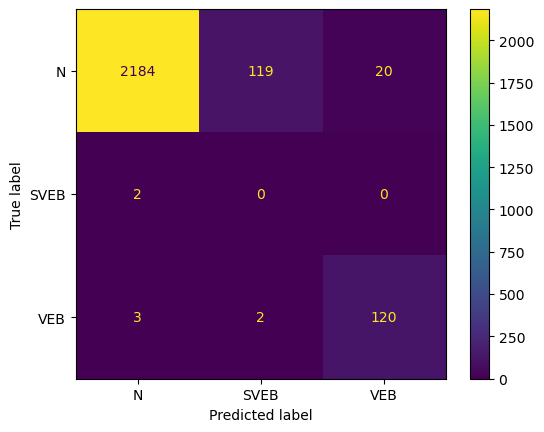

Fold 4:
  Test:  patient=3
              precision    recall  f1-score   support

         0.0       0.98      0.92      0.95      2268
         1.0       0.00      0.00      0.00        16
         2.0       0.35      0.77      0.48       121

    accuracy                           0.90      2405
   macro avg       0.44      0.56      0.48      2405
weighted avg       0.94      0.90      0.92      2405

                   0.0   1.0         2.0  accuracy    macro avg  weighted avg
precision     0.980697   0.0    0.345725  0.904782     0.442141      0.942226
recall        0.918430   0.0    0.768595  0.904782     0.562342      0.904782
f1-score      0.948543   0.0    0.476923  0.904782     0.475155      0.918504
support    2268.000000  16.0  121.000000  0.904782  2405.000000   2405.000000


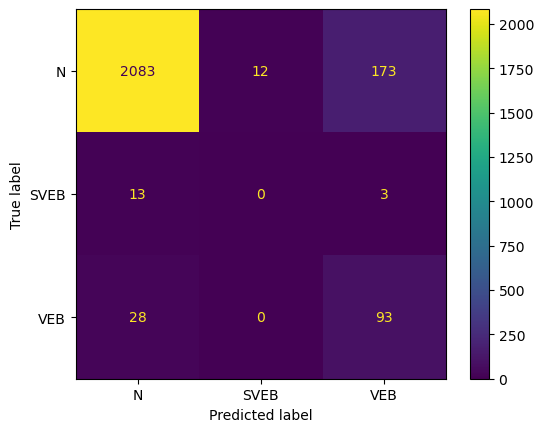

Fold 5:
  Test:  patient=4
              precision    recall  f1-score   support

         0.0       0.96      1.00      0.98      1518
         2.0       1.00      0.75      0.86       247

    accuracy                           0.96      1765
   macro avg       0.98      0.87      0.92      1765
weighted avg       0.97      0.96      0.96      1765

                   0.0         2.0  accuracy    macro avg  weighted avg
precision     0.960759    1.000000  0.964873     0.980380      0.966251
recall        1.000000    0.748988  0.964873     0.874494      0.964873
f1-score      0.979987    0.856481  0.964873     0.918234      0.962703
support    1518.000000  247.000000  0.964873  1765.000000   1765.000000


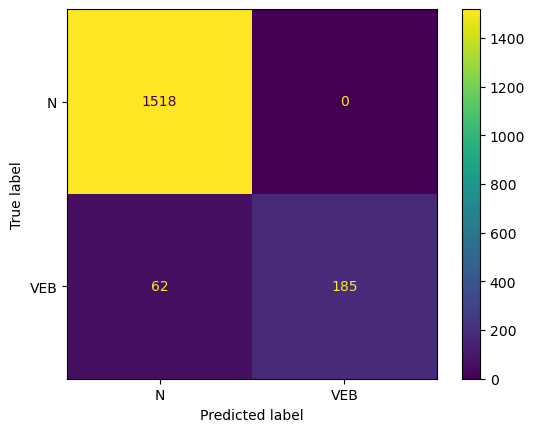

Fold 6:
  Test:  patient=5
              precision    recall  f1-score   support

         0.0       1.00      0.99      0.99      2434
         1.0       0.56      0.92      0.70        48
         2.0       1.00      0.89      0.94         9

    accuracy                           0.98      2491
   macro avg       0.85      0.93      0.88      2491
weighted avg       0.99      0.98      0.99      2491

                   0.0        1.0       2.0  accuracy    macro avg  \
precision     0.998337   0.564103  1.000000  0.984745     0.854146   
recall        0.986442   0.916667  0.888889  0.984745     0.930666   
f1-score      0.992354   0.698413  0.941176  0.984745     0.877314   
support    2434.000000  48.000000  9.000000  0.984745  2491.000000   

           weighted avg  
precision      0.989975  
recall         0.984745  
f1-score       0.986505  
support     2491.000000  


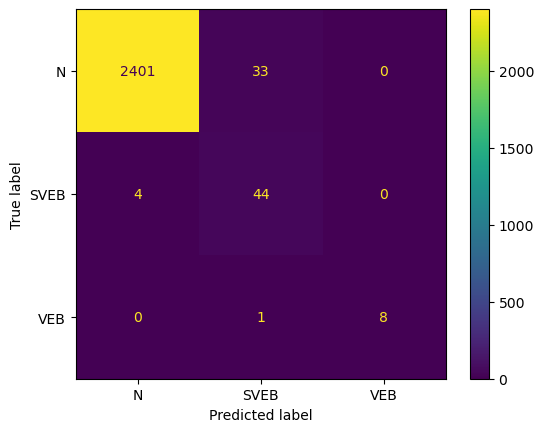

Fold 7:
  Test:  patient=6
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2638
         1.0       0.91      0.91      0.91        65
         2.0       0.25      1.00      0.40         1

    accuracy                           0.99      2704
   macro avg       0.72      0.97      0.77      2704
weighted avg       1.00      0.99      0.99      2704

                   0.0        1.0   2.0  accuracy    macro avg  weighted avg
precision     0.997723   0.907692  0.25  0.994453     0.718472      0.995282
recall        0.996588   0.907692  1.00  0.994453     0.968094      0.994453
f1-score      0.997155   0.907692  0.40  0.994453     0.768283      0.994784
support    2638.000000  65.000000  1.00  0.994453  2704.000000   2704.000000


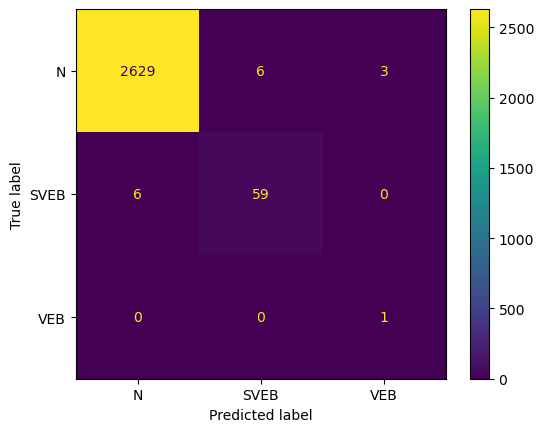

Fold 8:
  Test:  patient=7
              precision    recall  f1-score   support

         0.0       0.98      0.97      0.98      1776
         1.0       0.00      0.00      0.00         2
         2.0       0.96      0.91      0.93       350

    accuracy                           0.96      2128
   macro avg       0.65      0.63      0.64      2128
weighted avg       0.98      0.96      0.97      2128

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.982916  0.0    0.955224  0.961466     0.646047      0.977437
recall        0.971847  0.0    0.914286  0.961466     0.628711      0.961466
f1-score      0.977350  0.0    0.934307  0.961466     0.637219      0.969352
support    1776.000000  2.0  350.000000  0.961466  2128.000000   2128.000000


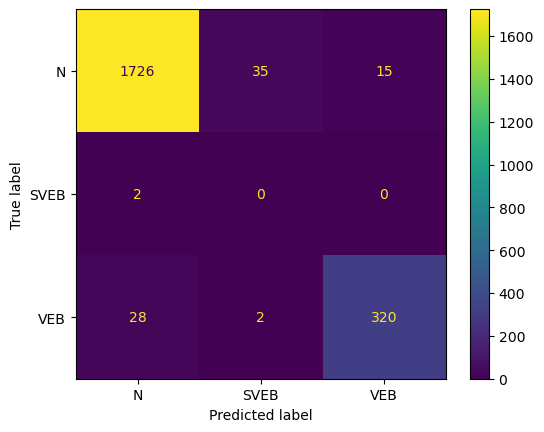

Fold 9:
  Test:  patient=8
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2946
         1.0       0.00      0.00      0.00         0
         2.0       0.84      0.90      0.87        41

    accuracy                           1.00      2987
   macro avg       0.61      0.63      0.62      2987
weighted avg       1.00      1.00      1.00      2987

                   0.0  1.0        2.0  accuracy    macro avg  weighted avg
precision     0.998640  0.0   0.840909  0.995648     0.613183      0.996475
recall        0.996945  NaN   0.902439  0.995648     0.633128      0.995648
f1-score      0.997792  NaN   0.870588  0.995648     0.622793      0.996046
support    2946.000000  0.0  41.000000  0.995648  2987.000000   2987.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

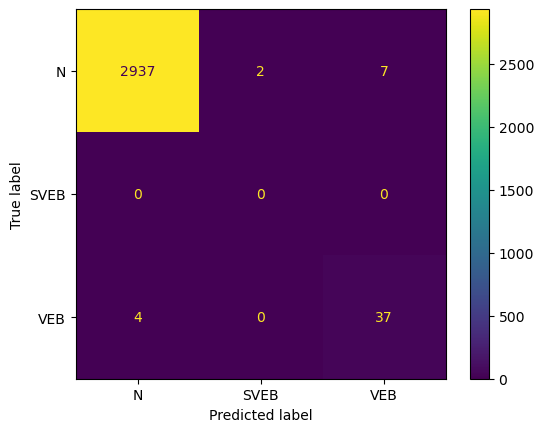

Fold 10:
  Test:  patient=9


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       1.00      0.99      1.00      3597
         1.0       0.00      0.00      0.00         0
         2.0       0.75      0.92      0.83        83

    accuracy                           0.99      3680
   macro avg       0.58      0.64      0.61      3680
weighted avg       0.99      0.99      0.99      3680

                   0.0  1.0        2.0  accuracy    macro avg  weighted avg
precision     0.999440  0.0   0.752475  0.991304     0.583972      0.993870
recall        0.993050  NaN   0.915663  0.991304     0.636237      0.991304
f1-score      0.996235  NaN   0.826087  0.991304     0.607441      0.992397
support    3597.000000  0.0  83.000000  0.991304  3680.000000   3680.000000


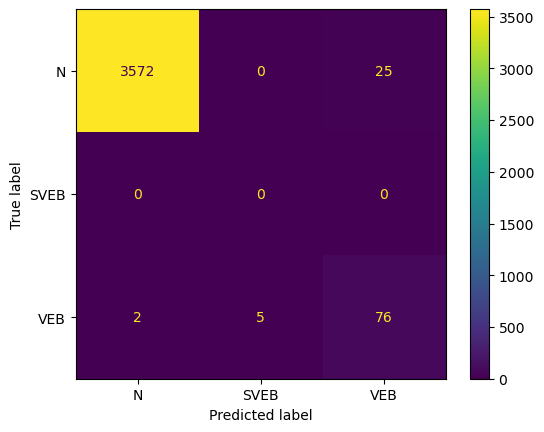

Fold 11:
  Test:  patient=10
              precision    recall  f1-score   support

         0.0       1.00      0.99      1.00      2076
         2.0       0.25      1.00      0.40         4

    accuracy                           0.99      2080
   macro avg       0.62      1.00      0.70      2080
weighted avg       1.00      0.99      1.00      2080

                   0.0   2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.25  0.994231     0.625000      0.998558
recall        0.994220  1.00  0.994231     0.997110      0.994231
f1-score      0.997101  0.40  0.994231     0.698551      0.995953
support    2076.000000  4.00  0.994231  2080.000000   2080.000000


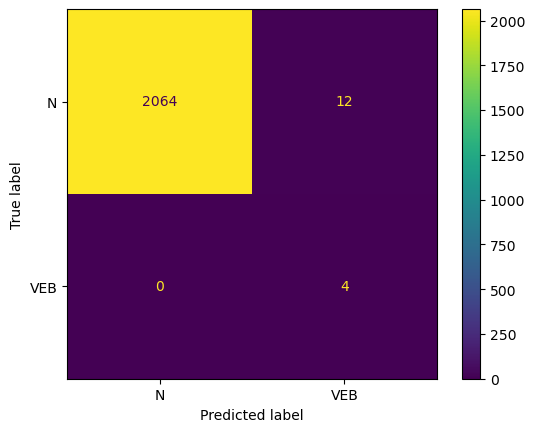

Fold 12:
  Test:  patient=11
              precision    recall  f1-score   support

         0.0       1.00      0.99      0.99      2798
         1.0       0.00      0.00      0.00         1
         2.0       0.20      0.33      0.25         6

    accuracy                           0.99      2805
   macro avg       0.40      0.44      0.41      2805
weighted avg       1.00      0.99      0.99      2805

                   0.0  1.0       2.0  accuracy    macro avg  weighted avg
precision     0.998197  0.0  0.200000  0.987522     0.399399      0.996134
recall        0.989278  0.0  0.333333  0.987522     0.440870      0.987522
f1-score      0.993717  0.0  0.250000  0.987522     0.414572      0.991772
support    2798.000000  1.0  6.000000  0.987522  2805.000000   2805.000000


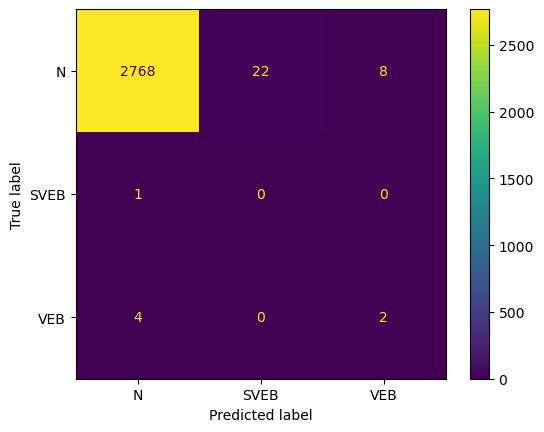

Fold 13:
  Test:  patient=12


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       1.00      0.99      0.99      1791
         1.0       0.00      0.00      0.00         0
         2.0       0.98      1.00      0.99       230

    accuracy                           0.99      2021
   macro avg       0.66      0.66      0.66      2021
weighted avg       1.00      0.99      0.99      2021

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.0    0.978723  0.989114     0.659574      0.997579
recall        0.987716  NaN    1.000000  0.989114     0.662572      0.989114
f1-score      0.993820  NaN    0.989247  0.989114     0.661023      0.993300
support    1791.000000  0.0  230.000000  0.989114  2021.000000   2021.000000


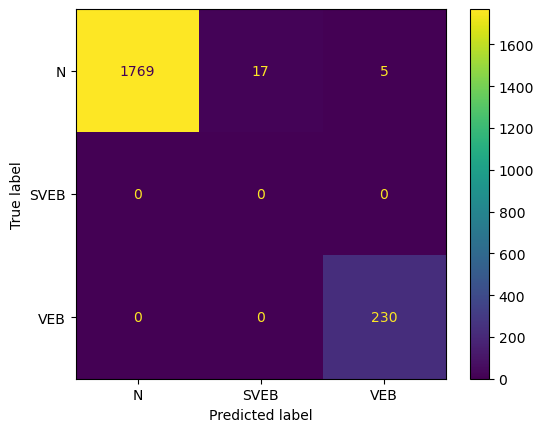

Fold 14:
  Test:  patient=13


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1800
         1.0       0.00      0.00      0.00         0
         2.0       0.98      0.89      0.93        64

    accuracy                           0.99      1864
   macro avg       0.66      0.63      0.64      1864
weighted avg       1.00      0.99      1.00      1864

                   0.0  1.0        2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.0   0.982759  0.993562     0.660920      0.999408
recall        0.997222  NaN   0.890625  0.993562     0.629282      0.993562
f1-score      0.998609  NaN   0.934426  0.993562     0.644345      0.996405
support    1800.000000  0.0  64.000000  0.993562  1864.000000   1864.000000


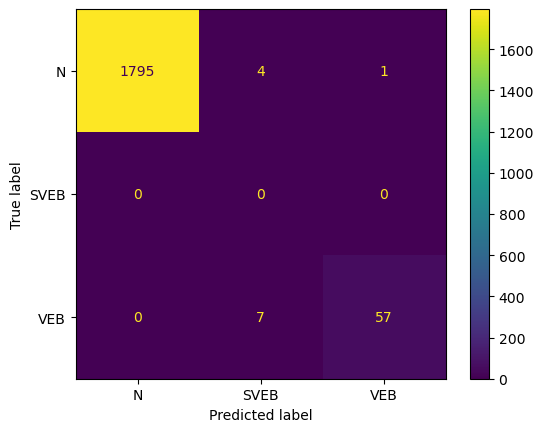

Fold 15:
  Test:  patient=14


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       1.00      0.93      0.96      2630
         1.0       0.00      0.00      0.00         0
         2.0       0.25      0.33      0.29         3

    accuracy                           0.93      2633
   macro avg       0.42      0.42      0.42      2633
weighted avg       1.00      0.93      0.96      2633

                   0.0  1.0       2.0  accuracy    macro avg  weighted avg
precision     0.999183  0.0  0.250000  0.929738     0.416394      0.998330
recall        0.930418  NaN  0.333333  0.929738     0.421251      0.929738
f1-score      0.963576  NaN  0.285714  0.929738     0.416430      0.962803
support    2630.000000  0.0  3.000000  0.929738  2633.000000   2633.000000


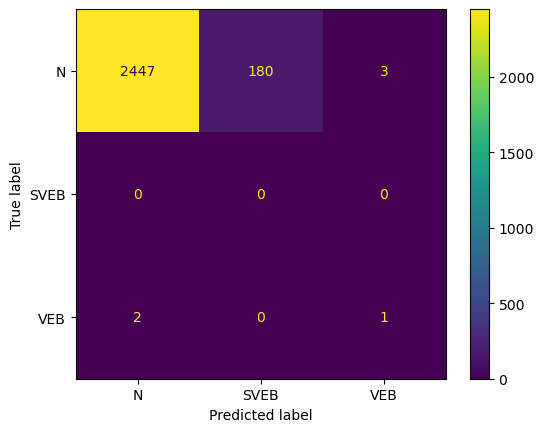

Fold 16:
  Test:  patient=15
              precision    recall  f1-score   support

         0.0       1.00      0.93      0.96      1518
         1.0       0.00      0.00      0.00         0
         2.0       0.02      1.00      0.03         2

    accuracy                           0.93      1520
   macro avg       0.34      0.64      0.33      1520
weighted avg       1.00      0.93      0.96      1520

                   0.0  1.0       2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.0  0.017544  0.925658     0.339181      0.998707
recall        0.925560  NaN  1.000000  0.925658     0.641853      0.925658
f1-score      0.961341  NaN  0.034483  0.925658     0.331941      0.960122
support    1518.000000  0.0  2.000000  0.925658  1520.000000   1520.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

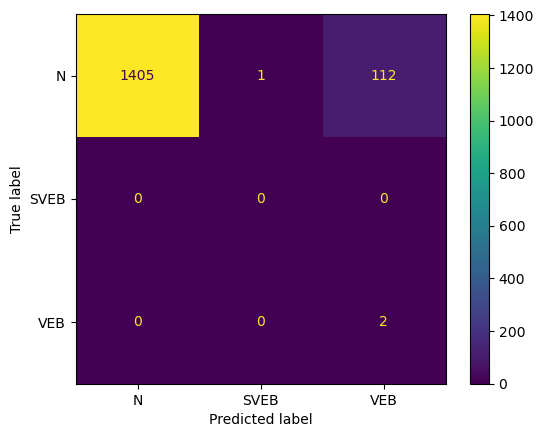

Fold 17:
  Test:  patient=16


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       1.00      0.99      0.99      1644
         1.0       0.00      0.00      0.00         0
         2.0       0.39      0.41      0.40        27

    accuracy                           0.98      1671
   macro avg       0.46      0.46      0.46      1671
weighted avg       0.99      0.98      0.98      1671

                   0.0  1.0        2.0  accuracy    macro avg  weighted avg
precision     0.999384  0.0   0.392857  0.977259     0.464080      0.989584
recall        0.986618  NaN   0.407407  0.977259     0.464675      0.977259
f1-score      0.992960  NaN   0.400000  0.977259     0.464320      0.983379
support    1644.000000  0.0  27.000000  0.977259  1671.000000   1671.000000


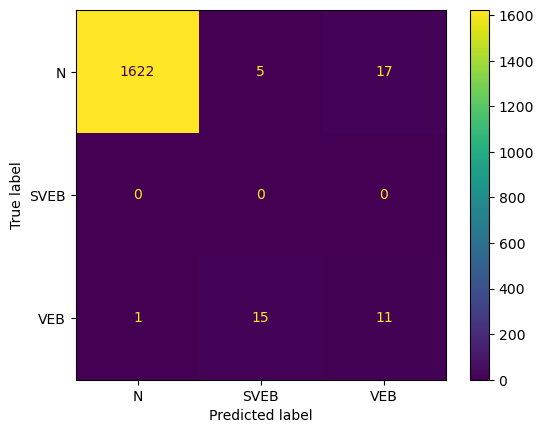

Fold 18:
  Test:  patient=17
              precision    recall  f1-score   support

         0.0       1.00      0.96      0.98      2660
         1.0       0.00      0.00      0.00         0
         2.0       0.89      0.97      0.93       366

    accuracy                           0.96      3026
   macro avg       0.63      0.64      0.64      3026
weighted avg       0.98      0.96      0.97      3026

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.996097  0.0    0.887781  0.961005     0.627959      0.982996
recall        0.959398  NaN    0.972678  0.961005     0.644025      0.961005
f1-score      0.977403  NaN    0.928292  0.961005     0.635232      0.971463
support    2660.000000  0.0  366.000000  0.961005  3026.000000   3026.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

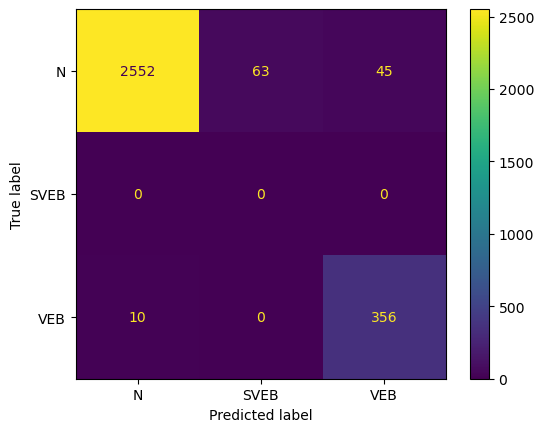

Fold 19:
  Test:  patient=18
              precision    recall  f1-score   support

         0.0       1.00      0.81      0.89      1211
         1.0       0.00      0.00      0.00         0
         2.0       0.87      1.00      0.93       849

    accuracy                           0.89      2060
   macro avg       0.62      0.60      0.61      2060
weighted avg       0.95      0.89      0.91      2060

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.0    0.868098  0.886893     0.622699      0.945639
recall        0.807597  NaN    1.000000  0.886893     0.602532      0.886893
f1-score      0.893559  NaN    0.929392  0.886893     0.607650      0.908327
support    1211.000000  0.0  849.000000  0.886893  2060.000000   2060.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

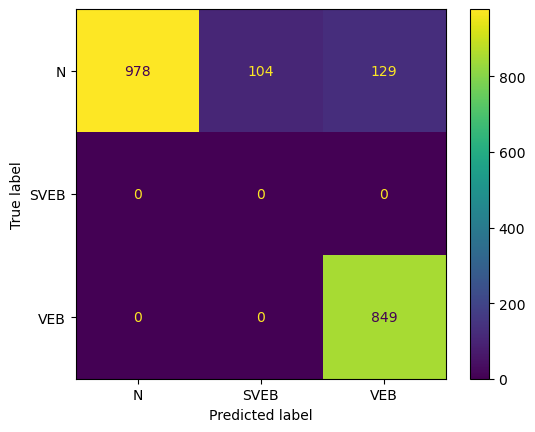

Fold 20:
  Test:  patient=19
              precision    recall  f1-score   support

         0.0       0.98      0.96      0.97      2360
         1.0       0.60      0.75      0.67       179
         2.0       0.97      0.94      0.95       110

    accuracy                           0.95      2649
   macro avg       0.85      0.88      0.86      2649
weighted avg       0.95      0.95      0.95      2649

                   0.0         1.0         2.0  accuracy    macro avg  \
precision     0.979292    0.600000    0.971698  0.946772     0.850330   
recall        0.961864    0.754190    0.936364  0.946772     0.884139   
f1-score      0.970500    0.668317    0.953704  0.946772     0.864174   
support    2360.000000  179.000000  110.000000  0.946772  2649.000000   

           weighted avg  
precision      0.953347  
recall         0.946772  
f1-score       0.949383  
support     2649.000000  


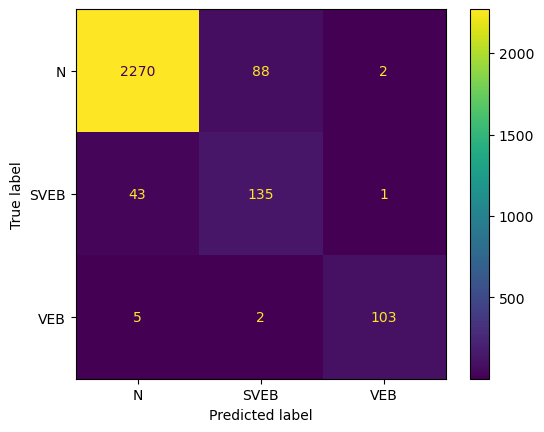

Fold 21:
  Test:  patient=20
              precision    recall  f1-score   support

         0.0       0.99      0.88      0.93      2070
         1.0       0.27      0.87      0.41       104
         2.0       1.00      1.00      1.00         8

    accuracy                           0.88      2182
   macro avg       0.75      0.92      0.78      2182
weighted avg       0.96      0.88      0.91      2182

                   0.0         1.0  2.0  accuracy    macro avg  weighted avg
precision     0.992400    0.271084  1.0  0.882676     0.754495      0.958048
recall        0.883092    0.865385  1.0  0.882676     0.916159      0.882676
f1-score      0.934560    0.412844  1.0  0.882676     0.782468      0.909934
support    2070.000000  104.000000  8.0  0.882676  2182.000000   2182.000000


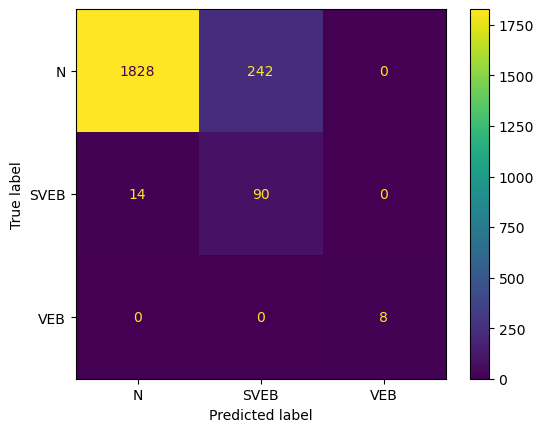

Fold 22:
  Test:  patient=21
              precision    recall  f1-score   support

         0.0       0.98      0.95      0.96      2814
         1.0       0.39      0.82      0.53       124
         2.0       0.96      0.77      0.85       185

    accuracy                           0.93      3123
   macro avg       0.78      0.85      0.78      3123
weighted avg       0.96      0.93      0.94      3123

                   0.0         1.0         2.0  accuracy    macro avg  \
precision     0.981584    0.392308    0.959459  0.931476     0.777784   
recall        0.947050    0.822581    0.767568  0.931476     0.845733   
f1-score      0.964008    0.531250    0.852853  0.931476     0.782704   
support    2814.000000  124.000000  185.000000  0.931476  3123.000000   

           weighted avg  
precision      0.956876  
recall         0.931476  
f1-score       0.940241  
support     3123.000000  


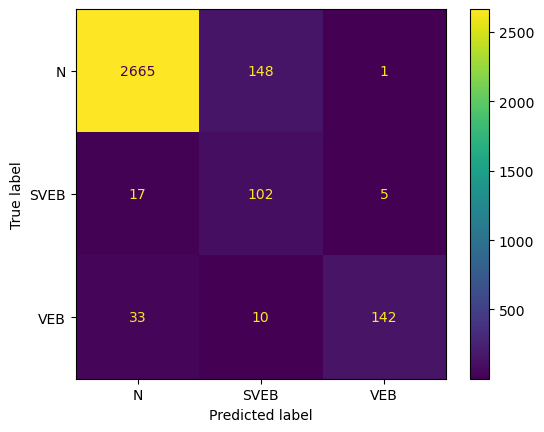

Fold 23:
  Test:  patient=22


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       1.00      0.93      0.97      2190
         1.0       0.00      0.00      0.00         0
         2.0       0.11      1.00      0.19        13

    accuracy                           0.93      2203
   macro avg       0.37      0.64      0.39      2203
weighted avg       0.99      0.93      0.96      2203

                   0.0  1.0        2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.0   0.105691  0.932819     0.368564      0.994723
recall        0.932420  NaN   1.000000  0.932819     0.644140      0.932819
f1-score      0.965028  NaN   0.191176  0.932819     0.385402      0.960462
support    2190.000000  0.0  13.000000  0.932819  2203.000000   2203.000000


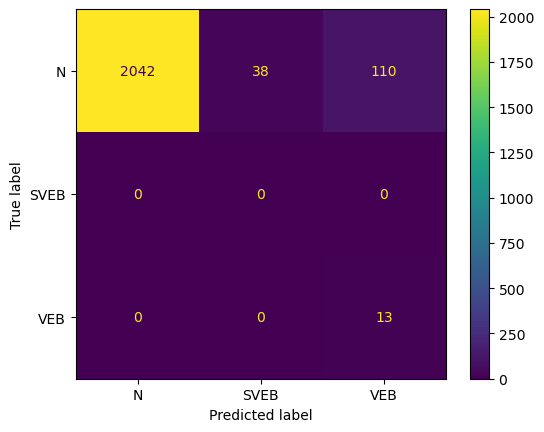

Fold 24:
  Test:  patient=23
              precision    recall  f1-score   support

         0.0       1.00      0.90      0.95      2563
         1.0       0.00      0.00      0.00         0
         2.0       0.02      1.00      0.05         6

    accuracy                           0.90      2569
   macro avg       0.34      0.63      0.33      2569
weighted avg       1.00      0.90      0.95      2569

                   0.0  1.0       2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.0  0.024291  0.904632     0.341430      0.997721
recall        0.904409  NaN  1.000000  0.904632     0.634803      0.904632
f1-score      0.949805  NaN  0.047431  0.904632     0.332412      0.947698
support    2563.000000  0.0  6.000000  0.904632  2569.000000   2569.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

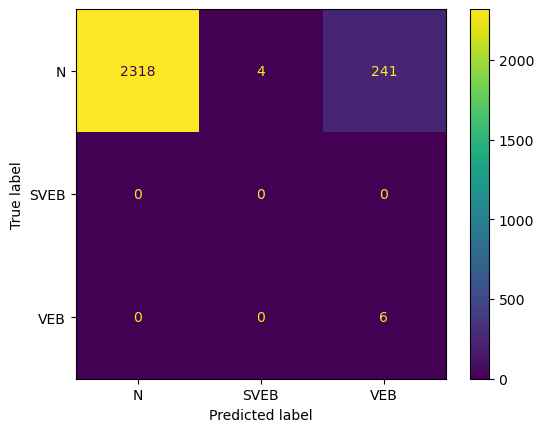

Fold 25:
  Test:  patient=24
              precision    recall  f1-score   support

         0.0       1.00      0.94      0.97      1703
         1.0       0.01      0.50      0.02         2
         2.0       0.15      0.80      0.25         5

    accuracy                           0.94      1710
   macro avg       0.39      0.75      0.41      1710
weighted avg       1.00      0.94      0.96      1710

                   0.0       1.0       2.0  accuracy    macro avg  \
precision     0.999374  0.011765  0.148148  0.936842     0.386429   
recall        0.937757  0.500000  0.800000  0.936842     0.745919   
f1-score      0.967586  0.022989  0.250000  0.936842     0.413525   
support    1703.000000  2.000000  5.000000  0.936842  1710.000000   

           weighted avg  
precision      0.995730  
recall         0.936842  
f1-score       0.964383  
support     1710.000000  


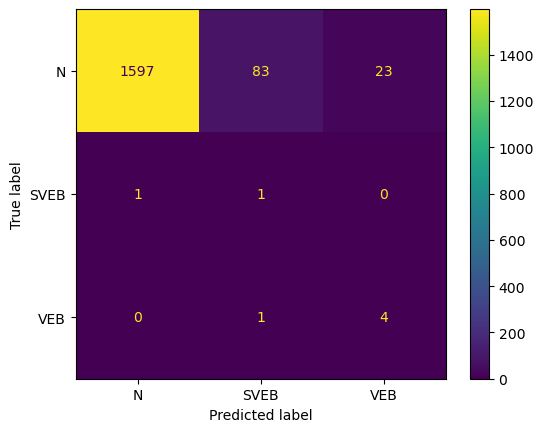

Fold 26:
  Test:  patient=25
              precision    recall  f1-score   support

         0.0       1.00      0.99      0.99      1496
         1.0       0.67      0.57      0.62         7
         2.0       0.29      1.00      0.44         4

    accuracy                           0.99      1507
   macro avg       0.65      0.85      0.68      1507
weighted avg       0.99      0.99      0.99      1507

                   0.0       1.0       2.0  accuracy    macro avg  \
precision     0.997983  0.666667  0.285714  0.990046     0.650121   
recall        0.991979  0.571429  1.000000  0.990046     0.854469   
f1-score      0.994972  0.615385  0.444444  0.990046     0.684934   
support    1496.000000  7.000000  4.000000  0.990046  1507.000000   

           weighted avg  
precision      0.994553  
recall         0.990046  
f1-score       0.991747  
support     1507.000000  


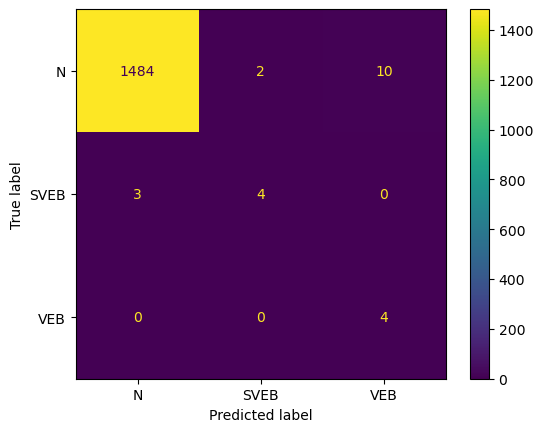

Fold 27:
  Test:  patient=26
              precision    recall  f1-score   support

         0.0       1.00      0.99      0.99      1884
         1.0       0.00      0.00      0.00         0
         2.0       0.99      1.00      0.99       719

    accuracy                           0.99      2603
   macro avg       0.66      0.66      0.66      2603
weighted avg       1.00      0.99      0.99      2603

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.0    0.987637   0.99078     0.662546      0.996585
recall        0.987261  NaN    1.000000   0.99078     0.662420      0.990780
f1-score      0.993590  NaN    0.993780   0.99078     0.662457      0.993642
support    1884.000000  0.0  719.000000   0.99078  2603.000000   2603.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

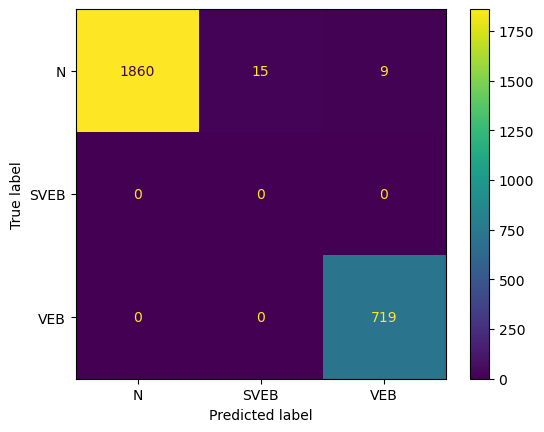

Fold 28:
  Test:  patient=27
              precision    recall  f1-score   support

         0.0       1.00      0.99      0.99      1711
         1.0       0.00      0.00      0.00         0
         2.0       0.19      1.00      0.32         4

    accuracy                           0.99      1715
   macro avg       0.40      0.66      0.44      1715
weighted avg       1.00      0.99      0.99      1715

                   0.0  1.0       2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.0  0.190476  0.988921     0.396825      0.998112
recall        0.988895  NaN  1.000000  0.988921     0.662965      0.988921
f1-score      0.994417  NaN  0.320000  0.988921     0.438139      0.992844
support    1711.000000  0.0  4.000000  0.988921  1715.000000   1715.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

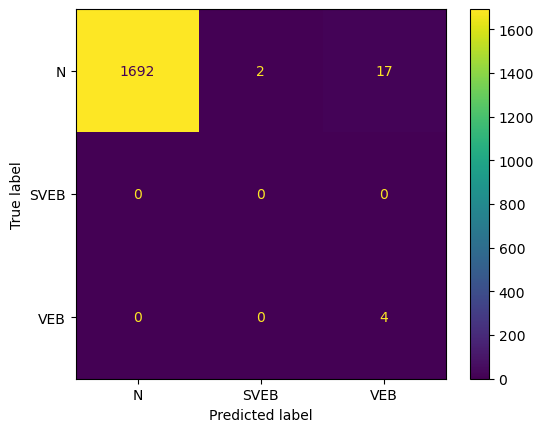

Fold 29:
  Test:  patient=28
              precision    recall  f1-score   support

         0.0       0.98      0.96      0.97      1835
         1.0       0.00      0.00      0.00         0
         2.0       0.93      0.95      0.94       783

    accuracy                           0.96      2618
   macro avg       0.64      0.64      0.64      2618
weighted avg       0.96      0.96      0.96      2618

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.980534  0.0    0.925373  0.957601     0.635302      0.964036
recall        0.960763  NaN    0.950192  0.957601     0.636985      0.957601
f1-score      0.970548  NaN    0.937618  0.957601     0.636055      0.960699
support    1835.000000  0.0  783.000000  0.957601  2618.000000   2618.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

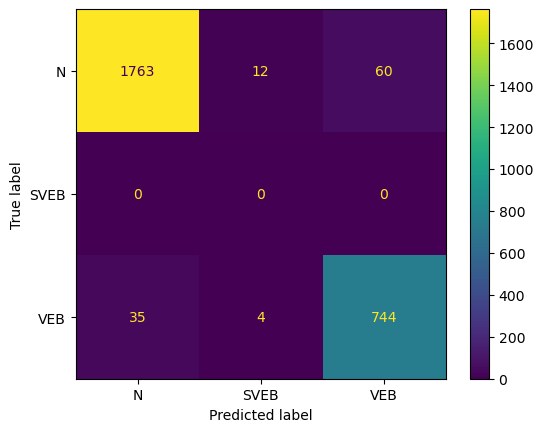

Fold 30:
  Test:  patient=29
              precision    recall  f1-score   support

         0.0       1.00      0.99      0.99      1705
         1.0       0.00      0.00      0.00         0
         2.0       0.98      0.98      0.98       755

    accuracy                           0.99      2460
   macro avg       0.66      0.66      0.66      2460
weighted avg       0.99      0.99      0.99      2460

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.996464  0.0    0.984000  0.987398     0.660155      0.992639
recall        0.991789  NaN    0.977483  0.987398     0.656424      0.987398
f1-score      0.994121  NaN    0.980731  0.987398     0.658284      0.990012
support    1705.000000  0.0  755.000000  0.987398  2460.000000   2460.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

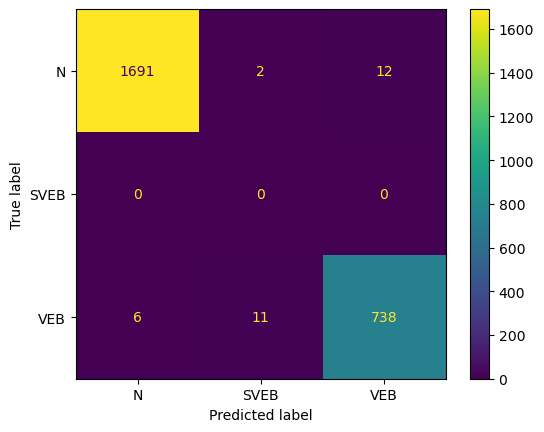

Fold 31:
  Test:  patient=30
              precision    recall  f1-score   support

         0.0       0.97      0.98      0.97      1843
         1.0       0.00      0.00      0.00         0
         2.0       0.97      0.92      0.95      1364

    accuracy                           0.95      3207
   macro avg       0.65      0.63      0.64      3207
weighted avg       0.97      0.95      0.96      3207

                   0.0  1.0          2.0  accuracy    macro avg  weighted avg
precision     0.968800  0.0     0.971495  0.954786     0.646765      0.969946
recall        0.977211  NaN     0.924487  0.954786     0.633899      0.954786
f1-score      0.972988  NaN     0.947408  0.954786     0.640132      0.962108
support    1843.000000  0.0  1364.000000  0.954786  3207.000000   3207.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

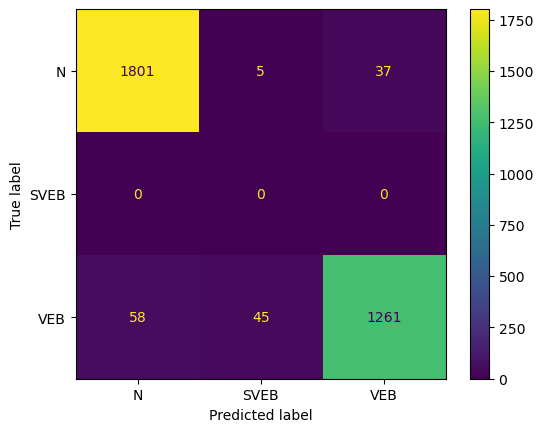

Fold 32:
  Test:  patient=31
              precision    recall  f1-score   support

         0.0       1.00      0.93      0.97      1560
         1.0       0.00      0.00      0.00         0
         2.0       0.44      1.00      0.61        57

    accuracy                           0.94      1617
   macro avg       0.48      0.64      0.52      1617
weighted avg       0.98      0.94      0.95      1617

                   0.0  1.0        2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.0   0.435115  0.935065     0.478372      0.980088
recall        0.932692  NaN   1.000000  0.935065     0.644231      0.935065
f1-score      0.965174  NaN   0.606383  0.935065     0.523852      0.952527
support    1560.000000  0.0  57.000000  0.935065  1617.000000   1617.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

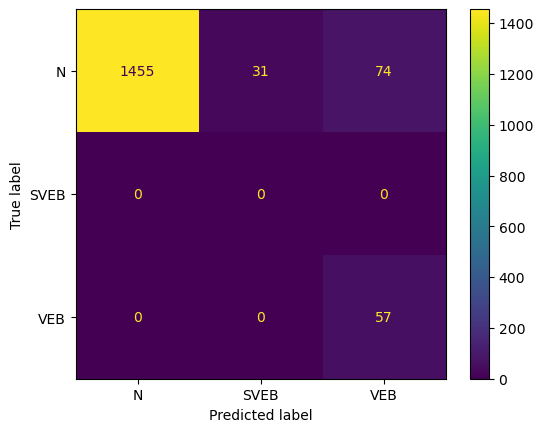

Fold 33:
  Test:  patient=32
              precision    recall  f1-score   support

         0.0       0.99      0.94      0.96      1245
         1.0       0.88      0.96      0.92       589
         2.0       0.00      0.00      0.00         1

    accuracy                           0.95      1835
   macro avg       0.63      0.63      0.63      1835
weighted avg       0.96      0.95      0.95      1835

                   0.0         1.0  2.0  accuracy    macro avg  weighted avg
precision     0.992347    0.884735  0.0  0.945504     0.625694      0.957265
recall        0.937349    0.964346  0.0  0.945504     0.633899      0.945504
f1-score      0.964064    0.922827  0.0  0.945504     0.628964      0.950303
support    1245.000000  589.000000  1.0  0.945504  1835.000000   1835.000000


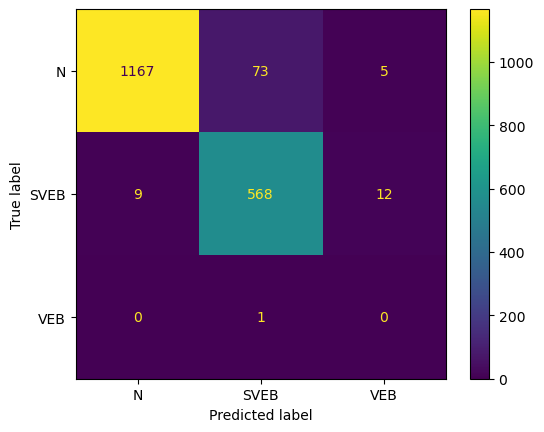

Fold 34:
  Test:  patient=33
              precision    recall  f1-score   support

         0.0       1.00      0.96      0.98      1427
         1.0       0.89      0.96      0.93       536
         2.0       0.00      0.00      0.00         0

    accuracy                           0.96      1963
   macro avg       0.63      0.64      0.63      1963
weighted avg       0.97      0.96      0.96      1963

                   0.0         1.0  2.0  accuracy    macro avg  weighted avg
precision     0.995624    0.894097  0.0  0.957718     0.629907      0.967902
recall        0.956552    0.960821  NaN  0.957718     0.639124      0.957718
f1-score      0.975697    0.926259  NaN  0.957718     0.633985      0.962198
support    1427.000000  536.000000  0.0  0.957718  1963.000000   1963.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

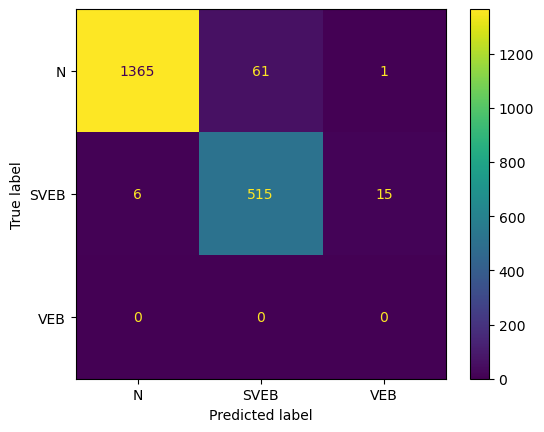

Fold 35:
  Test:  patient=34


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       0.99      0.99      0.99      3199
         1.0       0.00      0.00      0.00         0
         2.0       0.93      0.91      0.92       457

    accuracy                           0.98      3656
   macro avg       0.64      0.63      0.64      3656
weighted avg       0.98      0.98      0.98      3656

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.988398  0.0    0.930649   0.97593     0.639682      0.981179
recall        0.985308  NaN    0.910284   0.97593     0.631864      0.975930
f1-score      0.986850  NaN    0.920354   0.97593     0.635735      0.978538
support    3199.000000  0.0  457.000000   0.97593  3656.000000   3656.000000


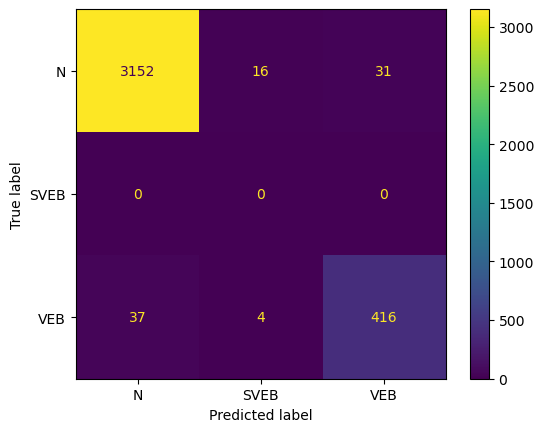

Fold 36:
  Test:  patient=35
              precision    recall  f1-score   support

         0.0       1.00      0.96      0.98      3447
         1.0       0.00      0.00      0.00         0
         2.0       0.81      0.97      0.88       450

    accuracy                           0.97      3897
   macro avg       0.60      0.65      0.62      3897
weighted avg       0.98      0.97      0.97      3897

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.997600  0.0    0.811111  0.965615     0.602904      0.976065
recall        0.964607  NaN    0.973333  0.965615     0.645980      0.965615
f1-score      0.980826  NaN    0.884848  0.965615     0.621891      0.969743
support    3447.000000  0.0  450.000000  0.965615  3897.000000   3897.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

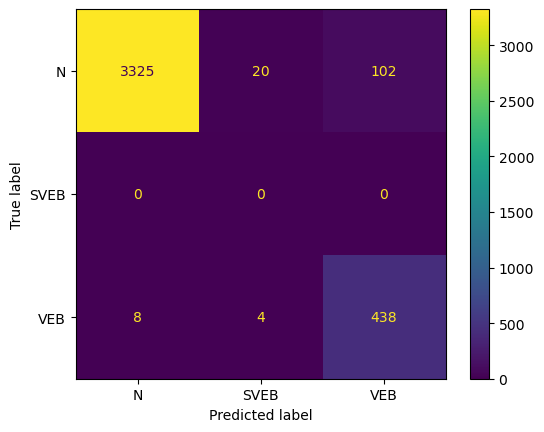

Fold 37:
  Test:  patient=36
              precision    recall  f1-score   support

         0.0       1.00      0.93      0.96      2007
         1.0       0.00      0.00      0.00         0
         2.0       0.98      1.00      0.99       452

    accuracy                           0.94      2459
   macro avg       0.66      0.64      0.65      2459
weighted avg       1.00      0.94      0.97      2459

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.0    0.978355  0.941846     0.659452      0.996021
recall        0.928749  NaN    1.000000  0.941846     0.642916      0.941846
f1-score      0.963059  NaN    0.989059  0.941846     0.650706      0.967838
support    2007.000000  0.0  452.000000  0.941846  2459.000000   2459.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

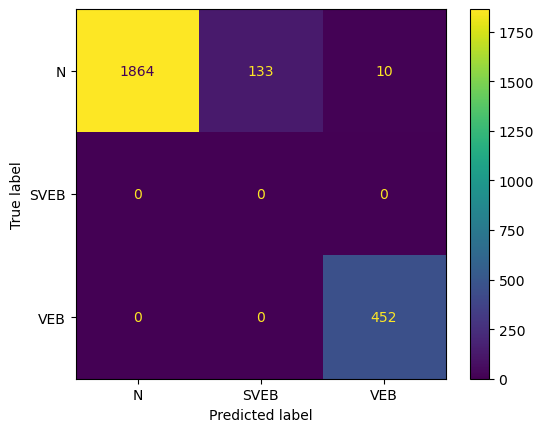

Fold 38:
  Test:  patient=37
              precision    recall  f1-score   support

         0.0       0.99      0.96      0.97      2153
         1.0       0.00      0.00      0.00         0
         2.0       0.87      0.92      0.89       543

    accuracy                           0.95      2696
   macro avg       0.62      0.62      0.62      2696
weighted avg       0.96      0.95      0.96      2696

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.987094  0.0    0.865854  0.950297     0.617649      0.962675
recall        0.959127  NaN    0.915285  0.950297     0.624804      0.950297
f1-score      0.972909  NaN    0.889884  0.950297     0.620931      0.956187
support    2153.000000  0.0  543.000000  0.950297  2696.000000   2696.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

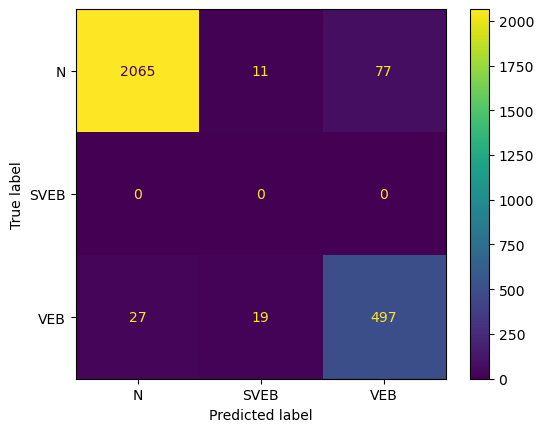

Fold 39:
  Test:  patient=38


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       0.99      1.00      0.99      1460
         1.0       0.00      0.00      0.00         0
         2.0       1.00      0.92      0.96       313

    accuracy                           0.98      1773
   macro avg       0.66      0.64      0.65      1773
weighted avg       0.99      0.98      0.99      1773

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.985135  0.0    0.996528  0.984208     0.660554      0.987146
recall        0.998630  NaN    0.916933  0.984208     0.638521      0.984208
f1-score      0.991837  NaN    0.955075  0.984208     0.648971      0.985347
support    1460.000000  0.0  313.000000  0.984208  1773.000000   1773.000000


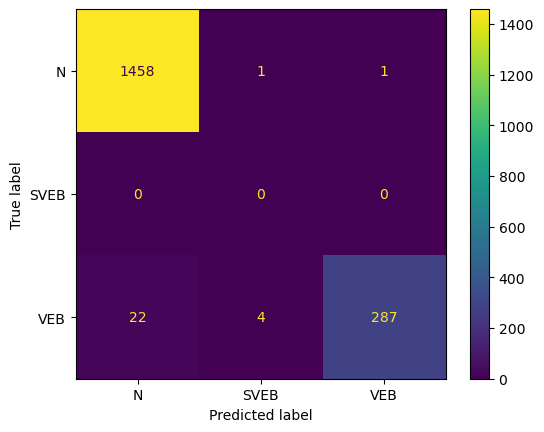

Fold 40:
  Test:  patient=39
              precision    recall  f1-score   support

         0.0       1.00      0.97      0.98      2566
         1.0       0.06      0.33      0.11         6
         2.0       0.67      0.98      0.80        92

    accuracy                           0.97      2664
   macro avg       0.58      0.76      0.63      2664
weighted avg       0.98      0.97      0.98      2664

                   0.0       1.0        2.0  accuracy    macro avg  \
precision     0.997998  0.062500   0.671642  0.970345     0.577380   
recall        0.971551  0.333333   0.978261  0.970345     0.761048   
f1-score      0.984597  0.105263   0.796460  0.970345     0.628773   
support    2566.000000  6.000000  92.000000  0.970345  2664.000000   

           weighted avg  
precision      0.984621  
recall         0.970345  
f1-score       0.976119  
support     2664.000000  


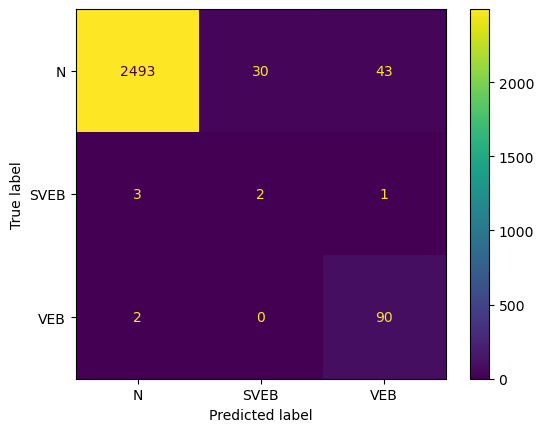

Fold 41:
  Test:  patient=40
              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90      1622
         1.0       0.03      0.20      0.05         5
         2.0       0.00      1.00      0.01         1

    accuracy                           0.82      1628
   macro avg       0.34      0.67      0.32      1628
weighted avg       0.99      0.82      0.90      1628

                   0.0       1.0       2.0  accuracy    macro avg  \
precision     0.998507  0.031250  0.003906  0.823096     0.344555   
recall        0.824908  0.200000  1.000000  0.823096     0.674969   
f1-score      0.903444  0.054054  0.007782  0.823096     0.321760   
support    1622.000000  5.000000  1.000000  0.823096  1628.000000   

           weighted avg  
precision      0.994926  
recall         0.823096  
f1-score       0.900285  
support     1628.000000  


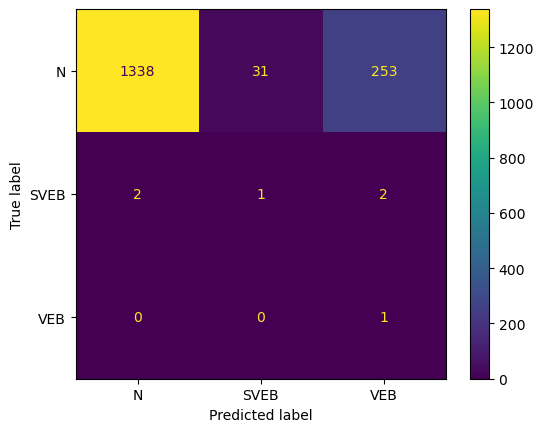

Fold 42:
  Test:  patient=41
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1544
         1.0       0.00      0.00      0.00         0
         2.0       1.00      1.00      1.00      1554

    accuracy                           1.00      3098
   macro avg       0.67      0.67      0.67      3098
weighted avg       1.00      1.00      1.00      3098

                   0.0  1.0          2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.0     0.998072  0.998709     0.666024      0.999033
recall        0.998057  NaN     0.999356  0.998709     0.665804      0.998709
f1-score      0.999028  NaN     0.998714  0.998709     0.665914      0.998870
support    1544.000000  0.0  1554.000000  0.998709  3098.000000   3098.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

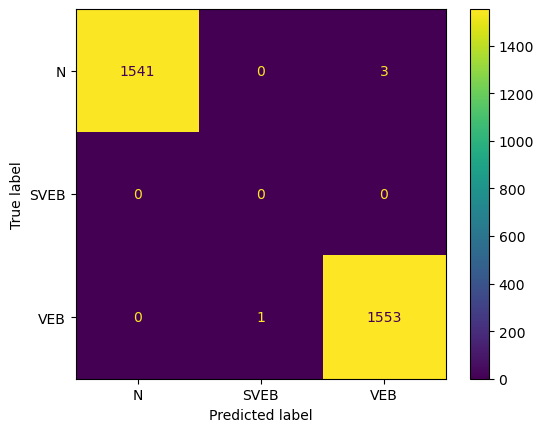

Fold 43:
  Test:  patient=42
              precision    recall  f1-score   support

         0.0       0.99      1.00      1.00      1085
         1.0       0.00      0.00      0.00         0
         2.0       1.00      0.99      1.00      1120

    accuracy                           1.00      2205
   macro avg       0.66      0.66      0.66      2205
weighted avg       1.00      1.00      1.00      2205

                   0.0  1.0          2.0  accuracy    macro avg  weighted avg
precision     0.994485  0.0     0.997312  0.995465     0.663932      0.995921
recall        0.997235  NaN     0.993750  0.995465     0.663662      0.995465
f1-score      0.995858  NaN     0.995528  0.995465     0.663795      0.995690
support    1085.000000  0.0  1120.000000  0.995465  2205.000000   2205.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

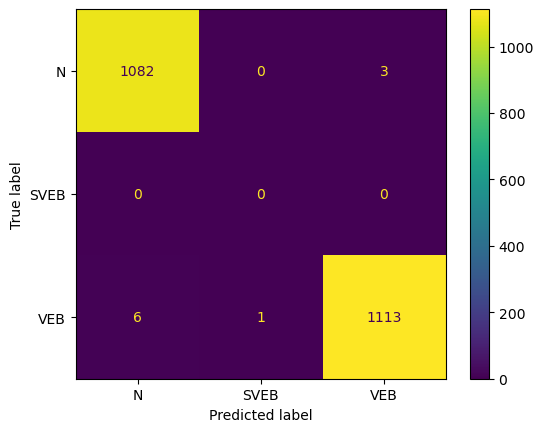

Fold 44:
  Test:  patient=43


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1802
         1.0       0.00      0.00      0.00         8
         2.0       1.00      1.00      1.00       683

    accuracy                           1.00      2493
   macro avg       0.66      0.67      0.67      2493
weighted avg       0.99      1.00      0.99      2493

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.995578  NaN    0.998538   0.99639     0.664705      0.993194
recall        0.999445  0.0    1.000000   0.99639     0.666482      0.996390
f1-score      0.997508  NaN    0.999268   0.99639     0.665592      0.994789
support    1802.000000  8.0  683.000000   0.99639  2493.000000   2493.000000


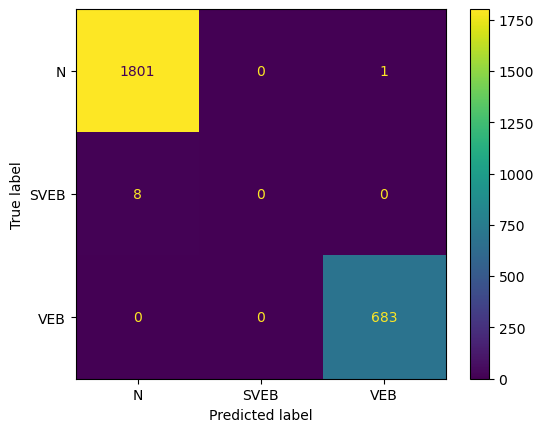

Fold 45:
  Test:  patient=44
              precision    recall  f1-score   support

         0.0       1.00      0.92      0.96      1435
         1.0       0.00      0.00      0.00         0
         2.0       1.00      1.00      1.00       491

    accuracy                           0.94      1926
   macro avg       0.67      0.64      0.65      1926
weighted avg       1.00      0.94      0.97      1926

                   0.0  1.0    2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.0    1.0  0.940291     0.666667      1.000000
recall        0.919861  NaN    1.0  0.940291     0.639954      0.940291
f1-score      0.958258  NaN    1.0  0.940291     0.652753      0.968899
support    1435.000000  0.0  491.0  0.940291  1926.000000   1926.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

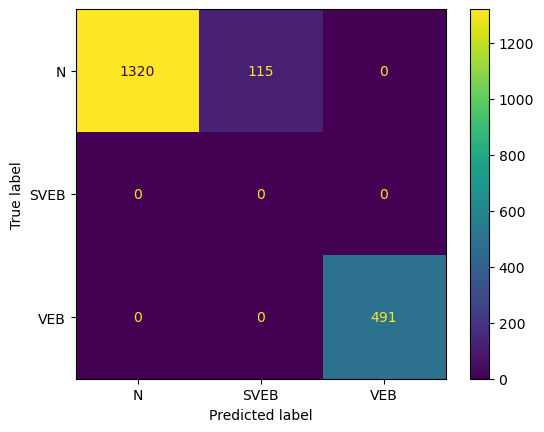

Fold 46:
  Test:  patient=45
              precision    recall  f1-score   support

         0.0       1.00      0.95      0.97      2230
         1.0       0.01      1.00      0.02         1
         2.0       0.98      0.98      0.98       422

    accuracy                           0.96      2653
   macro avg       0.66      0.98      0.66      2653
weighted avg       0.99      0.96      0.98      2653

                   0.0       1.0         2.0  accuracy    macro avg  \
precision     0.996715  0.009901    0.983373   0.95703     0.663330   
recall        0.952466  1.000000    0.981043   0.95703     0.977836   
f1-score      0.974089  0.019608    0.982206   0.95703     0.658634   
support    2230.000000  1.000000  422.000000   0.95703  2653.000000   

           weighted avg  
precision      0.994221  
recall         0.957030  
f1-score       0.975020  
support     2653.000000  


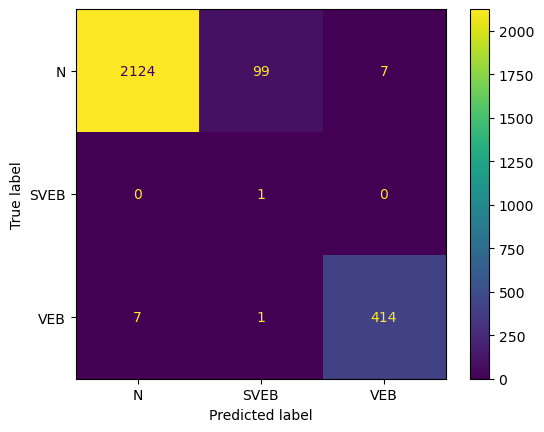

Fold 47:
  Test:  patient=46
              precision    recall  f1-score   support

         0.0       1.00      0.99      0.99      1857
         1.0       0.00      0.00      0.00         1
         2.0       0.99      0.99      0.99        93

    accuracy                           0.99      1951
   macro avg       0.66      0.66      0.66      1951
weighted avg       1.00      0.99      0.99      1951

                   0.0  1.0        2.0  accuracy    macro avg  weighted avg
precision     0.998912  0.0   0.989247  0.988211     0.662720      0.997939
recall        0.988691  0.0   0.989247  0.988211     0.659313      0.988211
f1-score      0.993775  0.0   0.989247  0.988211     0.661008      0.993050
support    1857.000000  1.0  93.000000  0.988211  1951.000000   1951.000000


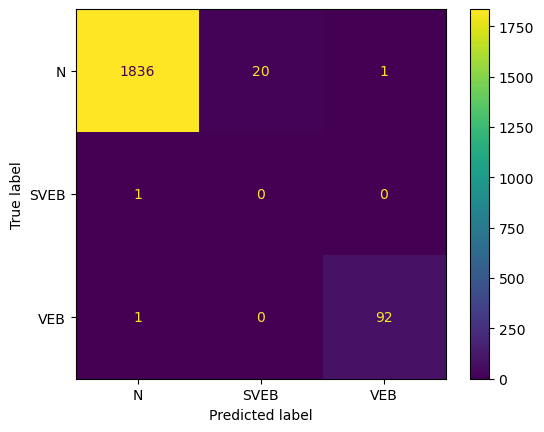

Fold 48:
  Test:  patient=47
              precision    recall  f1-score   support

         0.0       0.99      1.00      1.00      2117
         1.0       0.00      0.00      0.00         2
         2.0       1.00      0.96      0.98       235

    accuracy                           0.99      2354
   macro avg       0.66      0.65      0.66      2354
weighted avg       0.99      0.99      0.99      2354

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.994824  0.0    0.995595  0.994053     0.663473      0.994055
recall        0.998583  0.0    0.961702  0.994053     0.653428      0.994053
f1-score      0.996700  0.0    0.978355  0.994053     0.658352      0.994022
support    2117.000000  2.0  235.000000  0.994053  2354.000000   2354.000000


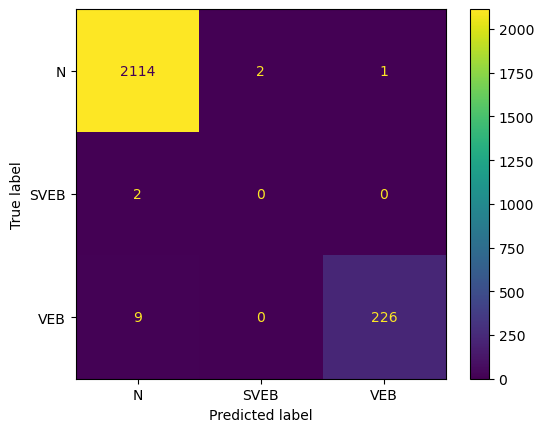

Fold 49:
  Test:  patient=48


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       1.00      0.99      1.00      2119
         1.0       0.00      0.00      0.00         0
         2.0       1.00      1.00      1.00        27

    accuracy                           0.99      2146
   macro avg       0.67      0.66      0.67      2146
weighted avg       1.00      0.99      1.00      2146

                  0.0  1.0   2.0  accuracy    macro avg  weighted avg
precision     1.00000  0.0   1.0  0.990214     0.666667      1.000000
recall        0.99009  NaN   1.0  0.990214     0.663363      0.990214
f1-score      0.99502  NaN   1.0  0.990214     0.665007      0.995083
support    2119.00000  0.0  27.0  0.990214  2146.000000   2146.000000


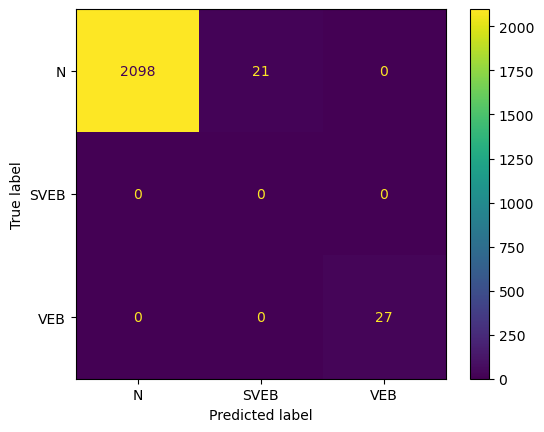

Fold 50:
  Test:  patient=49
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2993
         1.0       0.00      0.00      0.00         0
         2.0       0.60      0.75      0.67         4

    accuracy                           1.00      2997
   macro avg       0.53      0.58      0.56      2997
weighted avg       1.00      1.00      1.00      2997

                   0.0  1.0       2.0  accuracy    macro avg  weighted avg
precision     0.999665  0.0  0.600000  0.996997     0.533222      0.999132
recall        0.997327  NaN  0.750000  0.996997     0.582442      0.996997
f1-score      0.998495  NaN  0.666667  0.996997     0.555054      0.998052
support    2993.000000  0.0  4.000000  0.996997  2997.000000   2997.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

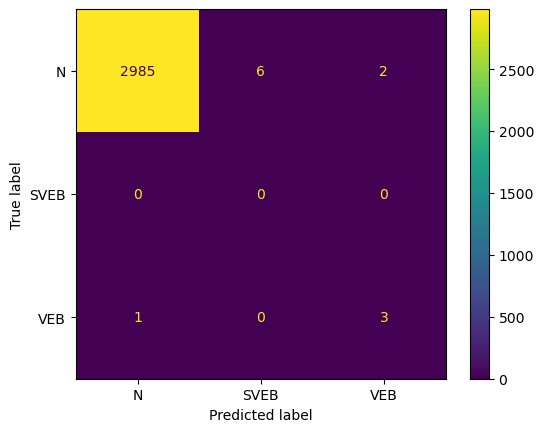

Fold 51:
  Test:  patient=50
              precision    recall  f1-score   support

         0.0       1.00      0.98      0.99      1969
         1.0       0.00      0.00      0.00         3
         2.0       0.98      1.00      0.99       802

    accuracy                           0.99      2774
   macro avg       0.66      0.66      0.66      2774
weighted avg       0.99      0.99      0.99      2774

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.997941  0.0    0.976829  0.987743     0.658257      0.990758
recall        0.984764  0.0    0.998753  0.987743     0.661172      0.987743
f1-score      0.991309  0.0    0.987670  0.987743     0.659659      0.989185
support    1969.000000  3.0  802.000000  0.987743  2774.000000   2774.000000


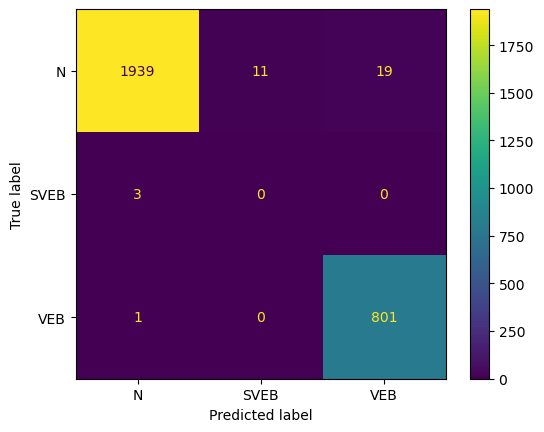

Fold 52:
  Test:  patient=51
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1608
         1.0       0.00      0.00      0.00         0
         2.0       1.00      1.00      1.00       137

    accuracy                           1.00      1745
   macro avg       0.67      0.67      0.67      1745
weighted avg       1.00      1.00      1.00      1745

                   0.0  1.0    2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.0    1.0  0.999427     0.666667      1.000000
recall        0.999378  NaN    1.0  0.999427     0.666459      0.999427
f1-score      0.999689  NaN    1.0  0.999427     0.666563      0.999713
support    1608.000000  0.0  137.0  0.999427  1745.000000   1745.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

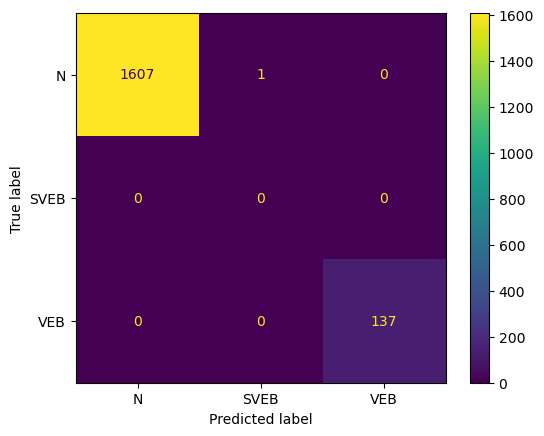

Fold 53:
  Test:  patient=52
              precision    recall  f1-score   support

         0.0       0.99      1.00      0.99      1150
         1.0       0.00      0.00      0.00         0
         2.0       1.00      0.99      0.99      1110

    accuracy                           0.99      2260
   macro avg       0.66      0.66      0.66      2260
weighted avg       0.99      0.99      0.99      2260

                   0.0  1.0          2.0  accuracy    macro avg  weighted avg
precision     0.988793  0.0     1.000000   0.99292     0.662931      0.994297
recall        0.997391  NaN     0.988288   0.99292     0.661893      0.992920
f1-score      0.993074  NaN     0.994110   0.99292     0.662394      0.993582
support    1150.000000  0.0  1110.000000   0.99292  2260.000000   2260.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

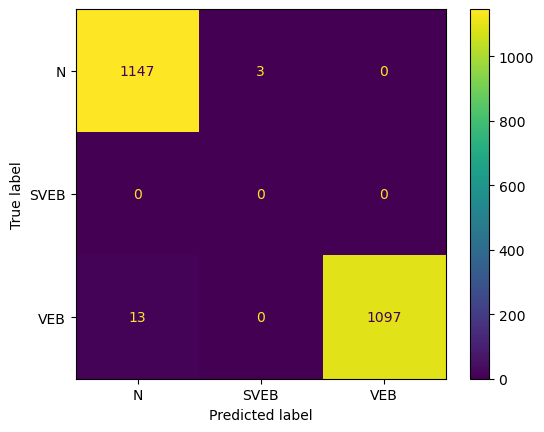

Fold 54:
  Test:  patient=53
              precision    recall  f1-score   support

         0.0       1.00      0.99      1.00      2338
         1.0       0.08      1.00      0.15         1
         2.0       0.76      0.73      0.74        22

    accuracy                           0.99      2361
   macro avg       0.61      0.91      0.63      2361
weighted avg       1.00      0.99      0.99      2361

                   0.0       1.0        2.0  accuracy    macro avg  \
precision     0.998282  0.083333   0.761905  0.991529     0.614507   
recall        0.994012  1.000000   0.727273  0.991529     0.907095   
f1-score      0.996142  0.153846   0.744186  0.991529     0.631392   
support    2338.000000  1.000000  22.000000  0.991529  2361.000000   

           weighted avg  
precision      0.995692  
recall         0.991529  
f1-score       0.993438  
support     2361.000000  


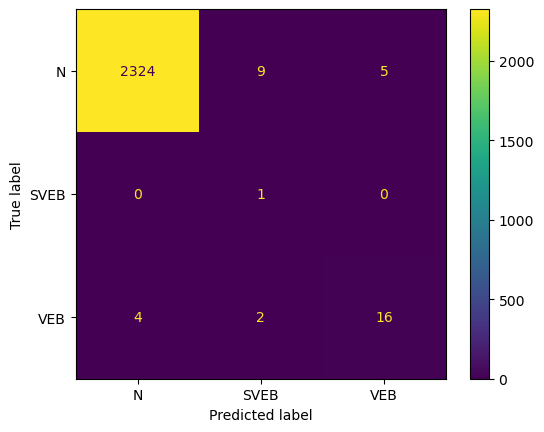

Fold 55:
  Test:  patient=54
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2146
         1.0       0.17      1.00      0.29         1
         2.0       1.00      0.82      0.90        17

    accuracy                           1.00      2164
   macro avg       0.72      0.94      0.73      2164
weighted avg       1.00      1.00      1.00      2164

                   0.0       1.0        2.0  accuracy    macro avg  \
precision     0.998601  0.166667   1.000000  0.996303     0.721756   
recall        0.997670  1.000000   0.823529  0.996303     0.940400   
f1-score      0.998135  0.285714   0.903226  0.996303     0.729025   
support    2146.000000  1.000000  17.000000  0.996303  2164.000000   

           weighted avg  
precision      0.998227  
recall         0.996303  
f1-score       0.997060  
support     2164.000000  


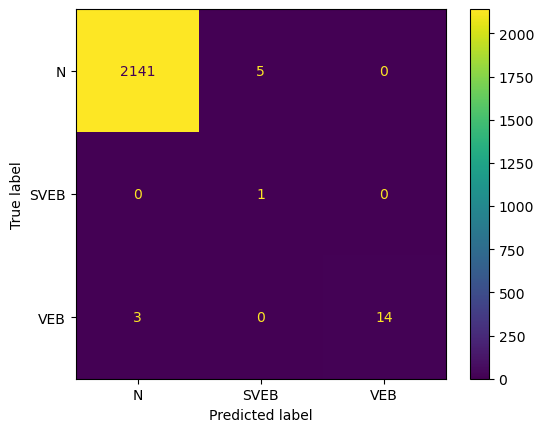

Fold 56:
  Test:  patient=55
              precision    recall  f1-score   support

         0.0       0.99      1.00      1.00      1670
         1.0       1.00      0.42      0.59        26
         2.0       1.00      0.86      0.92         7

    accuracy                           0.99      1703
   macro avg       1.00      0.76      0.84      1703
weighted avg       0.99      0.99      0.99      1703

                   0.0        1.0       2.0  accuracy    macro avg  \
precision     0.990510   1.000000  1.000000  0.990605     0.996837   
recall        1.000000   0.423077  0.857143  0.990605     0.760073   
f1-score      0.995232   0.594595  0.923077  0.990605     0.837635   
support    1670.000000  26.000000  7.000000  0.990605  1703.000000   

           weighted avg  
precision      0.990694  
recall         0.990605  
f1-score       0.988819  
support     1703.000000  


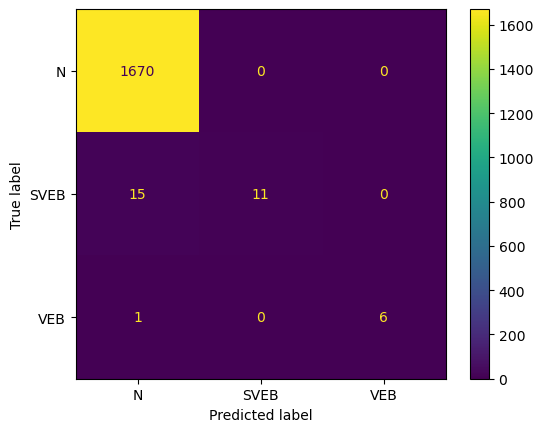

Fold 57:
  Test:  patient=56
              precision    recall  f1-score   support

         0.0       1.00      0.99      0.99      2840
         1.0       0.00      0.00      0.00         3
         2.0       0.42      0.52      0.47        21

    accuracy                           0.99      2864
   macro avg       0.47      0.51      0.49      2864
weighted avg       0.99      0.99      0.99      2864

                   0.0  1.0        2.0  accuracy    macro avg  weighted avg
precision     0.995418  0.0   0.423077  0.989874     0.472832      0.990178
recall        0.994366  0.0   0.523810  0.989874     0.506059      0.989874
f1-score      0.994892  0.0   0.468085  0.989874     0.487659      0.989987
support    2840.000000  3.0  21.000000  0.989874  2864.000000   2864.000000


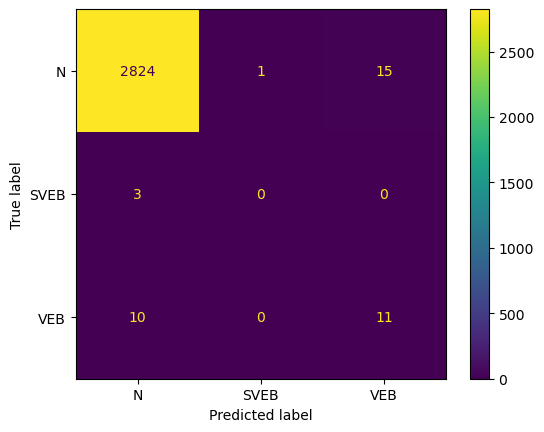

Fold 58:
  Test:  patient=57
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2311
         1.0       0.00      0.00      0.00         0
         2.0       0.80      1.00      0.89        12

    accuracy                           1.00      2323
   macro avg       0.60      0.67      0.63      2323
weighted avg       1.00      1.00      1.00      2323

                   0.0  1.0        2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.0   0.800000  0.997848     0.600000      0.998967
recall        0.997836  NaN   1.000000  0.997848     0.665945      0.997848
f1-score      0.998917  NaN   0.888889  0.997848     0.629269      0.998349
support    2311.000000  0.0  12.000000  0.997848  2323.000000   2323.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

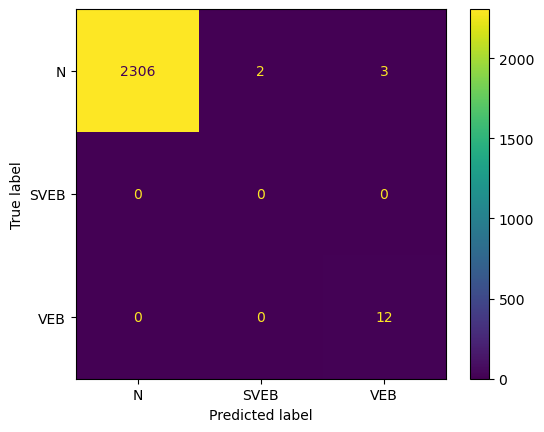

Fold 59:
  Test:  patient=58


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       0.97      0.99      0.98      2065
         1.0       0.00      0.00      0.00         0
         2.0       0.71      0.31      0.43        81

    accuracy                           0.97      2146
   macro avg       0.56      0.43      0.47      2146
weighted avg       0.96      0.97      0.96      2146

                   0.0  1.0        2.0  accuracy    macro avg  weighted avg
precision     0.973435  0.0   0.714286  0.967847     0.562573      0.963653
recall        0.993705  NaN   0.308642  0.967847     0.434116      0.967847
f1-score      0.983465  NaN   0.431034  0.967847     0.471500      0.962614
support    2065.000000  0.0  81.000000  0.967847  2146.000000   2146.000000


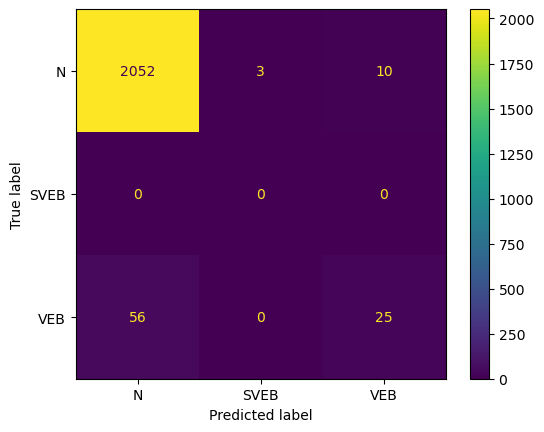

Fold 60:
  Test:  patient=59
              precision    recall  f1-score   support

         0.0       1.00      0.99      1.00      2473
         1.0       0.00      0.00      0.00         0
         2.0       0.00      0.00      0.00         0

    accuracy                           0.99      2473
   macro avg       0.33      0.33      0.33      2473
weighted avg       1.00      0.99      1.00      2473

                   0.0  1.0  2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.0  0.0   0.99353     0.333333      1.000000
recall        0.993530  NaN  NaN   0.99353     0.331177      0.993530
f1-score      0.996755  NaN  NaN   0.99353     0.332252      0.996755
support    2473.000000  0.0  0.0   0.99353  2473.000000   2473.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

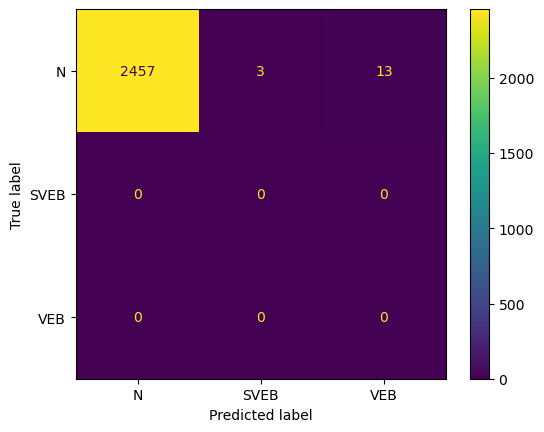

Fold 61:
  Test:  patient=60


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1451
         1.0       0.00      0.00      0.00         1

    accuracy                           1.00      1452
   macro avg       0.50      0.50      0.50      1452
weighted avg       1.00      1.00      1.00      1452

                   0.0  1.0  accuracy    macro avg  weighted avg
precision     0.999311  NaN  0.999311     0.499656      0.998623
recall        1.000000  0.0  0.999311     0.500000      0.999311
f1-score      0.999656  NaN  0.999311     0.499828      0.998967
support    1451.000000  1.0  0.999311  1452.000000   1452.000000


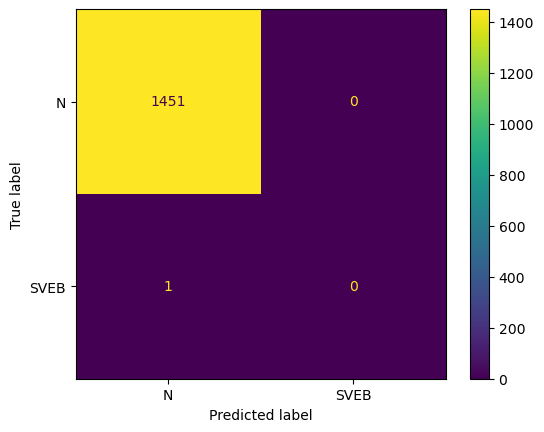

Fold 62:
  Test:  patient=61
              precision    recall  f1-score   support

         0.0       0.94      1.00      0.97      1451
         1.0       0.00      0.00      0.00         9
         2.0       0.99      0.90      0.94       795

    accuracy                           0.96      2255
   macro avg       0.65      0.63      0.64      2255
weighted avg       0.96      0.96      0.96      2255

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.942596  0.0    0.994429  0.957428     0.645675      0.957108
recall        0.995865  0.0    0.898113  0.957428     0.631326      0.957428
f1-score      0.968499  0.0    0.943820  0.957428     0.637440      0.955933
support    1451.000000  9.0  795.000000  0.957428  2255.000000   2255.000000


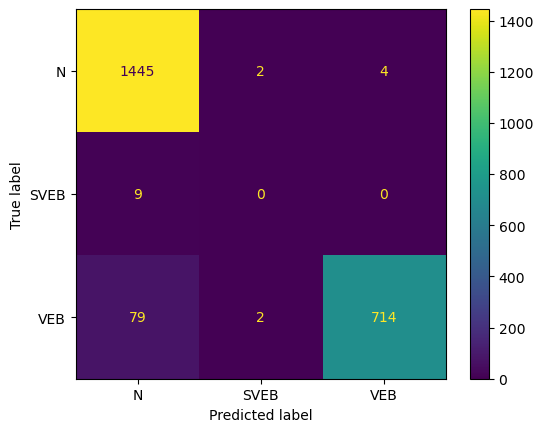

Fold 63:
  Test:  patient=62
              precision    recall  f1-score   support

         0.0       0.99      1.00      0.99      1845
         1.0       0.00      0.00      0.00         1
         2.0       0.97      0.81      0.89       138

    accuracy                           0.98      1984
   macro avg       0.65      0.60      0.63      1984
weighted avg       0.99      0.98      0.98      1984

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.986602  0.0    0.973913  0.984375     0.653505      0.985222
recall        0.997832  0.0    0.811594  0.984375     0.603142      0.984375
f1-score      0.992185  0.0    0.885375  0.984375     0.625854      0.984256
support    1845.000000  1.0  138.000000  0.984375  1984.000000   1984.000000


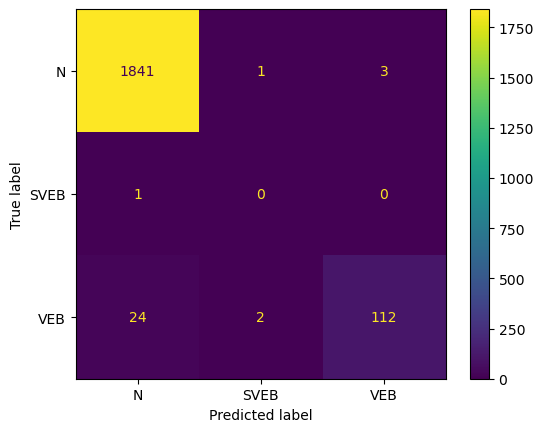

Fold 64:
  Test:  patient=63
              precision    recall  f1-score   support

         0.0       1.00      0.97      0.98      1885
         1.0       0.00      0.00      0.00         0
         2.0       0.30      1.00      0.46        23

    accuracy                           0.97      1908
   macro avg       0.43      0.66      0.48      1908
weighted avg       0.99      0.97      0.98      1908

                   0.0  1.0        2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.0   0.298701  0.968029     0.432900      0.991546
recall        0.967639  NaN   1.000000  0.968029     0.655880      0.968029
f1-score      0.983554  NaN   0.460000  0.968029     0.481185      0.977242
support    1885.000000  0.0  23.000000  0.968029  1908.000000   1908.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

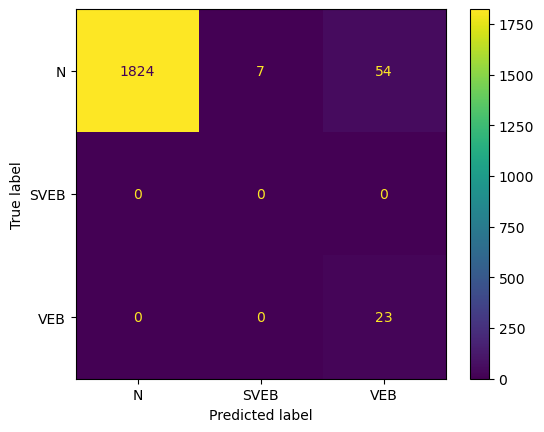

Fold 65:
  Test:  patient=64
              precision    recall  f1-score   support

         0.0       0.99      0.98      0.98      2271
         1.0       0.00      0.00      0.00         5
         2.0       0.98      0.93      0.95       382

    accuracy                           0.97      2658
   macro avg       0.65      0.63      0.64      2658
weighted avg       0.98      0.97      0.97      2658

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.986637  0.0    0.977901  0.966516     0.654846      0.983525
recall        0.975341  0.0    0.926702  0.966516     0.634014      0.966516
f1-score      0.980957  0.0    0.951613  0.966516     0.644190      0.974894
support    2271.000000  5.0  382.000000  0.966516  2658.000000   2658.000000


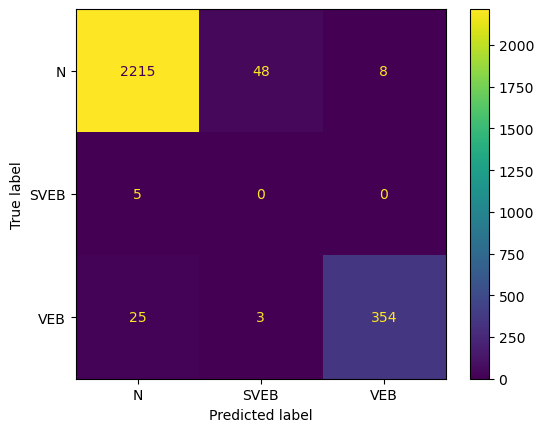

Fold 66:
  Test:  patient=65
              precision    recall  f1-score   support

         0.0       1.00      0.96      0.98      2137
         1.0       0.00      0.00      0.00         1
         2.0       0.93      0.99      0.96       200

    accuracy                           0.96      2338
   macro avg       0.64      0.65      0.64      2338
weighted avg       0.99      0.96      0.98      2338

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.999023  0.0    0.925234  0.959795     0.641419      0.992284
recall        0.957417  0.0    0.990000  0.959795     0.649139      0.959795
f1-score      0.977778  0.0    0.956522  0.959795     0.644767      0.975541
support    2137.000000  1.0  200.000000  0.959795  2338.000000   2338.000000


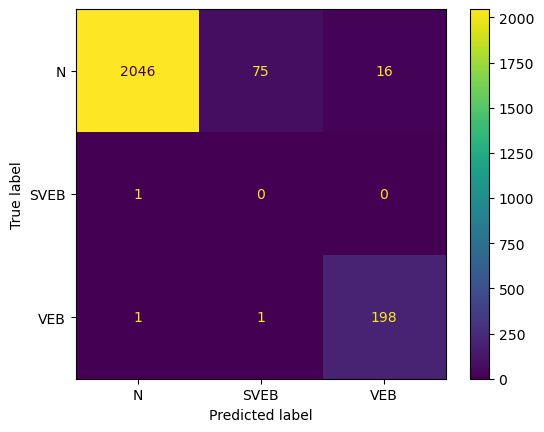

Fold 67:
  Test:  patient=66
              precision    recall  f1-score   support

         0.0       1.00      0.98      0.99      2436
         1.0       0.00      0.00      0.00         5
         2.0       0.98      0.98      0.98       531

    accuracy                           0.98      2972
   macro avg       0.66      0.65      0.66      2972
weighted avg       0.99      0.98      0.98      2972

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.996654  0.0    0.982987  0.976783     0.659880      0.992535
recall        0.978243  0.0    0.979284  0.976783     0.652509      0.976783
f1-score      0.987363  0.0    0.981132  0.976783     0.656165      0.984588
support    2436.000000  5.0  531.000000  0.976783  2972.000000   2972.000000


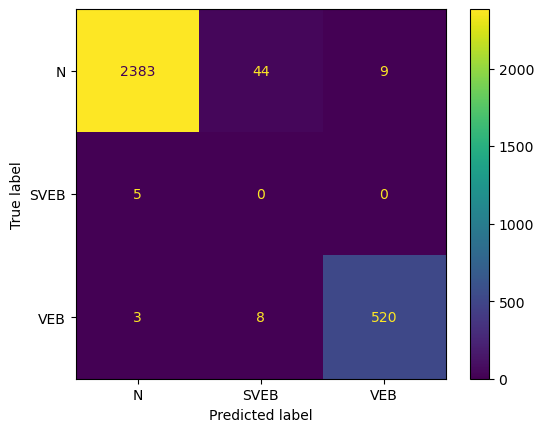

Fold 68:
  Test:  patient=67
              precision    recall  f1-score   support

         0.0       1.00      0.99      0.99      2480
         1.0       0.00      0.00      0.00         2
         2.0       0.99      0.99      0.99       161

    accuracy                           0.99      2643
   macro avg       0.66      0.66      0.66      2643
weighted avg       1.00      0.99      0.99      2643

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.998776  0.0    0.987654  0.986379     0.662143      0.997342
recall        0.986694  0.0    0.993789  0.986379     0.660161      0.986379
f1-score      0.992698  0.0    0.990712  0.986379     0.661137      0.991826
support    2480.000000  2.0  161.000000  0.986379  2643.000000   2643.000000


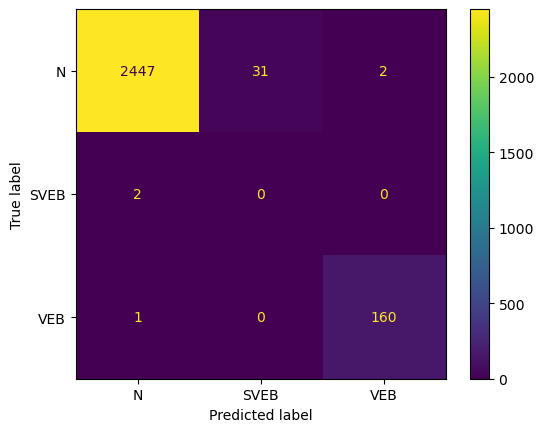

Fold 69:
  Test:  patient=68
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1998
         1.0       0.00      0.00      0.00         1
         2.0       1.00      1.00      1.00       167

    accuracy                           1.00      2166
   macro avg       0.67      0.67      0.67      2166
weighted avg       1.00      1.00      1.00      2166

                   0.0  1.0    2.0  accuracy    macro avg  weighted avg
precision     0.999499  0.0    1.0  0.998153     0.666500      0.999076
recall        0.998498  0.0    1.0  0.998153     0.666166      0.998153
f1-score      0.998998  0.0    1.0  0.998153     0.666333      0.998614
support    1998.000000  1.0  167.0  0.998153  2166.000000   2166.000000


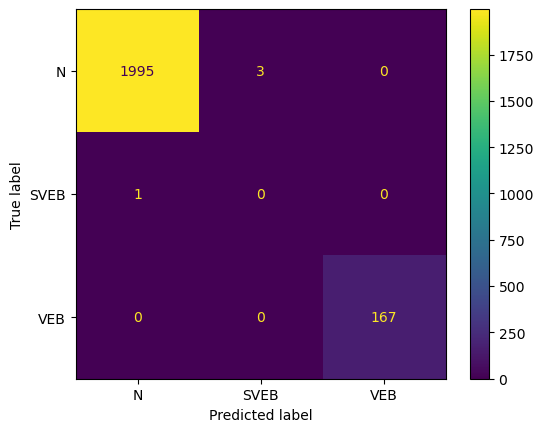

Fold 70:
  Test:  patient=69
              precision    recall  f1-score   support

         0.0       0.95      0.70      0.80      1539
         1.0       0.36      0.58      0.45       126
         2.0       0.00      0.00      0.00         0

    accuracy                           0.69      1665
   macro avg       0.44      0.43      0.42      1665
weighted avg       0.91      0.69      0.78      1665

                   0.0         1.0  2.0  accuracy    macro avg  weighted avg
precision     0.952847    0.361386  0.0  0.687087     0.438078      0.908088
recall        0.695906    0.579365  NaN  0.687087     0.425091      0.687087
f1-score      0.804356    0.445122  NaN  0.687087     0.416493      0.777171
support    1539.000000  126.000000  0.0  0.687087  1665.000000   1665.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

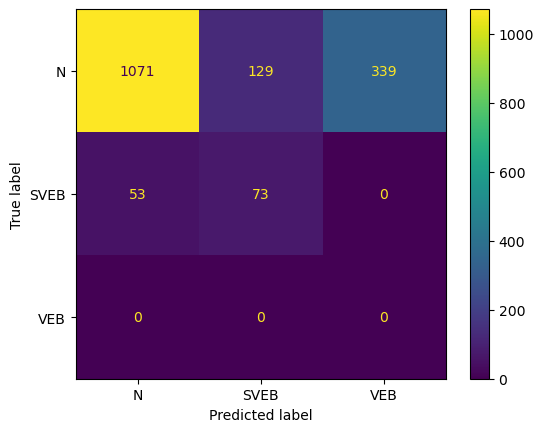

Fold 71:
  Test:  patient=70


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       1.00      0.87      0.93      1634
         1.0       0.16      0.94      0.28        35
         2.0       0.00      0.00      0.00         0

    accuracy                           0.88      1669
   macro avg       0.39      0.61      0.40      1669
weighted avg       0.98      0.88      0.92      1669

                   0.0        1.0  2.0  accuracy    macro avg  weighted avg
precision     0.998601   0.163366  0.0  0.875374     0.387323      0.981086
recall        0.873929   0.942857  NaN  0.875374     0.605595      0.875374
f1-score      0.932115   0.278481  NaN  0.875374     0.403532      0.918408
support    1634.000000  35.000000  0.0  0.875374  1669.000000   1669.000000


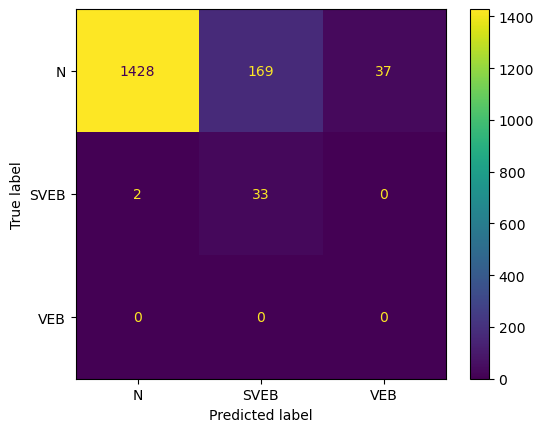

Fold 72:
  Test:  patient=71
              precision    recall  f1-score   support

         0.0       1.00      0.95      0.97      1874
         1.0       0.09      0.62      0.16         8
         2.0       0.88      0.99      0.93       386

    accuracy                           0.95      2268
   macro avg       0.66      0.85      0.69      2268
weighted avg       0.97      0.95      0.96      2268

                   0.0       1.0         2.0  accuracy    macro avg  \
precision     0.996627  0.092593    0.878161  0.952381     0.655794   
recall        0.946105  0.625000    0.989637  0.952381     0.853581   
f1-score      0.970709  0.161290    0.930572  0.952381     0.687524   
support    1874.000000  8.000000  386.000000  0.952381  2268.000000   

           weighted avg  
precision      0.973276  
recall         0.952381  
f1-score       0.961023  
support     2268.000000  


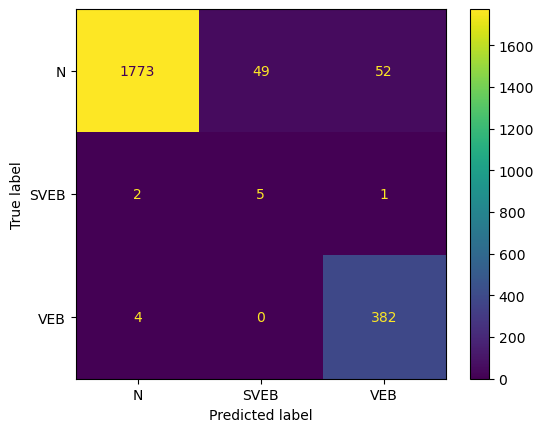

Fold 73:
  Test:  patient=72
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1888
         1.0       0.90      0.84      0.87        32
         2.0       0.97      0.96      0.96        70

    accuracy                           0.99      1990
   macro avg       0.96      0.93      0.94      1990
weighted avg       0.99      0.99      0.99      1990

                   0.0        1.0        2.0  accuracy    macro avg  \
precision     0.995769   0.900000   0.971014  0.993467     0.955595   
recall        0.997352   0.843750   0.957143  0.993467     0.932748   
f1-score      0.996560   0.870968   0.964029  0.993467     0.943852   
support    1888.000000  32.000000  70.000000  0.993467  1990.000000   

           weighted avg  
precision      0.993359  
recall         0.993467  
f1-score       0.993396  
support     1990.000000  


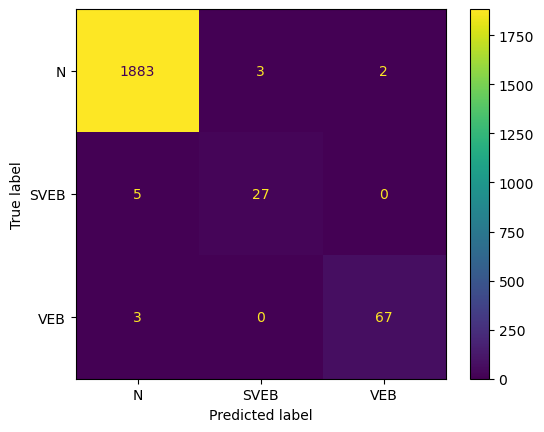

Fold 74:
  Test:  patient=73
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2081
         1.0       0.00      0.00      0.00         0
         2.0       1.00      1.00      1.00       274

    accuracy                           1.00      2355
   macro avg       0.67      0.67      0.67      2355
weighted avg       1.00      1.00      1.00      2355

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.0    0.996364  0.999151     0.665455      0.999577
recall        0.999039  NaN    1.000000  0.999151     0.666346      0.999151
f1-score      0.999519  NaN    0.998179  0.999151     0.665899      0.999363
support    2081.000000  0.0  274.000000  0.999151  2355.000000   2355.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

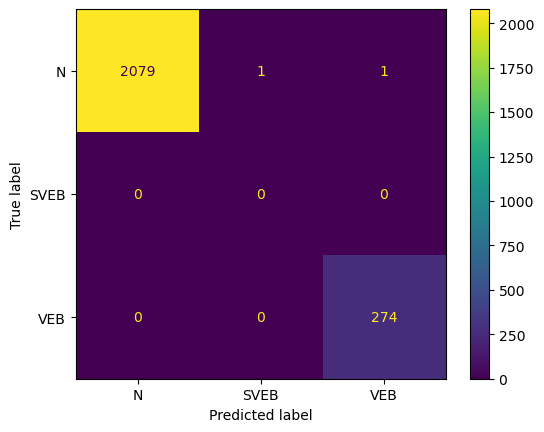

Fold 75:
  Test:  patient=74
              precision    recall  f1-score   support

         0.0       0.99      1.00      1.00      1482
         2.0       1.00      0.98      0.99       612

    accuracy                           0.99      2094
   macro avg       1.00      0.99      0.99      2094
weighted avg       0.99      0.99      0.99      2094

                   0.0         2.0  accuracy    macro avg  weighted avg
precision     0.992632    1.000000  0.994747     0.996316      0.994786
recall        1.000000    0.982026  0.994747     0.991013      0.994747
f1-score      0.996303    0.990932  0.994747     0.993617      0.994733
support    1482.000000  612.000000  0.994747  2094.000000   2094.000000


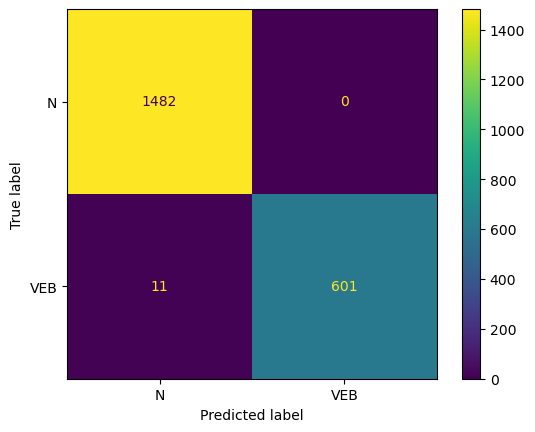

C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\numpy\core\fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\numpy\core\_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [31]:
X=df_cardio.drop('type',axis=1)
y=df_cardio['type']
groups=df_cardio['patient']
skf = LeaveOneGroupOut()


start_time=time.time()
df_f30, acc_f30,confusion_matrix_final_f30,list_f30 = cross_valid(pipe_f30, skf, X, y,groups)
end_time=time.time()

In [32]:
print("Time"+str(end_time-start_time))

Time2806.978153705597


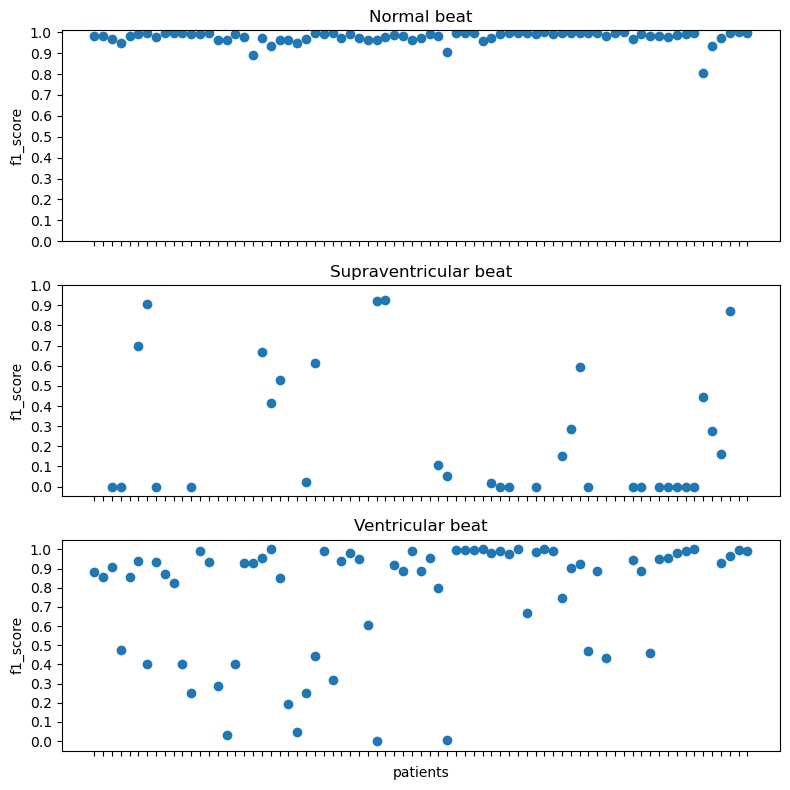

In [40]:
print_plot(list_f30)

In [34]:
df_f30

,0.0,1.0,2.0,macro avg,weighted avg
f1-score,0.978584,0.255145,0.772441,0.618888,0.972819
precision,0.993391,0.115192,0.715010,0.615911,0.985465
recall,0.965532,0.394736,0.891441,0.677284,0.963204
support,2047.280000,27.194444,270.270270,2340.053333,2340.053333


In [35]:
pipe_f19 = Pipeline([
        ('f_classif', SelectKBest(mutual_info_classif, k=19)),
        ('sampling', SMOTE(random_state = 123)),
        ('classification', KNeighborsClassifier(n_neighbors=10))
    ])
pipe_f19

Pipeline(steps=[('f_classif',
                 SelectKBest(k=19,
                             score_func=<function mutual_info_classif at 0x000001C029B55C60>)),
                ('sampling', SMOTE(random_state=123)),
                ('classification', KNeighborsClassifier(n_neighbors=10))])

Fold 1:
  Test:  patient=0
              precision    recall  f1-score   support

         0.0       0.99      0.96      0.98      2411
         1.0       0.00      0.00      0.00         0
         2.0       0.79      0.94      0.86       344

    accuracy                           0.96      2755
   macro avg       0.60      0.64      0.61      2755
weighted avg       0.97      0.96      0.96      2755

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.992318  0.0    0.794621  0.961887     0.595646      0.967632
recall        0.964330  NaN    0.944767  0.961887     0.636366      0.961887
f1-score      0.978124  NaN    0.863214  0.961887     0.613779      0.963776
support    2411.000000  0.0  344.000000  0.961887  2755.000000   2755.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

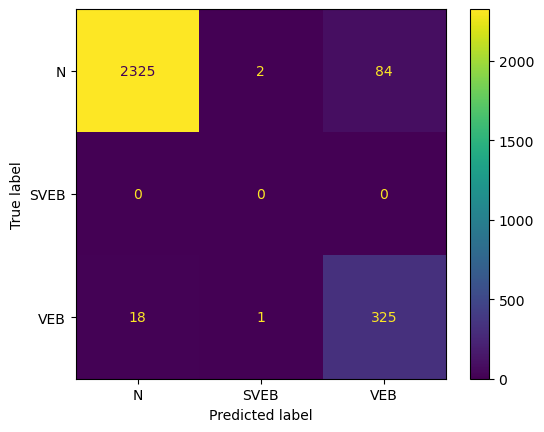

Fold 2:
  Test:  patient=1
              precision    recall  f1-score   support

         0.0       0.99      0.97      0.98      2443
         1.0       0.00      0.00      0.00         0
         2.0       0.72      0.87      0.79       229

    accuracy                           0.96      2672
   macro avg       0.57      0.61      0.59      2672
weighted avg       0.96      0.96      0.96      2672

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.987881  0.0    0.719424  0.959581     0.569102      0.964874
recall        0.967663  NaN    0.873362  0.959581     0.613675      0.959581
f1-score      0.977667  NaN    0.788955  0.959581     0.588874      0.961494
support    2443.000000  0.0  229.000000  0.959581  2672.000000   2672.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

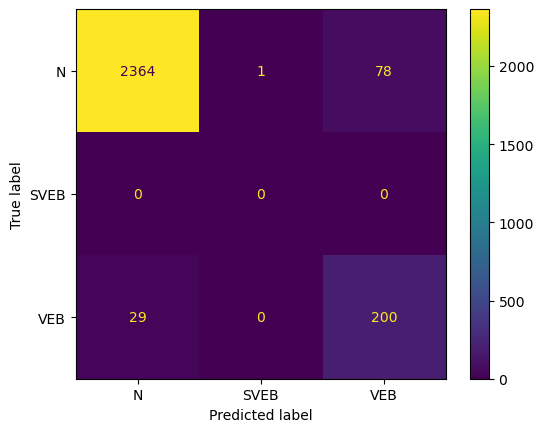

Fold 3:
  Test:  patient=2
              precision    recall  f1-score   support

         0.0       1.00      0.95      0.97      2323
         1.0       0.00      0.00      0.00         2
         2.0       0.88      0.96      0.92       125

    accuracy                           0.95      2450
   macro avg       0.63      0.64      0.63      2450
weighted avg       0.99      0.95      0.97      2450

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.997278  0.0    0.882353  0.946122     0.626544      0.990600
recall        0.946190  0.0    0.960000  0.946122     0.635397      0.946122
f1-score      0.971063  0.0    0.919540  0.946122     0.630201      0.967641
support    2323.000000  2.0  125.000000  0.946122  2450.000000   2450.000000


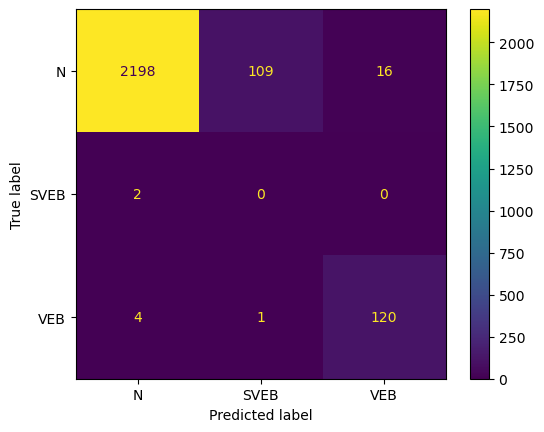

Fold 4:
  Test:  patient=3
              precision    recall  f1-score   support

         0.0       0.98      0.97      0.97      2268
         1.0       0.00      0.00      0.00        16
         2.0       0.60      0.79      0.68       121

    accuracy                           0.95      2405
   macro avg       0.53      0.58      0.55      2405
weighted avg       0.96      0.95      0.95      2405

                   0.0   1.0         2.0  accuracy    macro avg  weighted avg
precision     0.982535   0.0    0.597484  0.951767     0.526673      0.956625
recall        0.967372   0.0    0.785124  0.951767     0.584165      0.951767
f1-score      0.974894   0.0    0.678571  0.951767     0.551155      0.953500
support    2268.000000  16.0  121.000000  0.951767  2405.000000   2405.000000


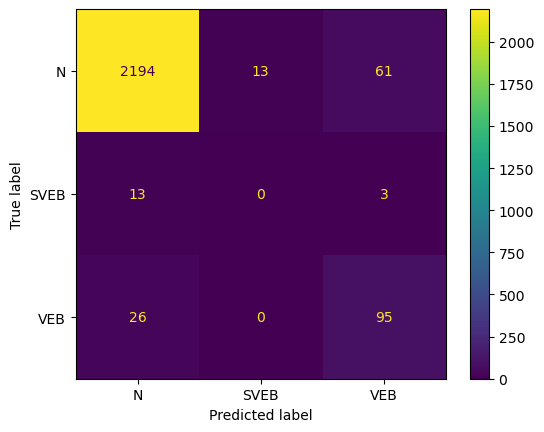

Fold 5:
  Test:  patient=4
              precision    recall  f1-score   support

         0.0       0.96      1.00      0.98      1518
         2.0       1.00      0.75      0.86       247

    accuracy                           0.96      1765
   macro avg       0.98      0.87      0.92      1765
weighted avg       0.97      0.96      0.96      1765

                   0.0         2.0  accuracy    macro avg  weighted avg
precision     0.960759    1.000000  0.964873     0.980380      0.966251
recall        1.000000    0.748988  0.964873     0.874494      0.964873
f1-score      0.979987    0.856481  0.964873     0.918234      0.962703
support    1518.000000  247.000000  0.964873  1765.000000   1765.000000


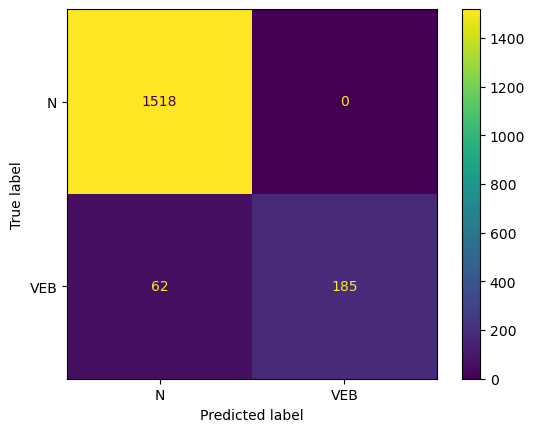

Fold 6:
  Test:  patient=5
              precision    recall  f1-score   support

         0.0       1.00      0.99      0.99      2434
         1.0       0.57      0.92      0.70        48
         2.0       1.00      0.89      0.94         9

    accuracy                           0.99      2491
   macro avg       0.86      0.93      0.88      2491
weighted avg       0.99      0.99      0.99      2491

                   0.0        1.0       2.0  accuracy    macro avg  \
precision     0.998337   0.571429  1.000000  0.985147     0.856589   
recall        0.986853   0.916667  0.888889  0.985147     0.930803   
f1-score      0.992562   0.704000  0.941176  0.985147     0.879246   
support    2434.000000  48.000000  9.000000  0.985147  2491.000000   

           weighted avg  
precision      0.990117  
recall         0.985147  
f1-score       0.986816  
support     2491.000000  


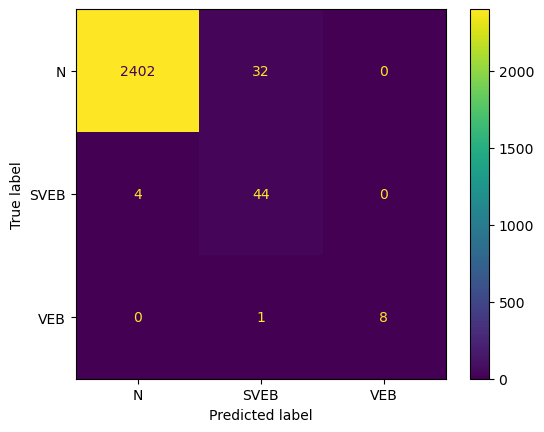

Fold 7:
  Test:  patient=6
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2638
         1.0       0.95      0.91      0.93        65
         2.0       0.25      1.00      0.40         1

    accuracy                           1.00      2704
   macro avg       0.73      0.97      0.78      2704
weighted avg       1.00      1.00      1.00      2704

                   0.0        1.0   2.0  accuracy    macro avg  weighted avg
precision     0.997726   0.951613  0.25  0.995562     0.733113      0.996341
recall        0.997726   0.907692  1.00  0.995562     0.968473      0.995562
f1-score      0.997726   0.929134  0.40  0.995562     0.775620      0.995856
support    2638.000000  65.000000  1.00  0.995562  2704.000000   2704.000000


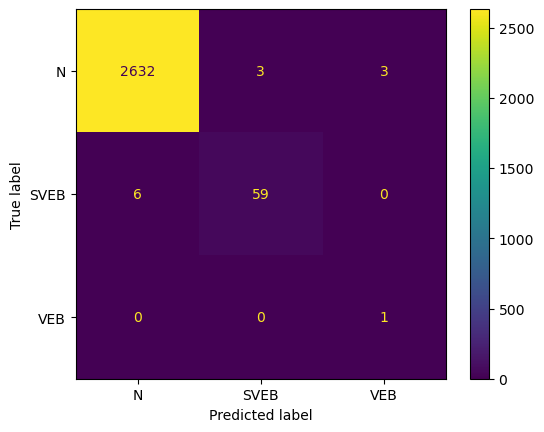

Fold 8:
  Test:  patient=7
              precision    recall  f1-score   support

         0.0       0.98      0.98      0.98      1776
         1.0       0.00      0.00      0.00         2
         2.0       0.93      0.88      0.91       350

    accuracy                           0.96      2128
   macro avg       0.64      0.62      0.63      2128
weighted avg       0.97      0.96      0.97      2128

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.977566  0.0    0.933333  0.963816     0.636966      0.969372
recall        0.981419  0.0    0.880000  0.963816     0.620473      0.963816
f1-score      0.979489  0.0    0.905882  0.963816     0.628457      0.966462
support    1776.000000  2.0  350.000000  0.963816  2128.000000   2128.000000


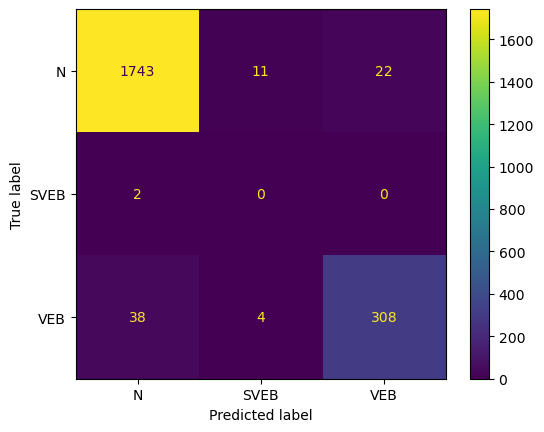

Fold 9:
  Test:  patient=8
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2946
         1.0       0.00      0.00      0.00         0
         2.0       0.86      0.93      0.89        41

    accuracy                           1.00      2987
   macro avg       0.62      0.64      0.63      2987
weighted avg       1.00      1.00      1.00      2987

                   0.0  1.0        2.0  accuracy    macro avg  weighted avg
precision     0.998980  0.0   0.863636  0.996317     0.620872      0.997122
recall        0.997284  NaN   0.926829  0.996317     0.641371      0.996317
f1-score      0.998131  NaN   0.894118  0.996317     0.630750      0.996704
support    2946.000000  0.0  41.000000  0.996317  2987.000000   2987.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

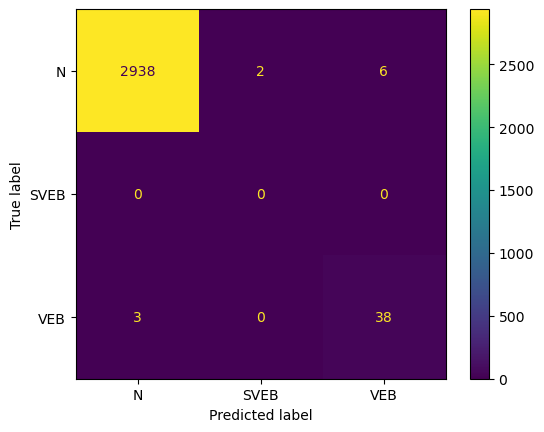

Fold 10:
  Test:  patient=9


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       1.00      0.99      1.00      3597
         1.0       0.00      0.00      0.00         0
         2.0       0.75      0.88      0.81        83

    accuracy                           0.99      3680
   macro avg       0.58      0.62      0.60      3680
weighted avg       0.99      0.99      0.99      3680

                   0.0  1.0        2.0  accuracy    macro avg  weighted avg
precision     0.999161  0.0   0.752577  0.990761     0.583913      0.993600
recall        0.993328  NaN   0.879518  0.990761     0.624282      0.990761
f1-score      0.996236  NaN   0.811111  0.990761     0.602449      0.992061
support    3597.000000  0.0  83.000000  0.990761  3680.000000   3680.000000


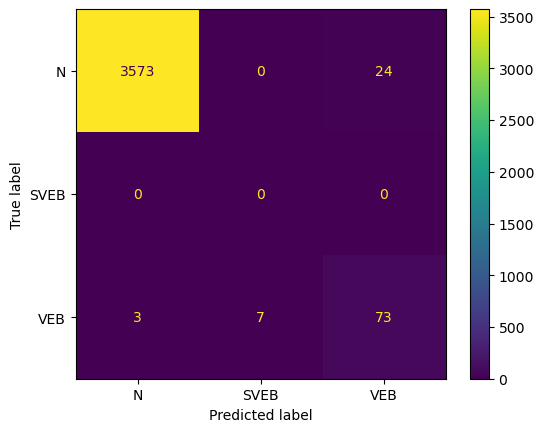

Fold 11:
  Test:  patient=10
              precision    recall  f1-score   support

         0.0       1.00      0.99      1.00      2076
         2.0       0.20      1.00      0.33         4

    accuracy                           0.99      2080
   macro avg       0.60      1.00      0.66      2080
weighted avg       1.00      0.99      0.99      2080

                   0.0       2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.200000  0.992308     0.600000      0.998462
recall        0.992293  1.000000  0.992308     0.996146      0.992308
f1-score      0.996132  0.333333  0.992308     0.664732      0.994857
support    2076.000000  4.000000  0.992308  2080.000000   2080.000000


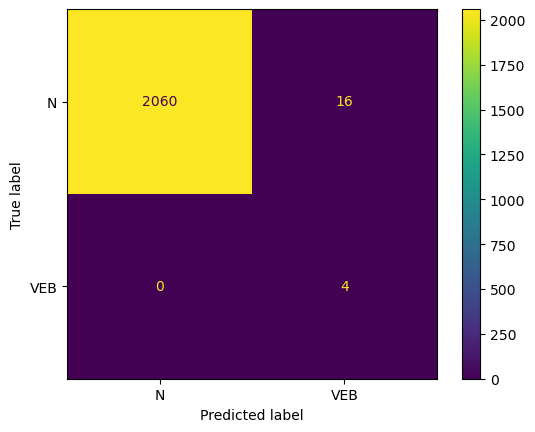

Fold 12:
  Test:  patient=11
              precision    recall  f1-score   support

         0.0       1.00      0.98      0.99      2798
         1.0       0.00      0.00      0.00         1
         2.0       0.22      0.33      0.27         6

    accuracy                           0.98      2805
   macro avg       0.41      0.44      0.42      2805
weighted avg       1.00      0.98      0.99      2805

                   0.0  1.0       2.0  accuracy    macro avg  weighted avg
precision     0.998188  0.0  0.222222  0.982531     0.406803      0.996172
recall        0.984274  0.0  0.333333  0.982531     0.439203      0.982531
f1-score      0.991182  0.0  0.266667  0.982531     0.419283      0.989279
support    2798.000000  1.0  6.000000  0.982531  2805.000000   2805.000000


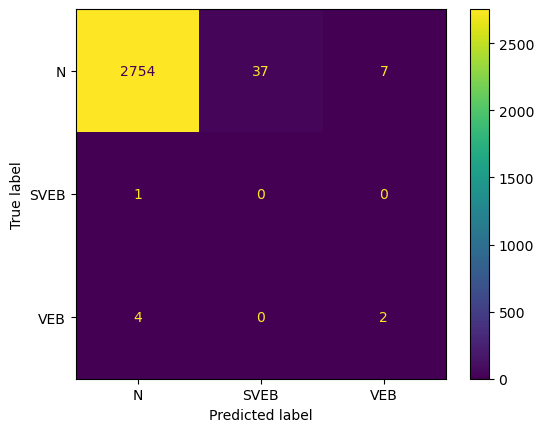

Fold 13:
  Test:  patient=12
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1791
         2.0       1.00      1.00      1.00       230

    accuracy                           1.00      2021
   macro avg       1.00      1.00      1.00      2021
weighted avg       1.00      1.00      1.00      2021

                   0.0         2.0  accuracy    macro avg  weighted avg
precision     1.000000    0.995671  0.999505     0.997835      0.999507
recall        0.999442    1.000000  0.999505     0.999721      0.999505
f1-score      0.999721    0.997831  0.999505     0.998776      0.999506
support    1791.000000  230.000000  0.999505  2021.000000   2021.000000


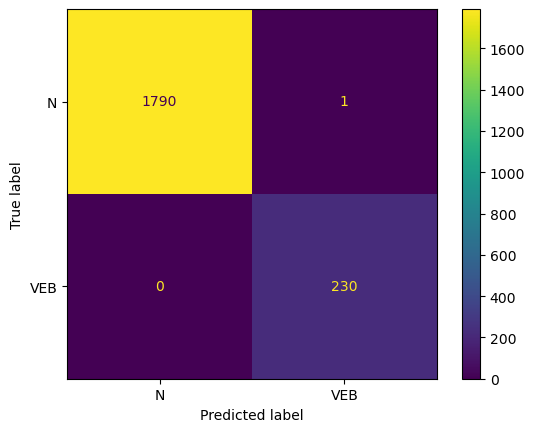

Fold 14:
  Test:  patient=13


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1800
         1.0       0.00      0.00      0.00         0
         2.0       0.98      0.92      0.95        64

    accuracy                           0.99      1864
   macro avg       0.66      0.64      0.65      1864
weighted avg       1.00      0.99      1.00      1864

                   0.0  1.0        2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.0   0.983333  0.994635     0.661111      0.999428
recall        0.997222  NaN   0.921875  0.994635     0.639699      0.994635
f1-score      0.998609  NaN   0.951613  0.994635     0.650074      0.996996
support    1800.000000  0.0  64.000000  0.994635  1864.000000   1864.000000


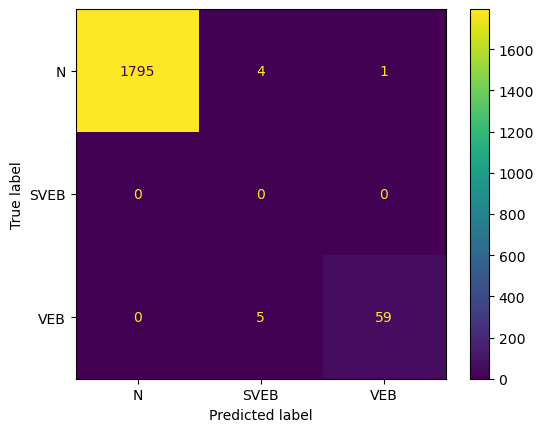

Fold 15:
  Test:  patient=14
              precision    recall  f1-score   support

         0.0       1.00      0.93      0.96      2630
         1.0       0.00      0.00      0.00         0
         2.0       0.50      0.33      0.40         3

    accuracy                           0.93      2633
   macro avg       0.50      0.42      0.45      2633
weighted avg       1.00      0.93      0.96      2633

                   0.0  1.0       2.0  accuracy    macro avg  weighted avg
precision     0.999185  0.0  0.500000  0.932017     0.499728      0.998617
recall        0.932700  NaN  0.333333  0.932017     0.422011      0.932017
f1-score      0.964798  NaN  0.400000  0.932017     0.454933      0.964155
support    2630.000000  0.0  3.000000  0.932017  2633.000000   2633.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

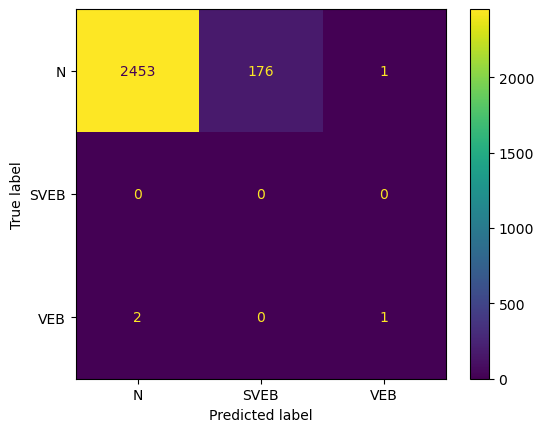

Fold 16:
  Test:  patient=15
              precision    recall  f1-score   support

         0.0       1.00      0.92      0.96      1518
         2.0       0.02      1.00      0.03         2

    accuracy                           0.92      1520
   macro avg       0.51      0.96      0.50      1520
weighted avg       1.00      0.92      0.96      1520

                   0.0       2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.016949  0.923684     0.508475      0.998707
recall        0.923584  1.000000  0.923684     0.961792      0.923684
f1-score      0.960274  0.033333  0.923684     0.496804      0.959054
support    1518.000000  2.000000  0.923684  1520.000000   1520.000000


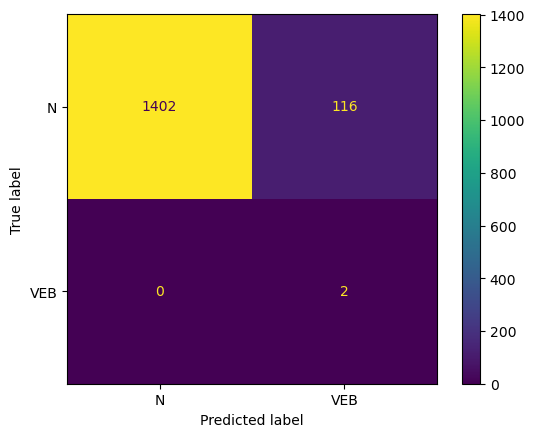

Fold 17:
  Test:  patient=16


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       1.00      0.99      0.99      1644
         1.0       0.00      0.00      0.00         0
         2.0       0.38      0.41      0.39        27

    accuracy                           0.98      1671
   macro avg       0.46      0.46      0.46      1671
weighted avg       0.99      0.98      0.98      1671

                   0.0  1.0        2.0  accuracy    macro avg  weighted avg
precision     0.998153  0.0   0.379310  0.976661     0.459154      0.988153
recall        0.986010  NaN   0.407407  0.976661     0.464472      0.976661
f1-score      0.992044  NaN   0.392857  0.976661     0.461634      0.982362
support    1644.000000  0.0  27.000000  0.976661  1671.000000   1671.000000


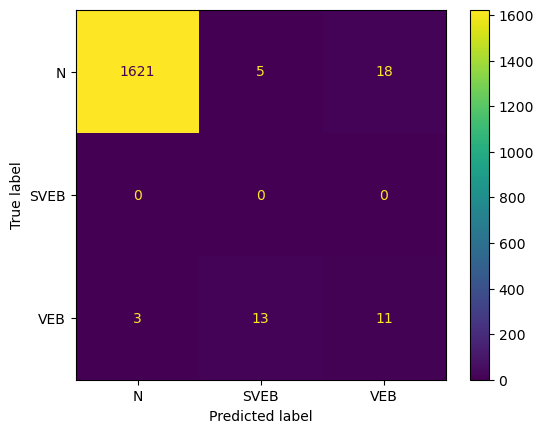

Fold 18:
  Test:  patient=17


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       1.00      0.94      0.97      2660
         1.0       0.00      0.00      0.00         0
         2.0       0.92      1.00      0.96       366

    accuracy                           0.95      3026
   macro avg       0.64      0.65      0.64      3026
weighted avg       0.99      0.95      0.97      3026

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.999602  0.0    0.924051  0.951091     0.641218      0.990464
recall        0.944737  NaN    0.997268  0.951091     0.647335      0.951091
f1-score      0.971395  NaN    0.959264  0.951091     0.643553      0.969928
support    2660.000000  0.0  366.000000  0.951091  3026.000000   3026.000000


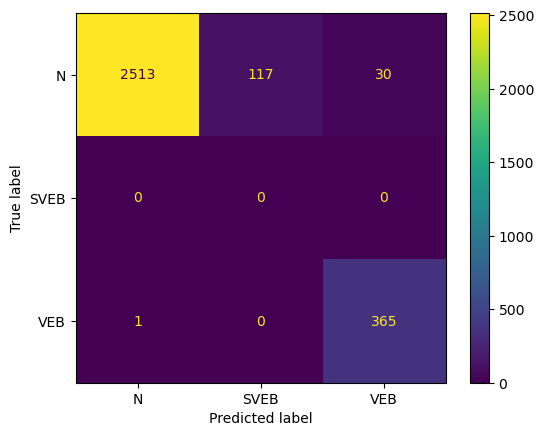

Fold 19:
  Test:  patient=18
              precision    recall  f1-score   support

         0.0       1.00      0.89      0.94      1211
         1.0       0.00      0.00      0.00         0
         2.0       0.89      1.00      0.94       849

    accuracy                           0.94      2060
   macro avg       0.63      0.63      0.63      2060
weighted avg       0.95      0.94      0.94      2060

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.0    0.886221  0.935437     0.628740      0.953108
recall        0.890173  NaN    1.000000  0.935437     0.630058      0.935437
f1-score      0.941896  NaN    0.939679  0.935437     0.627192      0.940982
support    1211.000000  0.0  849.000000  0.935437  2060.000000   2060.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

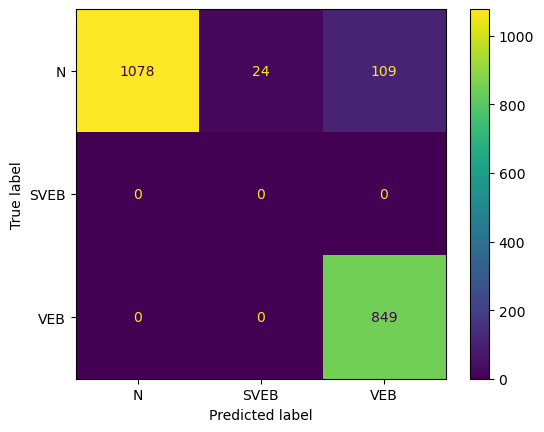

Fold 20:
  Test:  patient=19
              precision    recall  f1-score   support

         0.0       0.98      0.96      0.97      2360
         1.0       0.59      0.75      0.66       179
         2.0       0.97      0.95      0.96       110

    accuracy                           0.95      2649
   macro avg       0.85      0.89      0.86      2649
weighted avg       0.95      0.95      0.95      2649

                   0.0         1.0         2.0  accuracy    macro avg  \
precision     0.979257    0.590308    0.972222   0.94564     0.847262   
recall        0.960169    0.748603    0.954545   0.94564     0.887773   
f1-score      0.969619    0.660099    0.963303   0.94564     0.864340   
support    2360.000000  179.000000  110.000000   0.94564  2649.000000   

           weighted avg  
precision      0.952682  
recall         0.945640  
f1-score       0.948442  
support     2649.000000  


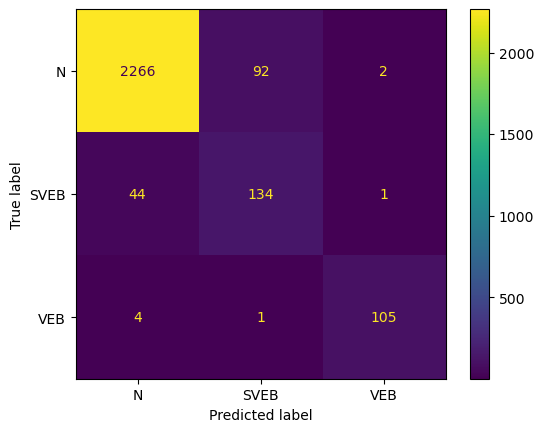

Fold 21:
  Test:  patient=20
              precision    recall  f1-score   support

         0.0       0.99      0.88      0.93      2070
         1.0       0.27      0.88      0.41       104
         2.0       1.00      0.75      0.86         8

    accuracy                           0.88      2182
   macro avg       0.75      0.84      0.73      2182
weighted avg       0.96      0.88      0.91      2182

                   0.0         1.0       2.0  accuracy    macro avg  \
precision     0.992908    0.268222  1.000000   0.87901     0.753710   
recall        0.879227    0.884615  0.750000   0.87901     0.837947   
f1-score      0.932616    0.411633  0.857143   0.87901     0.733797   
support    2070.000000  104.000000  8.000000   0.87901  2182.000000   

           weighted avg  
precision      0.958393  
recall         0.879010  
f1-score       0.907508  
support     2182.000000  


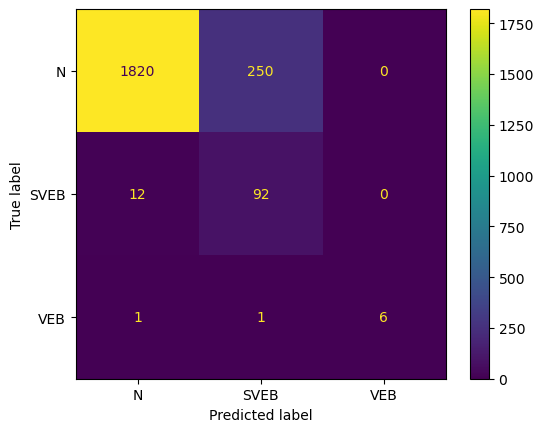

Fold 22:
  Test:  patient=21
              precision    recall  f1-score   support

         0.0       0.99      0.95      0.97      2814
         1.0       0.40      0.82      0.54       124
         2.0       0.95      0.84      0.89       185

    accuracy                           0.94      3123
   macro avg       0.78      0.87      0.80      3123
weighted avg       0.96      0.94      0.95      3123

                   0.0         1.0         2.0  accuracy    macro avg  \
precision     0.989267    0.396887    0.945122    0.9382     0.777092   
recall        0.949893    0.822581    0.837838    0.9382     0.870104   
f1-score      0.969181    0.535433    0.888252    0.9382     0.797622   
support    2814.000000  124.000000  185.000000    0.9382  3123.000000   

           weighted avg  
precision      0.963131  
recall         0.938200  
f1-score       0.947164  
support     3123.000000  


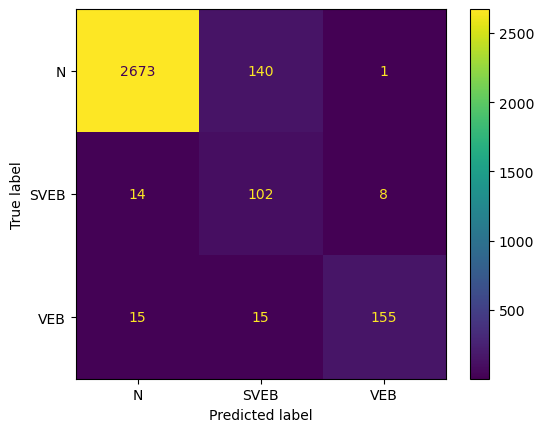

Fold 23:
  Test:  patient=22
              precision    recall  f1-score   support

         0.0       1.00      0.96      0.98      2190
         1.0       0.00      0.00      0.00         0
         2.0       0.16      0.92      0.27        13

    accuracy                           0.96      2203
   macro avg       0.39      0.63      0.42      2203
weighted avg       0.99      0.96      0.97      2203

                   0.0  1.0        2.0  accuracy    macro avg  weighted avg
precision     0.999524  0.0   0.157895  0.959147     0.385806      0.994558
recall        0.959361  NaN   0.923077  0.959147     0.627479      0.959147
f1-score      0.979031  NaN   0.269663  0.959147     0.416231      0.974845
support    2190.000000  0.0  13.000000  0.959147  2203.000000   2203.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

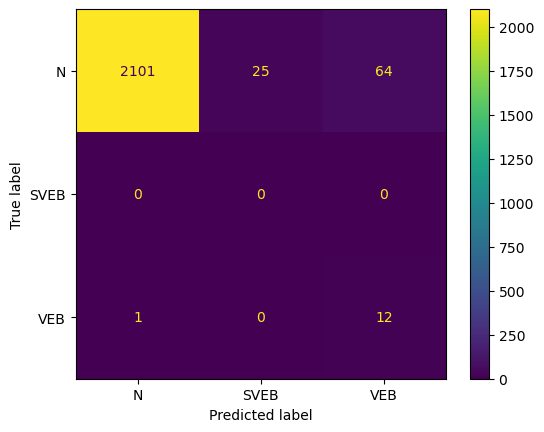

Fold 24:
  Test:  patient=23
              precision    recall  f1-score   support

         0.0       1.00      0.90      0.95      2563
         1.0       0.00      0.00      0.00         0
         2.0       0.02      0.83      0.05         6

    accuracy                           0.90      2569
   macro avg       0.34      0.58      0.33      2569
weighted avg       1.00      0.90      0.95      2569

                   0.0  1.0       2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.0  0.023256  0.901129     0.341085      0.997719
recall        0.901288  NaN  0.833333  0.901129     0.578207      0.901129
f1-score      0.948081  NaN  0.045249  0.901129     0.331110      0.945973
support    2563.000000  0.0  6.000000  0.901129  2569.000000   2569.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

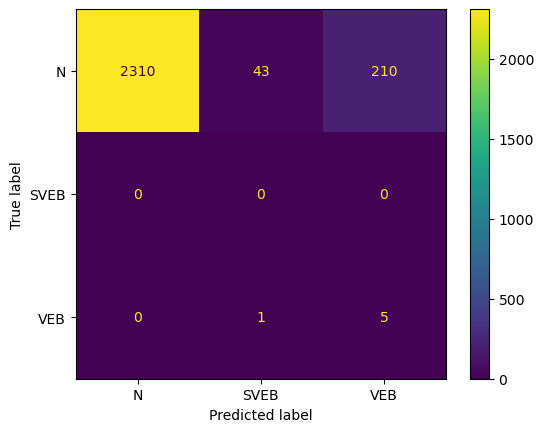

Fold 25:
  Test:  patient=24
              precision    recall  f1-score   support

         0.0       1.00      0.93      0.97      1703
         1.0       0.01      0.50      0.02         2
         2.0       0.12      0.60      0.19         5

    accuracy                           0.93      1710
   macro avg       0.38      0.68      0.39      1710
weighted avg       1.00      0.93      0.96      1710

                   0.0       1.0       2.0  accuracy    macro avg  \
precision     0.999371  0.010753  0.115385  0.932164     0.375170   
recall        0.933647  0.500000  0.600000  0.932164     0.677882   
f1-score      0.965392  0.021053  0.193548  0.932164     0.393331   
support    1703.000000  2.000000  5.000000  0.932164  1710.000000   

           weighted avg  
precision      0.995630  
recall         0.932164  
f1-score       0.962030  
support     1710.000000  


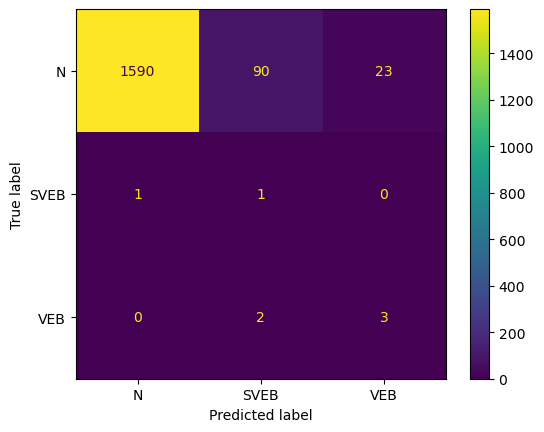

Fold 26:
  Test:  patient=25
              precision    recall  f1-score   support

         0.0       1.00      0.99      0.99      1496
         1.0       0.80      0.57      0.67         7
         2.0       0.25      1.00      0.40         4

    accuracy                           0.99      1507
   macro avg       0.68      0.85      0.69      1507
weighted avg       1.00      0.99      0.99      1507

                   0.0       1.0   2.0  accuracy    macro avg  weighted avg
precision     0.997981  0.800000  0.25  0.989383     0.682660      0.995076
recall        0.991310  0.571429  1.00  0.989383     0.854246      0.989383
f1-score      0.994634  0.666667  0.40  0.989383     0.687100      0.991533
support    1496.000000  7.000000  4.00  0.989383  1507.000000   1507.000000


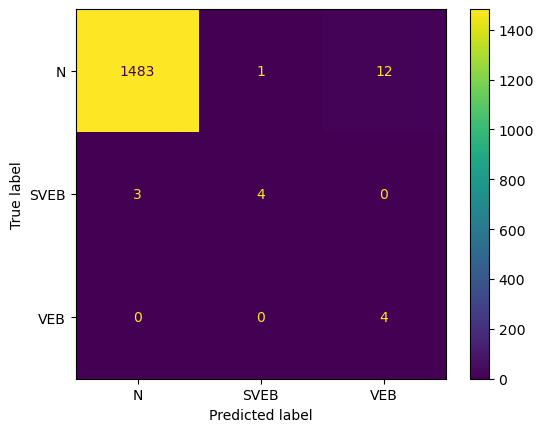

Fold 27:
  Test:  patient=26
              precision    recall  f1-score   support

         0.0       1.00      0.99      0.99      1884
         1.0       0.00      0.00      0.00         0
         2.0       0.99      1.00      0.99       719

    accuracy                           0.99      2603
   macro avg       0.66      0.66      0.66      2603
weighted avg       1.00      0.99      0.99      2603

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.999462  0.0    0.987620  0.990012     0.662361      0.996191
recall        0.986730  NaN    0.998609  0.990012     0.661780      0.990012
f1-score      0.993056  NaN    0.993084  0.990012     0.662047      0.993064
support    1884.000000  0.0  719.000000  0.990012  2603.000000   2603.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

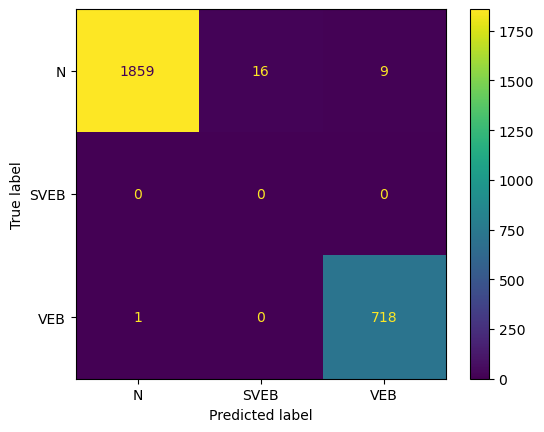

Fold 28:
  Test:  patient=27


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       1.00      0.99      0.99      1711
         1.0       0.00      0.00      0.00         0
         2.0       0.17      1.00      0.30         4

    accuracy                           0.99      1715
   macro avg       0.39      0.66      0.43      1715
weighted avg       1.00      0.99      0.99      1715

                   0.0  1.0       2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.0  0.173913  0.987755     0.391304      0.998073
recall        0.987726  NaN  1.000000  0.987755     0.662575      0.987755
f1-score      0.993825  NaN  0.296296  0.987755     0.430041      0.992198
support    1711.000000  0.0  4.000000  0.987755  1715.000000   1715.000000


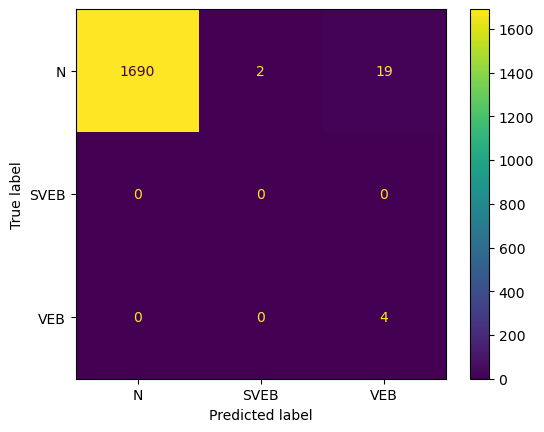

Fold 29:
  Test:  patient=28
              precision    recall  f1-score   support

         0.0       0.98      0.96      0.97      1835
         1.0       0.00      0.00      0.00         0
         2.0       0.93      0.95      0.94       783

    accuracy                           0.96      2618
   macro avg       0.64      0.64      0.64      2618
weighted avg       0.97      0.96      0.96      2618

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.982202  0.0    0.926799  0.959893     0.636334      0.965632
recall        0.962398  NaN    0.954023  0.959893     0.638807      0.959893
f1-score      0.972199  NaN    0.940214  0.959893     0.637471      0.962633
support    1835.000000  0.0  783.000000  0.959893  2618.000000   2618.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

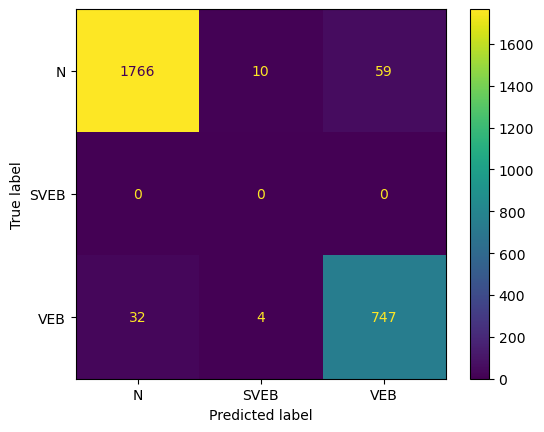

Fold 30:
  Test:  patient=29
              precision    recall  f1-score   support

         0.0       1.00      0.99      0.99      1705
         1.0       0.00      0.00      0.00         0
         2.0       0.98      0.98      0.98       755

    accuracy                           0.99      2460
   macro avg       0.66      0.66      0.66      2460
weighted avg       0.99      0.99      0.99      2460

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.997635  0.0    0.978752  0.985366     0.658795      0.991839
recall        0.989443  NaN    0.976159  0.985366     0.655201      0.985366
f1-score      0.993522  NaN    0.977454  0.985366     0.656992      0.988590
support    1705.000000  0.0  755.000000  0.985366  2460.000000   2460.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

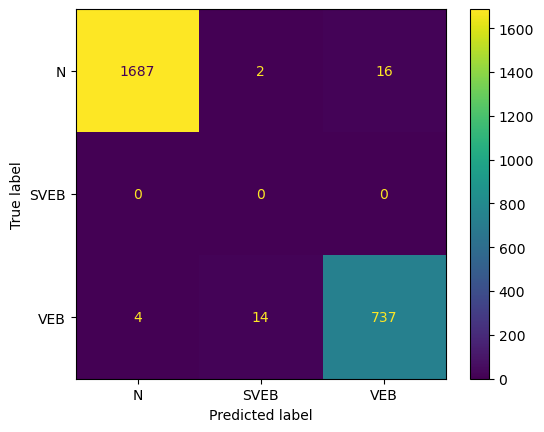

Fold 31:
  Test:  patient=30
              precision    recall  f1-score   support

         0.0       0.97      0.97      0.97      1843
         1.0       0.00      0.00      0.00         0
         2.0       0.97      0.92      0.94      1364

    accuracy                           0.95      3207
   macro avg       0.65      0.63      0.64      3207
weighted avg       0.97      0.95      0.96      3207

                   0.0  1.0          2.0  accuracy    macro avg  weighted avg
precision     0.969206  0.0     0.967568  0.950109     0.645591      0.968509
recall        0.973413  NaN     0.918622  0.950109     0.630678      0.950109
f1-score      0.971305  NaN     0.942460  0.950109     0.637921      0.959036
support    1843.000000  0.0  1364.000000  0.950109  3207.000000   3207.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

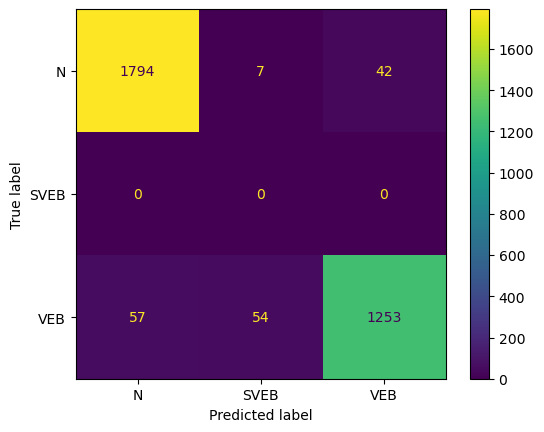

Fold 32:
  Test:  patient=31
              precision    recall  f1-score   support

         0.0       1.00      0.93      0.96      1560
         1.0       0.00      0.00      0.00         0
         2.0       0.40      1.00      0.58        57

    accuracy                           0.93      1617
   macro avg       0.47      0.64      0.51      1617
weighted avg       0.98      0.93      0.95      1617

                   0.0  1.0        2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.0   0.404255  0.928881     0.468085      0.979000
recall        0.926282  NaN   1.000000  0.928881     0.642094      0.928881
f1-score      0.961730  NaN   0.575758  0.928881     0.512496      0.948125
support    1560.000000  0.0  57.000000  0.928881  1617.000000   1617.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

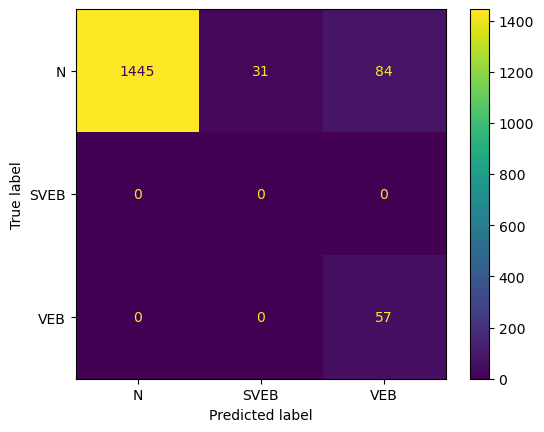

Fold 33:
  Test:  patient=32
              precision    recall  f1-score   support

         0.0       0.99      0.94      0.97      1245
         1.0       0.90      0.96      0.93       589
         2.0       0.00      0.00      0.00         1

    accuracy                           0.95      1835
   macro avg       0.63      0.64      0.63      1835
weighted avg       0.96      0.95      0.95      1835

                   0.0         1.0  2.0  accuracy    macro avg  weighted avg
precision     0.992392    0.897152  0.0  0.948774     0.629848      0.961281
recall        0.942972    0.962649  0.0  0.948774     0.635207      0.948774
f1-score      0.967051    0.928747  0.0  0.948774     0.631933      0.954229
support    1245.000000  589.000000  1.0  0.948774  1835.000000   1835.000000


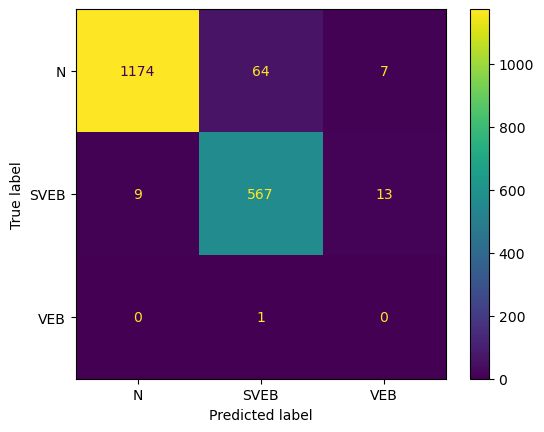

Fold 34:
  Test:  patient=33
              precision    recall  f1-score   support

         0.0       1.00      0.96      0.98      1427
         1.0       0.90      0.96      0.93       536
         2.0       0.00      0.00      0.00         0

    accuracy                           0.96      1963
   macro avg       0.63      0.64      0.64      1963
weighted avg       0.97      0.96      0.96      1963

                   0.0         1.0  2.0  accuracy    macro avg  weighted avg
precision     0.995640    0.901754  0.0  0.959755     0.632465      0.970004
recall        0.960056    0.958955  NaN  0.959755     0.639670      0.959755
f1-score      0.977524    0.929476  NaN  0.959755     0.635667      0.964404
support    1427.000000  536.000000  0.0  0.959755  1963.000000   1963.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

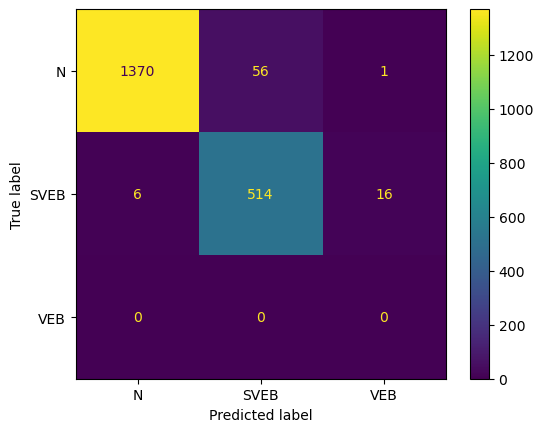

Fold 35:
  Test:  patient=34


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       0.99      0.98      0.99      3199
         1.0       0.00      0.00      0.00         0
         2.0       0.92      0.90      0.91       457

    accuracy                           0.97      3656
   macro avg       0.63      0.63      0.63      3656
weighted avg       0.98      0.97      0.98      3656

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.988054  0.0    0.915367  0.972101     0.634474      0.978968
recall        0.982495  NaN    0.899344  0.972101     0.627279      0.972101
f1-score      0.985266  NaN    0.907285  0.972101     0.630850      0.975519
support    3199.000000  0.0  457.000000  0.972101  3656.000000   3656.000000


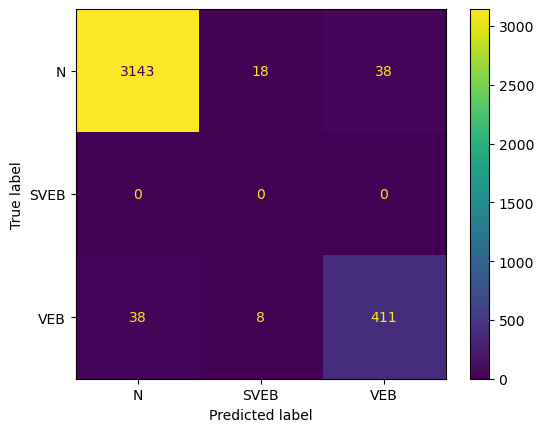

Fold 36:
  Test:  patient=35
              precision    recall  f1-score   support

         0.0       1.00      0.96      0.98      3447
         1.0       0.00      0.00      0.00         0
         2.0       0.77      0.97      0.86       450

    accuracy                           0.96      3897
   macro avg       0.59      0.64      0.61      3897
weighted avg       0.97      0.96      0.96      3897

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.997280  0.0    0.771277   0.95843     0.589519      0.971183
recall        0.957354  NaN    0.966667   0.95843     0.641340      0.958430
f1-score      0.976909  NaN    0.857988   0.95843     0.611633      0.963177
support    3447.000000  0.0  450.000000   0.95843  3897.000000   3897.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

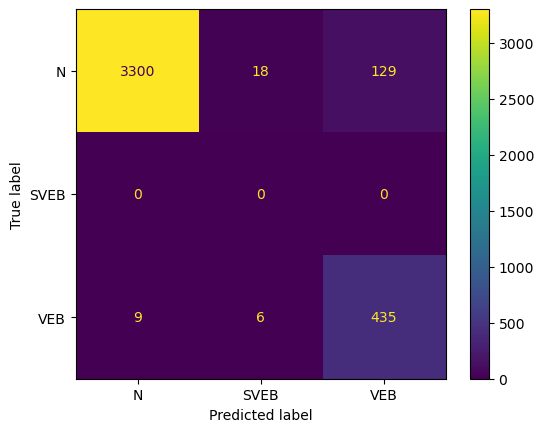

Fold 37:
  Test:  patient=36
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2007
         2.0       0.98      1.00      0.99       452

    accuracy                           1.00      2459
   macro avg       0.99      1.00      0.99      2459
weighted avg       1.00      1.00      1.00      2459

                   0.0         2.0  accuracy    macro avg  weighted avg
precision     1.000000    0.978355  0.995933     0.989177      0.996021
recall        0.995017    1.000000  0.995933     0.997509      0.995933
f1-score      0.997502    0.989059  0.995933     0.993281      0.995950
support    2007.000000  452.000000  0.995933  2459.000000   2459.000000


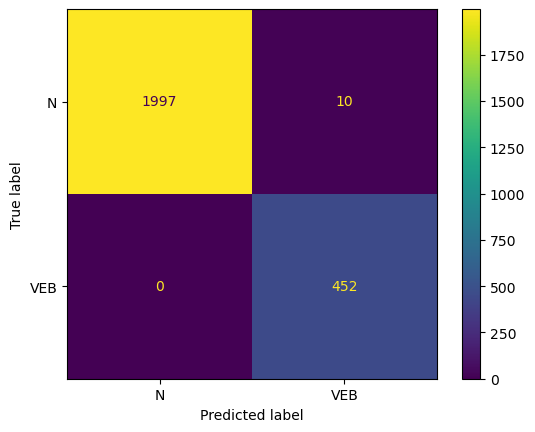

Fold 38:
  Test:  patient=37
              precision    recall  f1-score   support

         0.0       0.99      0.97      0.98      2153
         1.0       0.00      0.00      0.00         0
         2.0       0.89      0.91      0.90       543

    accuracy                           0.96      2696
   macro avg       0.63      0.63      0.63      2696
weighted avg       0.97      0.96      0.96      2696

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.986275  0.0    0.893694  0.956973     0.626656      0.967629
recall        0.967952  NaN    0.913444  0.956973     0.627132      0.956973
f1-score      0.977028  NaN    0.903461  0.956973     0.626829      0.962211
support    2153.000000  0.0  543.000000  0.956973  2696.000000   2696.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

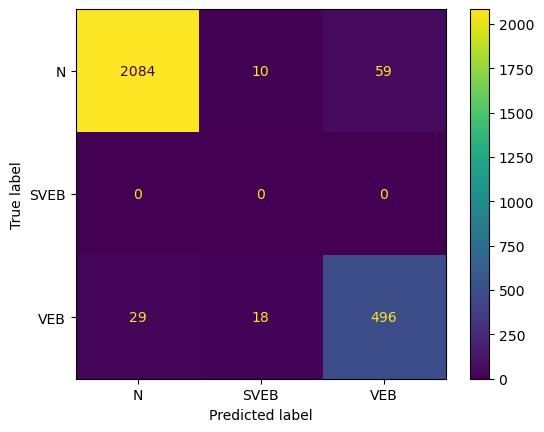

Fold 39:
  Test:  patient=38
              precision    recall  f1-score   support

         0.0       0.99      1.00      1.00      1460
         1.0       0.00      0.00      0.00         0
         2.0       0.99      0.96      0.98       313

    accuracy                           0.99      1773
   macro avg       0.66      0.65      0.66      1773
weighted avg       0.99      0.99      0.99      1773

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.993861  0.0    0.993399   0.99154     0.662420      0.993779
recall        0.997945  NaN    0.961661   0.99154     0.653202      0.991540
f1-score      0.995899  NaN    0.977273   0.99154     0.657724      0.992611
support    1460.000000  0.0  313.000000   0.99154  1773.000000   1773.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

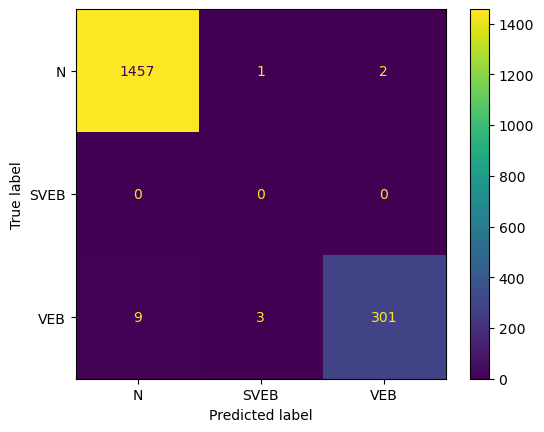

Fold 40:
  Test:  patient=39
              precision    recall  f1-score   support

         0.0       1.00      0.98      0.99      2566
         1.0       0.11      0.33      0.16         6
         2.0       0.74      0.97      0.84        92

    accuracy                           0.98      2664
   macro avg       0.61      0.76      0.66      2664
weighted avg       0.99      0.98      0.98      2664

                   0.0       1.0        2.0  accuracy    macro avg  \
precision     0.997227  0.105263   0.735537  0.978979     0.612676   
recall        0.980904  0.333333   0.967391  0.978979     0.760543   
f1-score      0.988998  0.160000   0.835681  0.978979     0.661560   
support    2566.000000  6.000000  92.000000  0.978979  2664.000000   

           weighted avg  
precision      0.986180  
recall         0.978979  
f1-score       0.981836  
support     2664.000000  


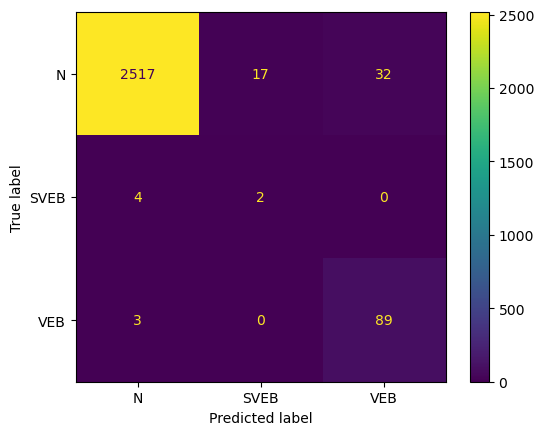

Fold 41:
  Test:  patient=40
              precision    recall  f1-score   support

         0.0       1.00      0.81      0.90      1622
         1.0       0.03      0.20      0.06         5
         2.0       0.00      1.00      0.01         1

    accuracy                           0.81      1628
   macro avg       0.34      0.67      0.32      1628
weighted avg       0.99      0.81      0.89      1628

                   0.0       1.0       2.0  accuracy    macro avg  \
precision     0.998485  0.032258  0.003610  0.810811     0.344784   
recall        0.812577  0.200000  1.000000  0.810811     0.670859   
f1-score      0.895989  0.055556  0.007194  0.810811     0.319580   
support    1622.000000  5.000000  1.000000  0.810811  1628.000000   

           weighted avg  
precision      0.994906  
recall         0.810811  
f1-score       0.892862  
support     1628.000000  


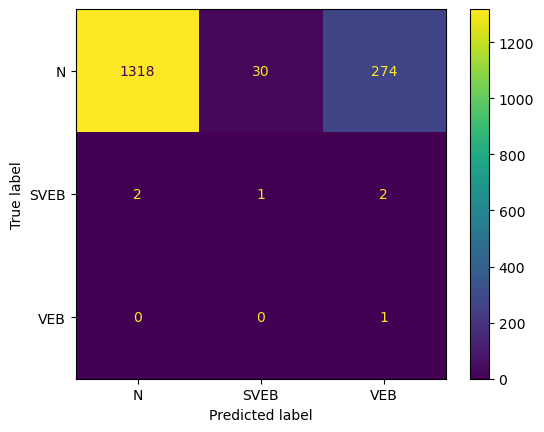

Fold 42:
  Test:  patient=41


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1544
         1.0       0.00      0.00      0.00         0
         2.0       1.00      1.00      1.00      1554

    accuracy                           1.00      3098
   macro avg       0.67      0.67      0.67      3098
weighted avg       1.00      1.00      1.00      3098

                   0.0  1.0          2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.0     0.997431  0.998386     0.665810      0.998711
recall        0.997409  NaN     0.999356  0.998386     0.665589      0.998386
f1-score      0.998703  NaN     0.998393  0.998386     0.665699      0.998547
support    1544.000000  0.0  1554.000000  0.998386  3098.000000   3098.000000


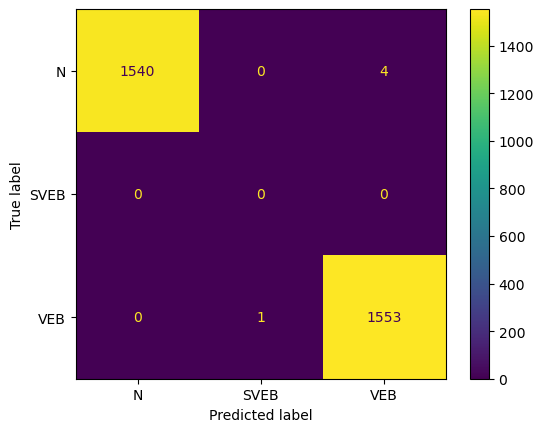

Fold 43:
  Test:  patient=42
              precision    recall  f1-score   support

         0.0       0.99      1.00      0.99      1085
         2.0       1.00      0.99      0.99      1120

    accuracy                           0.99      2205
   macro avg       0.99      0.99      0.99      2205
weighted avg       0.99      0.99      0.99      2205

                   0.0          2.0  accuracy    macro avg  weighted avg
precision     0.991751     0.997307  0.994558     0.994529      0.994573
recall        0.997235     0.991964  0.994558     0.994600      0.994558
f1-score      0.994485     0.994628  0.994558     0.994557      0.994558
support    1085.000000  1120.000000  0.994558  2205.000000   2205.000000


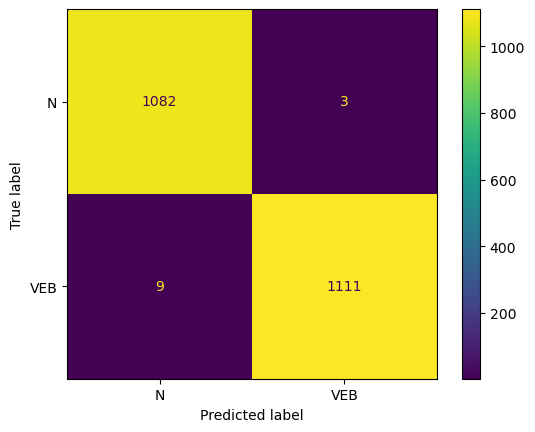

Fold 44:
  Test:  patient=43
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1802
         1.0       0.00      0.00      0.00         8
         2.0       1.00      1.00      1.00       683

    accuracy                           1.00      2493
   macro avg       0.66      0.67      0.67      2493
weighted avg       0.99      1.00      0.99      2493

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.995575  0.0    0.998538  0.995989     0.664704      0.993192
recall        0.998890  0.0    1.000000  0.995989     0.666297      0.995989
f1-score      0.997230  0.0    0.999268  0.995989     0.665499      0.994588
support    1802.000000  8.0  683.000000  0.995989  2493.000000   2493.000000


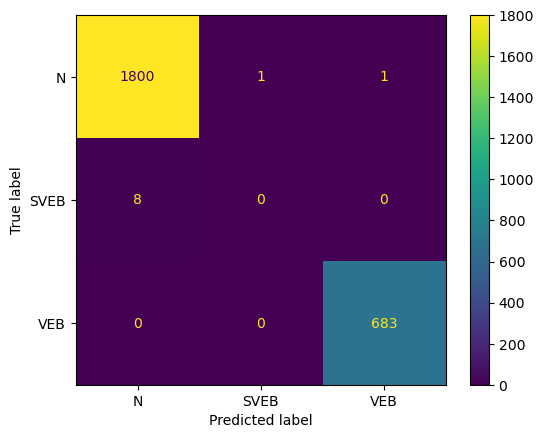

Fold 45:
  Test:  patient=44
              precision    recall  f1-score   support

         0.0       1.00      0.92      0.96      1435
         1.0       0.00      0.00      0.00         0
         2.0       1.00      1.00      1.00       491

    accuracy                           0.94      1926
   macro avg       0.67      0.64      0.65      1926
weighted avg       1.00      0.94      0.97      1926

                   0.0  1.0    2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.0    1.0  0.938733     0.666667      1.000000
recall        0.917770  NaN    1.0  0.938733     0.639257      0.938733
f1-score      0.957122  NaN    1.0  0.938733     0.652374      0.968053
support    1435.000000  0.0  491.0  0.938733  1926.000000   1926.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

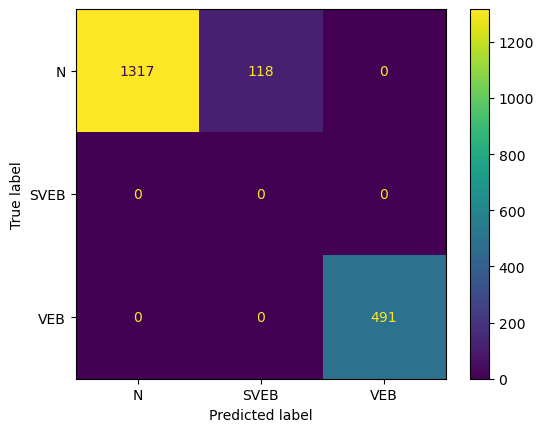

Fold 46:
  Test:  patient=45
              precision    recall  f1-score   support

         0.0       1.00      0.94      0.97      2230
         1.0       0.01      1.00      0.02         1
         2.0       0.99      0.98      0.98       422

    accuracy                           0.95      2653
   macro avg       0.66      0.98      0.66      2653
weighted avg       0.99      0.95      0.97      2653

                   0.0       1.0         2.0  accuracy    macro avg  \
precision     0.996679  0.008065    0.985748  0.948737     0.663497   
recall        0.942152  1.000000    0.983412  0.948737     0.975188   
f1-score      0.968649  0.016000    0.984579  0.948737     0.656409   
support    2230.000000  1.000000  422.000000  0.948737  2653.000000   

           weighted avg  
precision      0.994568  
recall         0.948737  
f1-score       0.970824  
support     2653.000000  


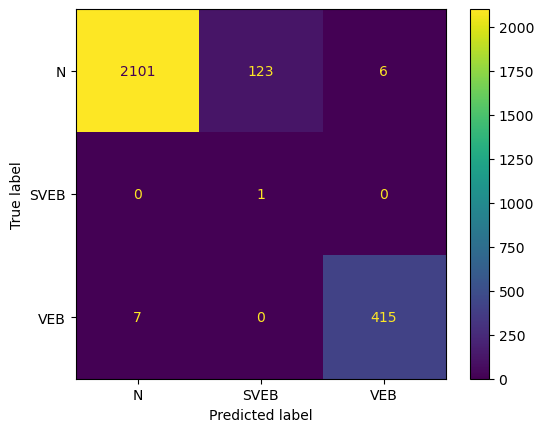

Fold 47:
  Test:  patient=46
              precision    recall  f1-score   support

         0.0       1.00      0.99      0.99      1857
         1.0       0.00      0.00      0.00         1
         2.0       0.97      0.99      0.98        93

    accuracy                           0.99      1951
   macro avg       0.66      0.66      0.66      1951
weighted avg       1.00      0.99      0.99      1951

                   0.0  1.0        2.0  accuracy    macro avg  weighted avg
precision     0.998912  0.0   0.968421  0.988211     0.655778      0.996946
recall        0.988691  0.0   0.989247  0.988211     0.659313      0.988211
f1-score      0.993775  0.0   0.978723  0.988211     0.657500      0.992549
support    1857.000000  1.0  93.000000  0.988211  1951.000000   1951.000000


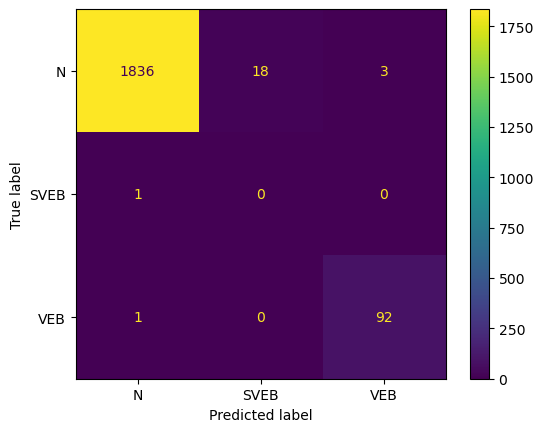

Fold 48:
  Test:  patient=47
              precision    recall  f1-score   support

         0.0       0.99      1.00      1.00      2117
         1.0       0.00      0.00      0.00         2
         2.0       1.00      0.96      0.98       235

    accuracy                           0.99      2354
   macro avg       0.66      0.65      0.66      2354
weighted avg       0.99      0.99      0.99      2354

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.994824  0.0    0.995595  0.994053     0.663473      0.994055
recall        0.998583  0.0    0.961702  0.994053     0.653428      0.994053
f1-score      0.996700  0.0    0.978355  0.994053     0.658352      0.994022
support    2117.000000  2.0  235.000000  0.994053  2354.000000   2354.000000


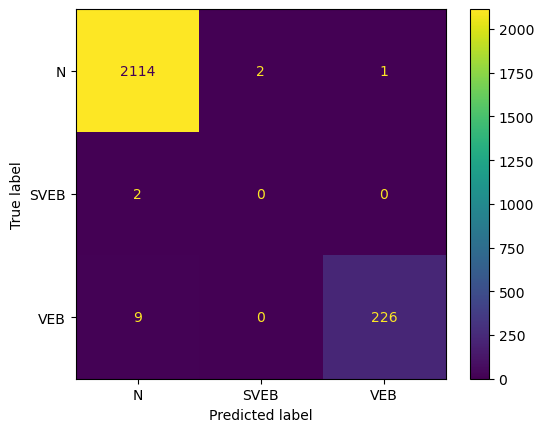

Fold 49:
  Test:  patient=48


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       1.00      0.99      0.99      2119
         1.0       0.00      0.00      0.00         0
         2.0       1.00      1.00      1.00        27

    accuracy                           0.99      2146
   macro avg       0.67      0.66      0.66      2146
weighted avg       1.00      0.99      0.99      2146

                   0.0  1.0   2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.0   1.0  0.989282     0.666667      1.000000
recall        0.989146  NaN   1.0  0.989282     0.663049      0.989282
f1-score      0.994543  NaN   1.0  0.989282     0.664848      0.994612
support    2119.000000  0.0  27.0  0.989282  2146.000000   2146.000000


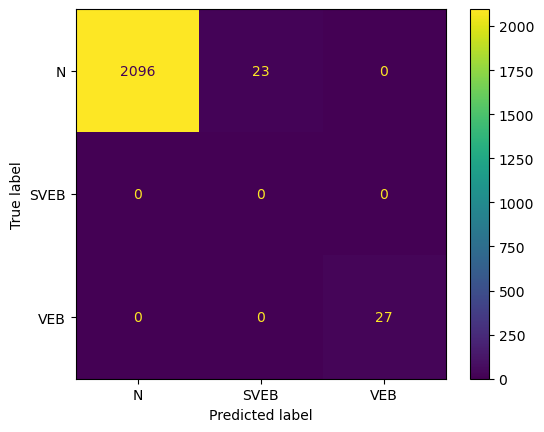

Fold 50:
  Test:  patient=49
              precision    recall  f1-score   support

         0.0       1.00      0.99      1.00      2993
         1.0       0.00      0.00      0.00         0
         2.0       0.43      0.75      0.55         4

    accuracy                           0.99      2997
   macro avg       0.48      0.58      0.51      2997
weighted avg       1.00      0.99      1.00      2997

                   0.0  1.0       2.0  accuracy    macro avg  weighted avg
precision     0.999664  0.0  0.428571   0.99366     0.476078      0.998902
recall        0.993986  NaN  0.750000   0.99366     0.581329      0.993660
f1-score      0.996817  NaN  0.545455   0.99366     0.514090      0.996214
support    2993.000000  0.0  4.000000   0.99366  2997.000000   2997.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

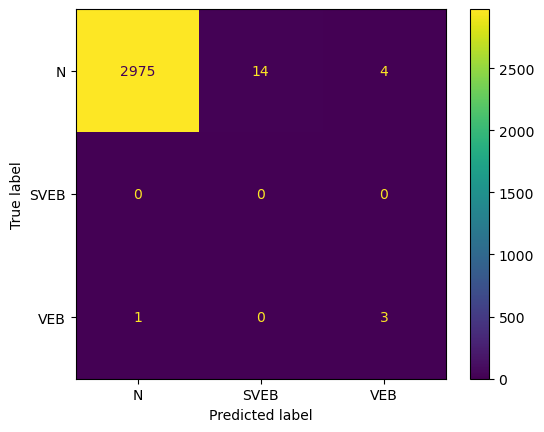

Fold 51:
  Test:  patient=50
              precision    recall  f1-score   support

         0.0       1.00      0.98      0.99      1969
         1.0       0.00      0.00      0.00         3
         2.0       0.98      1.00      0.99       802

    accuracy                           0.99      2774
   macro avg       0.66      0.66      0.66      2774
weighted avg       0.99      0.99      0.99      2774

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.998449  0.0    0.980440   0.98522     0.659630      0.992162
recall        0.980701  0.0    1.000000   0.98522     0.660234      0.985220
f1-score      0.989495  0.0    0.990123   0.98522     0.659873      0.988607
support    1969.000000  3.0  802.000000   0.98522  2774.000000   2774.000000


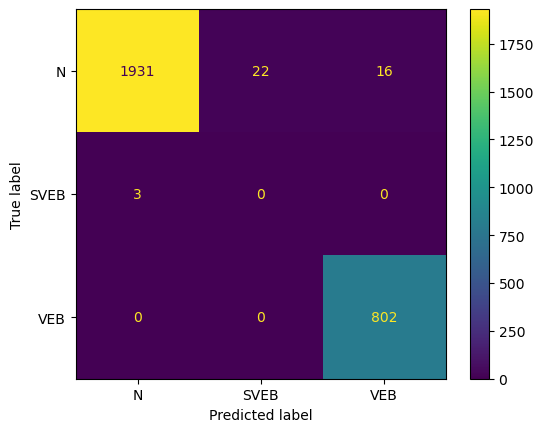

Fold 52:
  Test:  patient=51


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1608
         1.0       0.00      0.00      0.00         0
         2.0       1.00      1.00      1.00       137

    accuracy                           1.00      1745
   macro avg       0.67      0.67      0.67      1745
weighted avg       1.00      1.00      1.00      1745

                   0.0  1.0    2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.0    1.0  0.999427     0.666667      1.000000
recall        0.999378  NaN    1.0  0.999427     0.666459      0.999427
f1-score      0.999689  NaN    1.0  0.999427     0.666563      0.999713
support    1608.000000  0.0  137.0  0.999427  1745.000000   1745.000000


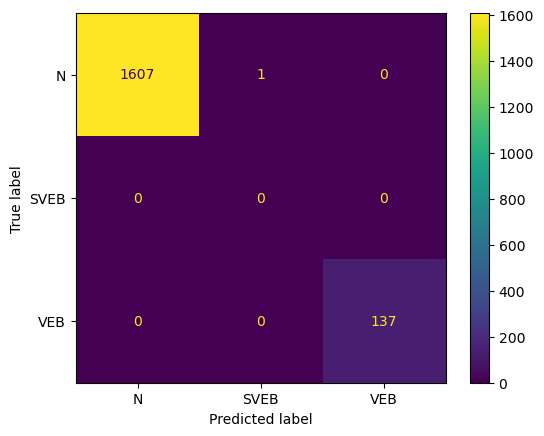

Fold 53:
  Test:  patient=52
              precision    recall  f1-score   support

         0.0       0.99      1.00      1.00      1150
         2.0       1.00      0.99      1.00      1110

    accuracy                           1.00      2260
   macro avg       1.00      1.00      1.00      2260
weighted avg       1.00      1.00      1.00      2260

                   0.0         2.0  accuracy    macro avg  weighted avg
precision     0.990525     1.00000  0.995133     0.995263      0.995179
recall        1.000000     0.99009  0.995133     0.995045      0.995133
f1-score      0.995240     0.99502  0.995133     0.995130      0.995132
support    1150.000000  1110.00000  0.995133  2260.000000   2260.000000


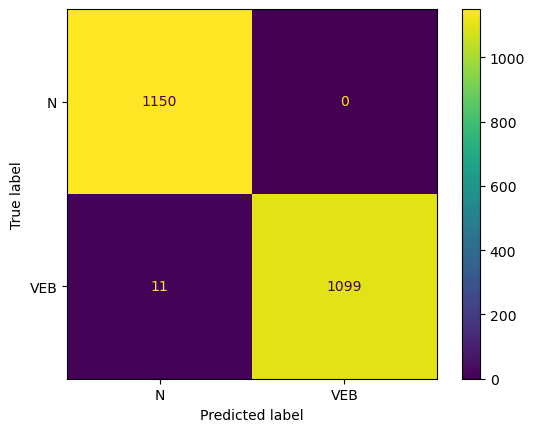

Fold 54:
  Test:  patient=53
              precision    recall  f1-score   support

         0.0       1.00      0.99      1.00      2338
         1.0       0.08      1.00      0.14         1
         2.0       0.68      0.77      0.72        22

    accuracy                           0.99      2361
   macro avg       0.59      0.92      0.62      2361
weighted avg       1.00      0.99      0.99      2361

                   0.0       1.0        2.0  accuracy    macro avg  \
precision     0.999570  0.076923   0.680000  0.991105     0.585498   
recall        0.993157  1.000000   0.772727  0.991105     0.921961   
f1-score      0.996353  0.142857   0.723404  0.991105     0.620871   
support    2338.000000  1.000000  22.000000  0.991105  2361.000000   

           weighted avg  
precision      0.996201  
recall         0.991105  
f1-score       0.993448  
support     2361.000000  


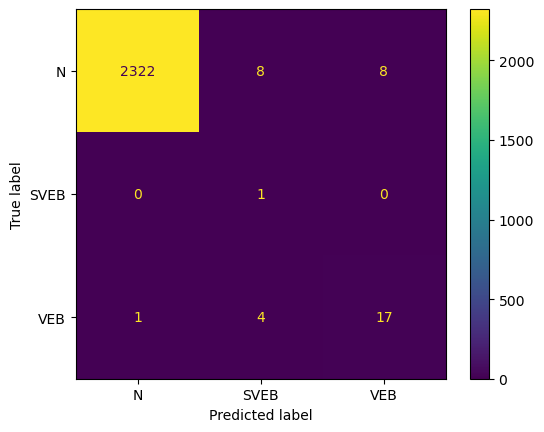

Fold 55:
  Test:  patient=54
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2146
         1.0       0.14      1.00      0.25         1
         2.0       1.00      0.76      0.87        17

    accuracy                           1.00      2164
   macro avg       0.71      0.92      0.70      2164
weighted avg       1.00      1.00      1.00      2164

                   0.0       1.0        2.0  accuracy    macro avg  \
precision     0.998134  0.142857   1.000000  0.995379     0.713664   
recall        0.997204  1.000000   0.764706  0.995379     0.920637   
f1-score      0.997669  0.250000   0.866667  0.995379     0.704779   
support    2146.000000  1.000000  17.000000  0.995379  2164.000000   

           weighted avg  
precision      0.997754  
recall         0.995379  
f1-score       0.996294  
support     2164.000000  


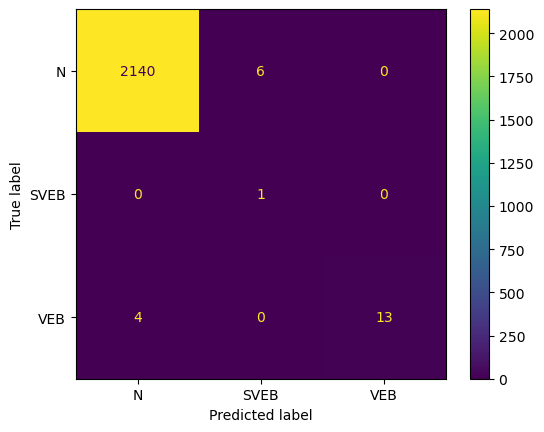

Fold 56:
  Test:  patient=55
              precision    recall  f1-score   support

         0.0       0.99      1.00      1.00      1670
         1.0       1.00      0.50      0.67        26
         2.0       1.00      0.86      0.92         7

    accuracy                           0.99      1703
   macro avg       1.00      0.79      0.86      1703
weighted avg       0.99      0.99      0.99      1703

                   0.0        1.0       2.0  accuracy    macro avg  \
precision     0.991686   1.000000  1.000000  0.991779     0.997229   
recall        1.000000   0.500000  0.857143  0.991779     0.785714   
f1-score      0.995826   0.666667  0.923077  0.991779     0.861856   
support    1670.000000  26.000000  7.000000  0.991779  1703.000000   

           weighted avg  
precision      0.991848  
recall         0.991779  
f1-score       0.990502  
support     1703.000000  


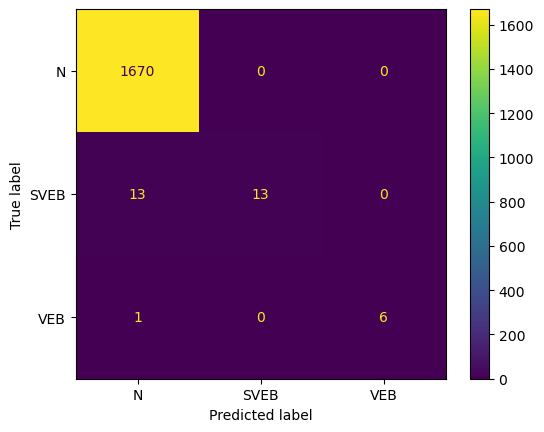

Fold 57:
  Test:  patient=56
              precision    recall  f1-score   support

         0.0       1.00      0.99      1.00      2840
         1.0       0.00      0.00      0.00         3
         2.0       0.46      0.57      0.51        21

    accuracy                           0.99      2864
   macro avg       0.49      0.52      0.50      2864
weighted avg       0.99      0.99      0.99      2864

                   0.0  1.0        2.0  accuracy    macro avg  weighted avg
precision     0.996121  0.0   0.461538  0.990573     0.485887      0.991158
recall        0.994718  0.0   0.571429  0.990573     0.522049      0.990573
f1-score      0.995419  0.0   0.510638  0.990573     0.502019      0.990822
support    2840.000000  3.0  21.000000  0.990573  2864.000000   2864.000000


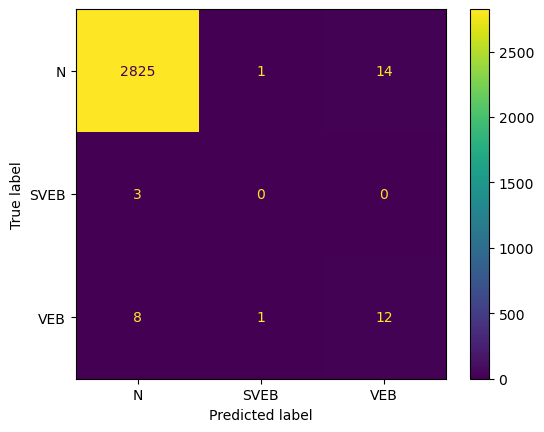

Fold 58:
  Test:  patient=57
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2311
         2.0       0.79      0.92      0.85        12

    accuracy                           1.00      2323
   macro avg       0.89      0.96      0.92      2323
weighted avg       1.00      1.00      1.00      2323

                   0.0        2.0  accuracy    macro avg  weighted avg
precision     0.999567   0.785714  0.998278     0.892641      0.998462
recall        0.998702   0.916667  0.998278     0.957684      0.998278
f1-score      0.999134   0.846154  0.998278     0.922644      0.998344
support    2311.000000  12.000000  0.998278  2323.000000   2323.000000


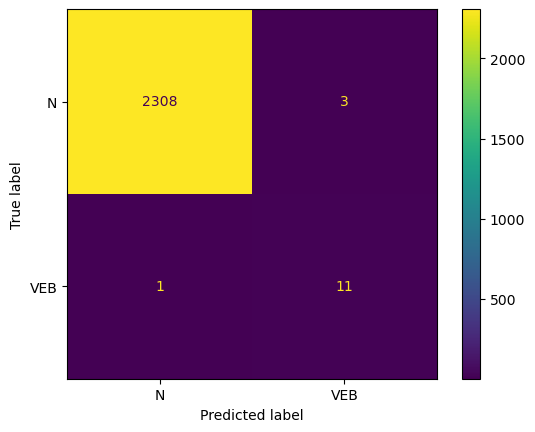

Fold 59:
  Test:  patient=58
              precision    recall  f1-score   support

         0.0       0.98      0.99      0.98      2065
         1.0       0.00      0.00      0.00         0
         2.0       0.75      0.41      0.53        81

    accuracy                           0.97      2146
   macro avg       0.58      0.47      0.50      2146
weighted avg       0.97      0.97      0.97      2146

                   0.0  1.0        2.0  accuracy    macro avg  weighted avg
precision     0.977110  0.0   0.750000  0.970177     0.575703      0.968538
recall        0.992252  NaN   0.407407  0.970177     0.466553      0.970177
f1-score      0.984623  NaN   0.528000  0.970177     0.504208      0.967388
support    2065.000000  0.0  81.000000  0.970177  2146.000000   2146.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

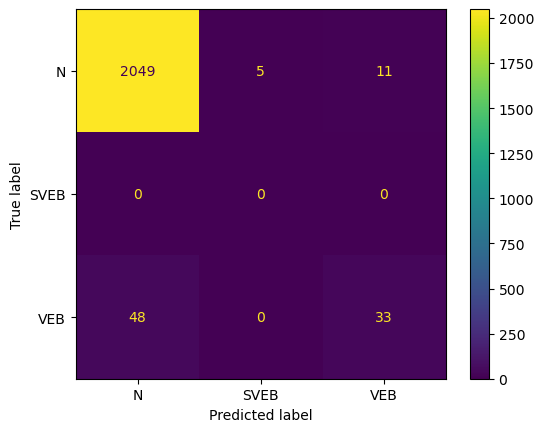

Fold 60:
  Test:  patient=59
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2473
         1.0       0.00      0.00      0.00         0
         2.0       0.00      0.00      0.00         0

    accuracy                           1.00      2473
   macro avg       0.33      0.33      0.33      2473
weighted avg       1.00      1.00      1.00      2473

                   0.0  1.0  2.0  accuracy    macro avg  weighted avg
precision     1.000000  0.0  0.0  0.995148     0.333333      1.000000
recall        0.995148  NaN  NaN  0.995148     0.331716      0.995148
f1-score      0.997568  NaN  NaN  0.995148     0.332523      0.997568
support    2473.000000  0.0  0.0  0.995148  2473.000000   2473.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

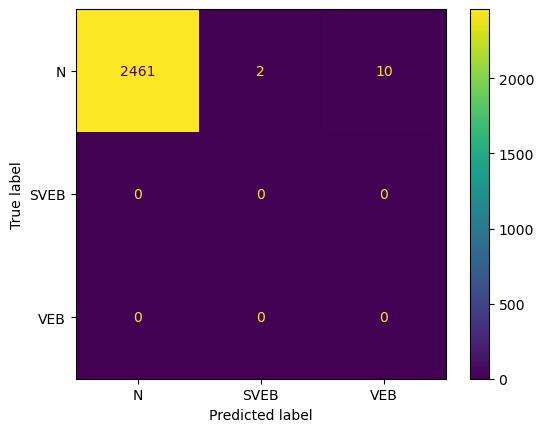

Fold 61:
  Test:  patient=60
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1451
         1.0       0.00      0.00      0.00         1

    accuracy                           1.00      1452
   macro avg       0.50      0.50      0.50      1452
weighted avg       1.00      1.00      1.00      1452

                   0.0  1.0  accuracy    macro avg  weighted avg
precision     0.999311  NaN  0.999311     0.499656      0.998623
recall        1.000000  0.0  0.999311     0.500000      0.999311
f1-score      0.999656  NaN  0.999311     0.499828      0.998967
support    1451.000000  1.0  0.999311  1452.000000   1452.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\

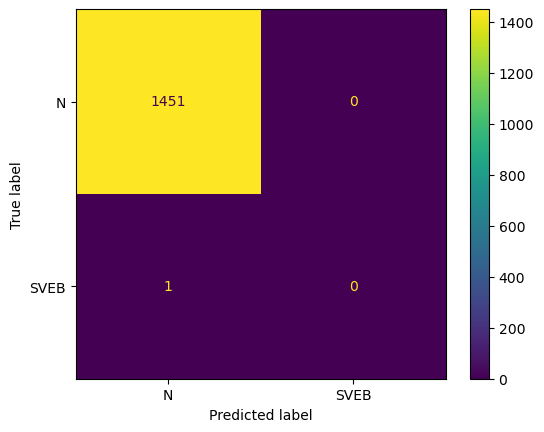

Fold 62:
  Test:  patient=61
              precision    recall  f1-score   support

         0.0       0.94      0.99      0.97      1451
         1.0       0.00      0.00      0.00         9
         2.0       1.00      0.90      0.95       795

    accuracy                           0.96      2255
   macro avg       0.65      0.63      0.64      2255
weighted avg       0.96      0.96      0.96      2255

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.944990  0.0    0.995833  0.957871     0.646941      0.959143
recall        0.994487  0.0    0.901887  0.957871     0.632124      0.957871
f1-score      0.969107  0.0    0.946535  0.957871     0.638547      0.957281
support    1451.000000  9.0  795.000000  0.957871  2255.000000   2255.000000


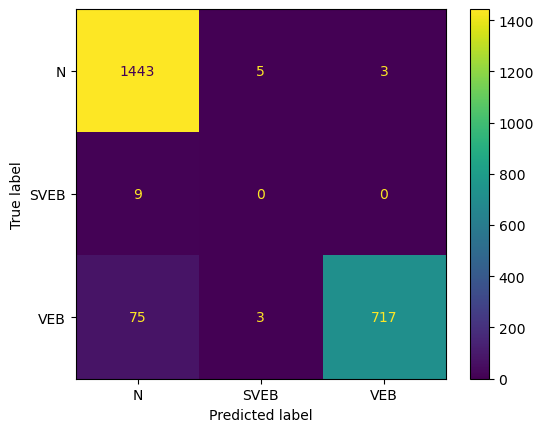

Fold 63:
  Test:  patient=62
              precision    recall  f1-score   support

         0.0       0.99      1.00      0.99      1845
         1.0       0.00      0.00      0.00         1
         2.0       0.98      0.84      0.91       138

    accuracy                           0.99      1984
   macro avg       0.66      0.61      0.63      1984
weighted avg       0.99      0.99      0.99      1984

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.988197  0.0    0.983051  0.986895     0.657083      0.987341
recall        0.998374  0.0    0.840580  0.986895     0.612985      0.986895
f1-score      0.993260  0.0    0.906250  0.986895     0.633170      0.986707
support    1845.000000  1.0  138.000000  0.986895  1984.000000   1984.000000


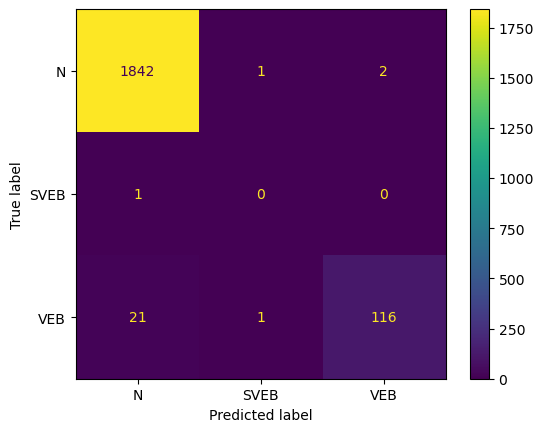

Fold 64:
  Test:  patient=63


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       1.00      0.98      0.99      1885
         1.0       0.00      0.00      0.00         0
         2.0       0.49      0.96      0.65        23

    accuracy                           0.98      1908
   macro avg       0.50      0.65      0.55      1908
weighted avg       0.99      0.98      0.99      1908

                   0.0  1.0        2.0  accuracy    macro avg  weighted avg
precision     0.999459  0.0   0.488889  0.980608     0.496116      0.993305
recall        0.980902  NaN   0.956522  0.980608     0.645808      0.980608
f1-score      0.990094  NaN   0.647059  0.980608     0.545718      0.985959
support    1885.000000  0.0  23.000000  0.980608  1908.000000   1908.000000


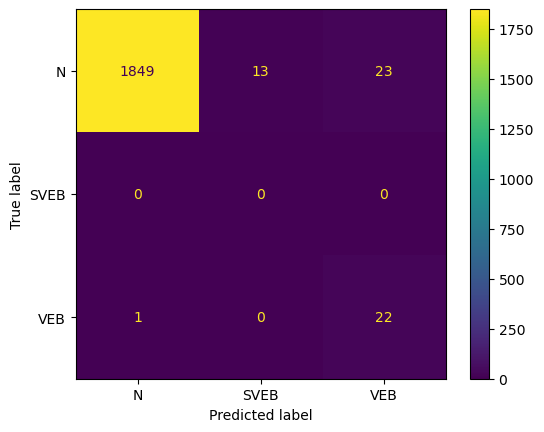

Fold 65:
  Test:  patient=64
              precision    recall  f1-score   support

         0.0       0.98      0.96      0.97      2271
         1.0       0.00      0.00      0.00         5
         2.0       0.97      0.92      0.95       382

    accuracy                           0.96      2658
   macro avg       0.65      0.63      0.64      2658
weighted avg       0.98      0.96      0.97      2658

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.984712  0.0    0.975000  0.955982     0.653237      0.981464
recall        0.964333  0.0    0.918848  0.955982     0.627727      0.955982
f1-score      0.974416  0.0    0.946092  0.955982     0.640169      0.968512
support    2271.000000  5.0  382.000000  0.955982  2658.000000   2658.000000


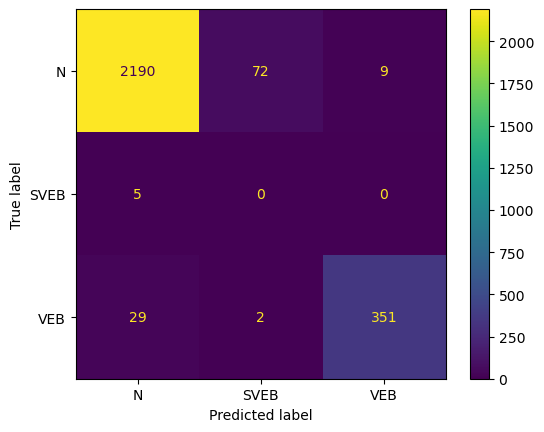

Fold 66:
  Test:  patient=65
              precision    recall  f1-score   support

         0.0       1.00      0.95      0.98      2137
         1.0       0.00      0.00      0.00         1
         2.0       0.93      0.99      0.96       200

    accuracy                           0.96      2338
   macro avg       0.64      0.65      0.64      2338
weighted avg       0.99      0.96      0.97      2338

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.999020  0.0    0.925581  0.956801     0.641534      0.992310
recall        0.953673  0.0    0.995000  0.956801     0.649558      0.956801
f1-score      0.975820  0.0    0.959036  0.956801     0.644952      0.973967
support    2137.000000  1.0  200.000000  0.956801  2338.000000   2338.000000


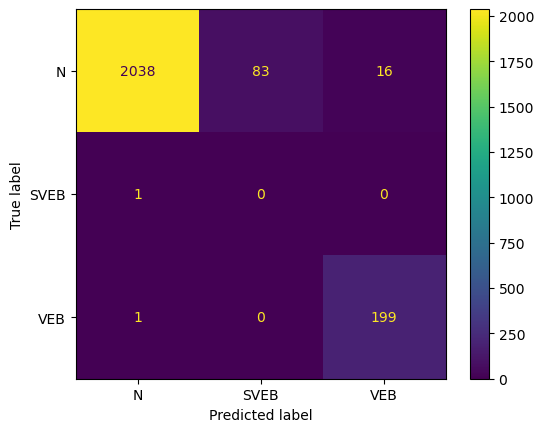

Fold 67:
  Test:  patient=66
              precision    recall  f1-score   support

         0.0       1.00      0.98      0.99      2436
         1.0       0.00      0.00      0.00         5
         2.0       0.98      0.98      0.98       531

    accuracy                           0.98      2972
   macro avg       0.66      0.65      0.66      2972
weighted avg       0.99      0.98      0.99      2972

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.995837  0.0    0.984791  0.979139     0.660209      0.992188
recall        0.981938  0.0    0.975518  0.979139     0.652485      0.979139
f1-score      0.988838  0.0    0.980132  0.979139     0.656324      0.985619
support    2436.000000  5.0  531.000000  0.979139  2972.000000   2972.000000


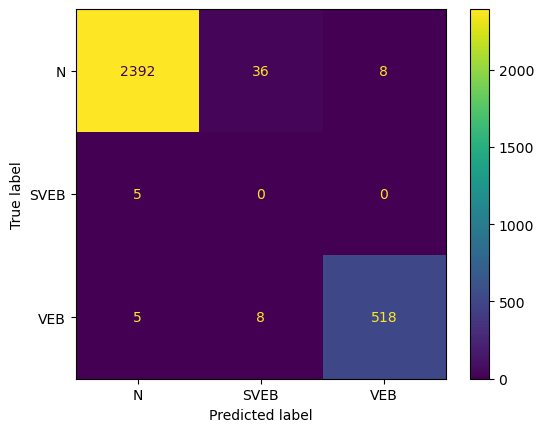

Fold 68:
  Test:  patient=67
              precision    recall  f1-score   support

         0.0       1.00      0.96      0.98      2480
         1.0       0.00      0.00      0.00         2
         2.0       0.96      0.99      0.98       161

    accuracy                           0.96      2643
   macro avg       0.65      0.65      0.65      2643
weighted avg       1.00      0.96      0.98      2643

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.998746  0.0    0.963855  0.964434     0.654200      0.995865
recall        0.963306  0.0    0.993789  0.964434     0.652365      0.964434
f1-score      0.980706  0.0    0.978593  0.964434     0.653100      0.979835
support    2480.000000  2.0  161.000000  0.964434  2643.000000   2643.000000


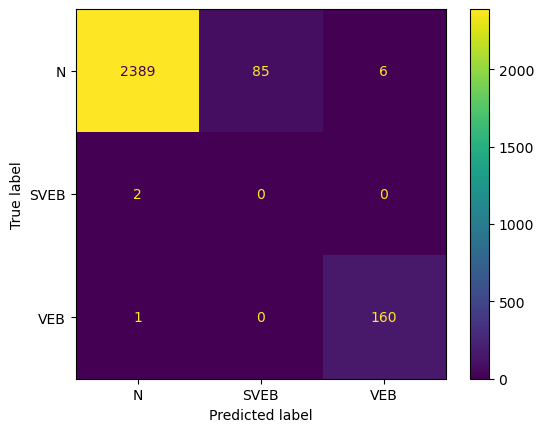

Fold 69:
  Test:  patient=68
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1998
         1.0       0.00      0.00      0.00         1
         2.0       1.00      0.99      1.00       167

    accuracy                           1.00      2166
   macro avg       0.67      0.66      0.67      2166
weighted avg       1.00      1.00      1.00      2166

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.998999  0.0    1.000000  0.998615     0.666333      0.998615
recall        0.999499  0.0    0.994012  0.998615     0.664504      0.998615
f1-score      0.999249  0.0    0.996997  0.998615     0.665415      0.998614
support    1998.000000  1.0  167.000000  0.998615  2166.000000   2166.000000


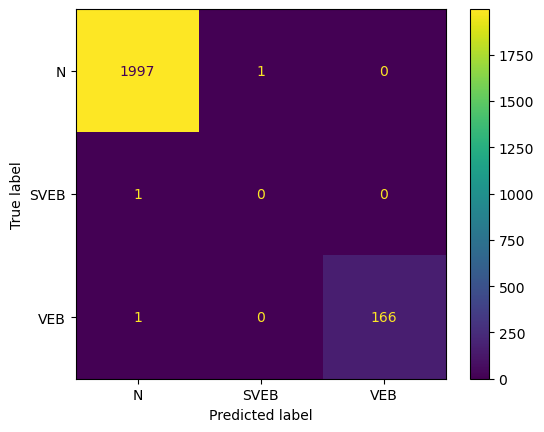

Fold 70:
  Test:  patient=69
              precision    recall  f1-score   support

         0.0       0.96      0.70      0.81      1539
         1.0       0.38      0.63      0.47       126
         2.0       0.00      0.00      0.00         0

    accuracy                           0.69      1665
   macro avg       0.45      0.44      0.43      1665
weighted avg       0.92      0.69      0.78      1665

                   0.0         1.0  2.0  accuracy    macro avg  weighted avg
precision     0.959893    0.381643  0.0  0.694294     0.447179      0.916134
recall        0.699805    0.626984  NaN  0.694294     0.442263      0.694294
f1-score      0.809470    0.474474  NaN  0.694294     0.427982      0.784119
support    1539.000000  126.000000  0.0  0.694294  1665.000000   1665.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

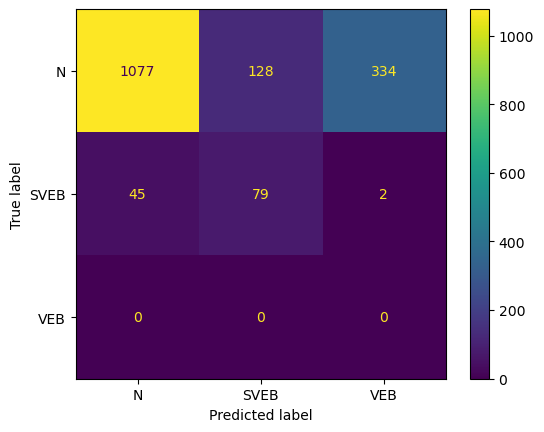

Fold 71:
  Test:  patient=70
              precision    recall  f1-score   support

         0.0       1.00      0.87      0.93      1634
         1.0       0.16      0.94      0.27        35
         2.0       0.00      0.00      0.00         0

    accuracy                           0.87      1669
   macro avg       0.39      0.60      0.40      1669
weighted avg       0.98      0.87      0.92      1669

                   0.0        1.0  2.0  accuracy    macro avg  weighted avg
precision     0.998597   0.159420  0.0  0.872978     0.386006      0.980999
recall        0.871481   0.942857  NaN  0.872978     0.604779      0.872978
f1-score      0.930719   0.272727  NaN  0.872978     0.401149      0.916920
support    1634.000000  35.000000  0.0  0.872978  1669.000000   1669.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

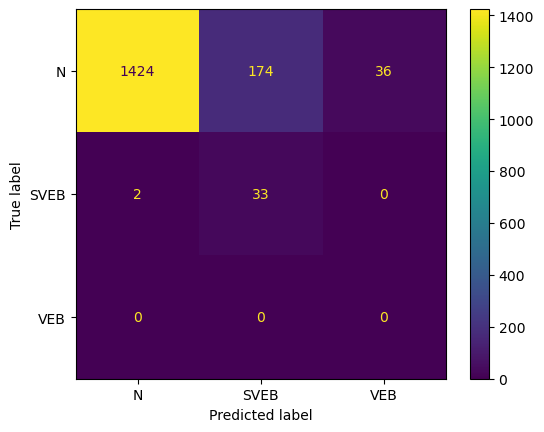

Fold 72:
  Test:  patient=71
              precision    recall  f1-score   support

         0.0       1.00      0.97      0.98      1874
         1.0       0.10      0.62      0.17         8
         2.0       0.98      0.99      0.99       386

    accuracy                           0.97      2268
   macro avg       0.69      0.86      0.71      2268
weighted avg       0.99      0.97      0.98      2268

                   0.0       1.0         2.0  accuracy    macro avg  \
precision     0.997807  0.098039    0.977099  0.973986     0.690982   
recall        0.971185  0.625000    0.994819  0.973986     0.863668   
f1-score      0.984316  0.169492    0.985879  0.973986     0.713229   
support    1874.000000  8.000000  386.000000  0.973986  2268.000000   

           weighted avg  
precision      0.991109  
recall         0.973986  
f1-score       0.981708  
support     2268.000000  


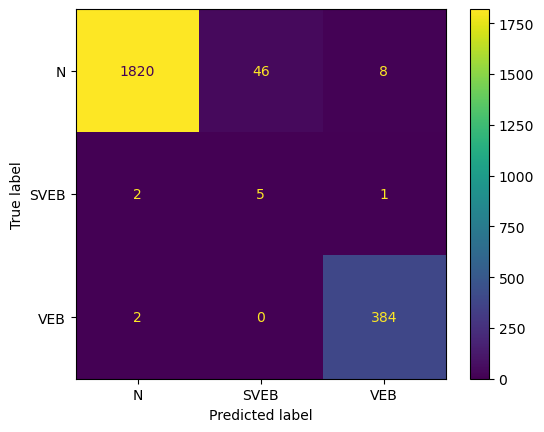

Fold 73:
  Test:  patient=72
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1888
         1.0       0.87      0.84      0.86        32
         2.0       0.97      0.96      0.96        70

    accuracy                           0.99      1990
   macro avg       0.95      0.93      0.94      1990
weighted avg       0.99      0.99      0.99      1990

                   0.0        1.0        2.0  accuracy    macro avg  \
precision     0.996296   0.870968   0.971014  0.993467     0.946093   
recall        0.997352   0.843750   0.957143  0.993467     0.932748   
f1-score      0.996824   0.857143   0.964029  0.993467     0.939332   
support    1888.000000  32.000000  70.000000  0.993467  1990.000000   

           weighted avg  
precision      0.993392  
recall         0.993467  
f1-score       0.993424  
support     1990.000000  


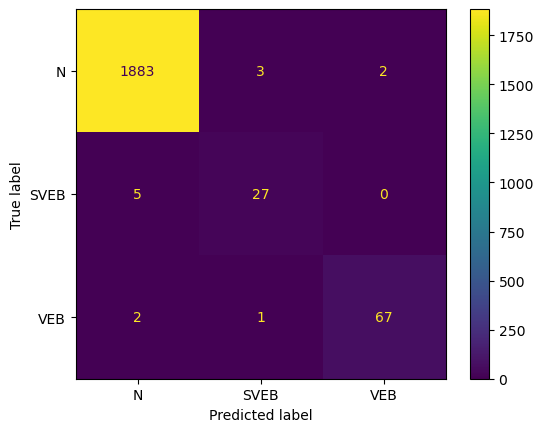

Fold 74:
  Test:  patient=73
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2081
         2.0       0.99      1.00      1.00       274

    accuracy                           1.00      2355
   macro avg       1.00      1.00      1.00      2355
weighted avg       1.00      1.00      1.00      2355

                   0.0         2.0  accuracy    macro avg  weighted avg
precision     1.000000    0.992754  0.999151     0.996377      0.999157
recall        0.999039    1.000000  0.999151     0.999519      0.999151
f1-score      0.999519    0.996364  0.999151     0.997941      0.999152
support    2081.000000  274.000000  0.999151  2355.000000   2355.000000


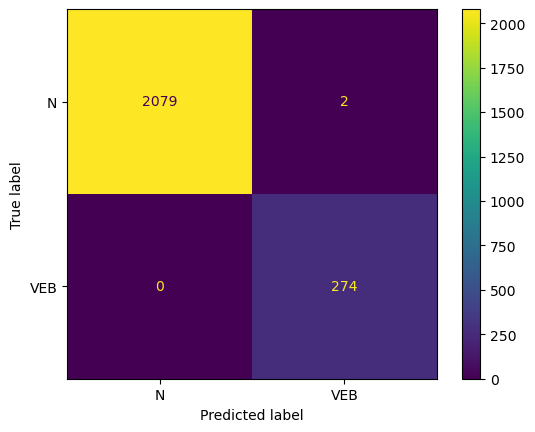

Fold 75:
  Test:  patient=74
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1482
         2.0       1.00      0.99      1.00       612

    accuracy                           1.00      2094
   macro avg       1.00      1.00      1.00      2094
weighted avg       1.00      1.00      1.00      2094

                   0.0         2.0  accuracy    macro avg  weighted avg
precision     0.997308    1.000000   0.99809     0.998654      0.998095
recall        1.000000    0.993464   0.99809     0.996732      0.998090
f1-score      0.998652    0.996721   0.99809     0.997687      0.998088
support    1482.000000  612.000000   0.99809  2094.000000   2094.000000


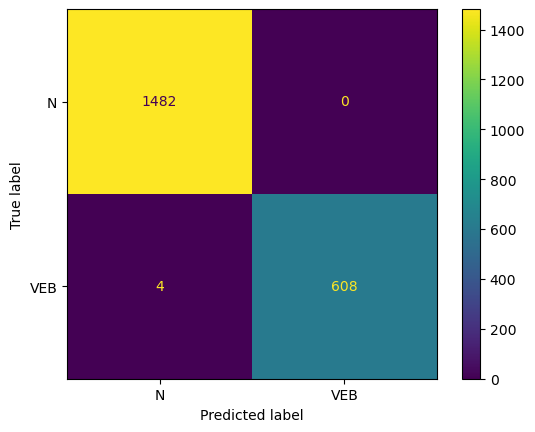

C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\numpy\core\fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\numpy\core\_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [36]:
X=df_cardio.drop('type',axis=1)
y=df_cardio['type']
groups=df_cardio['patient']
skf = LeaveOneGroupOut()


start_time=time.time()
df_f19, acc_f19,confusion_matrix_final_f19,list_f19 = cross_valid(pipe_f19, skf, X, y,groups)
end_time=time.time()

In [37]:
df_f19

,0.0,1.0,2.0,macro avg,weighted avg
f1-score,0.980106,0.252890,0.776002,0.649595,0.974383
precision,0.993753,0.129118,0.721384,0.647246,0.986287
recall,0.968017,0.398475,0.883041,0.706811,0.965188
support,2047.280000,30.123077,270.270270,2340.053333,2340.053333


In [38]:
confusion_matrix_final_f19

array([[1.48877e+05, 2.60100e+03, 2.06800e+03],
       [3.19000e+02, 5.65600e+03, 4.60000e+01],
       [5.52000e+02, 1.81000e+02, 1.52040e+04]])

In [39]:
list_f19

{'patient0': {'0.0': 0.9781236853176273,
  '2.0': 0.8632138114209827,
  'macro avg': 0.6137791655795367,
  'weighted avg': 0.96377559217046},
 'patient1': {'0.0': 0.9776674937965261,
  '2.0': 0.7889546351084813,
  'macro avg': 0.5888740429683358,
  'weighted avg': 0.9614941237966899},
 'patient2': {'0.0': 0.9710625138060526,
  '1.0': 0.0,
  '2.0': 0.9195402298850575,
  'macro avg': 0.6302009145637033,
  'weighted avg': 0.9676411217579969},
 'patient3': {'0.0': 0.9748944678960232,
  '1.0': 0.0,
  '2.0': 0.6785714285714286,
  'macro avg': 0.5511552988224839,
  'weighted avg': 0.9535001230957684},
 'patient4': {'0.0': 0.9799870884441575,
  '2.0': 0.8564814814814814,
  'macro avg': 0.9182342849628194,
  'weighted avg': 0.9627033009541965},
 'patient5': {'0.0': 0.9925619834710744,
  '1.0': 0.7039999999999998,
  '2.0': 0.9411764705882353,
  'macro avg': 0.8792461513531032,
  'weighted avg': 0.9868159197125207},
 'patient6': {'0.0': 0.9977255496588324,
  '1.0': 0.9291338582677167,
  '2.0': 0.

In [42]:
def retrieve_fscore_avg(list_f):
    f1score_list=[]
    for patient in list_f:
        #print(list_f[patient])
        f1score_list.append(list_f[patient]['macro avg'])
    return f1score_list

In [45]:
from scipy.stats import wilcoxon
list_normal=retrieve_fscore_avg(list_f1score)
list_smote=retrieve_fscore_avg(list_f)
wilcoxon(list_normal, list_smote)

WilcoxonResult(statistic=761.0, pvalue=0.0007378798644579825)

In [46]:
from scipy.stats import wilcoxon
list_normal=retrieve_fscore_avg(list_f1score)
list_smote=retrieve_fscore_avg(list_PCA)
wilcoxon(list_normal, list_smote)

WilcoxonResult(statistic=1378.0, pvalue=0.8039903663057251)

In [47]:
from scipy.stats import wilcoxon
list_normal=retrieve_fscore_avg(list_f1score)
list_smote=retrieve_fscore_avg(list_f30)
wilcoxon(list_normal, list_smote)

WilcoxonResult(statistic=713.0, pvalue=0.00027939584491459824)

In [48]:
from scipy.stats import wilcoxon
list_normal=retrieve_fscore_avg(list_f1score)
list_smote=retrieve_fscore_avg(list_f19)
wilcoxon(list_normal, list_smote)

WilcoxonResult(statistic=932.0, pvalue=0.03205958528220186)

In [49]:
from scipy.stats import wilcoxon
list_normal=retrieve_fscore_avg(list_f19)
list_smote=retrieve_fscore_avg(list_PCA)
wilcoxon(list_normal, list_smote)

WilcoxonResult(statistic=742.0, pvalue=0.00031021107198814815)

In [50]:
from scipy.stats import wilcoxon
list_normal=retrieve_fscore_avg(list_f30)
list_smote=retrieve_fscore_avg(list_PCA)
wilcoxon(list_normal, list_smote)

WilcoxonResult(statistic=475.0, pvalue=5.261334597254217e-07)

In [51]:
from scipy.stats import wilcoxon
list_normal=retrieve_fscore_avg(list_f)
list_smote=retrieve_fscore_avg(list_PCA)
wilcoxon(list_normal, list_smote)

WilcoxonResult(statistic=492.0, pvalue=1.4051712363812472e-06)

The results between the classification on the INCART dataset and the classification on the dataset analyzed on KNN_Classifier seems to be very different 

# MIT-BIH Supraventricular Arrhythmia Database

In [60]:
df3=pd.read_csv('C:/Users/matte/DataMiningJupyter/projectDM/datasets/starting_dataset/MIT-BIH Supraventricular Arrhythmia Database.csv',dtype={"record": "string"})

In [61]:
df3['type'].value_counts()

N       162195
SVEB     12194
VEB       9937
Q           79
F           23
Name: type, dtype: int64

In [64]:
df_sup=preprocessed_dataset(df3)

In [65]:
df_sup['type'].value_counts()

0.0    162195
1.0     12194
2.0      9937
Name: type, dtype: int64

Fold 1:
  Test:  patient=0


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\

              precision    recall  f1-score   support

         0.0       0.98      0.98      0.98      1844
         1.0       0.00      0.00      0.00        30
         2.0       0.03      0.17      0.04         6

    accuracy                           0.96      1880
   macro avg       0.34      0.38      0.34      1880
weighted avg       0.96      0.96      0.96      1880

                   0.0   1.0       2.0  accuracy    macro avg  weighted avg
precision     0.980978   NaN  0.025000  0.960638     0.335326      0.962273
recall        0.978850   0.0  0.166667  0.960638     0.381839      0.960638
f1-score      0.979913   NaN  0.043478  0.960638     0.341130      0.961288
support    1844.000000  30.0  6.000000  0.960638  1880.000000   1880.000000


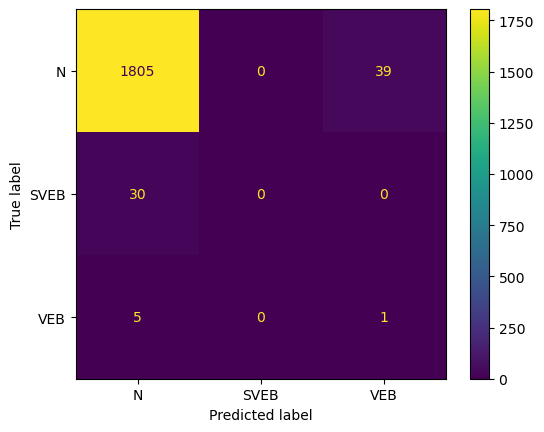

Fold 2:
  Test:  patient=1


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\

              precision    recall  f1-score   support

         0.0       0.91      0.99      0.95      2173
         1.0       0.00      0.00      0.00        66
         2.0       0.81      0.49      0.61       268

    accuracy                           0.91      2507
   macro avg       0.58      0.49      0.52      2507
weighted avg       0.88      0.91      0.89      2507

                   0.0   1.0         2.0  accuracy    macro avg  weighted avg
precision     0.914322   NaN    0.813665  0.907858     0.575996      0.879491
recall        0.987115   0.0    0.488806  0.907858     0.491974      0.907858
f1-score      0.949325   NaN    0.610723  0.907858     0.520016      0.888136
support    2173.000000  66.0  268.000000  0.907858  2507.000000   2507.000000


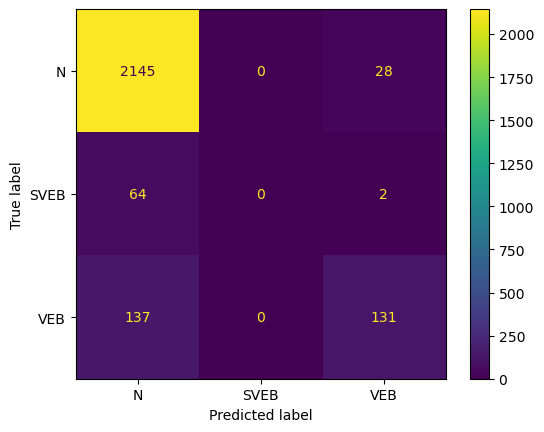

Fold 3:
  Test:  patient=2


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       0.96      1.00      0.98      1584
         1.0       0.00      0.00      0.00         0
         2.0       1.00      0.15      0.27        85

    accuracy                           0.96      1669
   macro avg       0.65      0.38      0.41      1669
weighted avg       0.96      0.96      0.94      1669

                  0.0  1.0        2.0  accuracy    macro avg  weighted avg
precision     0.95710  0.0   1.000000   0.95686     0.652367      0.959285
recall        1.00000  NaN   0.152941   0.95686     0.384314      0.956860
f1-score      0.97808  NaN   0.265306   0.95686     0.414462      0.941779
support    1584.00000  0.0  85.000000   0.95686  1669.000000   1669.000000


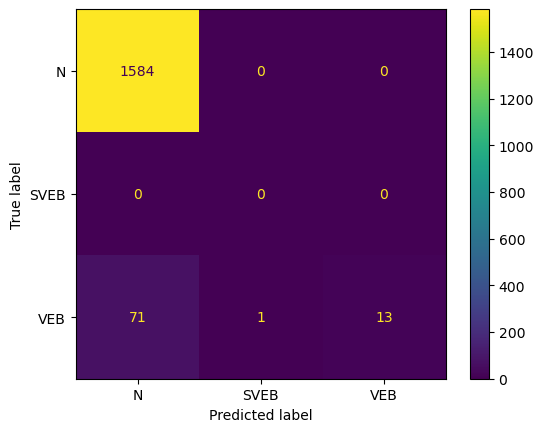

Fold 4:
  Test:  patient=3


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       0.97      1.00      0.98      1922
         1.0       0.00      0.00      0.00         0
         2.0       0.96      0.52      0.67       143

    accuracy                           0.97      2065
   macro avg       0.64      0.51      0.55      2065
weighted avg       0.97      0.97      0.96      2065

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.967726  0.0    0.961039  0.965133     0.642922      0.967263
recall        0.998439  NaN    0.517483  0.965133     0.505307      0.965133
f1-score      0.982843  NaN    0.672727  0.965133     0.551857      0.961367
support    1922.000000  0.0  143.000000  0.965133  2065.000000   2065.000000


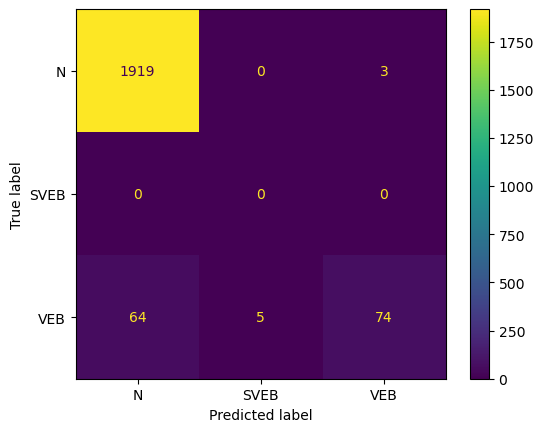

Fold 5:
  Test:  patient=4


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       0.95      1.00      0.98      2651
         1.0       0.00      0.00      0.00         0
         2.0       0.93      0.29      0.44       181

    accuracy                           0.95      2832
   macro avg       0.63      0.43      0.47      2832
weighted avg       0.95      0.95      0.94      2832

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.954857  0.0    0.928571  0.951977     0.627810      0.953177
recall        0.997359  NaN    0.287293  0.951977     0.428217      0.951977
f1-score      0.975646  NaN    0.438819  0.951977     0.471488      0.941336
support    2651.000000  0.0  181.000000  0.951977  2832.000000   2832.000000


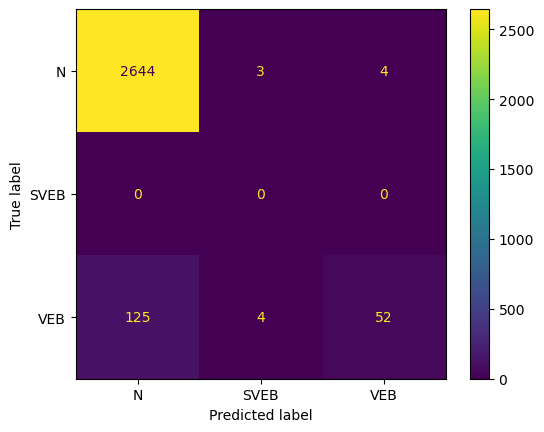

Fold 6:
  Test:  patient=5


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       0.93      0.92      0.92      2089
         1.0       0.00      0.00      0.00         0
         2.0       0.30      0.28      0.29       207

    accuracy                           0.86      2296
   macro avg       0.41      0.40      0.40      2296
weighted avg       0.87      0.86      0.86      2296

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.927326  0.0    0.304813  0.858449     0.410713      0.871202
recall        0.916228  NaN    0.275362  0.858449     0.397197      0.858449
f1-score      0.921743  NaN    0.289340  0.858449     0.403694      0.864728
support    2089.000000  0.0  207.000000  0.858449  2296.000000   2296.000000


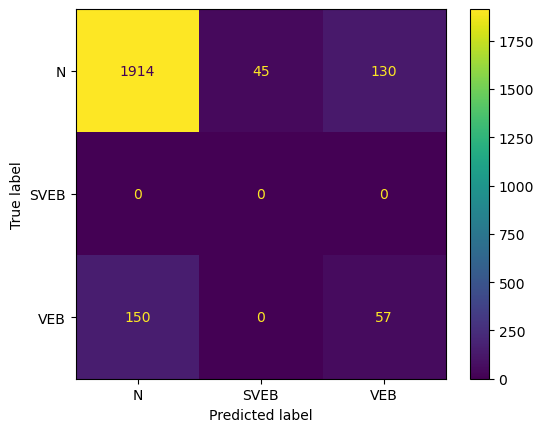

Fold 7:
  Test:  patient=6
              precision    recall  f1-score   support

         0.0       0.98      0.99      0.98      2950
         1.0       1.00      0.03      0.05        40
         2.0       0.04      0.03      0.04        29

    accuracy                           0.97      3019
   macro avg       0.67      0.35      0.36      3019
weighted avg       0.97      0.97      0.96      3019

                   0.0       1.0        2.0  accuracy    macro avg  \
precision     0.977607   1.00000   0.038462  0.969526     0.672023   
recall        0.991525   0.02500   0.034483  0.969526     0.350336   
f1-score      0.984517   0.04878   0.036364  0.969526     0.356554   
support    2950.000000  40.00000  29.000000  0.969526  3019.000000   

           weighted avg  
precision      0.968882  
recall         0.969526  
f1-score       0.963011  
support     3019.000000  


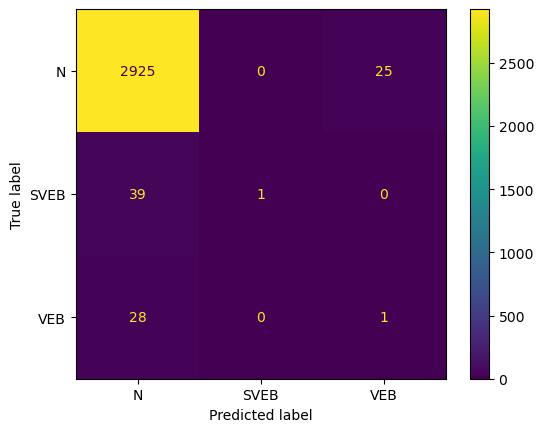

Fold 8:
  Test:  patient=7


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       0.99      1.00      0.99      1911
         1.0       0.00      0.00      0.00        29
         2.0       0.00      0.00      0.00         0

    accuracy                           0.98      1940
   macro avg       0.33      0.33      0.33      1940
weighted avg       0.97      0.98      0.98      1940

                   0.0   1.0  2.0  accuracy    macro avg  weighted avg
precision     0.985021   0.0  0.0   0.98299     0.328340      0.970296
recall        0.997907   0.0  NaN   0.98299     0.332636      0.982990
f1-score      0.991422   0.0  NaN   0.98299     0.330474      0.976602
support    1911.000000  29.0  0.0   0.98299  1940.000000   1940.000000


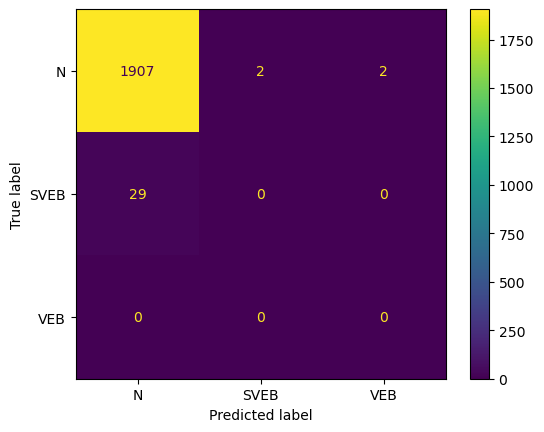

Fold 9:
  Test:  patient=8
              precision    recall  f1-score   support

         0.0       0.99      1.00      1.00      1744
         1.0       0.69      0.55      0.61        20
         2.0       1.00      0.38      0.55         8

    accuracy                           0.99      1772
   macro avg       0.89      0.64      0.72      1772
weighted avg       0.99      0.99      0.99      1772

                   0.0        1.0       2.0  accuracy    macro avg  \
precision     0.993725   0.687500  1.000000  0.990971     0.893742   
recall        0.998853   0.550000  0.375000  0.990971     0.641284   
f1-score      0.996283   0.611111  0.545455  0.990971     0.717616   
support    1744.000000  20.000000  8.000000  0.990971  1772.000000   

           weighted avg  
precision      0.990297  
recall         0.990971  
f1-score       0.989900  
support     1772.000000  


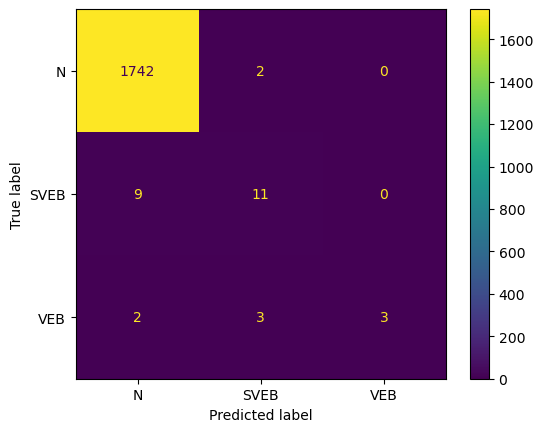

Fold 10:
  Test:  patient=9


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       0.97      1.00      0.98      2430
         1.0       0.92      0.30      0.46       112
         2.0       0.00      0.00      0.00         0

    accuracy                           0.97      2542
   macro avg       0.63      0.43      0.48      2542
weighted avg       0.97      0.97      0.96      2542

                   0.0         1.0  2.0  accuracy    macro avg  weighted avg
precision     0.968850    0.918919  0.0  0.967742     0.629256      0.966650
recall        0.998354    0.303571  NaN  0.967742     0.433975      0.967742
f1-score      0.983381    0.456376  NaN  0.967742     0.479919      0.960161
support    2430.000000  112.000000  0.0  0.967742  2542.000000   2542.000000


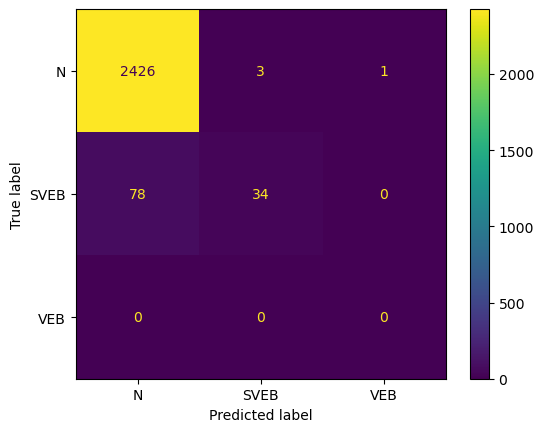

Fold 11:
  Test:  patient=10
              precision    recall  f1-score   support

         0.0       0.99      1.00      0.99      1837
         1.0       0.50      0.38      0.43         8
         2.0       1.00      0.73      0.85        56

    accuracy                           0.99      1901
   macro avg       0.83      0.70      0.76      1901
weighted avg       0.99      0.99      0.99      1901

                   0.0       1.0        2.0  accuracy    macro avg  \
precision     0.989752  0.500000   1.000000  0.988427     0.829917   
recall        0.998911  0.375000   0.732143  0.988427     0.702018   
f1-score      0.994310  0.428571   0.845361  0.988427     0.756081   
support    1837.000000  8.000000  56.000000  0.988427  1901.000000   

           weighted avg  
precision      0.987993  
recall         0.988427  
f1-score       0.987542  
support     1901.000000  


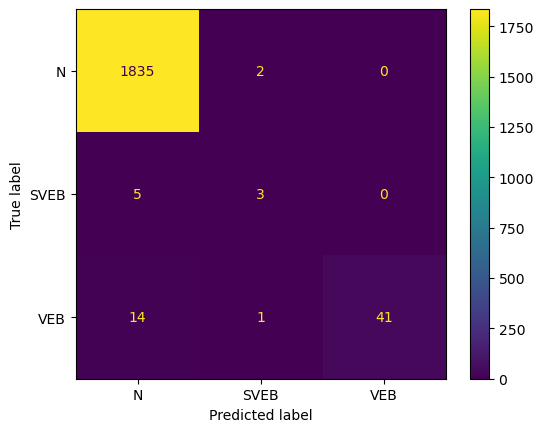

Fold 12:
  Test:  patient=11
              precision    recall  f1-score   support

         0.0       0.99      1.00      0.99      1404
         1.0       0.00      0.00      0.00         1
         2.0       0.33      0.04      0.06        28

    accuracy                           0.98      1433
   macro avg       0.44      0.34      0.35      1433
weighted avg       0.97      0.98      0.97      1433

                   0.0  1.0        2.0  accuracy    macro avg  weighted avg
precision     0.986610  0.0   0.333333  0.977669     0.439981      0.973157
recall        0.997151  0.0   0.035714  0.977669     0.344288      0.977669
f1-score      0.991853  0.0   0.064516  0.977669     0.352123      0.973041
support    1404.000000  1.0  28.000000  0.977669  1433.000000   1433.000000


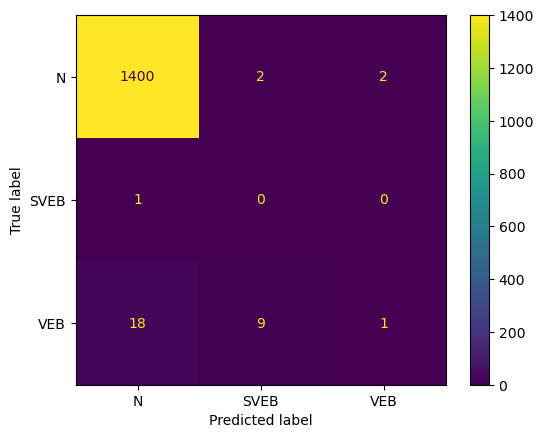

Fold 13:
  Test:  patient=12
              precision    recall  f1-score   support

         0.0       0.97      0.99      0.98      1756
         1.0       0.00      0.00      0.00        14
         2.0       0.81      0.19      0.30        70

    accuracy                           0.95      1840
   macro avg       0.59      0.39      0.43      1840
weighted avg       0.95      0.95      0.95      1840

                   0.0   1.0        2.0  accuracy    macro avg  weighted avg
precision     0.965136   0.0   0.812500  0.954891     0.592545      0.951985
recall        0.993166   0.0   0.185714  0.954891     0.392960      0.954891
f1-score      0.978950   0.0   0.302326  0.954891     0.427092      0.945761
support    1756.000000  14.0  70.000000  0.954891  1840.000000   1840.000000


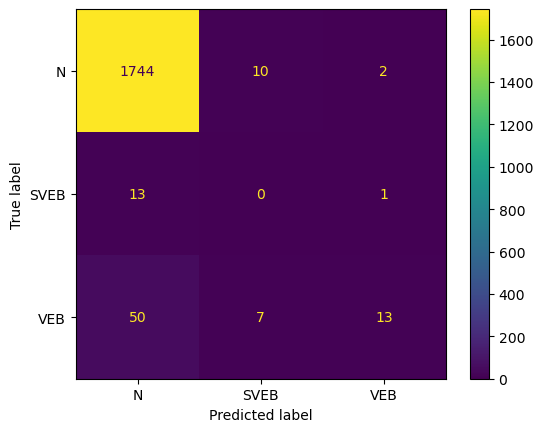

Fold 14:
  Test:  patient=13
              precision    recall  f1-score   support

         0.0       0.96      1.00      0.98      2161
         1.0       0.94      0.34      0.50       185
         2.0       0.03      0.33      0.06         3

    accuracy                           0.95      2349
   macro avg       0.64      0.56      0.51      2349
weighted avg       0.96      0.95      0.94      2349

                   0.0         1.0       2.0  accuracy    macro avg  \
precision     0.959538    0.940299  0.030303  0.945934     0.643380   
recall        0.998612    0.340541  0.333333  0.945934     0.557495   
f1-score      0.978685    0.500000  0.055556  0.945934     0.511413   
support    2161.000000  185.000000  3.000000  0.945934  2349.000000   

           weighted avg  
precision      0.956836  
recall         0.945934  
f1-score       0.939806  
support     2349.000000  


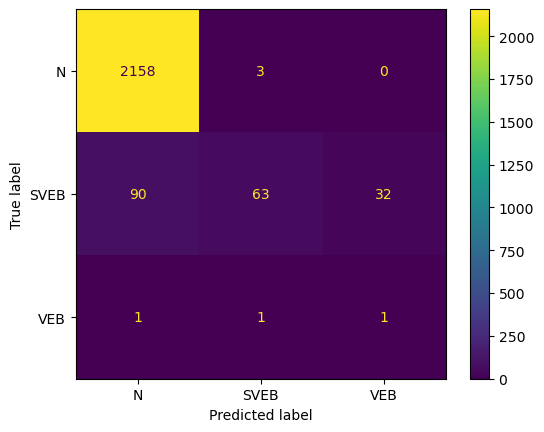

Fold 15:
  Test:  patient=14
              precision    recall  f1-score   support

         0.0       0.80      0.99      0.89      2480
         1.0       0.73      0.08      0.14       614
         2.0       0.00      0.00      0.00        36

    accuracy                           0.80      3130
   macro avg       0.51      0.36      0.34      3130
weighted avg       0.78      0.80      0.73      3130

                   0.0         1.0   2.0  accuracy    macro avg  weighted avg
precision     0.804639    0.727273   0.0  0.802236     0.510637      0.780208
recall        0.993145    0.078176   0.0  0.802236     0.357107      0.802236
f1-score      0.889009    0.141176   0.0  0.802236     0.343395      0.732085
support    2480.000000  614.000000  36.0  0.802236  3130.000000   3130.000000


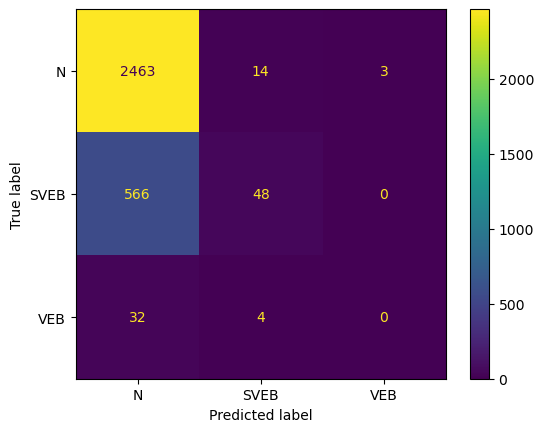

Fold 16:
  Test:  patient=15


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\

              precision    recall  f1-score   support

         0.0       0.75      1.00      0.85      1673
         1.0       0.96      0.14      0.25       658
         2.0       0.00      0.00      0.00         1

    accuracy                           0.76      2332
   macro avg       0.57      0.38      0.37      2332
weighted avg       0.81      0.76      0.68      2332

                   0.0         1.0  2.0  accuracy    macro avg  weighted avg
precision     0.747204    0.958763  NaN  0.756003     0.568655      0.806577
recall        0.998207    0.141337  0.0  0.756003     0.379848      0.756003
f1-score      0.854657    0.246358  NaN  0.756003     0.367005      0.682652
support    1673.000000  658.000000  1.0  0.756003  2332.000000   2332.000000


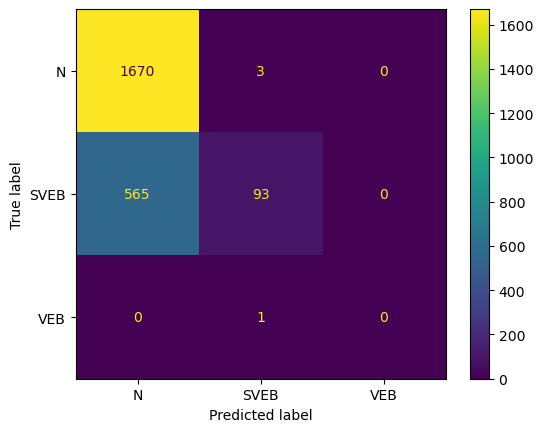

Fold 17:
  Test:  patient=16
              precision    recall  f1-score   support

         0.0       0.90      0.99      0.94      2477
         1.0       0.75      0.29      0.42       382

    accuracy                           0.89      2859
   macro avg       0.83      0.64      0.68      2859
weighted avg       0.88      0.89      0.87      2859

                   0.0         1.0  accuracy    macro avg  weighted avg
precision     0.900369    0.751678   0.89262     0.826023      0.880502
recall        0.985063    0.293194   0.89262     0.639128      0.892620
f1-score      0.940814    0.421846   0.89262     0.681330      0.871473
support    2477.000000  382.000000   0.89262  2859.000000   2859.000000


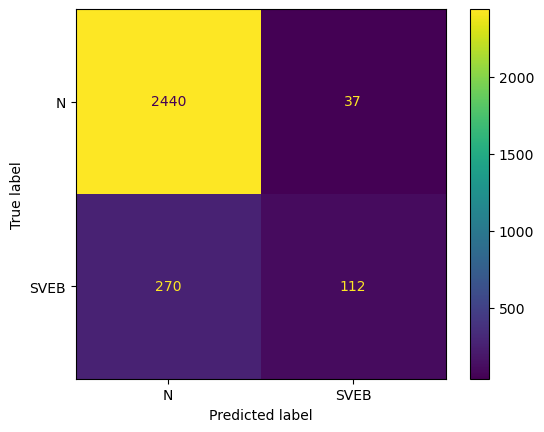

Fold 18:
  Test:  patient=17


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\

              precision    recall  f1-score   support

         0.0       0.94      0.99      0.96      2214
         1.0       0.76      0.27      0.39       196
         2.0       0.00      0.00      0.00         7

    accuracy                           0.93      2417
   macro avg       0.57      0.42      0.45      2417
weighted avg       0.92      0.93      0.92      2417

                   0.0         1.0  2.0  accuracy    macro avg  weighted avg
precision     0.936569    0.764706  NaN  0.931734     0.567092      0.919920
recall        0.993677    0.265306  0.0  0.931734     0.419661      0.931734
f1-score      0.964278    0.393939  NaN  0.931734     0.452739      0.915235
support    2214.000000  196.000000  7.0  0.931734  2417.000000   2417.000000


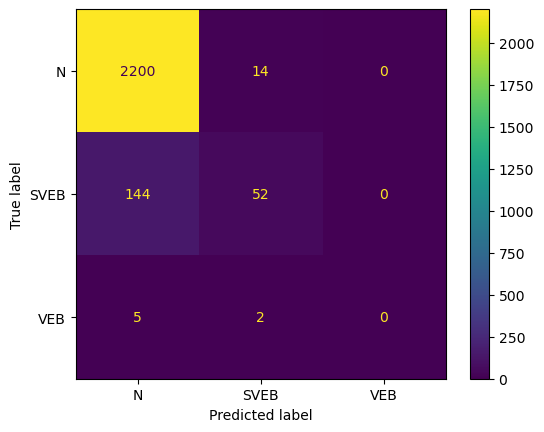

Fold 19:
  Test:  patient=18


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       1.00      0.99      0.99      2651
         1.0       0.93      0.76      0.84       145
         2.0       0.00      0.00      0.00         0

    accuracy                           0.98      2796
   macro avg       0.64      0.58      0.61      2796
weighted avg       1.00      0.98      0.99      2796

                   0.0         1.0  2.0  accuracy    macro avg  weighted avg
precision     1.000000    0.932203  0.0  0.975322     0.644068      0.996484
recall        0.987175    0.758621  NaN  0.975322     0.581932      0.975322
f1-score      0.993546    0.836502  NaN  0.975322     0.610016      0.985402
support    2651.000000  145.000000  0.0  0.975322  2796.000000   2796.000000


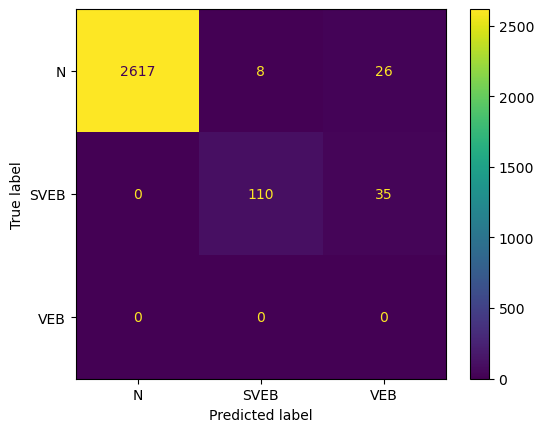

Fold 20:
  Test:  patient=19
              precision    recall  f1-score   support

         0.0       0.99      0.97      0.98      2579
         1.0       0.35      0.55      0.43        80

    accuracy                           0.96      2659
   macro avg       0.67      0.76      0.70      2659
weighted avg       0.97      0.96      0.96      2659

                   0.0        1.0  accuracy    macro avg  weighted avg
precision     0.985799   0.354839  0.956375     0.670319      0.966815
recall        0.968980   0.550000  0.956375     0.759490      0.956375
f1-score      0.977317   0.431373  0.956375     0.704345      0.960892
support    2579.000000  80.000000  0.956375  2659.000000   2659.000000


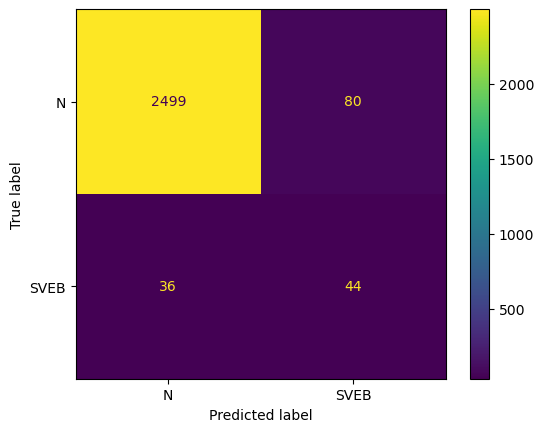

Fold 21:
  Test:  patient=20
              precision    recall  f1-score   support

         0.0       0.99      1.00      1.00      1842
         1.0       0.00      0.00      0.00        18
         2.0       0.00      0.00      0.00         0

    accuracy                           0.99      1860
   macro avg       0.33      0.33      0.33      1860
weighted avg       0.98      0.99      0.99      1860

                   0.0   1.0  2.0  accuracy    macro avg  weighted avg
precision     0.994589   0.0  0.0  0.988172     0.331530      0.984964
recall        0.997828   0.0  NaN  0.988172     0.332609      0.988172
f1-score      0.996206   0.0  NaN  0.988172     0.332069      0.986565
support    1842.000000  18.0  0.0  0.988172  1860.000000   1860.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

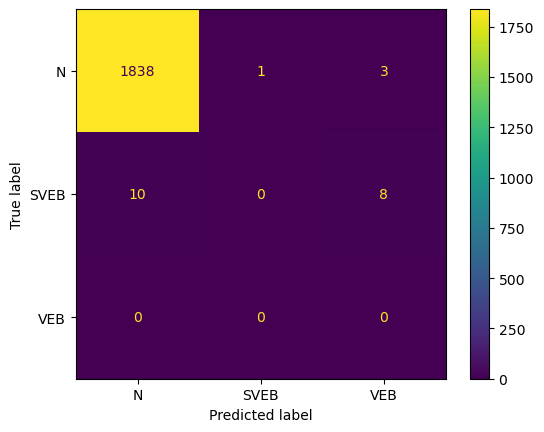

Fold 22:
  Test:  patient=21


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\

              precision    recall  f1-score   support

         0.0       0.93      1.00      0.97      1755
         1.0       0.94      0.19      0.32       150
         2.0       0.00      0.00      0.00         6

    accuracy                           0.93      1911
   macro avg       0.62      0.40      0.43      1911
weighted avg       0.93      0.93      0.91      1911

                   0.0         1.0  2.0  accuracy    macro avg  weighted avg
precision     0.933511    0.935484  NaN  0.933543     0.622998      0.930735
recall        1.000000    0.193333  0.0  0.933543     0.397778      0.933543
f1-score      0.965612    0.320442  NaN  0.933543     0.428685      0.911939
support    1755.000000  150.000000  6.0  0.933543  1911.000000   1911.000000


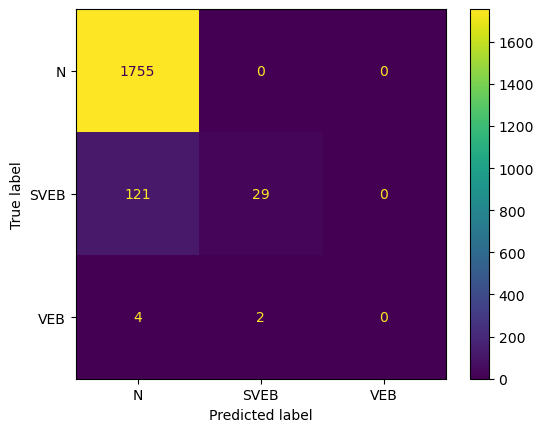

Fold 23:
  Test:  patient=22
              precision    recall  f1-score   support

         0.0       0.98      0.99      0.99      1885
         1.0       0.74      0.44      0.55        80

    accuracy                           0.97      1965
   macro avg       0.86      0.72      0.77      1965
weighted avg       0.97      0.97      0.97      1965

                   0.0        1.0  accuracy    macro avg  weighted avg
precision     0.976538   0.744681  0.970992     0.860609      0.967099
recall        0.993634   0.437500  0.970992     0.715567      0.970992
f1-score      0.985012   0.551181  0.970992     0.768096      0.967350
support    1885.000000  80.000000  0.970992  1965.000000   1965.000000


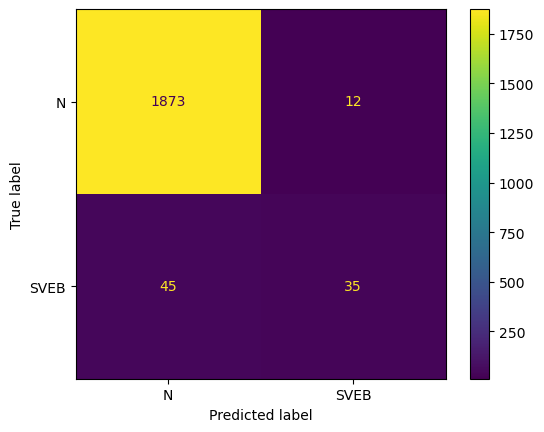

Fold 24:
  Test:  patient=23
              precision    recall  f1-score   support

         0.0       0.99      0.99      0.99      2339
         1.0       0.23      0.11      0.15        44
         2.0       0.00      0.00      0.00         1

    accuracy                           0.97      2384
   macro avg       0.41      0.37      0.38      2384
weighted avg       0.98      0.97      0.97      2384

                   0.0        1.0  2.0  accuracy    macro avg  weighted avg
precision     0.990146   0.227273  0.0  0.971477     0.405806      0.975650
recall        0.988029   0.113636  0.0  0.971477     0.367222      0.971477
f1-score      0.989086   0.151515  0.0  0.971477     0.380200      0.973213
support    2339.000000  44.000000  1.0  0.971477  2384.000000   2384.000000


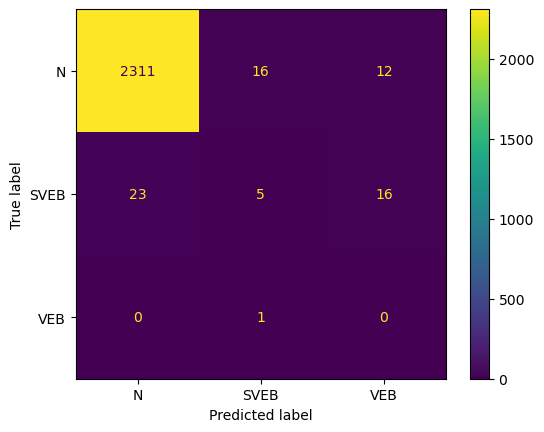

Fold 25:
  Test:  patient=24
              precision    recall  f1-score   support

         0.0       0.81      1.00      0.89      1489
         1.0       0.00      0.00      0.00       106
         2.0       0.57      0.02      0.03       254

    accuracy                           0.81      1849
   macro avg       0.46      0.34      0.31      1849
weighted avg       0.73      0.81      0.72      1849

                   0.0    1.0         2.0  accuracy    macro avg  weighted avg
precision     0.808800    0.0    0.571429  0.807463     0.460076      0.729824
recall        1.000000    0.0    0.015748  0.807463     0.338583      0.807463
f1-score      0.894294    0.0    0.030651  0.807463     0.308315      0.724386
support    1489.000000  106.0  254.000000  0.807463  1849.000000   1849.000000


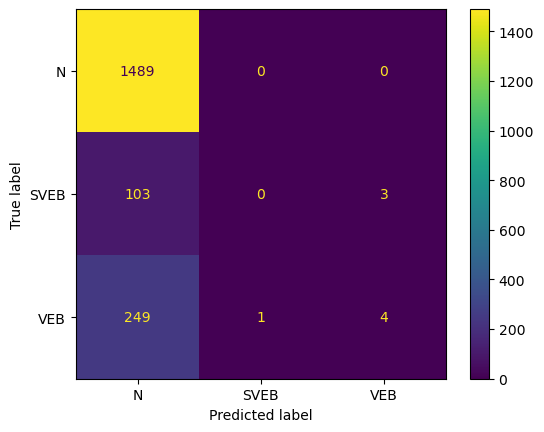

Fold 26:
  Test:  patient=25


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\

              precision    recall  f1-score   support

         0.0       0.94      1.00      0.97      2392
         1.0       0.20      0.01      0.02       104
         2.0       0.00      0.00      0.00        61

    accuracy                           0.94      2557
   macro avg       0.38      0.34      0.33      2557
weighted avg       0.88      0.94      0.91      2557

                   0.0         1.0   2.0  accuracy    macro avg  weighted avg
precision     0.936520    0.200000   NaN   0.93508     0.378840      0.884222
recall        0.999164    0.009615   0.0   0.93508     0.336260      0.935080
f1-score      0.966828    0.018349   NaN   0.93508     0.328392      0.905187
support    2392.000000  104.000000  61.0   0.93508  2557.000000   2557.000000


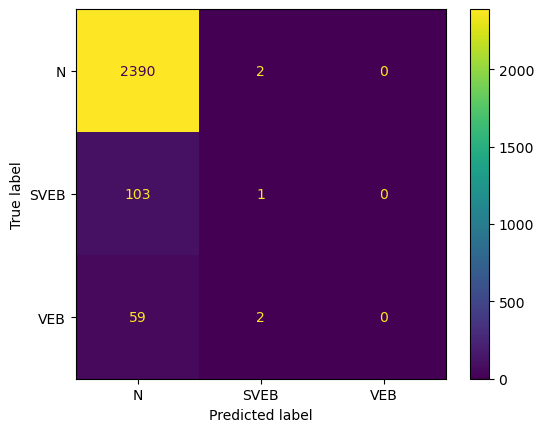

Fold 27:
  Test:  patient=26
              precision    recall  f1-score   support

         0.0       0.98      1.00      0.99      2647
         1.0       0.38      0.14      0.21        21
         2.0       0.71      0.13      0.22        38

    accuracy                           0.98      2706
   macro avg       0.69      0.42      0.47      2706
weighted avg       0.97      0.98      0.97      2706

                   0.0        1.0        2.0  accuracy    macro avg  \
precision     0.982534   0.375000   0.714286  0.980044     0.690607   
recall        0.998867   0.142857   0.131579  0.980044     0.424434   
f1-score      0.990633   0.206897   0.222222  0.980044     0.473251   
support    2647.000000  21.000000  38.000000  0.980044  2706.000000   

           weighted avg  
precision      0.974053  
recall         0.980044  
f1-score       0.973760  
support     2706.000000  


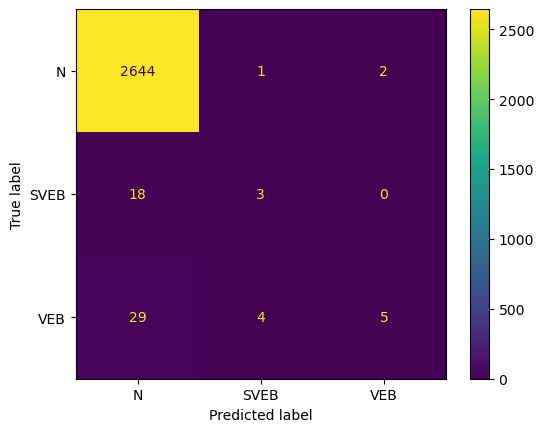

Fold 28:
  Test:  patient=27
              precision    recall  f1-score   support

         0.0       0.97      1.00      0.99      1648
         1.0       1.00      0.19      0.31        59

    accuracy                           0.97      1707
   macro avg       0.99      0.59      0.65      1707
weighted avg       0.97      0.97      0.96      1707

                   0.0        1.0  accuracy    macro avg  weighted avg
precision     0.971698   1.000000   0.97188     0.985849      0.972676
recall        1.000000   0.186441   0.97188     0.593220      0.971880
f1-score      0.985646   0.314286   0.97188     0.649966      0.962441
support    1648.000000  59.000000   0.97188  1707.000000   1707.000000


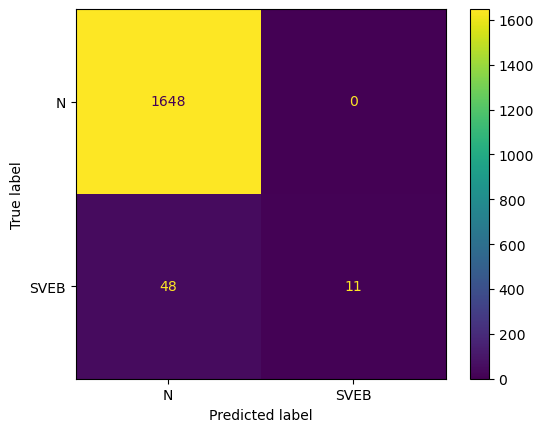

Fold 29:
  Test:  patient=28
              precision    recall  f1-score   support

         0.0       0.98      1.00      0.99      2826
         1.0       0.50      0.04      0.07        27
         2.0       1.00      0.03      0.06        30

    accuracy                           0.98      2883
   macro avg       0.83      0.36      0.37      2883
weighted avg       0.98      0.98      0.97      2883

                   0.0        1.0        2.0  accuracy    macro avg  \
precision     0.981250   0.500000   1.000000  0.980923     0.827083   
recall        1.000000   0.037037   0.033333  0.980923     0.356790   
f1-score      0.990536   0.068966   0.064516  0.980923     0.374673   
support    2826.000000  27.000000  30.000000  0.980923  2883.000000   

           weighted avg  
precision      0.976938  
recall         0.980923  
f1-score       0.972270  
support     2883.000000  


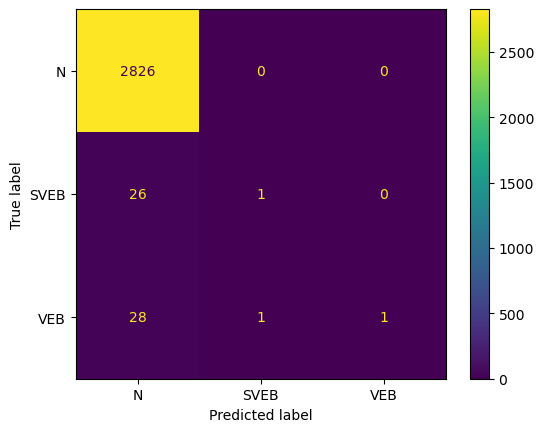

Fold 30:
  Test:  patient=29
              precision    recall  f1-score   support

         0.0       0.99      1.00      0.99      1659
         1.0       1.00      0.10      0.18        20

    accuracy                           0.99      1679
   macro avg       0.99      0.55      0.59      1679
weighted avg       0.99      0.99      0.98      1679

                   0.0        1.0  accuracy    macro avg  weighted avg
precision     0.989267   1.000000  0.989279     0.994633      0.989394
recall        1.000000   0.100000  0.989279     0.550000      0.989279
f1-score      0.994604   0.181818  0.989279     0.588211      0.984923
support    1659.000000  20.000000  0.989279  1679.000000   1679.000000


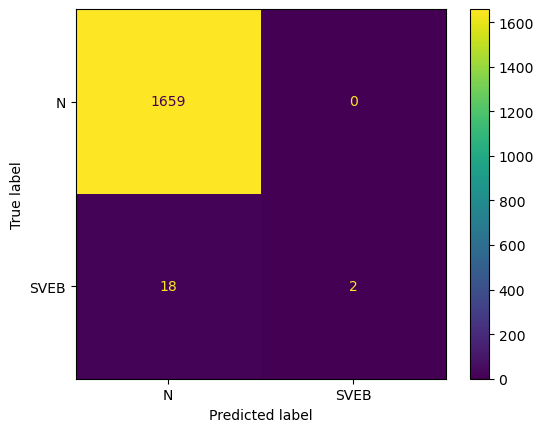

Fold 31:
  Test:  patient=30
              precision    recall  f1-score   support

         0.0       0.98      0.93      0.95      1665
         1.0       0.40      0.08      0.13        51
         2.0       0.24      0.86      0.37        44

    accuracy                           0.91      1760
   macro avg       0.54      0.62      0.49      1760
weighted avg       0.94      0.91      0.91      1760

                   0.0        1.0        2.0  accuracy    macro avg  \
precision     0.975472   0.400000   0.237500  0.905114     0.537657   
recall        0.931532   0.078431   0.863636  0.905114     0.624533   
f1-score      0.952995   0.131148   0.372549  0.905114     0.485564   
support    1665.000000  51.000000  44.000000  0.905114  1760.000000   

           weighted avg  
precision      0.940347  
recall         0.905114  
f1-score       0.914669  
support     1760.000000  


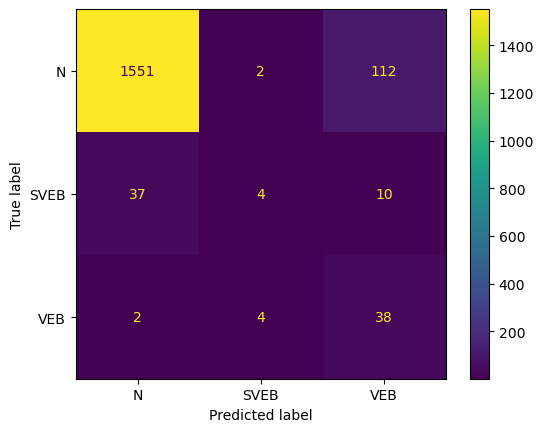

Fold 32:
  Test:  patient=31


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\

              precision    recall  f1-score   support

         0.0       0.99      1.00      1.00      4226
         1.0       0.28      0.23      0.25        30
         2.0       0.00      0.00      0.00         1

    accuracy                           0.99      4257
   macro avg       0.42      0.41      0.42      4257
weighted avg       0.99      0.99      0.99      4257

                   0.0        1.0  2.0  accuracy    macro avg  weighted avg
precision     0.994329   0.280000  NaN  0.990134     0.424776      0.989061
recall        0.995741   0.233333  0.0  0.990134     0.409691      0.990134
f1-score      0.995034   0.254545  NaN  0.990134     0.416527      0.989582
support    4226.000000  30.000000  1.0  0.990134  4257.000000   4257.000000


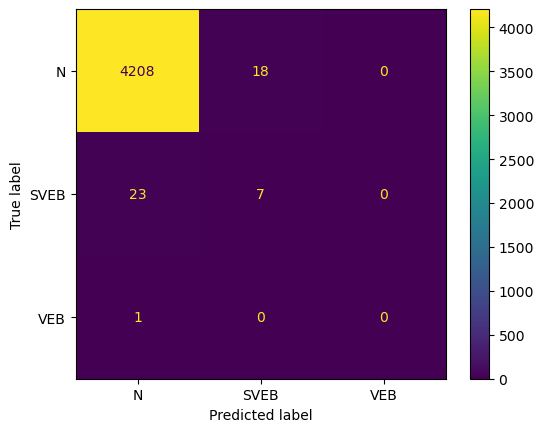

Fold 33:
  Test:  patient=32
              precision    recall  f1-score   support

         0.0       0.97      0.98      0.97      2058
         1.0       0.38      0.04      0.07        74
         2.0       0.00      0.00      0.00         6

    accuracy                           0.94      2138
   macro avg       0.45      0.34      0.35      2138
weighted avg       0.94      0.94      0.94      2138

                   0.0        1.0  2.0  accuracy    macro avg  weighted avg
precision     0.966795   0.375000  0.0  0.941066     0.447265      0.943599
recall        0.976190   0.040541  0.0  0.941066     0.338910      0.941066
f1-score      0.971470   0.073171  0.0  0.941066     0.348214      0.937652
support    2058.000000  74.000000  6.0  0.941066  2138.000000   2138.000000


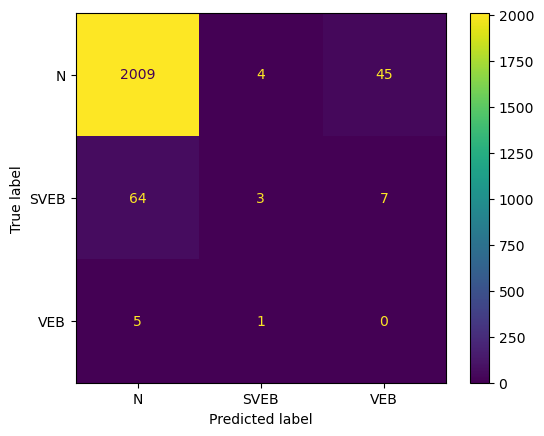

Fold 34:
  Test:  patient=33


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1829
         1.0       0.00      0.00      0.00         7

    accuracy                           1.00      1836
   macro avg       0.50      0.50      0.50      1836
weighted avg       0.99      1.00      0.99      1836

                   0.0  1.0  accuracy    macro avg  weighted avg
precision     0.996187  NaN  0.996187     0.498094      0.992389
recall        1.000000  0.0  0.996187     0.500000      0.996187
f1-score      0.998090  NaN  0.996187     0.499045      0.994285
support    1829.000000  7.0  0.996187  1836.000000   1836.000000


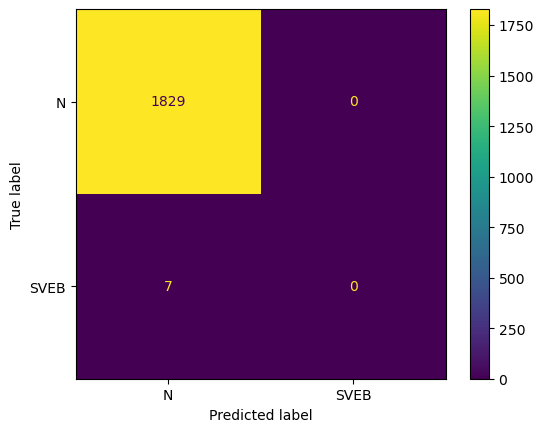

Fold 35:
  Test:  patient=34
              precision    recall  f1-score   support

         0.0       0.97      0.98      0.98      2167
         1.0       0.00      0.00      0.00        32
         2.0       0.95      0.77      0.85       427

    accuracy                           0.94      2626
   macro avg       0.64      0.58      0.61      2626
weighted avg       0.95      0.94      0.94      2626

                   0.0   1.0         2.0  accuracy    macro avg  weighted avg
precision     0.967786   0.0    0.950725  0.937167     0.639503      0.953218
recall        0.984310   0.0    0.768150  0.937167     0.584153      0.937167
f1-score      0.975978   0.0    0.849741  0.937167     0.608573      0.943558
support    2167.000000  32.0  427.000000  0.937167  2626.000000   2626.000000


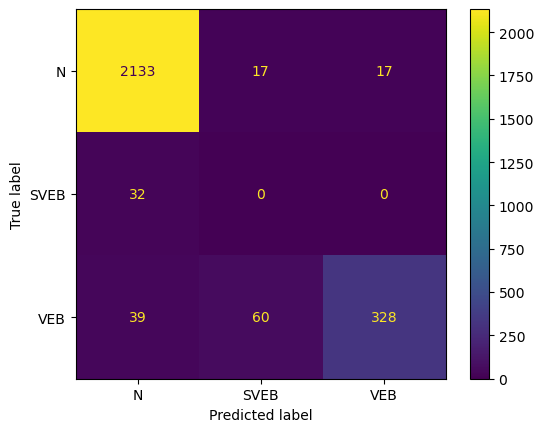

Fold 36:
  Test:  patient=35
              precision    recall  f1-score   support

         0.0       0.89      0.98      0.93      2332
         1.0       0.75      0.09      0.17       321
         2.0       0.04      0.33      0.08         9

    accuracy                           0.87      2662
   macro avg       0.56      0.47      0.39      2662
weighted avg       0.87      0.87      0.84      2662

                   0.0         1.0       2.0  accuracy    macro avg  \
precision     0.891108    0.750000  0.043478  0.867017     0.561529   
recall        0.975557    0.093458  0.333333  0.867017     0.467450   
f1-score      0.931423    0.166205  0.076923  0.867017     0.391517   
support    2332.000000  321.000000  9.000000  0.867017  2662.000000   

           weighted avg  
precision      0.871227  
recall         0.867017  
f1-score       0.836259  
support     2662.000000  


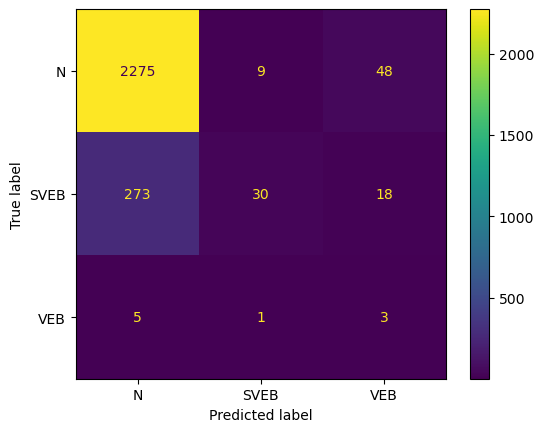

Fold 37:
  Test:  patient=36
              precision    recall  f1-score   support

         0.0       0.97      1.00      0.99      2105
         1.0       0.11      0.02      0.04        48
         2.0       0.76      0.61      0.68        64

    accuracy                           0.97      2217
   macro avg       0.62      0.54      0.57      2217
weighted avg       0.95      0.97      0.96      2217

                   0.0        1.0        2.0  accuracy    macro avg  \
precision     0.974502   0.111111   0.764706  0.966171     0.616773   
recall        0.998575   0.020833   0.609375  0.966171     0.542928   
f1-score      0.986391   0.035088   0.678261  0.966171     0.566580   
support    2105.000000  48.000000  64.000000  0.966171  2217.000000   

           weighted avg  
precision      0.949752  
recall         0.966171  
f1-score       0.956900  
support     2217.000000  


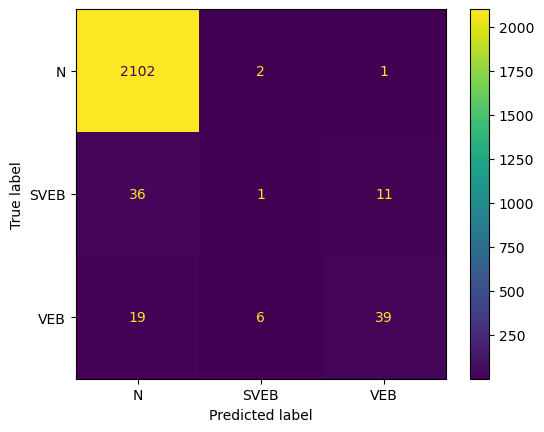

Fold 38:
  Test:  patient=37
              precision    recall  f1-score   support

         0.0       0.69      0.98      0.81      1788
         1.0       0.53      0.12      0.20       460
         2.0       0.88      0.16      0.27       478

    accuracy                           0.69      2726
   macro avg       0.70      0.42      0.43      2726
weighted avg       0.70      0.69      0.61      2726

                   0.0         1.0         2.0  accuracy    macro avg  \
precision     0.694159    0.528302    0.883721   0.69369     0.702061   
recall        0.983781    0.121739    0.158996   0.69369     0.421505   
f1-score      0.813975    0.197880    0.269504   0.69369     0.427119   
support    1788.000000  460.000000  478.000000   0.69369  2726.000000   

           weighted avg  
precision      0.699411  
recall         0.693690  
f1-score       0.614540  
support     2726.000000  


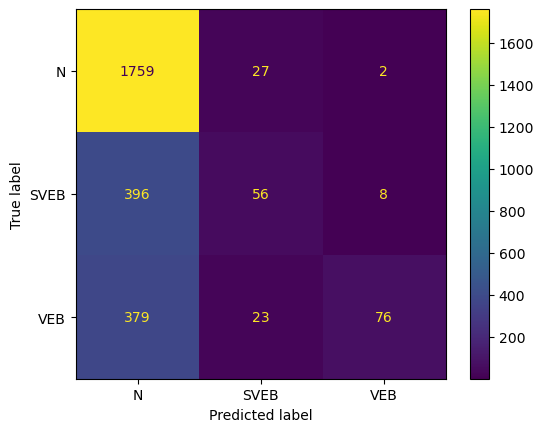

Fold 39:
  Test:  patient=38
              precision    recall  f1-score   support

         0.0       0.86      0.99      0.92      2034
         1.0       0.04      0.01      0.01       227
         2.0       0.94      0.48      0.63       276

    accuracy                           0.85      2537
   macro avg       0.61      0.49      0.52      2537
weighted avg       0.80      0.85      0.81      2537

                   0.0         1.0         2.0  accuracy    macro avg  \
precision     0.860247    0.040000    0.942857   0.84864     0.614368   
recall        0.992625    0.008811    0.478261   0.84864     0.493232   
f1-score      0.921707    0.014440    0.634615   0.84864     0.523588   
support    2034.000000  227.000000  276.000000   0.84864  2537.000000   

           weighted avg  
precision      0.795842  
recall         0.848640  
f1-score       0.809296  
support     2537.000000  


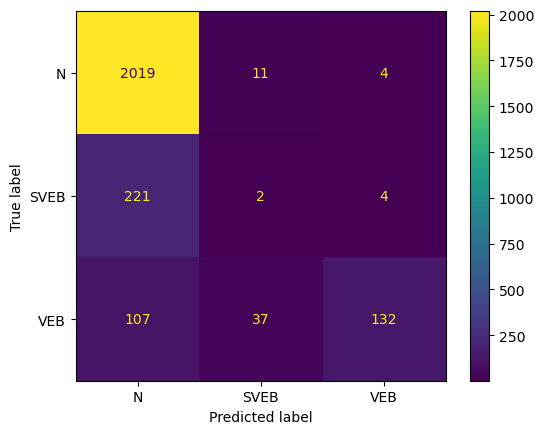

Fold 40:
  Test:  patient=39
              precision    recall  f1-score   support

         0.0       0.99      0.98      0.99      2810
         1.0       0.05      0.08      0.06        12
         2.0       0.34      0.75      0.47        28

    accuracy                           0.97      2850
   macro avg       0.46      0.60      0.51      2850
weighted avg       0.98      0.97      0.98      2850

                   0.0        1.0        2.0  accuracy    macro avg  \
precision     0.994581   0.050000   0.338710  0.973684     0.461097   
recall        0.979715   0.083333   0.750000  0.973684     0.604350   
f1-score      0.987092   0.062500   0.466667  0.973684     0.505420   
support    2810.000000  12.000000  28.000000  0.973684  2850.000000   

           weighted avg  
precision      0.984160  
recall         0.973684  
f1-score       0.978086  
support     2850.000000  


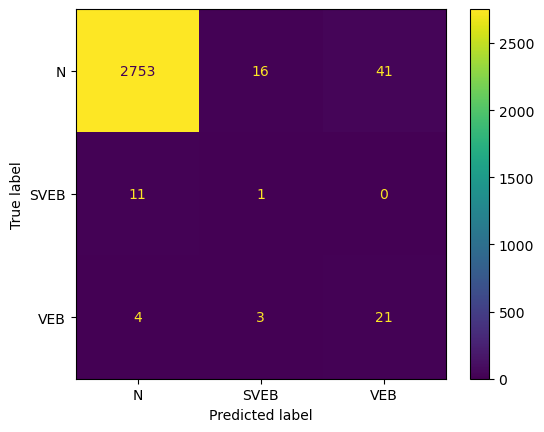

Fold 41:
  Test:  patient=40
              precision    recall  f1-score   support

         0.0       0.98      1.00      0.99      2400
         1.0       0.19      0.50      0.28        38
         2.0       0.94      0.32      0.48       144

    accuracy                           0.95      2582
   macro avg       0.70      0.61      0.58      2582
weighted avg       0.97      0.95      0.95      2582

                   0.0        1.0         2.0  accuracy    macro avg  \
precision     0.982326   0.190000    0.938776  0.950813     0.703701   
recall        0.995833   0.500000    0.319444  0.950813     0.605093   
f1-score      0.989034   0.275362    0.476684  0.950813     0.580360   
support    2400.000000  38.000000  144.000000  0.950813  2582.000000   

           weighted avg  
precision      0.968237  
recall         0.950813  
f1-score       0.949956  
support     2582.000000  


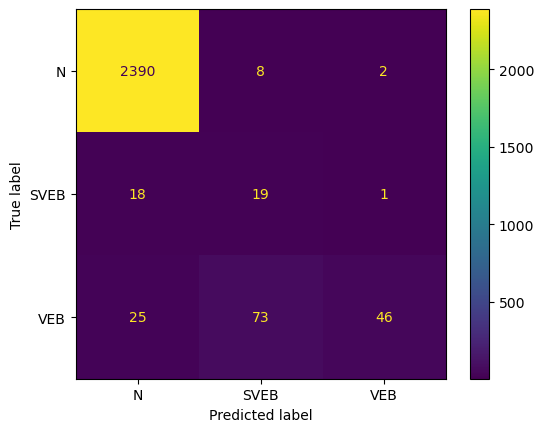

Fold 42:
  Test:  patient=41
              precision    recall  f1-score   support

         0.0       1.00      0.99      1.00      2167
         1.0       0.17      0.12      0.14         8
         2.0       0.22      0.67      0.33         3

    accuracy                           0.99      2178
   macro avg       0.46      0.60      0.49      2178
weighted avg       0.99      0.99      0.99      2178

                   0.0       1.0       2.0  accuracy    macro avg  \
precision     0.996301  0.166667  0.222222  0.990817     0.461730   
recall        0.994462  0.125000  0.666667  0.990817     0.595376   
f1-score      0.995381  0.142857  0.333333  0.990817     0.490524   
support    2167.000000  8.000000  3.000000  0.990817  2178.000000   

           weighted avg  
precision      0.992188  
recall         0.990817  
f1-score       0.991338  
support     2178.000000  


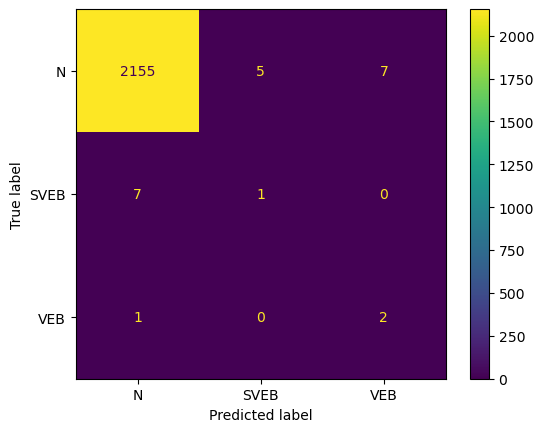

Fold 43:
  Test:  patient=42
              precision    recall  f1-score   support

         0.0       0.88      0.62      0.73      3007
         1.0       0.06      0.74      0.11        69
         2.0       0.36      0.42      0.39       464

    accuracy                           0.59      3540
   macro avg       0.43      0.59      0.41      3540
weighted avg       0.80      0.59      0.67      3540

                   0.0        1.0         2.0  accuracy    macro avg  \
precision     0.883532   0.056604    0.360294  0.592655     0.433477   
recall        0.615564   0.739130    0.422414  0.592655     0.592369   
f1-score      0.725598   0.105155    0.388889  0.592655     0.406547   
support    3007.000000  69.000000  464.000000  0.592655  3540.000000   

           weighted avg  
precision      0.798832  
recall         0.592655  
f1-score       0.669371  
support     3540.000000  


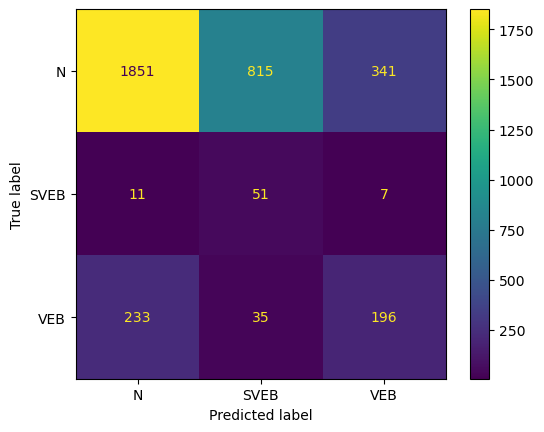

Fold 44:
  Test:  patient=43
              precision    recall  f1-score   support

         0.0       0.90      0.88      0.89      1672
         1.0       0.02      0.12      0.03        17
         2.0       0.83      0.79      0.81       727

    accuracy                           0.85      2416
   macro avg       0.59      0.59      0.58      2416
weighted avg       0.88      0.85      0.86      2416

                   0.0        1.0         2.0  accuracy    macro avg  \
precision     0.902829   0.019417    0.834061  0.845613     0.585436   
recall        0.877990   0.117647    0.788171  0.845613     0.594603   
f1-score      0.890237   0.033333    0.810467  0.845613     0.578012   
support    1672.000000  17.000000  727.000000  0.845613  2416.000000   

           weighted avg  
precision      0.875920  
recall         0.845613  
f1-score       0.860203  
support     2416.000000  


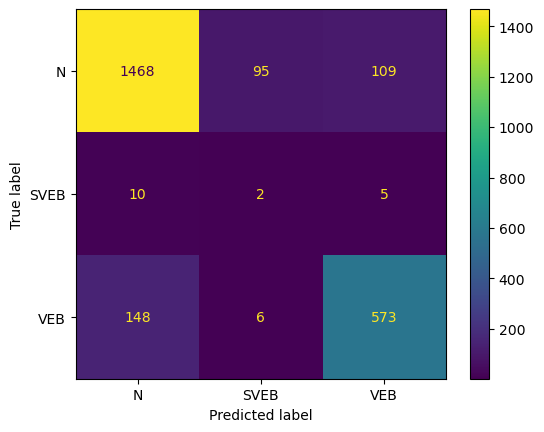

Fold 45:
  Test:  patient=44
              precision    recall  f1-score   support

         0.0       0.79      0.98      0.87      1873
         1.0       0.51      0.05      0.10       569
         2.0       0.25      0.89      0.39        27

    accuracy                           0.76      2469
   macro avg       0.52      0.64      0.45      2469
weighted avg       0.72      0.76      0.69      2469

                   0.0         1.0        2.0  accuracy    macro avg  \
precision     0.790748    0.508475   0.247423  0.762657     0.515548   
recall        0.976508    0.052724   0.888889  0.762657     0.639374   
f1-score      0.873865    0.095541   0.387097  0.762657     0.452168   
support    1873.000000  569.000000  27.000000  0.762657  2469.000000   

           weighted avg  
precision      0.719754  
recall         0.762657  
f1-score       0.689171  
support     2469.000000  


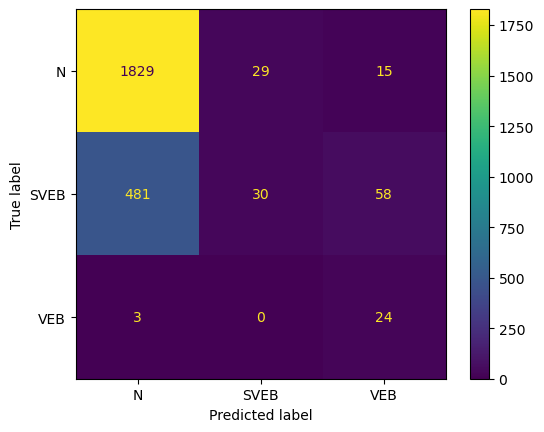

Fold 46:
  Test:  patient=45
              precision    recall  f1-score   support

         0.0       0.98      0.90      0.94      2133
         1.0       0.01      0.04      0.01        26
         2.0       0.36      0.35      0.36        23

    accuracy                           0.89      2182
   macro avg       0.45      0.43      0.43      2182
weighted avg       0.96      0.89      0.92      2182

                   0.0        1.0        2.0  accuracy    macro avg  \
precision     0.981633   0.005000   0.363636  0.885885     0.450090   
recall        0.902016   0.038462   0.347826  0.885885     0.429435   
f1-score      0.940142   0.008850   0.355556  0.885885     0.434849   
support    2133.000000  26.000000  23.000000  0.885885  2182.000000   

           weighted avg  
precision      0.963481  
recall         0.885885  
f1-score       0.922883  
support     2182.000000  


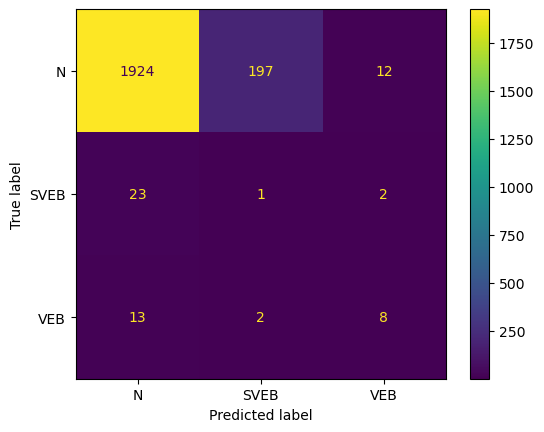

Fold 47:
  Test:  patient=46
              precision    recall  f1-score   support

         0.0       0.87      1.00      0.93      2560
         1.0       0.09      0.03      0.05       321
         2.0       0.97      0.24      0.39       240

    accuracy                           0.84      3121
   macro avg       0.64      0.42      0.45      3121
weighted avg       0.80      0.84      0.80      3121

                   0.0         1.0         2.0  accuracy    macro avg  \
precision     0.867482    0.093220    0.966667  0.840115     0.642456   
recall        0.997266    0.034268    0.241667  0.840115     0.424400   
f1-score      0.927858    0.050114    0.386667  0.840115     0.454879   
support    2560.000000  321.000000  240.000000  0.840115  3121.000000   

           weighted avg  
precision      0.795475  
recall         0.840115  
f1-score       0.795963  
support     3121.000000  


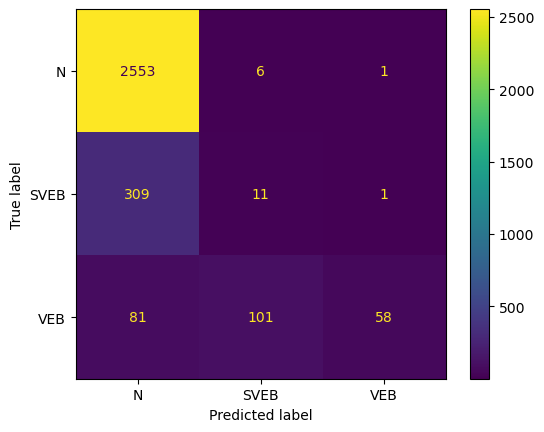

Fold 48:
  Test:  patient=47
              precision    recall  f1-score   support

         0.0       0.97      0.74      0.84      1742
         1.0       0.03      0.84      0.06        19
         2.0       0.87      0.34      0.49       132

    accuracy                           0.71      1893
   macro avg       0.62      0.64      0.46      1893
weighted avg       0.95      0.71      0.81      1893

                   0.0        1.0         2.0  accuracy    macro avg  \
precision     0.970633   0.031189    0.865385  0.713154     0.622402   
recall        0.739954   0.842105    0.340909  0.713154     0.640989   
f1-score      0.839739   0.060150    0.489130  0.713154     0.463007   
support    1742.000000  19.000000  132.000000  0.713154  1893.000000   

           weighted avg  
precision      0.953864  
recall         0.713154  
f1-score       0.807467  
support     1893.000000  


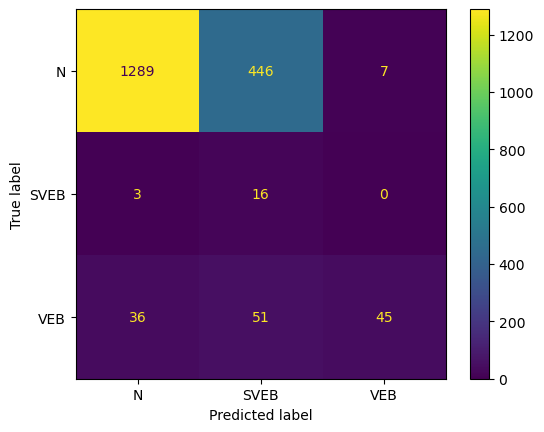

Fold 49:
  Test:  patient=48
              precision    recall  f1-score   support

         0.0       0.43      0.99      0.60      1101
         1.0       0.94      0.11      0.20      1818
         2.0       0.45      0.74      0.56       234

    accuracy                           0.46      3153
   macro avg       0.61      0.61      0.45      3153
weighted avg       0.73      0.46      0.36      3153

                   0.0          1.0         2.0  accuracy    macro avg  \
precision     0.427340     0.943396    0.448454  0.464637     0.606397   
recall        0.990917     0.110011    0.743590  0.464637     0.614839   
f1-score      0.597154     0.197044    0.559486  0.464637     0.451228   
support    1101.000000  1818.000000  234.000000  0.464637  3153.000000   

           weighted avg  
precision      0.726462  
recall         0.464637  
f1-score       0.363658  
support     3153.000000  


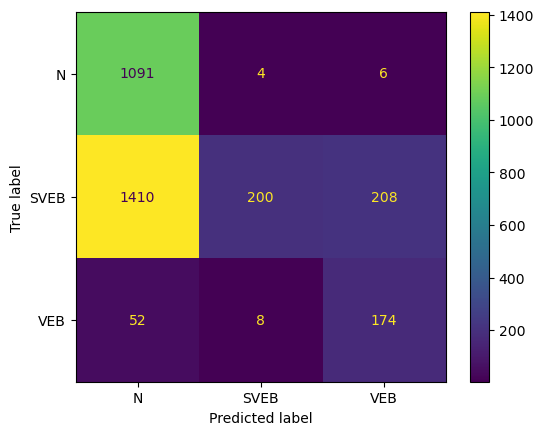

Fold 50:
  Test:  patient=49
              precision    recall  f1-score   support

         0.0       0.82      0.94      0.87      2050
         1.0       0.11      0.18      0.13       167
         2.0       0.30      0.02      0.03       447

    accuracy                           0.74      2664
   macro avg       0.41      0.38      0.35      2664
weighted avg       0.69      0.74      0.69      2664

                   0.0         1.0         2.0  accuracy    macro avg  \
precision     0.817912    0.106762    0.296296  0.737613     0.406990   
recall        0.940000    0.179641    0.017897  0.737613     0.379179   
f1-score      0.874716    0.133929    0.033755  0.737613     0.347467   
support    2050.000000  167.000000  447.000000  0.737613  2664.000000   

           weighted avg  
precision      0.685808  
recall         0.737613  
f1-score       0.687171  
support     2664.000000  


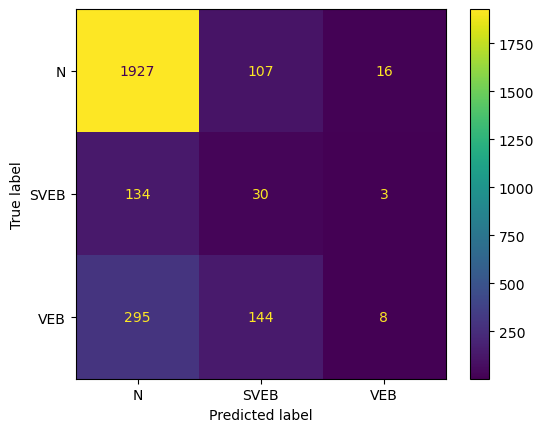

Fold 51:
  Test:  patient=50
              precision    recall  f1-score   support

         0.0       0.94      0.63      0.75      2787
         1.0       0.05      0.14      0.07       136
         2.0       0.05      0.48      0.09        75

    accuracy                           0.60      2998
   macro avg       0.35      0.42      0.30      2998
weighted avg       0.88      0.60      0.71      2998

                   0.0         1.0        2.0  accuracy    macro avg  \
precision     0.943335    0.045564   0.049451  0.601401     0.346116   
recall        0.627198    0.139706   0.480000  0.601401     0.415635   
f1-score      0.753448    0.068716   0.089664  0.601401     0.303943   
support    2787.000000  136.000000  75.000000  0.601401  2998.000000   

           weighted avg  
precision      0.880247  
recall         0.601401  
f1-score       0.705781  
support     2998.000000  


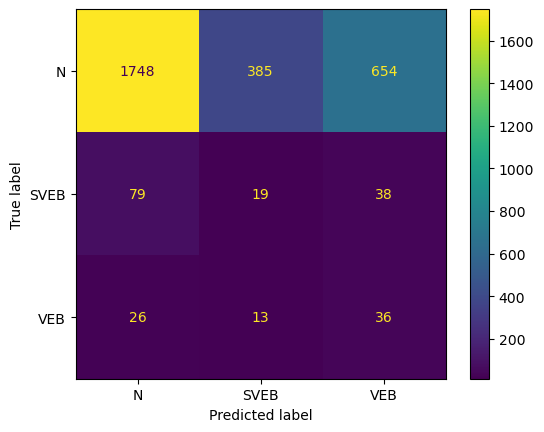

Fold 52:
  Test:  patient=51
              precision    recall  f1-score   support

         0.0       0.72      0.25      0.37      2552
         1.0       0.07      0.76      0.13       227
         2.0       0.71      0.11      0.19       555

    accuracy                           0.26      3334
   macro avg       0.50      0.37      0.23      3334
weighted avg       0.67      0.26      0.32      3334

                   0.0         1.0         2.0  accuracy    macro avg  \
precision     0.718679    0.072996    0.709302  0.259448     0.500326   
recall        0.247257    0.762115    0.109910  0.259448     0.373094   
f1-score      0.367930    0.133231    0.190328  0.259448     0.230496   
support    2552.000000  227.000000  555.000000  0.259448  3334.000000   

           weighted avg  
precision      0.673156  
recall         0.259448  
f1-score       0.322385  
support     3334.000000  


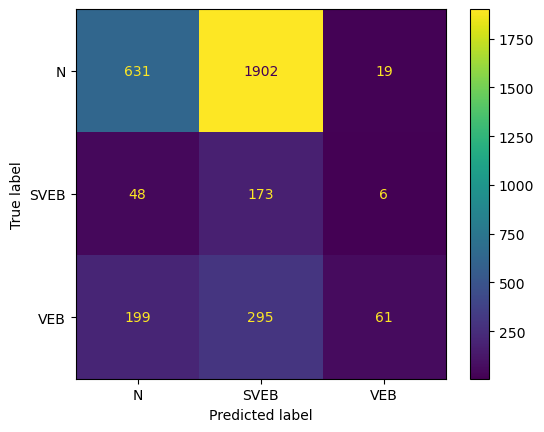

Fold 53:
  Test:  patient=52
              precision    recall  f1-score   support

         0.0       0.77      0.99      0.87      1506
         1.0       0.98      0.07      0.14       631
         2.0       0.12      0.86      0.20        22

    accuracy                           0.72      2159
   macro avg       0.62      0.64      0.40      2159
weighted avg       0.82      0.72      0.65      2159

                   0.0         1.0        2.0  accuracy    macro avg  \
precision     0.769270    0.979167   0.115152  0.723946     0.621196   
recall        0.994024    0.074485   0.863636  0.723946     0.644048   
f1-score      0.867323    0.138439   0.203209  0.723946     0.402990   
support    1506.000000  631.000000  22.000000  0.723946  2159.000000   

           weighted avg  
precision      0.823950  
recall         0.723946  
f1-score       0.647529  
support     2159.000000  


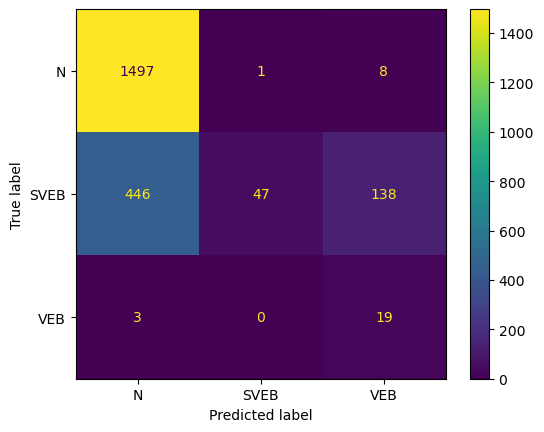

Fold 54:
  Test:  patient=53
              precision    recall  f1-score   support

         0.0       0.76      0.89      0.82      1785
         1.0       0.37      0.11      0.17       454
         2.0       0.51      0.52      0.51       437

    accuracy                           0.70      2676
   macro avg       0.54      0.51      0.50      2676
weighted avg       0.65      0.70      0.66      2676

                   0.0         1.0         2.0  accuracy    macro avg  \
precision     0.757054    0.369565    0.507830  0.695441     0.544816   
recall        0.886835    0.112335    0.519451  0.695441     0.506207   
f1-score      0.816821    0.172297    0.513575  0.695441     0.500898   
support    1785.000000  454.000000  437.000000  0.695441  2676.000000   

           weighted avg  
precision      0.650615  
recall         0.695441  
f1-score       0.657953  
support     2676.000000  


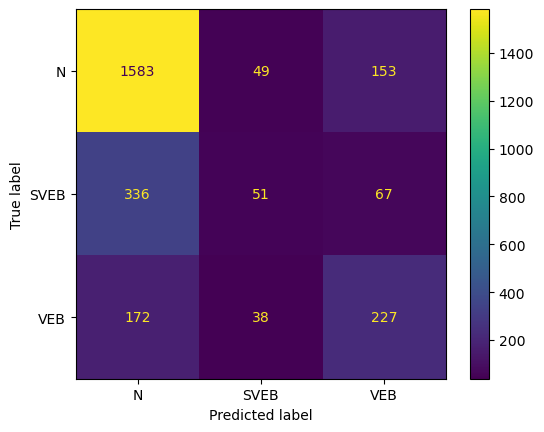

Fold 55:
  Test:  patient=54
              precision    recall  f1-score   support

         0.0       0.99      1.00      1.00      1774
         1.0       0.46      0.50      0.48        12
         2.0       1.00      0.62      0.77         8

    accuracy                           0.99      1794
   macro avg       0.82      0.71      0.75      1794
weighted avg       0.99      0.99      0.99      1794

                   0.0        1.0       2.0  accuracy    macro avg  \
precision     0.994932   0.461538  1.000000  0.991081     0.818824   
recall        0.996054   0.500000  0.625000  0.991081     0.707018   
f1-score      0.995493   0.480000  0.769231  0.991081     0.748241   
support    1774.000000  12.000000  8.000000  0.991081  1794.000000   

           weighted avg  
precision      0.991387  
recall         0.991081  
f1-score       0.991036  
support     1794.000000  


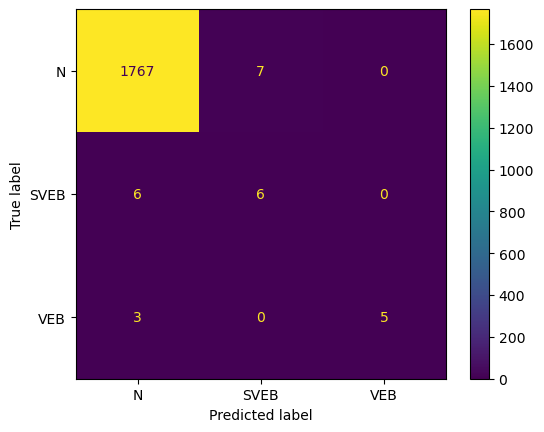

Fold 56:
  Test:  patient=55
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1896
         1.0       0.00      0.00      0.00         9
         2.0       0.88      0.92      0.90        74

    accuracy                           0.99      1979
   macro avg       0.63      0.64      0.63      1979
weighted avg       0.99      0.99      0.99      1979

                   0.0  1.0        2.0  accuracy    macro avg  weighted avg
precision     0.997359  0.0   0.883117  0.988378     0.626825      0.988551
recall        0.995781  0.0   0.918919  0.988378     0.638233      0.988378
f1-score      0.996569  0.0   0.900662  0.988378     0.632410      0.988451
support    1896.000000  9.0  74.000000  0.988378  1979.000000   1979.000000


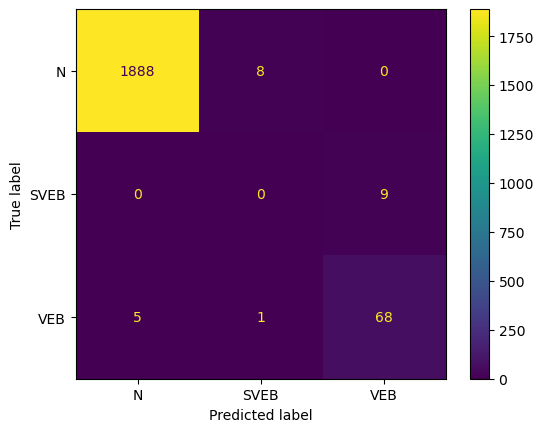

Fold 57:
  Test:  patient=56
              precision    recall  f1-score   support

         0.0       0.96      0.38      0.55      1624
         1.0       0.01      0.67      0.02        15
         2.0       1.00      0.04      0.07        26

    accuracy                           0.38      1665
   macro avg       0.66      0.36      0.21      1665
weighted avg       0.95      0.38      0.54      1665

                   0.0        1.0        2.0  accuracy    macro avg  \
precision     0.961420   0.009843   1.000000  0.380781     0.657087   
recall        0.383621   0.666667   0.038462  0.380781     0.362916   
f1-score      0.548415   0.019399   0.074074  0.380781     0.213963   
support    1624.000000  15.000000  26.000000  0.380781  1665.000000   

           weighted avg  
precision      0.953449  
recall         0.380781  
f1-score       0.536242  
support     1665.000000  


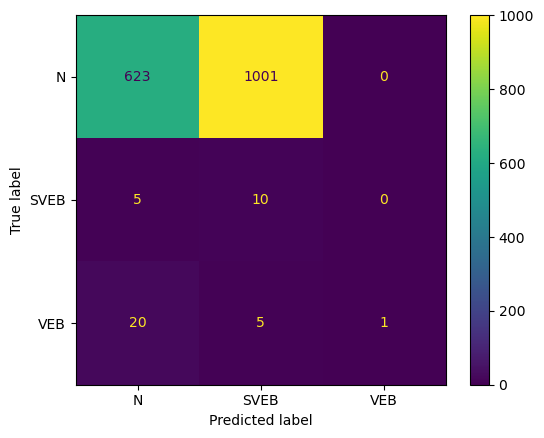

Fold 58:
  Test:  patient=57
              precision    recall  f1-score   support

         0.0       0.99      0.66      0.79      2188
         1.0       0.00      0.00      0.00         9
         2.0       0.04      0.71      0.07        41

    accuracy                           0.66      2238
   macro avg       0.34      0.46      0.29      2238
weighted avg       0.97      0.66      0.78      2238

                   0.0  1.0        2.0  accuracy    macro avg  weighted avg
precision     0.990444  0.0   0.037613  0.661305     0.342686      0.969005
recall        0.663163  0.0   0.707317  0.661305     0.456827      0.661305
f1-score      0.794416  0.0   0.071429  0.661305     0.288615      0.777976
support    2188.000000  9.0  41.000000  0.661305  2238.000000   2238.000000


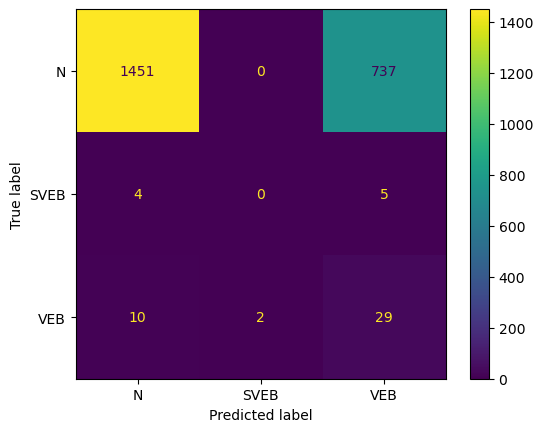

Fold 59:
  Test:  patient=58
              precision    recall  f1-score   support

         0.0       0.97      0.90      0.93      1944
         1.0       0.02      0.25      0.04         8
         2.0       0.30      0.54      0.39        97

    accuracy                           0.88      2049
   macro avg       0.43      0.56      0.45      2049
weighted avg       0.94      0.88      0.90      2049

                   0.0       1.0        2.0  accuracy    macro avg  \
precision     0.973699  0.022222   0.302326  0.875549     0.432749   
recall        0.895062  0.250000   0.536082  0.875549     0.560381   
f1-score      0.932726  0.040816   0.386617  0.875549     0.453386   
support    1944.000000  8.000000  97.000000  0.875549  2049.000000   

           weighted avg  
precision      0.938201  
recall         0.875549  
f1-score       0.903391  
support     2049.000000  


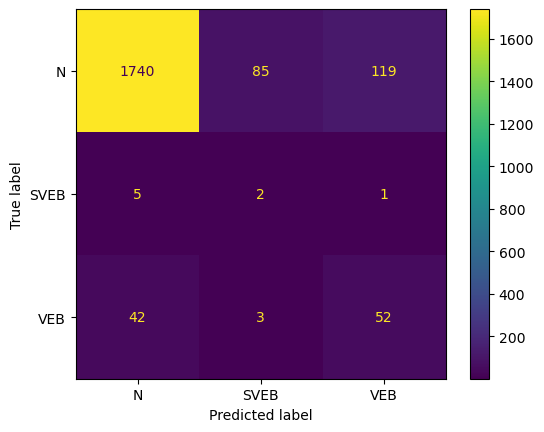

Fold 60:
  Test:  patient=59


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       0.95      0.99      0.97      2004
         1.0       0.65      0.27      0.38       135
         2.0       0.00      0.00      0.00         0

    accuracy                           0.94      2139
   macro avg       0.54      0.42      0.45      2139
weighted avg       0.94      0.94      0.93      2139

                   0.0         1.0  2.0  accuracy    macro avg  weighted avg
precision     0.954261    0.654545  0.0  0.943432     0.536269      0.935345
recall        0.989022    0.266667  NaN  0.943432     0.418563      0.943432
f1-score      0.971331    0.378947  NaN  0.943432     0.450093      0.933943
support    2004.000000  135.000000  0.0  0.943432  2139.000000   2139.000000


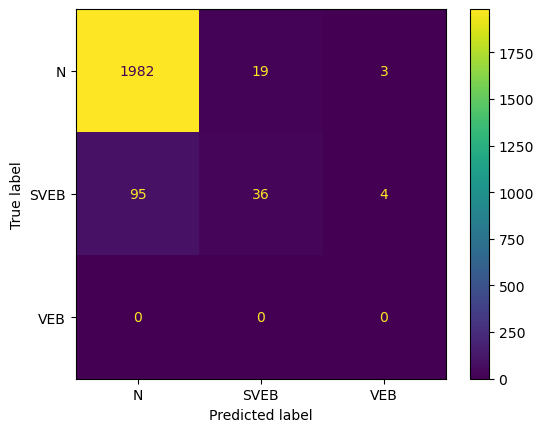

Fold 61:
  Test:  patient=60
              precision    recall  f1-score   support

         0.0       0.92      0.98      0.95      1839
         1.0       0.61      0.11      0.19       196
         2.0       0.00      0.00      0.00         1

    accuracy                           0.90      2036
   macro avg       0.51      0.37      0.38      2036
weighted avg       0.89      0.90      0.88      2036

                   0.0         1.0  2.0  accuracy    macro avg  weighted avg
precision     0.916034    0.611111  0.0  0.900295     0.509049      0.886230
recall        0.984774    0.112245  0.0  0.900295     0.365673      0.900295
f1-score      0.949161    0.189655  0.0  0.900295     0.379606      0.875580
support    1839.000000  196.000000  1.0  0.900295  2036.000000   2036.000000


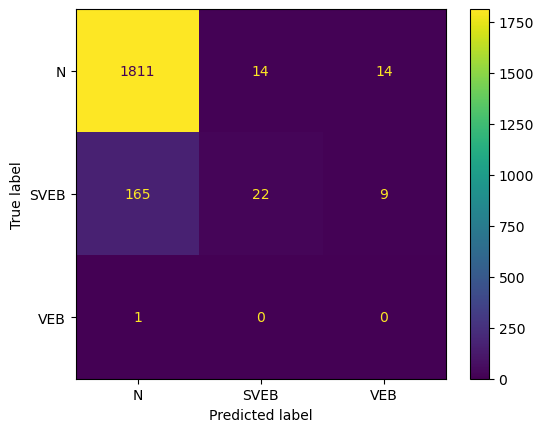

Fold 62:
  Test:  patient=61
              precision    recall  f1-score   support

         0.0       0.98      1.00      0.99      1589
         1.0       0.84      0.58      0.69        64
         2.0       1.00      0.93      0.96       256

    accuracy                           0.98      1909
   macro avg       0.94      0.84      0.88      1909
weighted avg       0.97      0.98      0.97      1909

                   0.0        1.0         2.0  accuracy    macro avg  \
precision     0.975415   0.840909    1.000000   0.97538     0.938775   
recall        0.998741   0.578125    0.929688   0.97538     0.835518   
f1-score      0.986940   0.685185    0.963563   0.97538     0.878563   
support    1589.000000  64.000000  256.000000   0.97538  1909.000000   

           weighted avg  
precision      0.974202  
recall         0.975380  
f1-score       0.973689  
support     1909.000000  


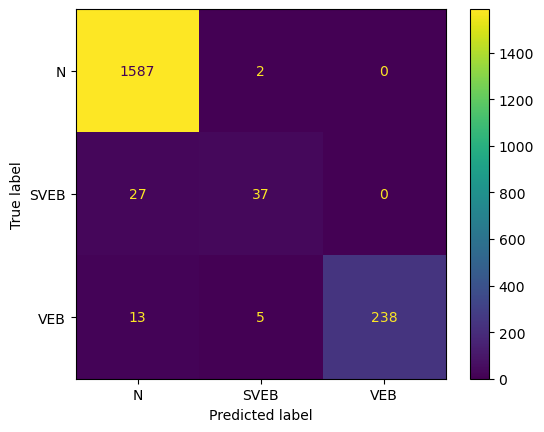

Fold 63:
  Test:  patient=62
              precision    recall  f1-score   support

         0.0       0.97      1.00      0.99      1470
         1.0       0.47      0.73      0.57        48
         2.0       1.00      0.88      0.94       542

    accuracy                           0.96      2060
   macro avg       0.82      0.87      0.83      2060
weighted avg       0.97      0.96      0.96      2060

                   0.0        1.0         2.0  accuracy    macro avg  \
precision     0.972185   0.472973    1.000000   0.96068     0.815053   
recall        0.998639   0.729167    0.878229   0.96068     0.868678   
f1-score      0.985235   0.573770    0.935167   0.96068     0.831391   
support    1470.000000  48.000000  542.000000   0.96068  2060.000000   

           weighted avg  
precision      0.967871  
recall         0.960680  
f1-score       0.962474  
support     2060.000000  


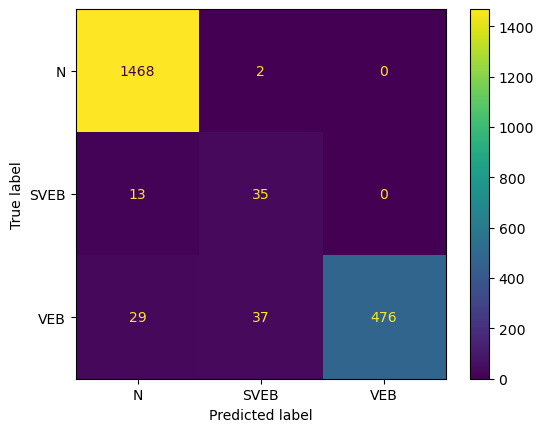

Fold 64:
  Test:  patient=63
              precision    recall  f1-score   support

         0.0       0.90      0.73      0.81      3103
         1.0       0.60      0.15      0.24       241
         2.0       0.07      0.42      0.11       141

    accuracy                           0.68      3485
   macro avg       0.52      0.43      0.39      3485
weighted avg       0.85      0.68      0.74      3485

                   0.0         1.0         2.0  accuracy    macro avg  \
precision     0.899724    0.600000    0.066143  0.681205     0.521956   
recall        0.734451    0.149378    0.418440  0.681205     0.434089   
f1-score      0.808730    0.239203    0.114230  0.681205     0.387388   
support    3103.000000  241.000000  141.000000  0.681205  3485.000000   

           weighted avg  
precision      0.845271  
recall         0.681205  
f1-score       0.741246  
support     3485.000000  


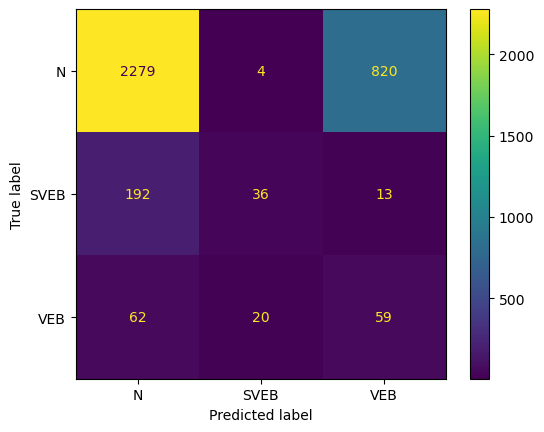

Fold 65:
  Test:  patient=64
              precision    recall  f1-score   support

         0.0       0.70      0.96      0.81      1323
         1.0       0.15      0.01      0.02       628
         2.0       0.33      0.44      0.38       307

    accuracy                           0.62      2258
   macro avg       0.39      0.47      0.40      2258
weighted avg       0.50      0.62      0.53      2258

                   0.0         1.0         2.0  accuracy    macro avg  \
precision     0.700055    0.148936    0.334158  0.623118     0.394383   
recall        0.956160    0.011146    0.439739  0.623118     0.469015   
f1-score      0.808307    0.020741    0.379747  0.623118     0.402931   
support    1323.000000  628.000000  307.000000  0.623118  2258.000000   

           weighted avg  
precision      0.497029  
recall         0.623118  
f1-score       0.531000  
support     2258.000000  


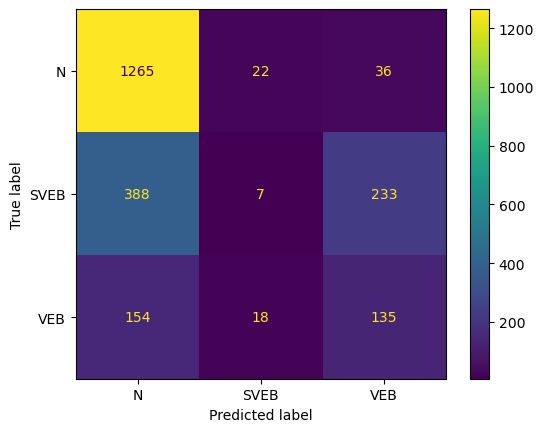

Fold 66:
  Test:  patient=65
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1887
         1.0       0.88      0.51      0.65        41
         2.0       0.06      0.20      0.10         5

    accuracy                           0.99      1933
   macro avg       0.64      0.57      0.58      1933
weighted avg       0.99      0.99      0.99      1933

                   0.0        1.0       2.0  accuracy    macro avg  \
precision     0.996830   0.875000  0.062500  0.987584     0.644777   
recall        1.000000   0.512195  0.200000  0.987584     0.570732   
f1-score      0.998413   0.646154  0.095238  0.987584     0.579935   
support    1887.000000  41.000000  5.000000  0.987584  1933.000000   

           weighted avg  
precision      0.991830  
recall         0.987584  
f1-score       0.988605  
support     1933.000000  


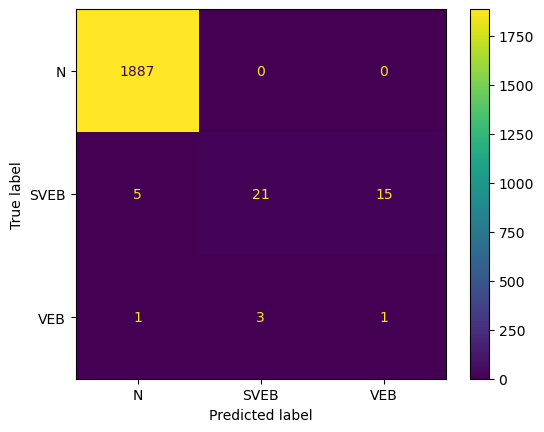

Fold 67:
  Test:  patient=66
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1771
         1.0       0.88      0.72      0.79        40
         2.0       0.22      0.29      0.25         7

    accuracy                           0.99      1818
   macro avg       0.70      0.67      0.68      1818
weighted avg       0.99      0.99      0.99      1818

                   0.0        1.0       2.0  accuracy    macro avg  \
precision     0.996059   0.878788  0.222222  0.990099     0.699023   
recall        0.998871   0.725000  0.285714  0.990099     0.669862   
f1-score      0.997463   0.794521  0.250000  0.990099     0.680661   
support    1771.000000  40.000000  7.000000  0.990099  1818.000000   

           weighted avg  
precision      0.990499  
recall         0.990099  
f1-score       0.990119  
support     1818.000000  


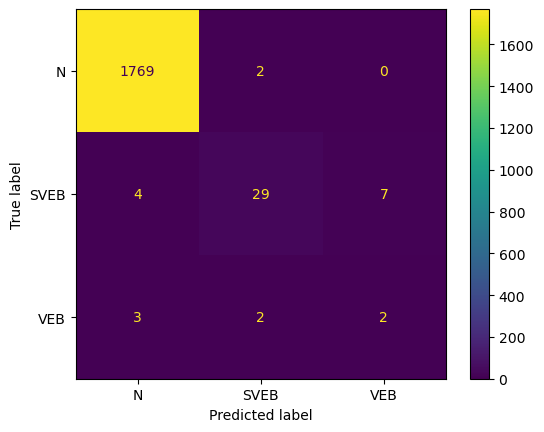

Fold 68:
  Test:  patient=67
              precision    recall  f1-score   support

         0.0       0.98      0.99      0.99      2484
         1.0       0.42      0.26      0.33        53
         2.0       0.98      0.93      0.95       343

    accuracy                           0.97      2880
   macro avg       0.79      0.73      0.76      2880
weighted avg       0.97      0.97      0.97      2880

                   0.0        1.0         2.0  accuracy    macro avg  \
precision     0.979754   0.424242    0.975610  0.972917     0.793202   
recall        0.993559   0.264151    0.932945  0.972917     0.730218   
f1-score      0.986608   0.325581    0.953800  0.972917     0.755330   
support    2484.000000  53.000000  343.000000  0.972917  2880.000000   

           weighted avg  
precision      0.969037  
recall         0.972917  
f1-score       0.970536  
support     2880.000000  


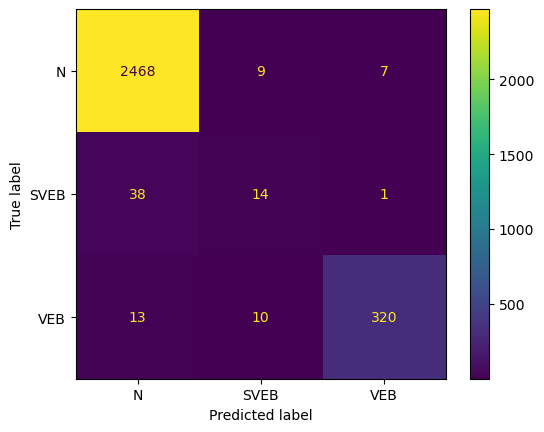

Fold 69:
  Test:  patient=68
              precision    recall  f1-score   support

         0.0       0.80      0.94      0.87      1505
         1.0       0.65      0.03      0.06       399
         2.0       0.27      0.80      0.41        54

    accuracy                           0.75      1958
   macro avg       0.57      0.59      0.44      1958
weighted avg       0.75      0.75      0.69      1958

                   0.0         1.0        2.0  accuracy    macro avg  \
precision     0.798315    0.650000   0.272152  0.754341     0.573489   
recall        0.944186    0.032581   0.796296  0.754341     0.591021   
f1-score      0.865145    0.062053   0.405660  0.754341     0.444286   
support    1505.000000  399.000000  54.000000  0.754341  1958.000000   

           weighted avg  
precision      0.753580  
recall         0.754341  
f1-score       0.688819  
support     1958.000000  


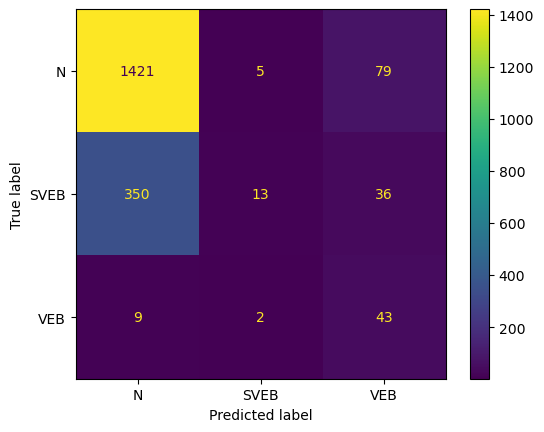

Fold 70:
  Test:  patient=69
              precision    recall  f1-score   support

         0.0       0.57      0.00      0.00      2168
         1.0       0.00      0.00      0.00        26
         2.0       0.01      0.85      0.02        27

    accuracy                           0.01      2221
   macro avg       0.19      0.28      0.01      2221
weighted avg       0.56      0.01      0.00      2221

                   0.0   1.0        2.0  accuracy    macro avg  weighted avg
precision     0.571429   0.0   0.010398  0.012157     0.193942      0.557919
recall        0.001845   0.0   0.851852  0.012157     0.284566      0.012157
f1-score      0.003678   0.0   0.020545  0.012157     0.008074      0.003840
support    2168.000000  26.0  27.000000  0.012157  2221.000000   2221.000000


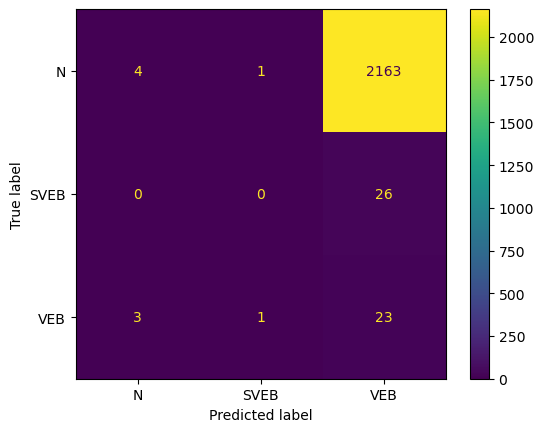

Fold 71:
  Test:  patient=70
              precision    recall  f1-score   support

         0.0       0.90      0.99      0.94      2352
         1.0       0.49      0.22      0.30       125
         2.0       1.00      0.19      0.32       210

    accuracy                           0.89      2687
   macro avg       0.80      0.47      0.52      2687
weighted avg       0.89      0.89      0.86      2687

                   0.0         1.0         2.0  accuracy    macro avg  \
precision     0.899306    0.490909    1.000000  0.892445     0.796738   
recall        0.991071    0.216000    0.190476  0.892445     0.465849   
f1-score      0.942961    0.300000    0.320000  0.892445     0.520987   
support    2352.000000  125.000000  210.000000  0.892445  2687.000000   

           weighted avg  
precision      0.888177  
recall         0.892445  
f1-score       0.864363  
support     2687.000000  


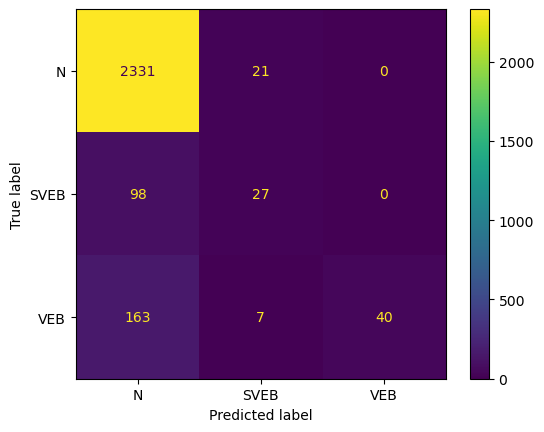

Fold 72:
  Test:  patient=71
              precision    recall  f1-score   support

         0.0       0.97      1.00      0.98      2189
         1.0       0.85      0.78      0.82        68
         2.0       0.55      0.11      0.18        54

    accuracy                           0.97      2311
   macro avg       0.79      0.63      0.66      2311
weighted avg       0.96      0.97      0.96      2311

                   0.0        1.0        2.0  accuracy    macro avg  \
precision     0.974084   0.854839   0.545455  0.968845     0.791459   
recall        0.995889   0.779412   0.111111  0.968845     0.628804   
f1-score      0.984866   0.815385   0.184615  0.968845     0.661622   
support    2189.000000  68.000000  54.000000  0.968845  2311.000000   

           weighted avg  
precision      0.960560  
recall         0.968845  
f1-score       0.961180  
support     2311.000000  


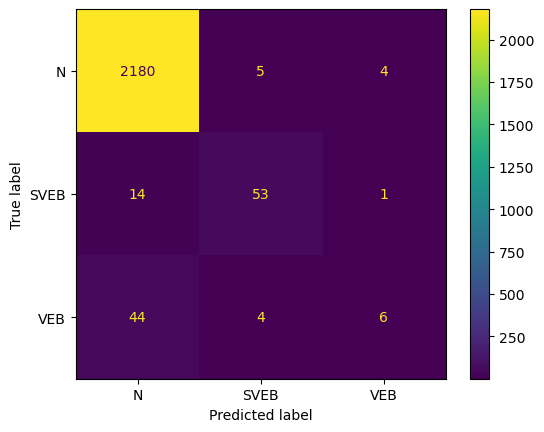

Fold 73:
  Test:  patient=72
              precision    recall  f1-score   support

         0.0       0.90      0.99      0.94      1464
         1.0       0.55      0.14      0.22       152
         2.0       0.76      0.49      0.60        91

    accuracy                           0.89      1707
   macro avg       0.74      0.54      0.59      1707
weighted avg       0.86      0.89      0.86      1707

                   0.0         1.0        2.0  accuracy    macro avg  \
precision     0.899379    0.552632   0.762712  0.886936     0.738241   
recall        0.989071    0.138158   0.494505  0.886936     0.540578   
f1-score      0.942095    0.221053   0.600000  0.886936     0.587716   
support    1464.000000  152.000000  91.000000  0.886936  1707.000000   

           weighted avg  
precision      0.861217  
recall         0.886936  
f1-score       0.859653  
support     1707.000000  


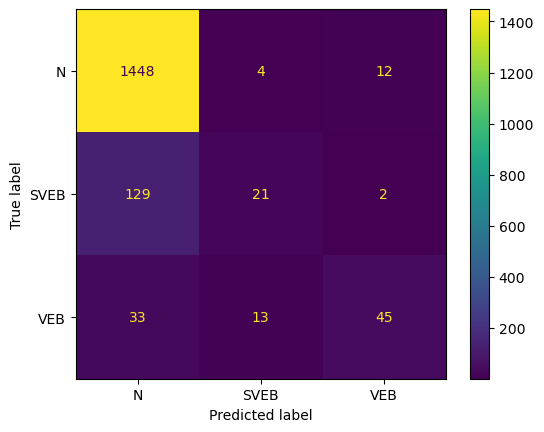

Fold 74:
  Test:  patient=73
              precision    recall  f1-score   support

         0.0       0.96      1.00      0.98      2001
         1.0       0.44      0.05      0.10        74
         2.0       0.74      0.65      0.69        97

    accuracy                           0.95      2172
   macro avg       0.72      0.57      0.59      2172
weighted avg       0.93      0.95      0.94      2172

                   0.0        1.0        2.0  accuracy    macro avg  \
precision     0.961983   0.444444   0.741176  0.951197     0.715868   
recall        0.999000   0.054054   0.649485  0.951197     0.567513   
f1-score      0.980142   0.096386   0.692308  0.951197     0.589612   
support    2001.000000  74.000000  97.000000  0.951197  2172.000000   

           weighted avg  
precision      0.934489  
recall         0.951197  
f1-score       0.937178  
support     2172.000000  


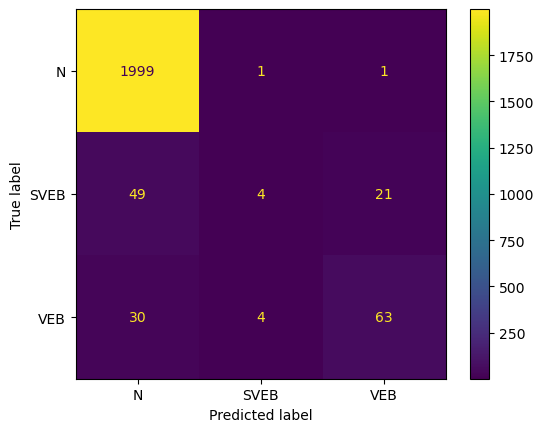

Fold 75:
  Test:  patient=74
              precision    recall  f1-score   support

         0.0       0.87      0.72      0.79      2120
         1.0       0.65      0.59      0.62       277
         2.0       0.06      0.18      0.09       207

    accuracy                           0.66      2604
   macro avg       0.53      0.49      0.50      2604
weighted avg       0.78      0.66      0.71      2604

                   0.0         1.0         2.0  accuracy    macro avg  \
precision     0.869565    0.649402    0.061157  0.660522     0.526708   
recall        0.716981    0.588448    0.178744  0.660522     0.494724   
f1-score      0.785936    0.617424    0.091133  0.660522     0.498164   
support    2120.000000  277.000000  207.000000  0.660522  2604.000000   

           weighted avg  
precision      0.781883  
recall         0.660522  
f1-score       0.712778  
support     2604.000000  


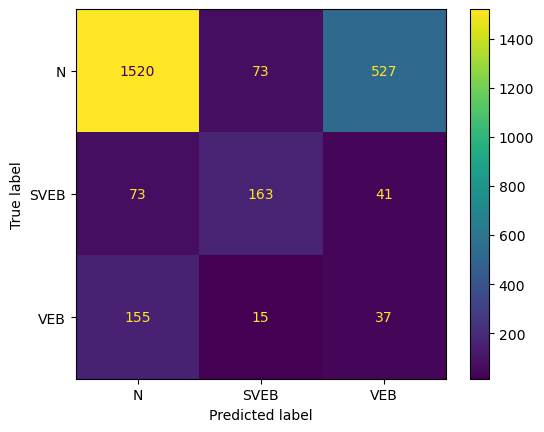

Fold 76:
  Test:  patient=75
              precision    recall  f1-score   support

         0.0       0.81      0.97      0.88      1740
         1.0       0.57      0.16      0.25       523
         2.0       0.77      0.82      0.79       577

    accuracy                           0.79      2840
   macro avg       0.72      0.65      0.64      2840
weighted avg       0.76      0.79      0.75      2840

                   0.0         1.0         2.0  accuracy    macro avg  \
precision     0.810072    0.568493    0.773399  0.789789     0.717321   
recall        0.970690    0.158700    0.816291  0.789789     0.648560   
f1-score      0.883137    0.248132    0.794266  0.789789     0.641845   
support    1740.000000  523.000000  577.000000  0.789789  2840.000000   

           weighted avg  
precision      0.758133  
recall         0.789789  
f1-score       0.748142  
support     2840.000000  


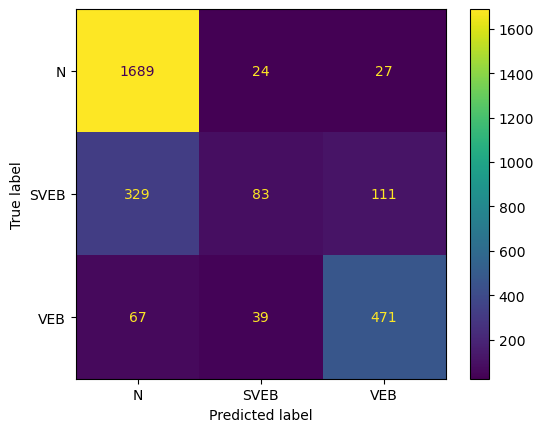

Fold 77:
  Test:  patient=76


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       0.98      0.98      0.98      2188
         1.0       0.00      0.00      0.00         0
         2.0       0.99      0.64      0.78       338

    accuracy                           0.93      2526
   macro avg       0.66      0.54      0.59      2526
weighted avg       0.98      0.93      0.95      2526

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.979881  0.0    0.986364  0.934283     0.655415      0.980749
recall        0.979433  NaN    0.642012  0.934283     0.540482      0.934283
f1-score      0.979657  NaN    0.777778  0.934283     0.585812      0.952644
support    2188.000000  0.0  338.000000  0.934283  2526.000000   2526.000000


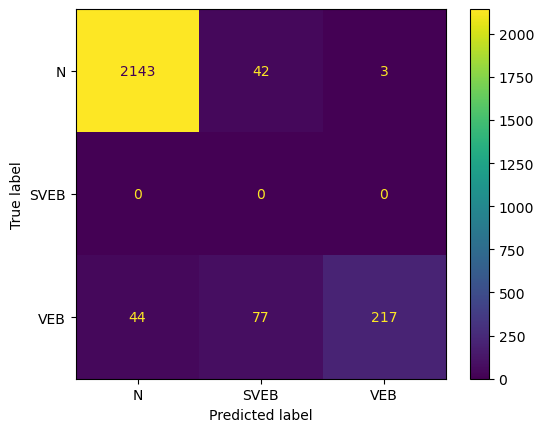

Fold 78:
  Test:  patient=77
              precision    recall  f1-score   support

         0.0       0.97      0.84      0.90      2211
         1.0       0.10      0.25      0.15        80
         2.0       0.17      0.74      0.28        53

    accuracy                           0.82      2344
   macro avg       0.41      0.61      0.44      2344
weighted avg       0.92      0.82      0.86      2344

                   0.0        1.0        2.0  accuracy    macro avg  \
precision     0.968783   0.103093   0.171053  0.819539     0.414309   
recall        0.842153   0.250000   0.735849  0.819539     0.609334   
f1-score      0.901040   0.145985   0.277580  0.819539     0.441535   
support    2211.000000  80.000000  53.000000  0.819539  2344.000000   

           weighted avg  
precision      0.921199  
recall         0.819539  
f1-score       0.861174  
support     2344.000000  


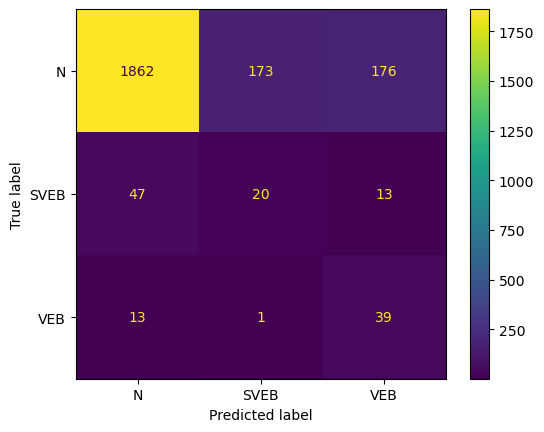

C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\numpy\core\fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\numpy\core\_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [66]:
from sklearn.model_selection import LeaveOneGroupOut
import time
X=df_sup.drop('type',axis=1)
y=df_sup['type']
groups=df_sup['patient']
skf = LeaveOneGroupOut()


start_time=time.time()
df_normal_sup, acc_normal_sup,confusion_matrix_final_sup,list_f1score_sup = cross_valid(pipe_normal, skf, X, y,groups)
end_time=time.time()

In [67]:
df_normal_sup

,0.0,1.0,2.0,macro avg,weighted avg
f1-score,0.911370,0.225427,0.372760,0.486619,0.853897
precision,0.918374,0.399400,0.489964,0.595091,0.897662
recall,0.927927,0.224539,0.400821,0.510180,0.859066
support,2079.423077,156.333333,138.013889,2363.153846,2363.153846


Fold 1:
  Test:  patient=0
              precision    recall  f1-score   support

         0.0       0.99      0.97      0.98      1844
         1.0       0.10      0.13      0.11        30
         2.0       0.11      0.33      0.16         6

    accuracy                           0.96      1880
   macro avg       0.40      0.48      0.42      1880
weighted avg       0.97      0.96      0.96      1880

                   0.0        1.0       2.0  accuracy    macro avg  \
precision     0.986806   0.095238  0.105263  0.957979     0.395769   
recall        0.973427   0.133333  0.333333  0.957979     0.480031   
f1-score      0.980071   0.111111  0.160000  0.957979     0.417061   
support    1844.000000  30.000000  6.000000  0.957979  1880.000000   

           weighted avg  
precision      0.969765  
recall         0.957979  
f1-score       0.963587  
support     1880.000000  


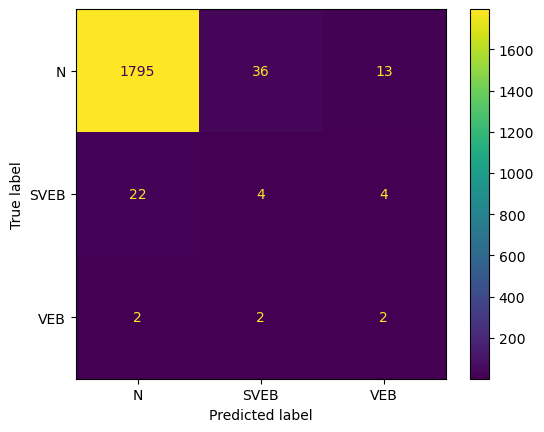

Fold 2:
  Test:  patient=1
              precision    recall  f1-score   support

         0.0       0.99      0.94      0.96      2173
         1.0       0.30      0.33      0.32        66
         2.0       0.67      0.92      0.78       268

    accuracy                           0.92      2507
   macro avg       0.65      0.73      0.69      2507
weighted avg       0.94      0.92      0.93      2507

                   0.0        1.0         2.0  accuracy    macro avg  \
precision     0.987421   0.301370    0.673025   0.92142     0.653939   
recall        0.939254   0.333333    0.921642   0.92142     0.731410   
f1-score      0.962736   0.316547    0.777953   0.92142     0.685745   
support    2173.000000  66.000000  268.000000   0.92142  2507.000000   

           weighted avg  
precision      0.935751  
recall         0.921420  
f1-score       0.925971  
support     2507.000000  


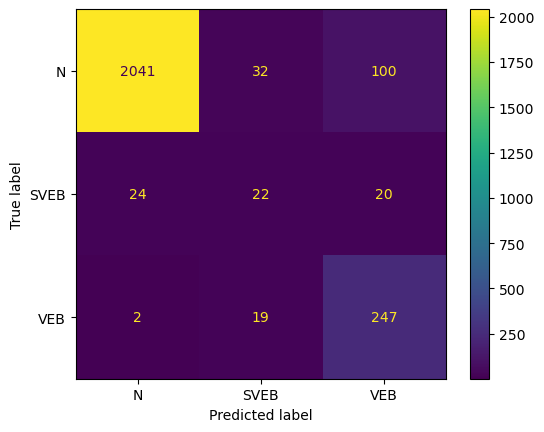

Fold 3:
  Test:  patient=2


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       0.99      0.94      0.97      1584
         1.0       0.00      0.00      0.00         0
         2.0       0.43      0.74      0.55        85

    accuracy                           0.93      1669
   macro avg       0.47      0.56      0.50      1669
weighted avg       0.96      0.93      0.94      1669

                   0.0  1.0        2.0  accuracy    macro avg  weighted avg
precision     0.988764  0.0   0.431507  0.934092     0.473424      0.960384
recall        0.944444  NaN   0.741176  0.934092     0.561874      0.934092
f1-score      0.966096  NaN   0.545455  0.934092     0.503850      0.944673
support    1584.000000  0.0  85.000000  0.934092  1669.000000   1669.000000


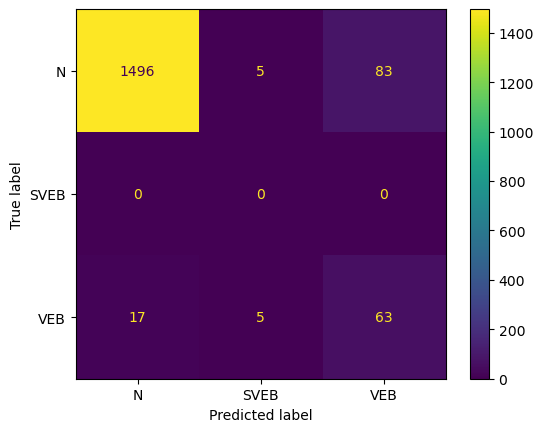

Fold 4:
  Test:  patient=3


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1922
         1.0       0.00      0.00      0.00         0
         2.0       1.00      0.97      0.98       143

    accuracy                           1.00      2065
   macro avg       0.67      0.65      0.66      2065
weighted avg       1.00      1.00      1.00      2065

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.999479  0.0    1.000000  0.995157     0.666493      0.999515
recall        0.997399  NaN    0.965035  0.995157     0.654145      0.995157
f1-score      0.998437  NaN    0.982206  0.995157     0.660215      0.997314
support    1922.000000  0.0  143.000000  0.995157  2065.000000   2065.000000


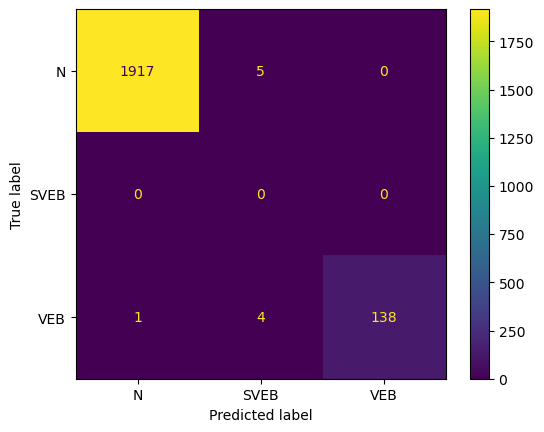

Fold 5:
  Test:  patient=4


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       0.99      0.86      0.92      2651
         1.0       0.00      0.00      0.00         0
         2.0       0.90      0.40      0.55       181

    accuracy                           0.83      2832
   macro avg       0.63      0.42      0.49      2832
weighted avg       0.98      0.83      0.90      2832

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.990000  0.0    0.900000  0.829449     0.630000      0.984248
recall        0.858921  NaN    0.397790  0.829449     0.418904      0.829449
f1-score      0.919814  NaN    0.551724  0.829449     0.490513      0.896289
support    2651.000000  0.0  181.000000  0.829449  2832.000000   2832.000000


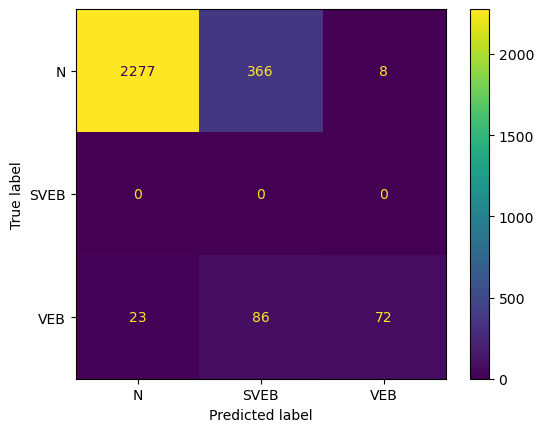

Fold 6:
  Test:  patient=5


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       1.00      0.90      0.95      2089
         1.0       0.00      0.00      0.00         0
         2.0       0.52      0.96      0.67       207

    accuracy                           0.91      2296
   macro avg       0.51      0.62      0.54      2296
weighted avg       0.96      0.91      0.92      2296

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.998943  0.0    0.516883  0.909843     0.505275      0.955482
recall        0.904739  NaN    0.961353  0.909843     0.622031      0.909843
f1-score      0.949510  NaN    0.672297  0.909843     0.540602      0.924518
support    2089.000000  0.0  207.000000  0.909843  2296.000000   2296.000000


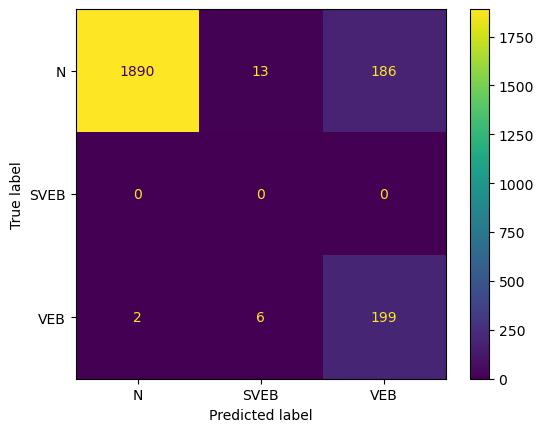

Fold 7:
  Test:  patient=6
              precision    recall  f1-score   support

         0.0       1.00      0.99      0.99      2950
         1.0       0.35      0.65      0.45        40
         2.0       0.33      0.17      0.23        29

    accuracy                           0.98      3019
   macro avg       0.56      0.60      0.56      3019
weighted avg       0.98      0.98      0.98      3019

                   0.0        1.0        2.0  accuracy    macro avg  \
precision     0.997269   0.346667   0.333333  0.977807     0.559090   
recall        0.990169   0.650000   0.172414  0.977807     0.604194   
f1-score      0.993706   0.452174   0.227273  0.977807     0.557718   
support    2950.000000  40.000000  29.000000  0.977807  3019.000000   

           weighted avg  
precision      0.982271  
recall         0.977807  
f1-score       0.979169  
support     3019.000000  


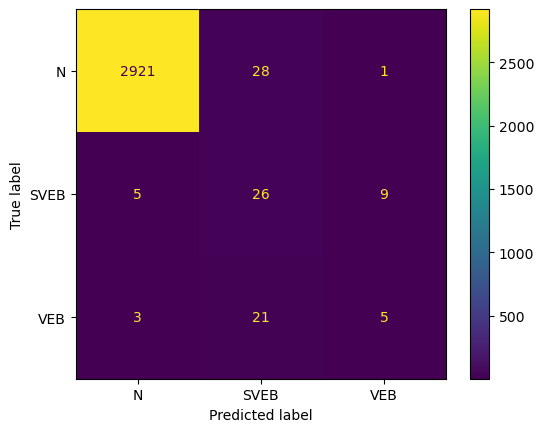

Fold 8:
  Test:  patient=7


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       1.00      0.99      0.99      1911
         1.0       0.49      0.66      0.56        29
         2.0       0.00      0.00      0.00         0

    accuracy                           0.98      1940
   macro avg       0.49      0.55      0.52      1940
weighted avg       0.99      0.98      0.98      1940

                   0.0        1.0  2.0  accuracy    macro avg  weighted avg
precision     0.995774   0.487179  0.0  0.981443     0.494318      0.988171
recall        0.986395   0.655172  NaN  0.981443     0.547189      0.981443
f1-score      0.991062   0.558824  NaN  0.981443     0.516629      0.984601
support    1911.000000  29.000000  0.0  0.981443  1940.000000   1940.000000


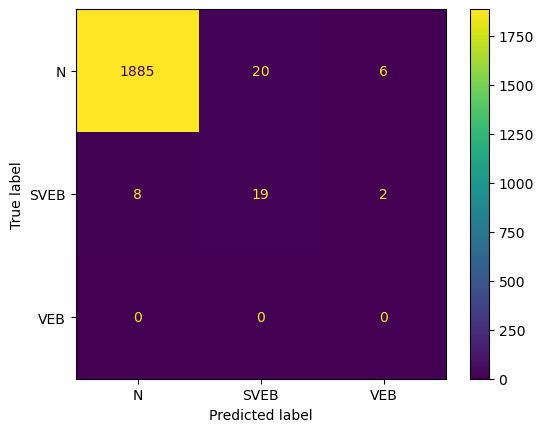

Fold 9:
  Test:  patient=8
              precision    recall  f1-score   support

         0.0       1.00      0.75      0.86      1744
         1.0       0.04      0.95      0.08        20
         2.0       0.40      1.00      0.57         8

    accuracy                           0.75      1772
   macro avg       0.48      0.90      0.50      1772
weighted avg       0.99      0.75      0.85      1772

                   0.0        1.0       2.0  accuracy    macro avg  \
precision     0.999234   0.042601  0.400000  0.751693     0.480612   
recall        0.748280   0.950000  1.000000  0.751693     0.899427   
f1-score      0.855738   0.081545  0.571429  0.751693     0.502904   
support    1744.000000  20.000000  8.000000  0.751693  1772.000000   

           weighted avg  
precision      0.985732  
recall         0.751693  
f1-score       0.845716  
support     1772.000000  


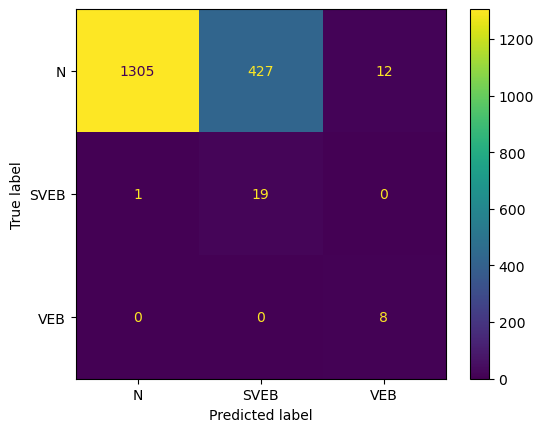

Fold 10:
  Test:  patient=9


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       0.98      0.96      0.97      2430
         1.0       0.37      0.53      0.43       112
         2.0       0.00      0.00      0.00         0

    accuracy                           0.94      2542
   macro avg       0.45      0.49      0.47      2542
weighted avg       0.95      0.94      0.95      2542

                   0.0         1.0  2.0  accuracy    macro avg  weighted avg
precision     0.981450    0.368750  0.0  0.939024     0.450067      0.954455
recall        0.958025    0.526786  NaN  0.939024     0.494937      0.939024
f1-score      0.969596    0.433824  NaN  0.939024     0.467807      0.945990
support    2430.000000  112.000000  0.0  0.939024  2542.000000   2542.000000


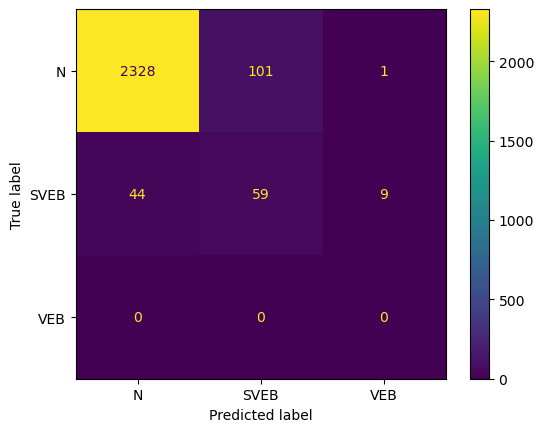

Fold 11:
  Test:  patient=10
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1837
         1.0       0.32      0.75      0.44         8
         2.0       0.94      0.86      0.90        56

    accuracy                           0.99      1901
   macro avg       0.75      0.87      0.78      1901
weighted avg       0.99      0.99      0.99      1901

                   0.0       1.0        2.0  accuracy    macro avg  \
precision     0.999454  0.315789   0.941176  0.991057     0.752140   
recall        0.996189  0.750000   0.857143  0.991057     0.867777   
f1-score      0.997819  0.444444   0.897196  0.991057     0.779820   
support    1837.000000  8.000000  56.000000  0.991057  1901.000000   

           weighted avg  
precision      0.994860  
recall         0.991057  
f1-score       0.992526  
support     1901.000000  


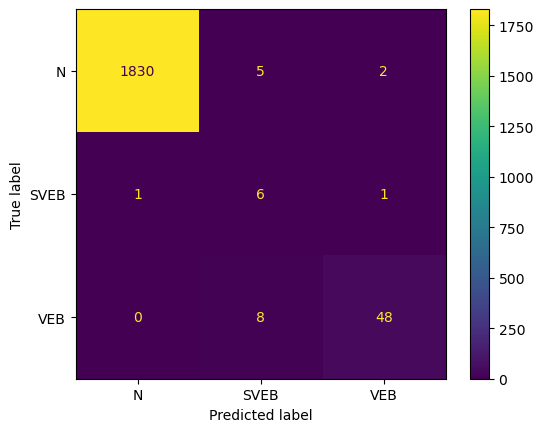

Fold 12:
  Test:  patient=11
              precision    recall  f1-score   support

         0.0       1.00      0.95      0.98      1404
         1.0       0.01      1.00      0.02         1
         2.0       0.83      0.18      0.29        28

    accuracy                           0.94      1433
   macro avg       0.61      0.71      0.43      1433
weighted avg       1.00      0.94      0.96      1433

                   0.0       1.0        2.0  accuracy    macro avg  \
precision     0.999254  0.011628   0.833333  0.939288     0.614739   
recall        0.954416  1.000000   0.178571  0.939288     0.710996   
f1-score      0.976321  0.022989   0.294118  0.939288     0.431142   
support    1404.000000  1.000000  28.000000  0.939288  1433.000000   

           weighted avg  
precision      0.995323  
recall         0.939288  
f1-score       0.962325  
support     1433.000000  


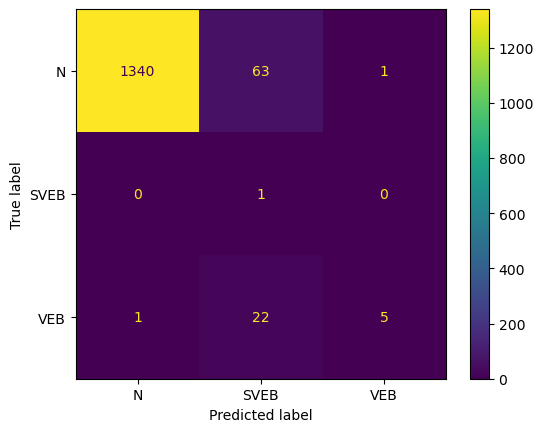

Fold 13:
  Test:  patient=12
              precision    recall  f1-score   support

         0.0       0.99      0.99      0.99      1756
         1.0       0.12      0.21      0.15        14
         2.0       0.93      0.77      0.84        70

    accuracy                           0.98      1840
   macro avg       0.68      0.66      0.66      1840
weighted avg       0.98      0.98      0.98      1840

                   0.0        1.0        2.0  accuracy    macro avg  \
precision     0.993739   0.120000   0.931034  0.979891     0.681591   
recall        0.994305   0.214286   0.771429  0.979891     0.660007   
f1-score      0.994022   0.153846   0.843750  0.979891     0.663873   
support    1756.000000  14.000000  70.000000  0.979891  1840.000000   

           weighted avg  
precision      0.984706  
recall         0.979891  
f1-score       0.981913  
support     1840.000000  


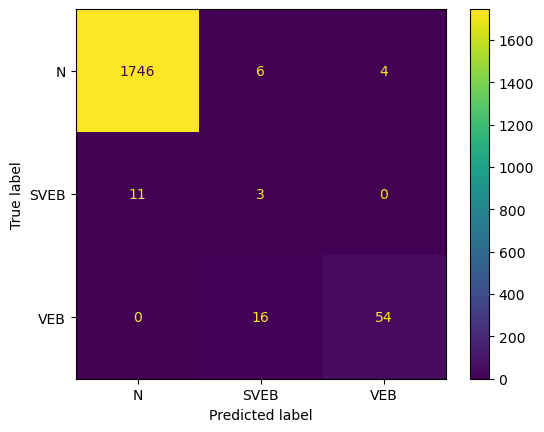

Fold 14:
  Test:  patient=13
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2161
         1.0       0.98      0.56      0.71       185
         2.0       0.02      0.67      0.04         3

    accuracy                           0.96      2349
   macro avg       0.67      0.74      0.58      2349
weighted avg       1.00      0.96      0.98      2349

                   0.0         1.0       2.0  accuracy    macro avg  \
precision     1.000000    0.980952  0.023256  0.963389     0.668069   
recall        0.998612    0.556757  0.666667  0.963389     0.740678   
f1-score      0.999305    0.710345  0.044944  0.963389     0.584865   
support    2161.000000  185.000000  3.000000  0.963389  2349.000000   

           weighted avg  
precision      0.997252  
recall         0.963389  
f1-score       0.975329  
support     2349.000000  


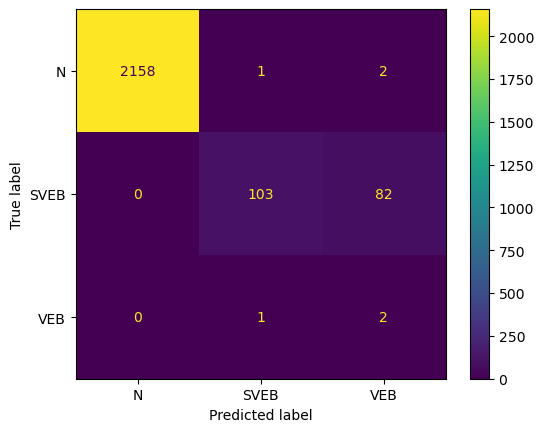

Fold 15:
  Test:  patient=14
              precision    recall  f1-score   support

         0.0       0.95      0.97      0.96      2480
         1.0       0.84      0.82      0.83       614
         2.0       0.87      0.36      0.51        36

    accuracy                           0.93      3130
   macro avg       0.89      0.72      0.77      3130
weighted avg       0.93      0.93      0.93      3130

                   0.0         1.0        2.0  accuracy    macro avg  \
precision     0.953424    0.837479   0.866667  0.930671     0.885857   
recall        0.965726    0.822476   0.361111  0.930671     0.716437   
f1-score      0.959535    0.829910   0.509804  0.930671     0.766416   
support    2480.000000  614.000000  36.000000  0.930671  3130.000000   

           weighted avg  
precision      0.929681  
recall         0.930671  
f1-score       0.928934  
support     3130.000000  


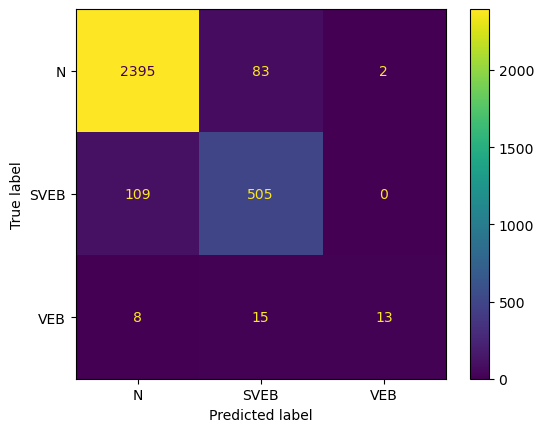

Fold 16:
  Test:  patient=15
              precision    recall  f1-score   support

         0.0       0.75      1.00      0.85      1673
         1.0       0.95      0.09      0.16       658
         2.0       0.00      0.00      0.00         1

    accuracy                           0.74      2332
   macro avg       0.57      0.36      0.34      2332
weighted avg       0.80      0.74      0.66      2332

                   0.0         1.0  2.0  accuracy    macro avg  weighted avg
precision     0.745982    0.950820  0.0  0.741424     0.565601      0.803459
recall        0.998805    0.088146  0.0  0.741424     0.362317      0.741424
f1-score      0.854076    0.161335  0.0  0.741424     0.338470      0.658245
support    1673.000000  658.000000  1.0  0.741424  2332.000000   2332.000000


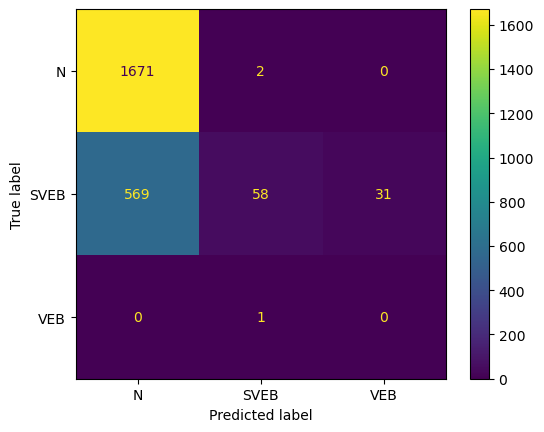

Fold 17:
  Test:  patient=16


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       0.93      0.97      0.95      2477
         1.0       0.80      0.39      0.53       382
         2.0       0.00      0.00      0.00         0

    accuracy                           0.90      2859
   macro avg       0.57      0.46      0.49      2859
weighted avg       0.91      0.90      0.89      2859

                   0.0         1.0  2.0  accuracy    macro avg  weighted avg
precision     0.925173    0.797872  0.0  0.895768     0.574348      0.908164
recall        0.973355    0.392670  NaN  0.895768     0.455342      0.895768
f1-score      0.948652    0.526316  NaN  0.895768     0.491656      0.892223
support    2477.000000  382.000000  0.0  0.895768  2859.000000   2859.000000


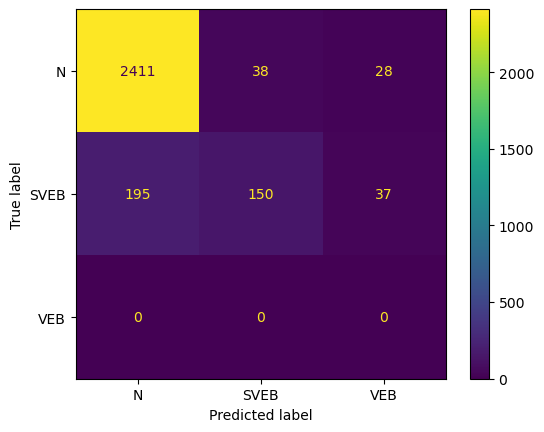

Fold 18:
  Test:  patient=17
              precision    recall  f1-score   support

         0.0       1.00      0.97      0.98      2214
         1.0       0.73      0.67      0.70       196
         2.0       0.00      0.00      0.00         7

    accuracy                           0.94      2417
   macro avg       0.58      0.55      0.56      2417
weighted avg       0.97      0.94      0.96      2417

                   0.0         1.0  2.0  accuracy    macro avg  weighted avg
precision     0.999533    0.731844  0.0  0.940422     0.577126      0.974931
recall        0.967480    0.668367  0.0  0.940422     0.545282      0.940422
f1-score      0.983245    0.698667  0.0  0.940422     0.560637      0.957321
support    2214.000000  196.000000  7.0  0.940422  2417.000000   2417.000000


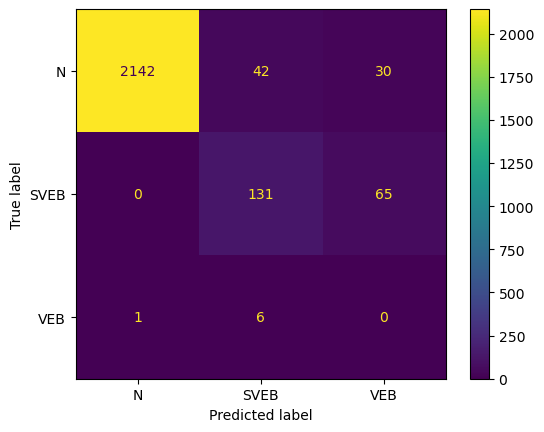

Fold 19:
  Test:  patient=18


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       1.00      0.91      0.95      2651
         1.0       1.00      0.03      0.05       145
         2.0       0.00      0.00      0.00         0

    accuracy                           0.87      2796
   macro avg       0.67      0.31      0.34      2796
weighted avg       1.00      0.87      0.91      2796

                   0.0         1.0  2.0  accuracy    macro avg  weighted avg
precision     0.999173    1.000000  0.0   0.86588     0.666391      0.999216
recall        0.911731    0.027586  NaN   0.86588     0.313106      0.865880
f1-score      0.953452    0.053691  NaN   0.86588     0.335714      0.906790
support    2651.000000  145.000000  0.0   0.86588  2796.000000   2796.000000


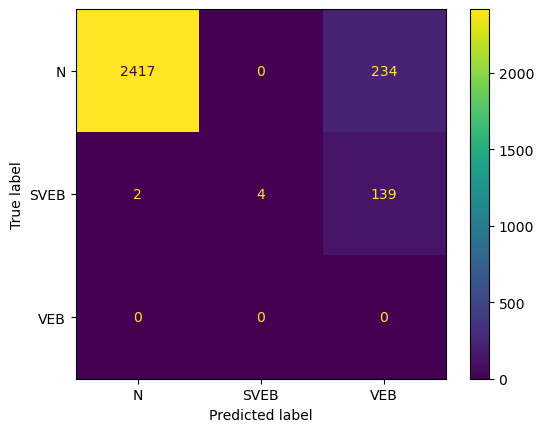

Fold 20:
  Test:  patient=19


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       1.00      0.90      0.94      2579
         1.0       0.25      0.89      0.39        80
         2.0       0.00      0.00      0.00         0

    accuracy                           0.90      2659
   macro avg       0.41      0.60      0.44      2659
weighted avg       0.97      0.90      0.93      2659

                   0.0        1.0  2.0  accuracy    macro avg  weighted avg
precision     0.996556   0.247387  0.0   0.89733     0.414648      0.974016
recall        0.897635   0.887500  NaN   0.89733     0.595045      0.897330
f1-score      0.944512   0.386921  NaN   0.89733     0.443811      0.927736
support    2579.000000  80.000000  0.0   0.89733  2659.000000   2659.000000


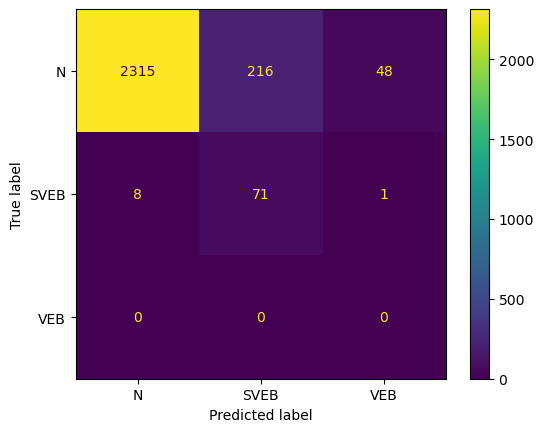

Fold 21:
  Test:  patient=20
              precision    recall  f1-score   support

         0.0       1.00      0.74      0.85      1842
         1.0       0.02      0.50      0.04        18
         2.0       0.00      0.00      0.00         0

    accuracy                           0.73      1860
   macro avg       0.34      0.41      0.29      1860
weighted avg       0.99      0.73      0.84      1860

                   0.0        1.0  2.0  accuracy    macro avg  weighted avg
precision     0.999264   0.018828  0.0  0.734409     0.339364      0.989776
recall        0.736699   0.500000  NaN  0.734409     0.412233      0.734409
f1-score      0.848125   0.036290  NaN  0.734409     0.294805      0.840269
support    1842.000000  18.000000  0.0  0.734409  1860.000000   1860.000000


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

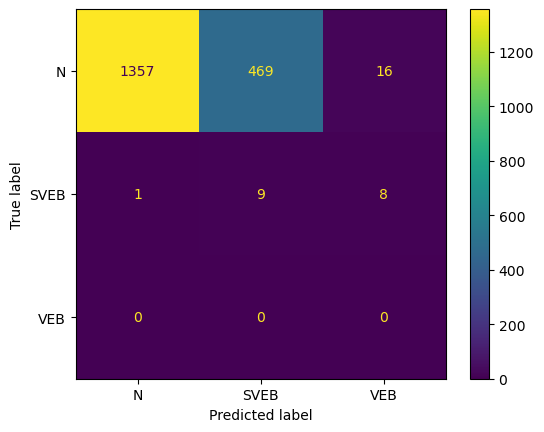

Fold 22:
  Test:  patient=21
              precision    recall  f1-score   support

         0.0       0.99      0.99      0.99      1755
         1.0       0.91      0.91      0.91       150
         2.0       0.00      0.00      0.00         6

    accuracy                           0.98      1911
   macro avg       0.63      0.63      0.63      1911
weighted avg       0.98      0.98      0.98      1911

                   0.0         1.0  2.0  accuracy    macro avg  weighted avg
precision     0.993739    0.906667  0.0  0.984825     0.633469      0.983785
recall        0.994872    0.906667  0.0  0.984825     0.633846      0.984825
f1-score      0.994305    0.906667  0.0  0.984825     0.633657      0.984304
support    1755.000000  150.000000  6.0  0.984825  1911.000000   1911.000000


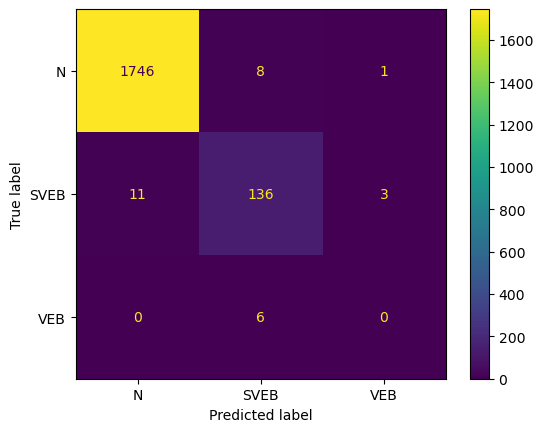

Fold 23:
  Test:  patient=22


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       1.00      0.94      0.97      1885
         1.0       0.39      0.93      0.55        80
         2.0       0.00      0.00      0.00         0

    accuracy                           0.94      1965
   macro avg       0.46      0.62      0.50      1965
weighted avg       0.97      0.94      0.95      1965

                   0.0        1.0  2.0  accuracy    macro avg  weighted avg
precision     0.998868   0.389474  0.0  0.935878     0.462781      0.974058
recall        0.936340   0.925000  NaN  0.935878     0.620447      0.935878
f1-score      0.966594   0.548148  NaN  0.935878     0.504914      0.949558
support    1885.000000  80.000000  0.0  0.935878  1965.000000   1965.000000


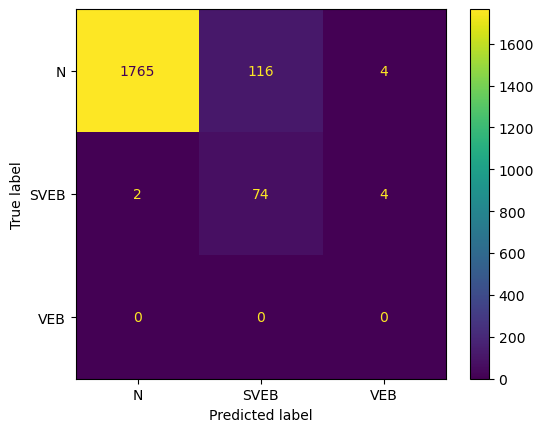

Fold 24:
  Test:  patient=23
              precision    recall  f1-score   support

         0.0       1.00      0.96      0.98      2339
         1.0       0.31      0.86      0.46        44
         2.0       0.00      0.00      0.00         1

    accuracy                           0.96      2384
   macro avg       0.44      0.61      0.48      2384
weighted avg       0.99      0.96      0.97      2384

                   0.0        1.0  2.0  accuracy    macro avg  weighted avg
precision     0.998231   0.314050  0.0  0.962668     0.437427      0.985185
recall        0.964942   0.863636  0.0  0.962668     0.609526      0.962668
f1-score      0.981304   0.460606  0.0  0.962668     0.480637      0.971283
support    2339.000000  44.000000  1.0  0.962668  2384.000000   2384.000000


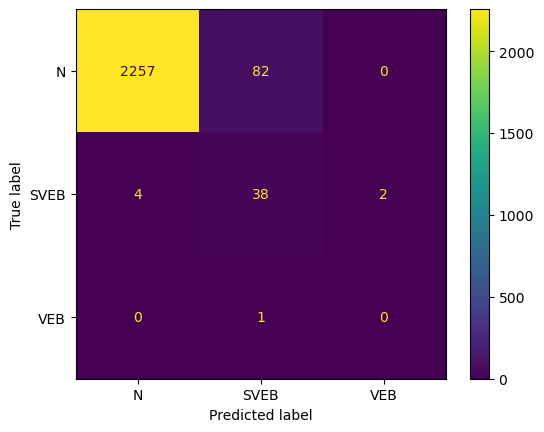

Fold 25:
  Test:  patient=24
              precision    recall  f1-score   support

         0.0       0.92      0.99      0.96      1489
         1.0       0.19      0.14      0.16       106
         2.0       0.66      0.42      0.51       254

    accuracy                           0.87      1849
   macro avg       0.59      0.52      0.54      1849
weighted avg       0.84      0.87      0.85      1849

                   0.0         1.0         2.0  accuracy    macro avg  \
precision     0.919776    0.192308    0.656442  0.865873     0.589509   
recall        0.993284    0.141509    0.421260  0.865873     0.518684   
f1-score      0.955118    0.163043    0.513189  0.865873     0.543784   
support    1489.000000  106.000000  254.000000  0.865873  1849.000000   

           weighted avg  
precision      0.841897  
recall         0.865873  
f1-score       0.849001  
support     1849.000000  


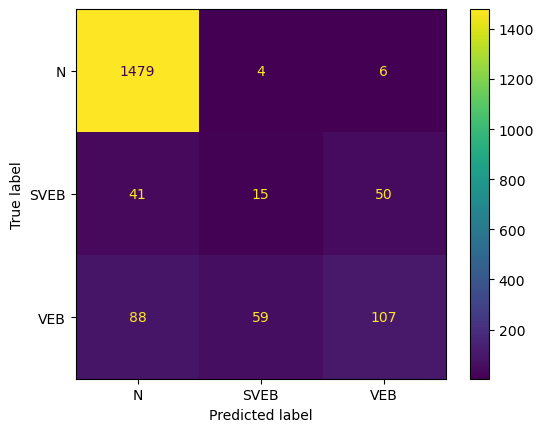

Fold 26:
  Test:  patient=25
              precision    recall  f1-score   support

         0.0       0.99      0.86      0.92      2392
         1.0       0.16      0.72      0.27       104
         2.0       0.00      0.00      0.00        61

    accuracy                           0.84      2557
   macro avg       0.38      0.53      0.40      2557
weighted avg       0.93      0.84      0.87      2557

                   0.0         1.0   2.0  accuracy    macro avg  weighted avg
precision     0.985224    0.164474   0.0    0.8377     0.383233      0.928338
recall        0.864130    0.721154   0.0    0.8377     0.528428      0.837700
f1-score      0.920713    0.267857   0.0    0.8377     0.396190      0.872195
support    2392.000000  104.000000  61.0    0.8377  2557.000000   2557.000000


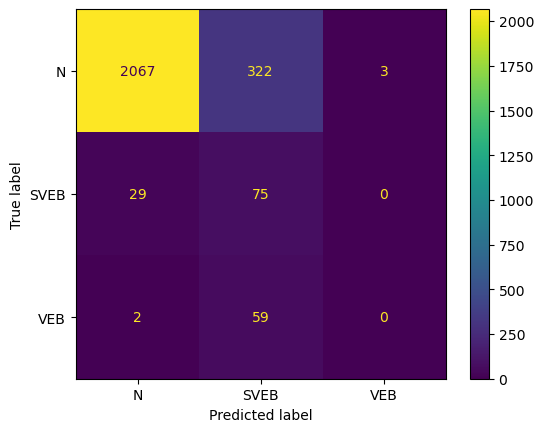

Fold 27:
  Test:  patient=26
              precision    recall  f1-score   support

         0.0       1.00      0.84      0.91      2647
         1.0       0.05      0.76      0.09        21
         2.0       0.09      0.32      0.14        38

    accuracy                           0.83      2706
   macro avg       0.38      0.64      0.38      2706
weighted avg       0.98      0.83      0.89      2706

                   0.0        1.0        2.0  accuracy    macro avg  \
precision     0.996854   0.046110   0.089552  0.830007     0.377505   
recall        0.837930   0.761905   0.315789  0.830007     0.638541   
f1-score      0.910509   0.086957   0.139535  0.830007     0.379000   
support    2647.000000  21.000000  38.000000  0.830007  2706.000000   

           weighted avg  
precision      0.976735  
recall         0.830007  
f1-score       0.893291  
support     2706.000000  


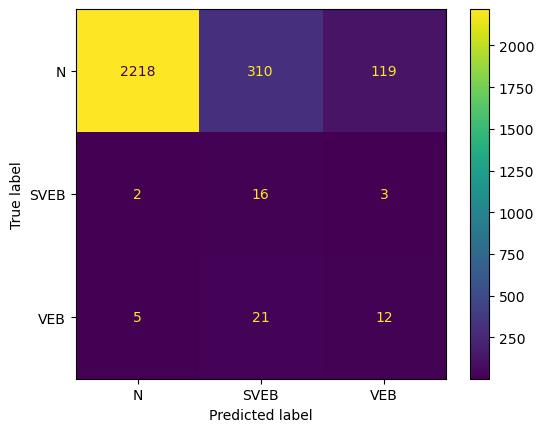

Fold 28:
  Test:  patient=27


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       1.00      0.94      0.97      1648
         1.0       0.52      0.81      0.63        59
         2.0       0.00      0.00      0.00         0

    accuracy                           0.93      1707
   macro avg       0.50      0.58      0.53      1707
weighted avg       0.98      0.93      0.96      1707

                   0.0        1.0  2.0  accuracy    macro avg  weighted avg
precision     0.997421   0.516129  0.0  0.934388     0.504517      0.980786
recall        0.938714   0.813559  NaN  0.934388     0.584091      0.934388
f1-score      0.967177   0.631579  NaN  0.934388     0.532919      0.955578
support    1648.000000  59.000000  0.0  0.934388  1707.000000   1707.000000


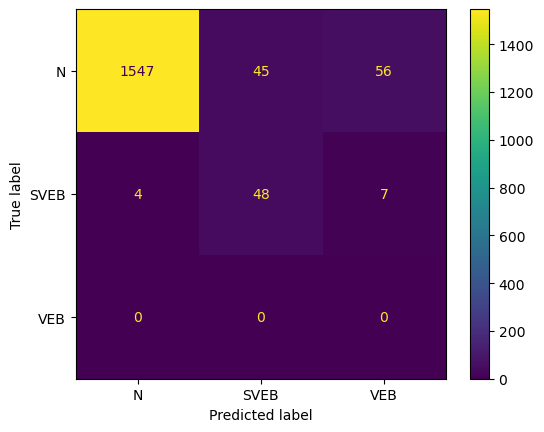

Fold 29:
  Test:  patient=28
              precision    recall  f1-score   support

         0.0       1.00      0.86      0.92      2826
         1.0       0.20      0.33      0.25        27
         2.0       0.03      0.43      0.06        30

    accuracy                           0.85      2883
   macro avg       0.41      0.54      0.41      2883
weighted avg       0.98      0.85      0.91      2883

                   0.0        1.0        2.0  accuracy    macro avg  \
precision     0.995479   0.204545   0.032020  0.847728     0.410681   
recall        0.857042   0.333333   0.433333  0.847728     0.541236   
f1-score      0.921088   0.253521   0.059633  0.847728     0.411414   
support    2826.000000  27.000000  30.000000  0.847728  2883.000000   

           weighted avg  
precision      0.978046  
recall         0.847728  
f1-score       0.905872  
support     2883.000000  


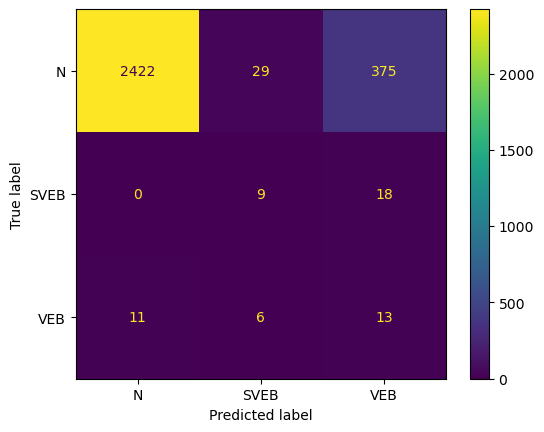

Fold 30:
  Test:  patient=29


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       1.00      0.93      0.97      1659
         1.0       0.15      0.90      0.25        20
         2.0       0.00      0.00      0.00         0

    accuracy                           0.93      1679
   macro avg       0.38      0.61      0.41      1679
weighted avg       0.99      0.93      0.96      1679

                   0.0        1.0  2.0  accuracy    macro avg  weighted avg
precision     0.998712   0.145161  0.0  0.934485     0.381291      0.988545
recall        0.934901   0.900000  NaN  0.934485     0.611634      0.934485
f1-score      0.965753   0.250000  NaN  0.934485     0.405251      0.957227
support    1659.000000  20.000000  0.0  0.934485  1679.000000   1679.000000


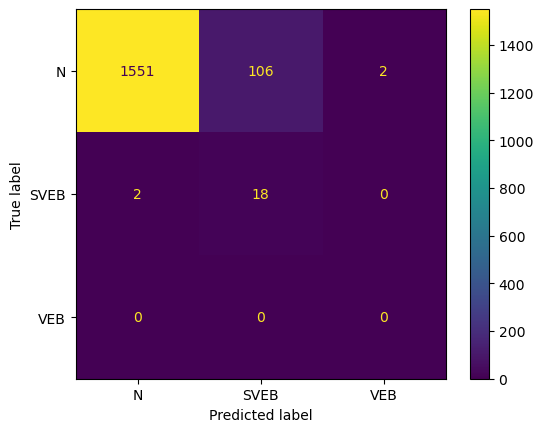

Fold 31:
  Test:  patient=30
              precision    recall  f1-score   support

         0.0       0.99      0.95      0.97      1665
         1.0       0.55      0.71      0.62        51
         2.0       0.44      1.00      0.61        44

    accuracy                           0.95      1760
   macro avg       0.66      0.89      0.73      1760
weighted avg       0.97      0.95      0.95      1760

                   0.0        1.0        2.0  accuracy    macro avg  \
precision     0.993103   0.553846   0.440000  0.945455     0.662317   
recall        0.951351   0.705882   1.000000  0.945455     0.885745   
f1-score      0.971779   0.620690   0.611111  0.945455     0.734527   
support    1665.000000  51.000000  44.000000  0.945455  1760.000000   

           weighted avg  
precision      0.966547  
recall         0.945455  
f1-score       0.952589  
support     1760.000000  


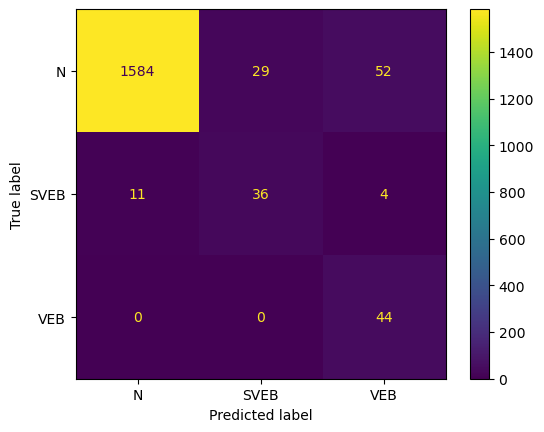

Fold 32:
  Test:  patient=31
              precision    recall  f1-score   support

         0.0       1.00      0.90      0.95      4226
         1.0       0.07      0.93      0.12        30
         2.0       0.00      0.00      0.00         1

    accuracy                           0.90      4257
   macro avg       0.36      0.61      0.36      4257
weighted avg       0.99      0.90      0.94      4257

                   0.0        1.0  2.0  accuracy    macro avg  weighted avg
precision     1.000000   0.066351  0.0  0.903453     0.355450      0.993185
recall        0.903455   0.933333  0.0  0.903453     0.612263      0.903453
f1-score      0.949279   0.123894  0.0  0.903453     0.357724      0.943239
support    4226.000000  30.000000  1.0  0.903453  4257.000000   4257.000000


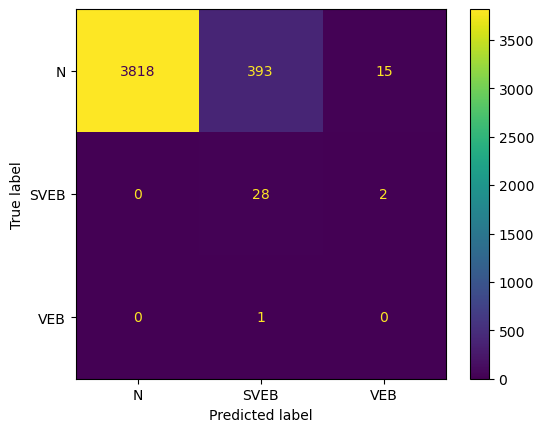

Fold 33:
  Test:  patient=32
              precision    recall  f1-score   support

         0.0       0.96      0.25      0.40      2058
         1.0       0.01      0.19      0.02        74
         2.0       0.01      0.83      0.02         6

    accuracy                           0.25      2138
   macro avg       0.33      0.43      0.15      2138
weighted avg       0.93      0.25      0.39      2138

                   0.0        1.0       2.0  accuracy    macro avg  \
precision     0.963168   0.012927  0.009766  0.253508     0.328620   
recall        0.254130   0.189189  0.833333  0.253508     0.425551   
f1-score      0.402153   0.024201  0.019305  0.253508     0.148553   
support    2058.000000  74.000000  6.000000  0.253508  2138.000000   

           weighted avg  
precision      0.927602  
recall         0.253508  
f1-score       0.387997  
support     2138.000000  


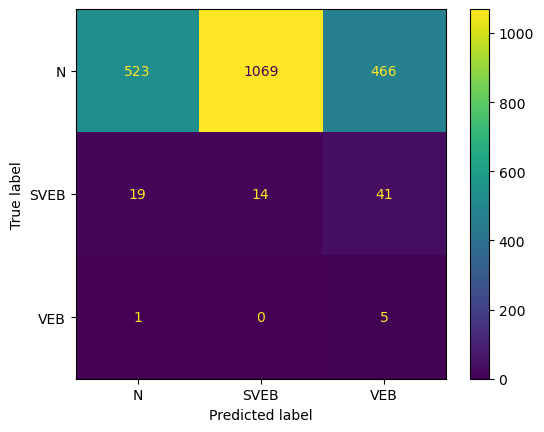

Fold 34:
  Test:  patient=33


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       1.00      0.99      0.99      1829
         1.0       0.14      0.14      0.14         7
         2.0       0.00      0.00      0.00         0

    accuracy                           0.98      1836
   macro avg       0.38      0.38      0.38      1836
weighted avg       0.99      0.98      0.99      1836

                   0.0       1.0  2.0  accuracy    macro avg  weighted avg
precision     0.996689  0.142857  0.0  0.984205     0.379849      0.993433
recall        0.987425  0.142857  NaN  0.984205     0.376761      0.984205
f1-score      0.992035  0.142857  NaN  0.984205     0.378297      0.988798
support    1829.000000  7.000000  0.0  0.984205  1836.000000   1836.000000


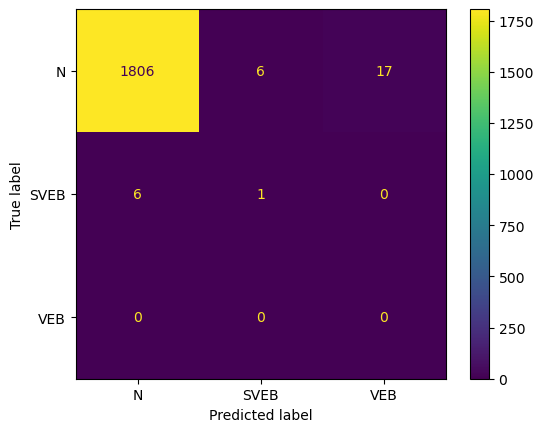

Fold 35:
  Test:  patient=34
              precision    recall  f1-score   support

         0.0       1.00      0.94      0.97      2167
         1.0       0.22      0.81      0.34        32
         2.0       0.91      1.00      0.95       427

    accuracy                           0.95      2626
   macro avg       0.71      0.92      0.75      2626
weighted avg       0.97      0.95      0.96      2626

                   0.0        1.0         2.0  accuracy    macro avg  \
precision     0.997545   0.218487    0.908511  0.946306     0.708181   
recall        0.937702   0.812500    1.000000  0.946306     0.916734   
f1-score      0.966698   0.344371    0.952062  0.946306     0.754377   
support    2167.000000  32.000000  427.000000  0.946306  2626.000000   

           weighted avg  
precision      0.973574  
recall         0.946306  
f1-score       0.956735  
support     2626.000000  


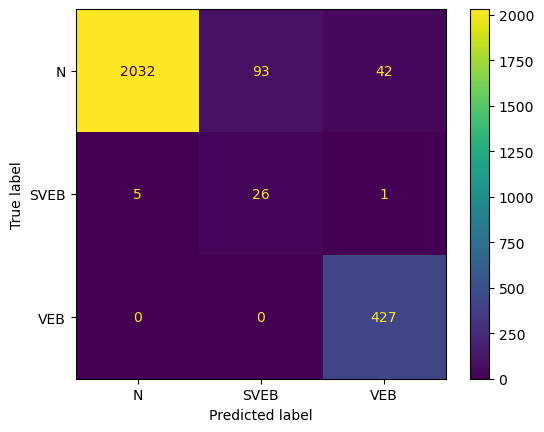

Fold 36:
  Test:  patient=35
              precision    recall  f1-score   support

         0.0       0.98      0.89      0.93      2332
         1.0       0.49      0.69      0.58       321
         2.0       0.02      0.22      0.04         9

    accuracy                           0.86      2662
   macro avg       0.50      0.60      0.51      2662
weighted avg       0.92      0.86      0.88      2662

                   0.0         1.0       2.0  accuracy    macro avg  \
precision     0.976832    0.492274  0.021277  0.860631     0.496794   
recall        0.885935    0.694704  0.222222  0.860631     0.600954   
f1-score      0.929166    0.576227  0.038835  0.860631     0.514743   
support    2332.000000  321.000000  9.000000  0.860631  2662.000000   

           weighted avg  
precision      0.915171  
recall         0.860631  
f1-score       0.883596  
support     2662.000000  


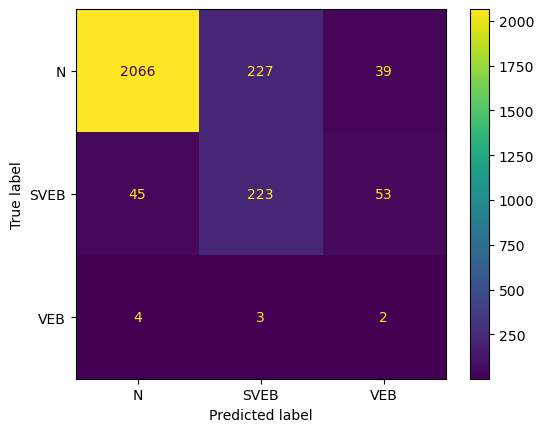

Fold 37:
  Test:  patient=36
              precision    recall  f1-score   support

         0.0       1.00      0.81      0.89      2105
         1.0       0.15      0.79      0.25        48
         2.0       0.18      0.75      0.29        64

    accuracy                           0.81      2217
   macro avg       0.44      0.78      0.48      2217
weighted avg       0.96      0.81      0.86      2217

                   0.0        1.0        2.0  accuracy    macro avg  \
precision     0.999412   0.150794   0.181132  0.805142     0.443779   
recall        0.807126   0.791667   0.750000  0.805142     0.782931   
f1-score      0.893035   0.253333   0.291793  0.805142     0.479387   
support    2105.000000  48.000000  64.000000  0.805142  2217.000000   

           weighted avg  
precision      0.957416  
recall         0.805142  
f1-score       0.861829  
support     2217.000000  


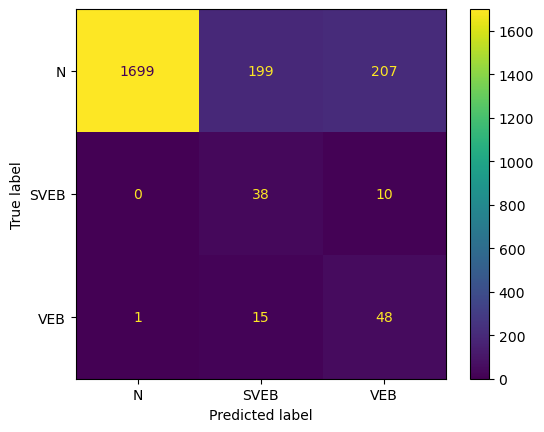

Fold 38:
  Test:  patient=37
              precision    recall  f1-score   support

         0.0       0.79      0.76      0.78      1788
         1.0       0.41      0.59      0.48       460
         2.0       0.34      0.24      0.28       478

    accuracy                           0.64      2726
   macro avg       0.51      0.53      0.51      2726
weighted avg       0.65      0.64      0.64      2726

                   0.0         1.0         2.0  accuracy    macro avg  \
precision     0.792982    0.406855    0.336232  0.640132     0.512023   
recall        0.758389    0.593478    0.242678  0.640132     0.531515   
f1-score      0.775300    0.482759    0.281896  0.640132     0.513318   
support    1788.000000  460.000000  478.000000  0.640132  2726.000000   

           weighted avg  
precision      0.647735  
recall         0.640132  
f1-score       0.639417  
support     2726.000000  


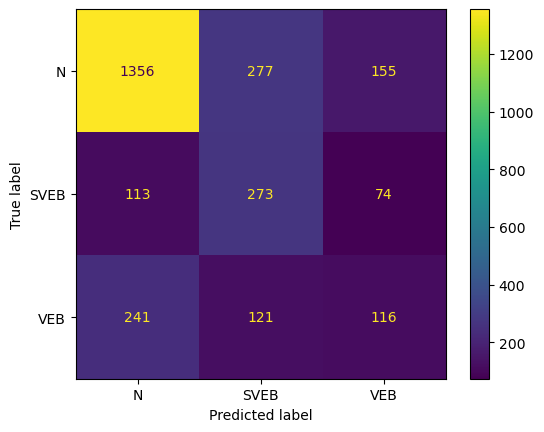

Fold 39:
  Test:  patient=38
              precision    recall  f1-score   support

         0.0       0.93      0.94      0.94      2034
         1.0       0.31      0.37      0.34       227
         2.0       0.96      0.69      0.81       276

    accuracy                           0.86      2537
   macro avg       0.73      0.67      0.69      2537
weighted avg       0.88      0.86      0.87      2537

                   0.0         1.0         2.0  accuracy    macro avg  \
precision     0.929646    0.305755    0.964646  0.864013     0.733349   
recall        0.941986    0.374449    0.692029  0.864013     0.669488   
f1-score      0.935775    0.336634    0.805907  0.864013     0.692772   
support    2034.000000  227.000000  276.000000  0.864013  2537.000000   

           weighted avg  
precision      0.877630  
recall         0.864013  
f1-score       0.868038  
support     2537.000000  


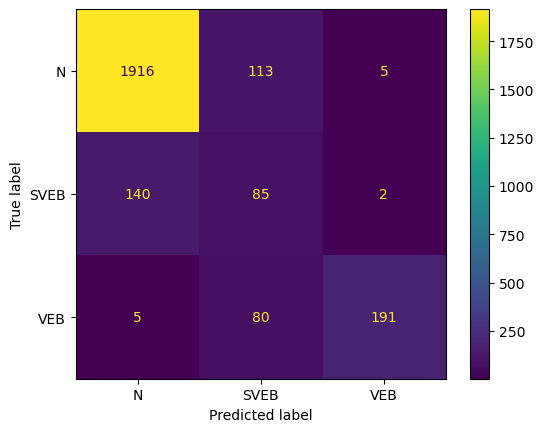

Fold 40:
  Test:  patient=39
              precision    recall  f1-score   support

         0.0       1.00      0.97      0.98      2810
         1.0       0.17      0.92      0.29        12
         2.0       0.35      0.75      0.48        28

    accuracy                           0.97      2850
   macro avg       0.51      0.88      0.58      2850
weighted avg       0.99      0.97      0.98      2850

                   0.0        1.0        2.0  accuracy    macro avg  \
precision     0.998899   0.169231   0.350000  0.966316     0.506043   
recall        0.968683   0.916667   0.750000  0.966316     0.878450   
f1-score      0.983559   0.285714   0.477273  0.966316     0.582182   
support    2810.000000  12.000000  28.000000  0.966316  2850.000000   

           weighted avg  
precision      0.989031  
recall         0.966316  
f1-score       0.975647  
support     2850.000000  


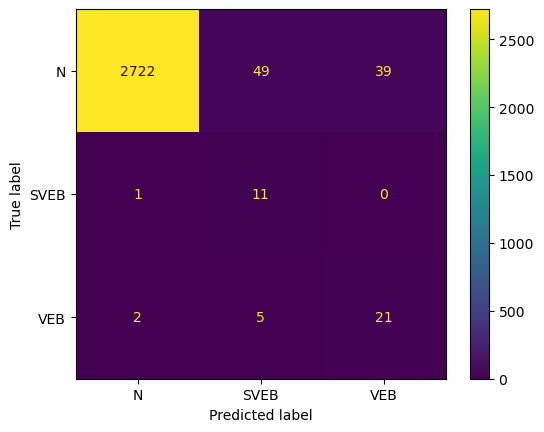

Fold 41:
  Test:  patient=40
              precision    recall  f1-score   support

         0.0       0.99      0.96      0.98      2400
         1.0       0.19      0.87      0.31        38
         2.0       0.60      0.41      0.49       144

    accuracy                           0.93      2582
   macro avg       0.60      0.75      0.59      2582
weighted avg       0.96      0.93      0.94      2582

                   0.0        1.0         2.0  accuracy    macro avg  \
precision     0.994377   0.191860    0.602041  0.926026     0.596093   
recall        0.957917   0.868421    0.409722  0.926026     0.745353   
f1-score      0.975806   0.314286    0.487603  0.926026     0.592565   
support    2400.000000  38.000000  144.000000  0.926026  2582.000000   

           weighted avg  
precision      0.960685  
recall         0.926026  
f1-score       0.938843  
support     2582.000000  


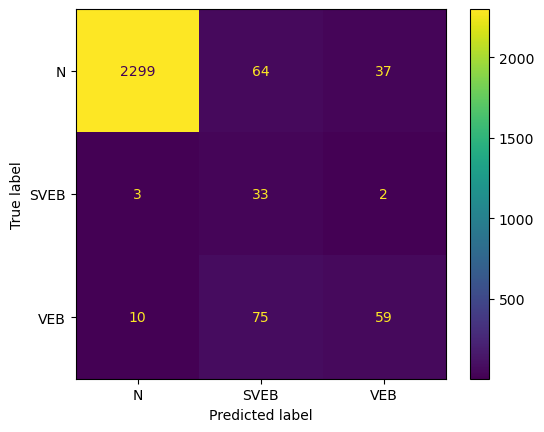

Fold 42:
  Test:  patient=41
              precision    recall  f1-score   support

         0.0       1.00      0.96      0.98      2167
         1.0       0.06      0.62      0.10         8
         2.0       0.18      0.67      0.29         3

    accuracy                           0.96      2178
   macro avg       0.41      0.75      0.46      2178
weighted avg       0.99      0.96      0.97      2178

                   0.0       1.0       2.0  accuracy    macro avg  \
precision     0.999519  0.056818  0.181818    0.9573     0.412718   
recall        0.958929  0.625000  0.666667    0.9573     0.750199   
f1-score      0.978804  0.104167  0.285714    0.9573     0.456228   
support    2167.000000  8.000000  3.000000    0.9573  2178.000000   

           weighted avg  
precision      0.994930  
recall         0.957300  
f1-score       0.974636  
support     2178.000000  


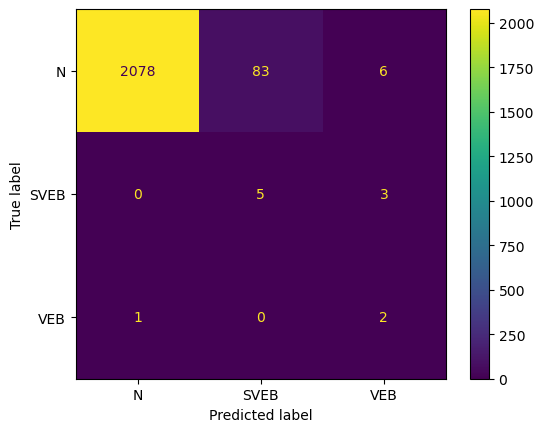

Fold 43:
  Test:  patient=42
              precision    recall  f1-score   support

         0.0       0.98      0.62      0.76      3007
         1.0       0.06      0.81      0.11        69
         2.0       0.59      0.85      0.70       464

    accuracy                           0.65      3540
   macro avg       0.54      0.76      0.52      3540
weighted avg       0.91      0.65      0.74      3540

                   0.0        1.0         2.0  accuracy    macro avg  \
precision     0.976403   0.057911    0.591592  0.653107     0.541968   
recall        0.619222   0.811594    0.849138  0.653107     0.759985   
f1-score      0.757835   0.108108    0.697345  0.653107     0.521096   
support    3007.000000  69.000000  464.000000  0.653107  3540.000000   

           weighted avg  
precision      0.908061  
recall         0.653107  
f1-score       0.737242  
support     3540.000000  


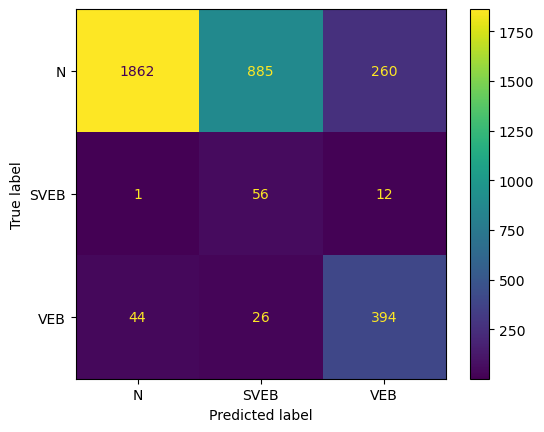

Fold 44:
  Test:  patient=43
              precision    recall  f1-score   support

         0.0       1.00      0.92      0.96      1672
         1.0       0.07      0.76      0.14        17
         2.0       1.00      0.95      0.98       727

    accuracy                           0.93      2416
   macro avg       0.69      0.88      0.69      2416
weighted avg       0.99      0.93      0.96      2416

                   0.0        1.0         2.0  accuracy    macro avg  \
precision     0.996129   0.074713    1.000000  0.930877     0.690281   
recall        0.923445   0.764706    0.951857  0.930877     0.880003   
f1-score      0.958411   0.136126    0.975335  0.930877     0.689957   
support    1672.000000  17.000000  727.000000  0.930877  2416.000000   

           weighted avg  
precision      0.990810  
recall         0.930877  
f1-score       0.957718  
support     2416.000000  


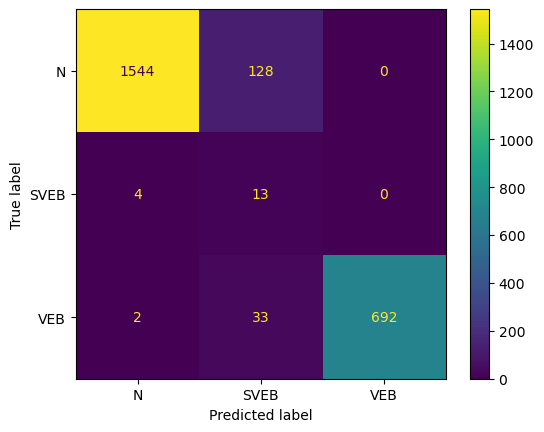

Fold 45:
  Test:  patient=44
              precision    recall  f1-score   support

         0.0       0.95      0.91      0.93      1873
         1.0       0.71      0.60      0.65       569
         2.0       0.13      0.96      0.23        27

    accuracy                           0.84      2469
   macro avg       0.60      0.82      0.60      2469
weighted avg       0.89      0.84      0.86      2469

                   0.0         1.0        2.0  accuracy    macro avg  \
precision     0.948132    0.714583   0.132653  0.837991     0.598456   
recall        0.907635    0.602812   0.962963  0.837991     0.824470   
f1-score      0.927441    0.653956   0.233184  0.837991     0.604860   
support    1873.000000  569.000000  27.000000  0.837991  2469.000000   

           weighted avg  
precision      0.885391  
recall         0.837991  
f1-score       0.856822  
support     2469.000000  


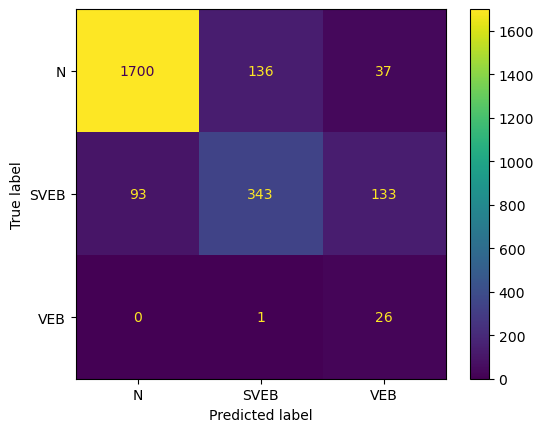

Fold 46:
  Test:  patient=45
              precision    recall  f1-score   support

         0.0       0.99      0.78      0.88      2133
         1.0       0.04      0.77      0.08        26
         2.0       0.29      0.52      0.38        23

    accuracy                           0.78      2182
   macro avg       0.44      0.69      0.44      2182
weighted avg       0.97      0.78      0.86      2182

                   0.0        1.0        2.0  accuracy    macro avg  \
precision     0.992866   0.043573   0.292683  0.780018     0.443041   
recall        0.782935   0.769231   0.521739  0.780018     0.691302   
f1-score      0.875491   0.082474   0.375000  0.780018     0.444322   
support    2133.000000  26.000000  23.000000  0.780018  2182.000000   

           weighted avg  
precision      0.974174  
recall         0.780018  
f1-score       0.860767  
support     2182.000000  


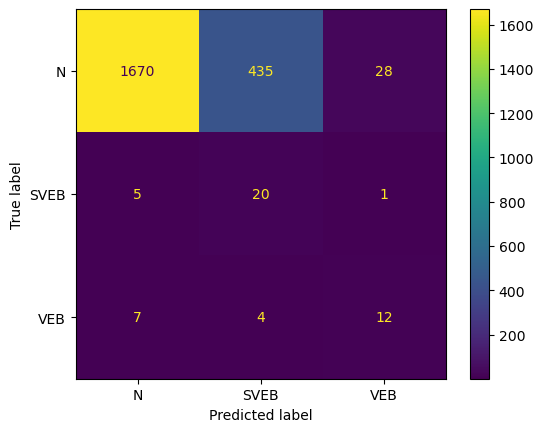

Fold 47:
  Test:  patient=46
              precision    recall  f1-score   support

         0.0       1.00      0.92      0.96      2560
         1.0       0.56      0.65      0.61       321
         2.0       0.58      0.89      0.70       240

    accuracy                           0.89      3121
   macro avg       0.71      0.82      0.76      3121
weighted avg       0.92      0.89      0.90      3121

                   0.0         1.0         2.0  accuracy    macro avg  \
precision     0.995374    0.564516    0.576819  0.894265     0.712237   
recall        0.924609    0.654206    0.891667  0.894265     0.823494   
f1-score      0.958688    0.606061    0.700491  0.894265     0.755080   
support    2560.000000  321.000000  240.000000  0.894265  3121.000000   

           weighted avg  
precision      0.918874  
recall         0.894265  
f1-score       0.902565  
support     3121.000000  


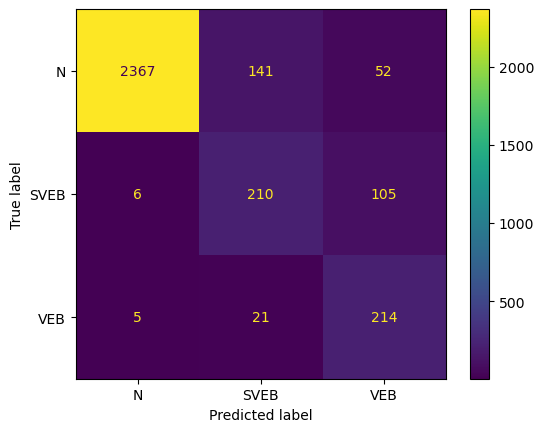

Fold 48:
  Test:  patient=47
              precision    recall  f1-score   support

         0.0       0.99      0.96      0.98      1742
         1.0       0.15      1.00      0.26        19
         2.0       0.92      0.46      0.62       132

    accuracy                           0.93      1893
   macro avg       0.69      0.81      0.62      1893
weighted avg       0.98      0.93      0.94      1893

                   0.0        1.0         2.0  accuracy    macro avg  \
precision     0.989988   0.147287    0.924242  0.930269     0.687172   
recall        0.964983   1.000000    0.462121  0.930269     0.809035   
f1-score      0.977326   0.256757    0.616162  0.930269     0.616748   
support    1742.000000  19.000000  132.000000  0.930269  1893.000000   

           weighted avg  
precision      0.976946  
recall         0.930269  
f1-score       0.944909  
support     1893.000000  


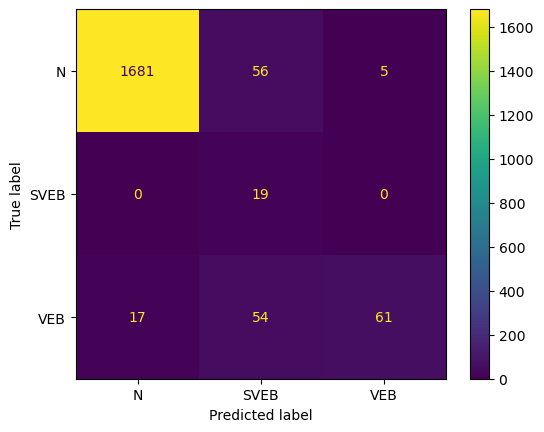

Fold 49:
  Test:  patient=48
              precision    recall  f1-score   support

         0.0       0.61      0.82      0.70      1101
         1.0       0.95      0.62      0.75      1818
         2.0       0.44      0.92      0.59       234

    accuracy                           0.71      3153
   macro avg       0.67      0.79      0.68      3153
weighted avg       0.79      0.71      0.72      3153

                   0.0          1.0         2.0  accuracy    macro avg  \
precision     0.607843     0.953350    0.436364  0.710117     0.665852   
recall        0.816530     0.618262    0.923077  0.710117     0.785956   
f1-score      0.696899     0.750083    0.592593  0.710117     0.679858   
support    1101.000000  1818.000000  234.000000  0.710117  3153.000000   

           weighted avg  
precision      0.794334  
recall         0.710117  
f1-score       0.719824  
support     3153.000000  


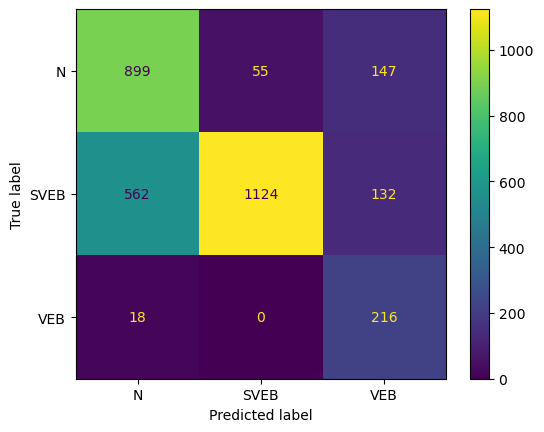

Fold 50:
  Test:  patient=49
              precision    recall  f1-score   support

         0.0       0.91      0.81      0.86      2050
         1.0       0.15      0.67      0.25       167
         2.0       0.63      0.14      0.23       447

    accuracy                           0.69      2664
   macro avg       0.56      0.54      0.44      2664
weighted avg       0.81      0.69      0.71      2664

                   0.0         1.0         2.0  accuracy    macro avg  \
precision     0.907448    0.151762    0.630000  0.687688     0.563070   
recall        0.808293    0.670659    0.140940  0.687688     0.539964   
f1-score      0.855005    0.247514    0.230347  0.687688     0.444289   
support    2050.000000  167.000000  447.000000  0.687688  2664.000000   

           weighted avg  
precision      0.813522  
recall         0.687688  
f1-score       0.712110  
support     2664.000000  


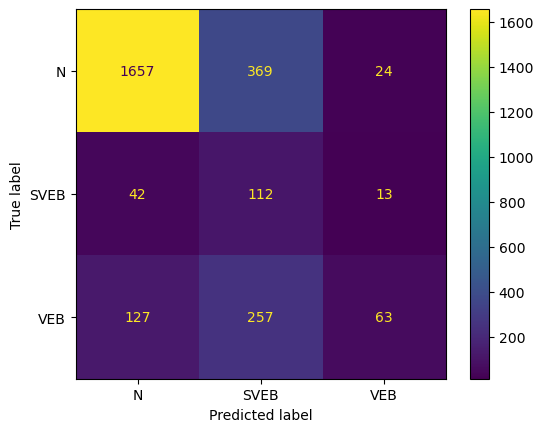

Fold 51:
  Test:  patient=50
              precision    recall  f1-score   support

         0.0       0.95      0.87      0.91      2787
         1.0       0.11      0.13      0.12       136
         2.0       0.03      0.12      0.05        75

    accuracy                           0.82      2998
   macro avg       0.37      0.37      0.36      2998
weighted avg       0.89      0.82      0.85      2998

                   0.0         1.0        2.0  accuracy    macro avg  \
precision     0.948518    0.114650   0.032491  0.820213     0.365220   
recall        0.872623    0.132353   0.120000  0.820213     0.374992   
f1-score      0.908989    0.122867   0.051136  0.820213     0.360997   
support    2787.000000  136.000000  75.000000  0.820213  2998.000000   

           weighted avg  
precision      0.887775  
recall         0.820213  
f1-score       0.851867  
support     2998.000000  


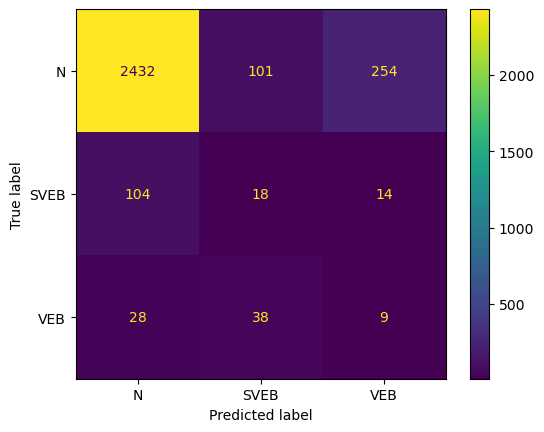

Fold 52:
  Test:  patient=51
              precision    recall  f1-score   support

         0.0       0.93      0.78      0.85      2552
         1.0       0.19      0.77      0.31       227
         2.0       0.50      0.27      0.35       555

    accuracy                           0.69      3334
   macro avg       0.54      0.61      0.50      3334
weighted avg       0.81      0.69      0.73      3334

                   0.0         1.0         2.0  accuracy    macro avg  \
precision     0.932394    0.192265    0.501672  0.692861     0.542111   
recall        0.778213    0.766520    0.270270  0.692861     0.605001   
f1-score      0.848355    0.307420    0.351288  0.692861     0.502355   
support    2552.000000  227.000000  555.000000  0.692861  3334.000000   

           weighted avg  
precision      0.810301  
recall         0.692861  
f1-score       0.728780  
support     3334.000000  


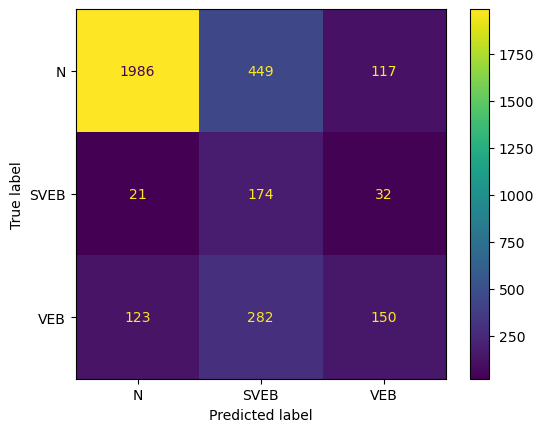

Fold 53:
  Test:  patient=52
              precision    recall  f1-score   support

         0.0       0.86      0.89      0.87      1506
         1.0       0.76      0.48      0.58       631
         2.0       0.10      0.95      0.17        22

    accuracy                           0.77      2159
   macro avg       0.57      0.77      0.54      2159
weighted avg       0.83      0.77      0.78      2159

                   0.0         1.0        2.0  accuracy    macro avg  \
precision     0.863990    0.757576   0.095890  0.766559     0.572485   
recall        0.885790    0.475436   0.954545  0.766559     0.771924   
f1-score      0.874754    0.584226   0.174274  0.766559     0.544418   
support    1506.000000  631.000000  22.000000  0.766559  2159.000000   

           weighted avg  
precision      0.825062  
recall         0.766559  
f1-score       0.782705  
support     2159.000000  


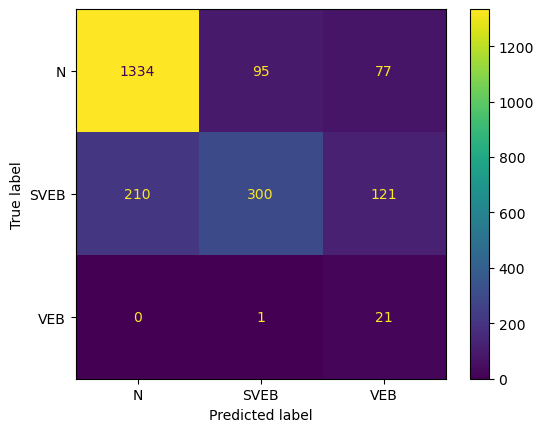

Fold 54:
  Test:  patient=53
              precision    recall  f1-score   support

         0.0       0.97      0.89      0.93      1785
         1.0       0.65      0.83      0.73       454
         2.0       0.90      0.90      0.90       437

    accuracy                           0.88      2676
   macro avg       0.84      0.88      0.85      2676
weighted avg       0.90      0.88      0.89      2676

                   0.0         1.0         2.0  accuracy    macro avg  \
precision     0.965475    0.648973    0.895692  0.884903     0.836713   
recall        0.892997    0.834802    0.903890  0.884903     0.877230   
f1-score      0.927823    0.730250    0.899772  0.884903     0.852615   
support    1785.000000  454.000000  437.000000  0.884903  2676.000000   

           weighted avg  
precision      0.900383  
recall         0.884903  
f1-score       0.889723  
support     2676.000000  


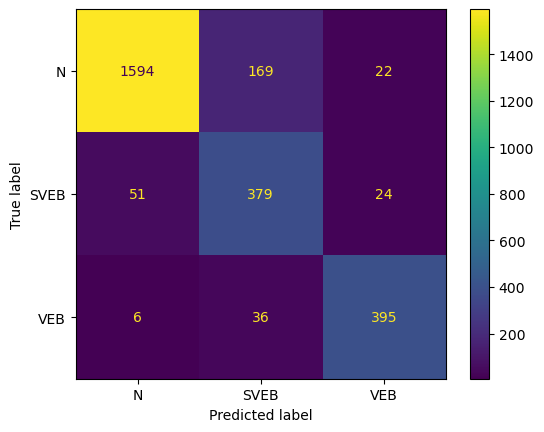

Fold 55:
  Test:  patient=54
              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90      1774
         1.0       0.08      0.92      0.14        12
         2.0       0.04      1.00      0.08         8

    accuracy                           0.82      1794
   macro avg       0.37      0.91      0.37      1794
weighted avg       0.99      0.82      0.89      1794

                   0.0        1.0       2.0  accuracy    macro avg  \
precision     0.999312   0.078014  0.040000  0.819955     0.372442   
recall        0.818489   0.916667  1.000000  0.819955     0.911719   
f1-score      0.899907   0.143791  0.076923  0.819955     0.373540   
support    1774.000000  12.000000  8.000000  0.819955  1794.000000   

           weighted avg  
precision      0.988871  
recall         0.819955  
f1-score       0.891179  
support     1794.000000  


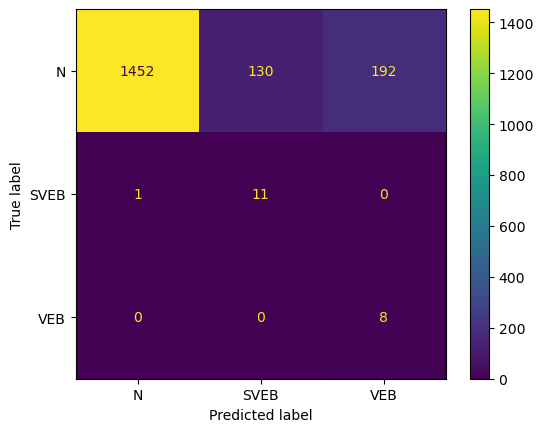

Fold 56:
  Test:  patient=55
              precision    recall  f1-score   support

         0.0       1.00      0.96      0.98      1896
         1.0       0.03      0.22      0.04         9
         2.0       0.88      0.97      0.92        74

    accuracy                           0.96      1979
   macro avg       0.63      0.72      0.65      1979
weighted avg       0.99      0.96      0.97      1979

                   0.0       1.0        2.0  accuracy    macro avg  \
precision     1.000000  0.025000   0.878049  0.955533     0.634350   
recall        0.958333  0.222222   0.972973  0.955533     0.717843   
f1-score      0.978723  0.044944   0.923077  0.955533     0.648915   
support    1896.000000  9.000000  74.000000  0.955533  1979.000000   

           weighted avg  
precision      0.991006  
recall         0.955533  
f1-score       0.972396  
support     1979.000000  


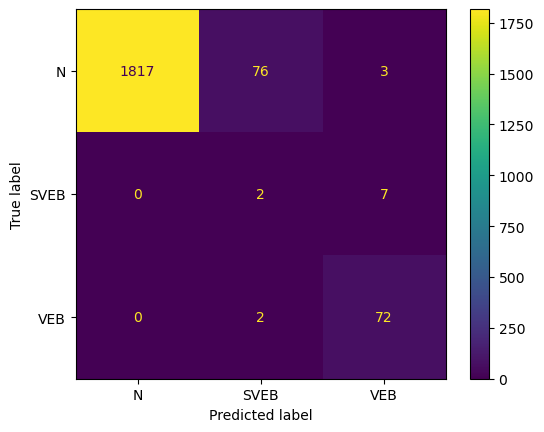

Fold 57:
  Test:  patient=56
              precision    recall  f1-score   support

         0.0       0.99      0.55      0.70      1624
         1.0       0.01      0.73      0.03        15
         2.0       0.13      0.15      0.14        26

    accuracy                           0.54      1665
   macro avg       0.38      0.48      0.29      1665
weighted avg       0.96      0.54      0.69      1665

                   0.0        1.0        2.0  accuracy    macro avg  \
precision     0.985572   0.014986   0.133333  0.542342     0.377964   
recall        0.546798   0.733333   0.153846  0.542342     0.477993   
f1-score      0.703366   0.029372   0.142857  0.542342     0.291865   
support    1624.000000  15.000000  26.000000  0.542342  1665.000000   

           weighted avg  
precision      0.963519  
recall         0.542342  
f1-score       0.688542  
support     1665.000000  


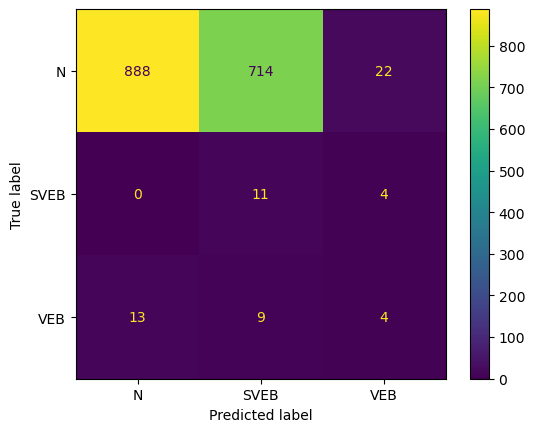

Fold 58:
  Test:  patient=57


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\

              precision    recall  f1-score   support

         0.0       1.00      0.65      0.78      2188
         1.0       0.00      0.00      0.00         9
         2.0       0.05      1.00      0.10        41

    accuracy                           0.65      2238
   macro avg       0.35      0.55      0.29      2238
weighted avg       0.98      0.65      0.77      2238

                   0.0  1.0        2.0  accuracy    macro avg  weighted avg
precision     0.997177  NaN   0.049939  0.649687     0.349039      0.975814
recall        0.645795  0.0   1.000000  0.649687     0.548598      0.649687
f1-score      0.783911  NaN   0.095128  0.649687     0.293013      0.768140
support    2188.000000  9.0  41.000000  0.649687  2238.000000   2238.000000


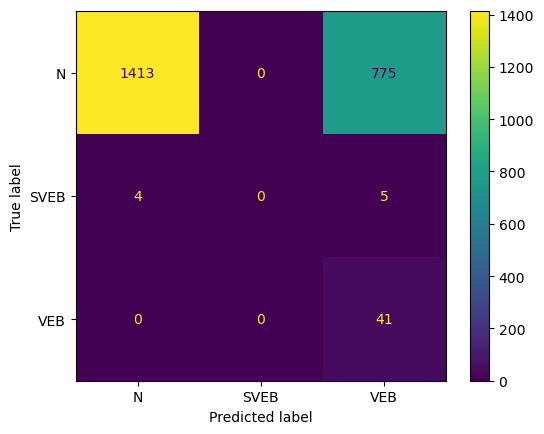

Fold 59:
  Test:  patient=58
              precision    recall  f1-score   support

         0.0       1.00      0.99      0.99      1944
         1.0       0.47      0.88      0.61         8
         2.0       0.84      0.98      0.90        97

    accuracy                           0.99      2049
   macro avg       0.77      0.95      0.84      2049
weighted avg       0.99      0.99      0.99      2049

                   0.0       1.0        2.0  accuracy    macro avg  \
precision     0.999479  0.466667   0.840708  0.986823     0.768951   
recall        0.987654  0.875000   0.979381  0.986823     0.947345   
f1-score      0.993532  0.608696   0.904762  0.986823     0.835663   
support    1944.000000  8.000000  97.000000  0.986823  2049.000000   

           weighted avg  
precision      0.989883  
recall         0.986823  
f1-score       0.987827  
support     2049.000000  


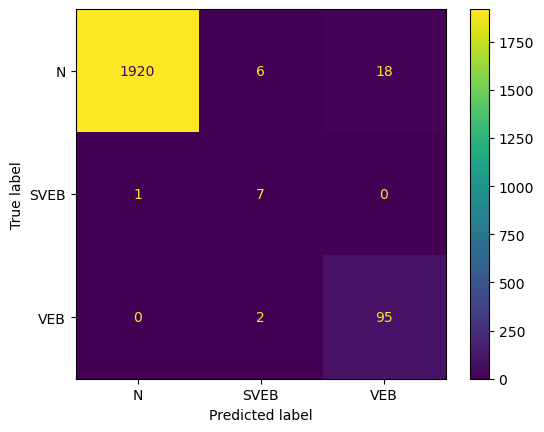

Fold 60:
  Test:  patient=59


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90      2004
         1.0       0.27      0.96      0.42       135
         2.0       0.00      0.00      0.00         0

    accuracy                           0.82      2139
   macro avg       0.42      0.59      0.44      2139
weighted avg       0.95      0.82      0.87      2139

                   0.0         1.0  2.0  accuracy    macro avg  weighted avg
precision     0.998778    0.265432  0.0  0.824684     0.421403      0.952494
recall        0.815868    0.955556  NaN  0.824684     0.590475      0.824684
f1-score      0.898105    0.415459  NaN  0.824684     0.437855      0.867643
support    2004.000000  135.000000  0.0  0.824684  2139.000000   2139.000000


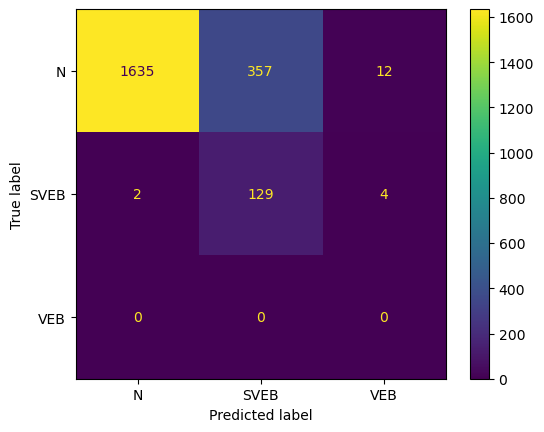

Fold 61:
  Test:  patient=60
              precision    recall  f1-score   support

         0.0       0.99      0.98      0.99      1839
         1.0       0.85      0.90      0.87       196
         2.0       0.00      0.00      0.00         1

    accuracy                           0.97      2036
   macro avg       0.61      0.63      0.62      2036
weighted avg       0.98      0.97      0.97      2036

                   0.0         1.0  2.0  accuracy    macro avg  weighted avg
precision     0.989600    0.846154  0.0   0.97446     0.611918      0.975305
recall        0.983143    0.897959  0.0   0.97446     0.627034      0.974460
f1-score      0.986361    0.871287  0.0   0.97446     0.619216      0.974799
support    1839.000000  196.000000  1.0   0.97446  2036.000000   2036.000000


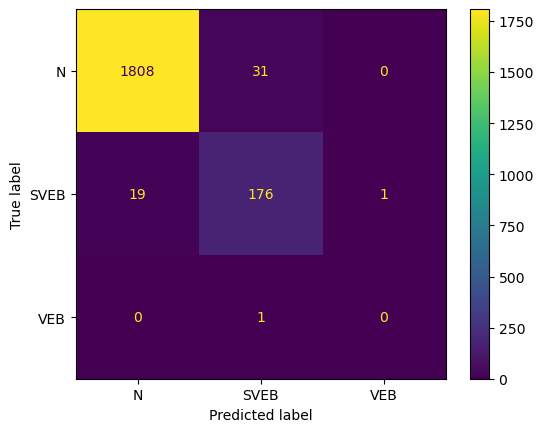

Fold 62:
  Test:  patient=61
              precision    recall  f1-score   support

         0.0       0.99      0.99      0.99      1589
         1.0       0.73      0.81      0.77        64
         2.0       1.00      1.00      1.00       256

    accuracy                           0.98      1909
   macro avg       0.91      0.93      0.92      1909
weighted avg       0.98      0.98      0.98      1909

                   0.0        1.0         2.0  accuracy    macro avg  \
precision     0.993042   0.732394    0.996109  0.983761     0.907182   
recall        0.988043   0.812500    1.000000  0.983761     0.933514   
f1-score      0.990536   0.770370    0.998051  0.983761     0.919652   
support    1589.000000  64.000000  256.000000  0.983761  1909.000000   

           weighted avg  
precision      0.984715  
recall         0.983761  
f1-score       0.984163  
support     1909.000000  


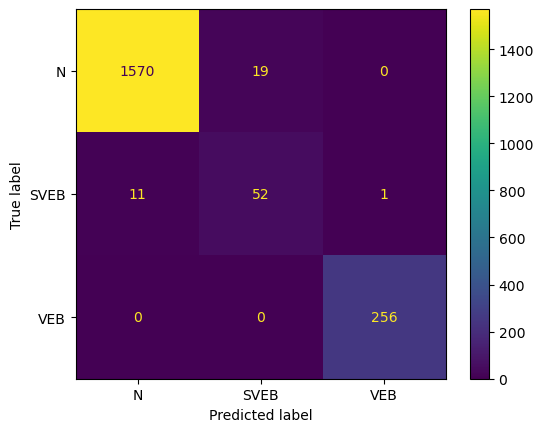

Fold 63:
  Test:  patient=62
              precision    recall  f1-score   support

         0.0       1.00      0.98      0.99      1470
         1.0       0.39      0.98      0.56        48
         2.0       1.00      0.91      0.95       542

    accuracy                           0.96      2060
   macro avg       0.80      0.96      0.83      2060
weighted avg       0.98      0.96      0.97      2060

                   0.0        1.0         2.0  accuracy    macro avg  \
precision     0.999307   0.388430    0.997980  0.963107     0.795239   
recall        0.981633   0.979167    0.911439  0.963107     0.957413   
f1-score      0.990391   0.556213    0.952748  0.963107     0.833118   
support    1470.000000  48.000000  542.000000  0.963107  2060.000000   

           weighted avg  
precision      0.984724  
recall         0.963107  
f1-score       0.970370  
support     2060.000000  


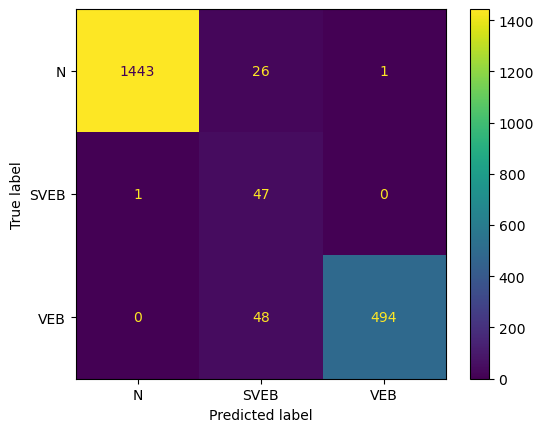

Fold 64:
  Test:  patient=63
              precision    recall  f1-score   support

         0.0       0.99      0.52      0.68      3103
         1.0       0.14      0.73      0.23       241
         2.0       0.21      0.85      0.34       141

    accuracy                           0.55      3485
   macro avg       0.45      0.70      0.42      3485
weighted avg       0.90      0.55      0.64      3485

                   0.0         1.0         2.0  accuracy    macro avg  \
precision     0.989647    0.138801    0.208696   0.55122     0.445715   
recall        0.523687    0.730290    0.851064   0.55122     0.701680   
f1-score      0.684932    0.233267    0.335196   0.55122     0.417798   
support    3103.000000  241.000000  141.000000   0.55122  3485.000000   

           weighted avg  
precision      0.899211  
recall         0.551220  
f1-score       0.639547  
support     3485.000000  


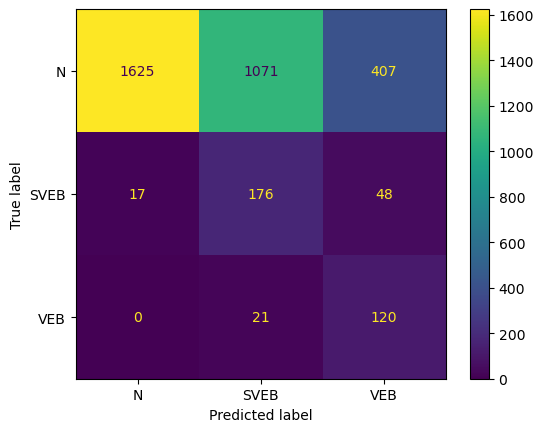

Fold 65:
  Test:  patient=64
              precision    recall  f1-score   support

         0.0       0.79      0.92      0.85      1323
         1.0       0.45      0.19      0.27       628
         2.0       0.41      0.59      0.49       307

    accuracy                           0.68      2258
   macro avg       0.55      0.57      0.54      2258
weighted avg       0.64      0.68      0.64      2258

                   0.0         1.0         2.0  accuracy    macro avg  \
precision     0.790291    0.445255    0.414579  0.675376     0.550042   
recall        0.922902    0.194268    0.592834  0.675376     0.570001   
f1-score      0.851464    0.270510    0.487936  0.675376     0.536637   
support    1323.000000  628.000000  307.000000  0.675376  2258.000000   

           weighted avg  
precision      0.643247  
recall         0.675376  
f1-score       0.640462  
support     2258.000000  


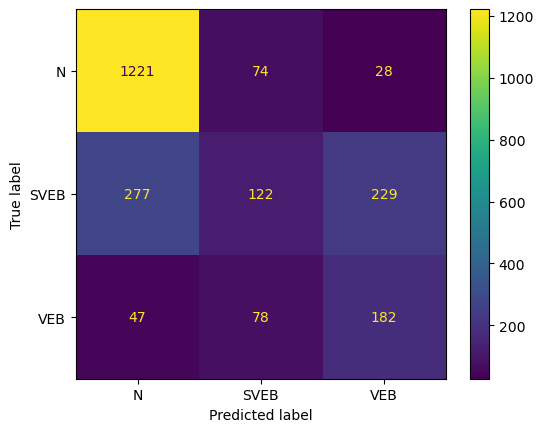

Fold 66:
  Test:  patient=65
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1887
         1.0       0.95      1.00      0.98        41
         2.0       1.00      0.60      0.75         5

    accuracy                           1.00      1933
   macro avg       0.98      0.87      0.91      1933
weighted avg       1.00      1.00      1.00      1933

              0.0        1.0   2.0  accuracy    macro avg  weighted avg
precision     1.0   0.953488  1.00  0.998965     0.984496      0.999013
recall        1.0   1.000000  0.60  0.998965     0.866667      0.998965
f1-score      1.0   0.976190  0.75  0.998965     0.908730      0.998848
support    1887.0  41.000000  5.00  0.998965  1933.000000   1933.000000


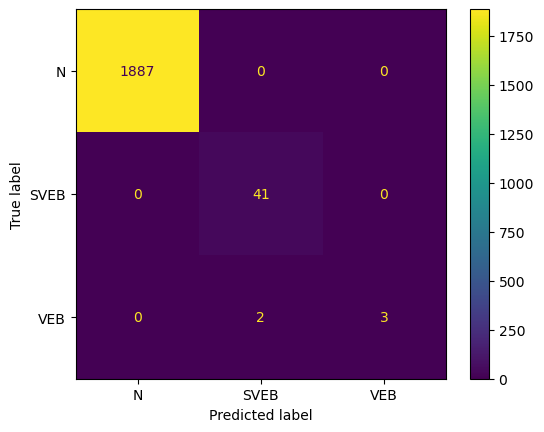

Fold 67:
  Test:  patient=66
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1771
         1.0       0.91      1.00      0.95        40
         2.0       1.00      0.71      0.83         7

    accuracy                           1.00      1818
   macro avg       0.97      0.90      0.93      1818
weighted avg       1.00      1.00      1.00      1818

                   0.0        1.0       2.0  accuracy    macro avg  \
precision     1.000000   0.909091  1.000000    0.9978     0.969697   
recall        0.998871   1.000000  0.714286    0.9978     0.904385   
f1-score      0.999435   0.952381  0.833333    0.9978     0.928383   
support    1771.000000  40.000000  7.000000    0.9978  1818.000000   

           weighted avg  
precision       0.99800  
recall          0.99780  
f1-score        0.99776  
support      1818.00000  


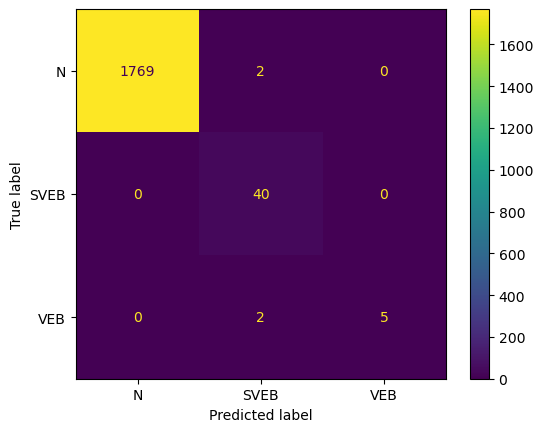

Fold 68:
  Test:  patient=67
              precision    recall  f1-score   support

         0.0       1.00      0.87      0.93      2484
         1.0       0.14      0.83      0.24        53
         2.0       0.86      0.99      0.92       343

    accuracy                           0.88      2880
   macro avg       0.66      0.90      0.69      2880
weighted avg       0.97      0.88      0.92      2880

                   0.0        1.0         2.0  accuracy    macro avg  \
precision     0.998151   0.137500    0.856423  0.882986     0.664025   
recall        0.869163   0.830189    0.991254  0.882986     0.896868   
f1-score      0.929202   0.235925    0.918919  0.882986     0.694682   
support    2484.000000  53.000000  343.000000  0.882986  2880.000000   

           weighted avg  
precision      0.965433  
recall         0.882986  
f1-score       0.915219  
support     2880.000000  


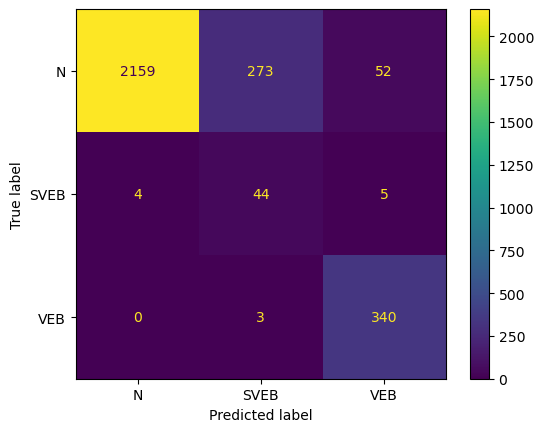

Fold 69:
  Test:  patient=68
              precision    recall  f1-score   support

         0.0       0.92      0.97      0.94      1505
         1.0       0.83      0.66      0.74       399
         2.0       0.69      0.65      0.67        54

    accuracy                           0.90      1958
   macro avg       0.81      0.76      0.78      1958
weighted avg       0.89      0.90      0.89      1958

                   0.0         1.0        2.0  accuracy    macro avg  \
precision     0.918342    0.834921   0.686275  0.898876     0.813179   
recall        0.971429    0.659148   0.648148  0.898876     0.759575   
f1-score      0.944139    0.736695   0.666667  0.898876     0.782500   
support    1505.000000  399.000000  54.000000  0.898876  1958.000000   

           weighted avg  
precision      0.894942  
recall         0.898876  
f1-score       0.894214  
support     1958.000000  


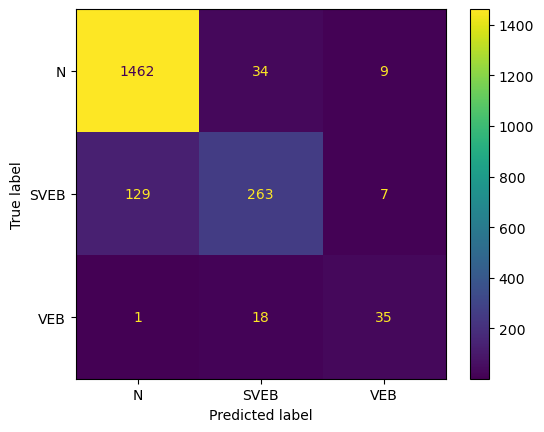

Fold 70:
  Test:  patient=69
              precision    recall  f1-score   support

         0.0       1.00      0.80      0.89      2168
         1.0       0.01      0.04      0.01        26
         2.0       0.07      0.78      0.13        27

    accuracy                           0.79      2221
   macro avg       0.36      0.54      0.34      2221
weighted avg       0.98      0.79      0.87      2221

                   0.0        1.0        2.0  accuracy    macro avg  \
precision     1.000000   0.005525   0.068852  0.791085     0.358126   
recall        0.800277   0.038462   0.777778  0.791085     0.538839   
f1-score      0.889060   0.009662   0.126506  0.791085     0.341743   
support    2168.000000  26.000000  27.000000  0.791085  2221.000000   

           weighted avg  
precision      0.977039  
recall         0.791085  
f1-score       0.869495  
support     2221.000000  


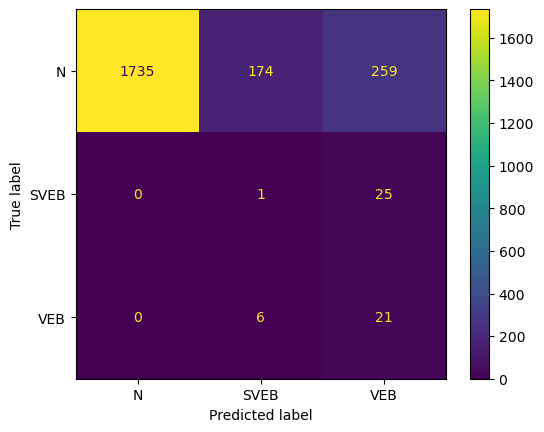

Fold 71:
  Test:  patient=70
              precision    recall  f1-score   support

         0.0       0.98      0.86      0.92      2352
         1.0       0.16      0.64      0.26       125
         2.0       0.68      0.40      0.51       210

    accuracy                           0.82      2687
   macro avg       0.61      0.64      0.56      2687
weighted avg       0.92      0.82      0.85      2687

                   0.0         1.0         2.0  accuracy    macro avg  \
precision     0.979257    0.163599    0.680000  0.816896     0.607619   
recall        0.863095    0.640000    0.404762  0.816896     0.635952   
f1-score      0.917514    0.260586    0.507463  0.816896     0.561854   
support    2352.000000  125.000000  210.000000  0.816896  2687.000000   

           weighted avg  
precision      0.917924  
recall         0.816896  
f1-score       0.854906  
support     2687.000000  


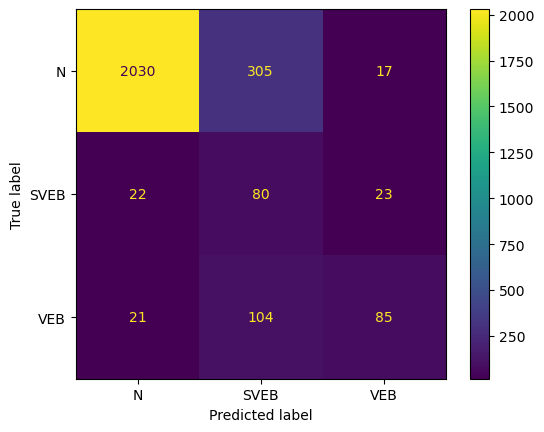

Fold 72:
  Test:  patient=71
              precision    recall  f1-score   support

         0.0       0.99      0.72      0.83      2189
         1.0       0.06      0.62      0.12        68
         2.0       0.34      0.41      0.37        54

    accuracy                           0.71      2311
   macro avg       0.46      0.58      0.44      2311
weighted avg       0.95      0.71      0.80      2311

                   0.0        1.0        2.0  accuracy    macro avg  \
precision     0.990536   0.063540   0.338462  0.707053     0.464179   
recall        0.717222   0.617647   0.407407  0.707053     0.580759   
f1-score      0.832008   0.115226   0.369748  0.707053     0.438994   
support    2189.000000  68.000000  54.000000  0.707053  2311.000000   

           weighted avg  
precision      0.948023  
recall         0.707053  
f1-score       0.800116  
support     2311.000000  


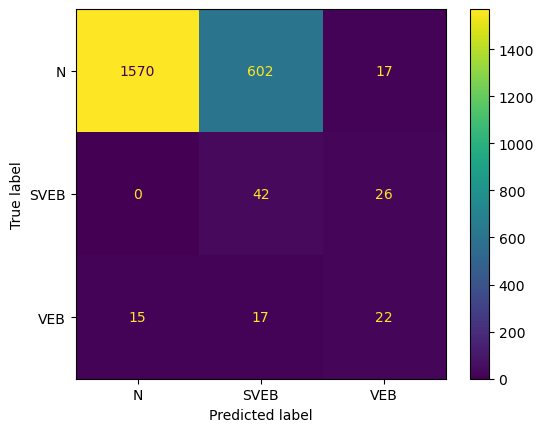

Fold 73:
  Test:  patient=72
              precision    recall  f1-score   support

         0.0       0.97      0.98      0.97      1464
         1.0       0.73      0.66      0.69       152
         2.0       0.86      0.87      0.86        91

    accuracy                           0.94      1707
   macro avg       0.85      0.83      0.84      1707
weighted avg       0.94      0.94      0.94      1707

                   0.0         1.0        2.0  accuracy    macro avg  \
precision     0.968200    0.729927   0.858696  0.943175     0.852274   
recall        0.977459    0.657895   0.868132  0.943175     0.834495   
f1-score      0.972808    0.692042   0.863388  0.943175     0.842746   
support    1464.000000  152.000000  91.000000  0.943175  1707.000000   

           weighted avg  
precision      0.941146  
recall         0.943175  
f1-score       0.941974  
support     1707.000000  


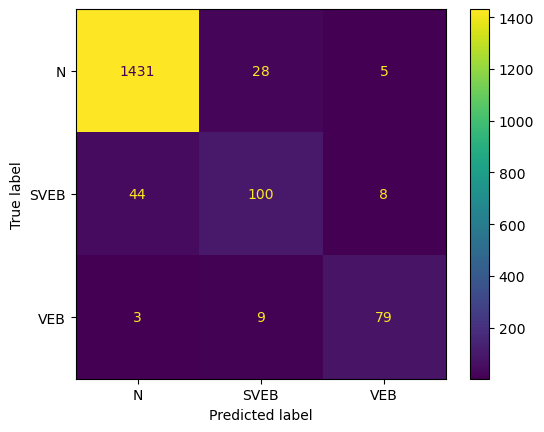

Fold 74:
  Test:  patient=73
              precision    recall  f1-score   support

         0.0       0.99      0.54      0.70      2001
         1.0       0.27      0.05      0.09        74
         2.0       0.08      0.85      0.14        97

    accuracy                           0.54      2172
   macro avg       0.44      0.48      0.31      2172
weighted avg       0.93      0.54      0.66      2172

                   0.0        1.0        2.0  accuracy    macro avg  \
precision     0.990868   0.266667   0.077213  0.539134     0.444916   
recall        0.542229   0.054054   0.845361  0.539134     0.480548   
f1-score      0.700904   0.089888   0.141501  0.539134     0.310764   
support    2001.000000  74.000000  97.000000  0.539134  2172.000000   

           weighted avg  
precision      0.925391  
recall         0.539134  
f1-score       0.655105  
support     2172.000000  


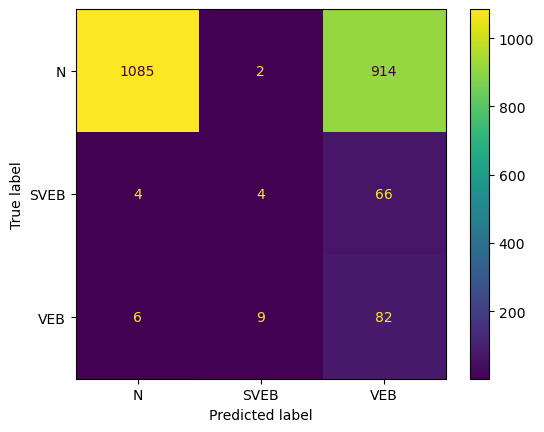

Fold 75:
  Test:  patient=74
              precision    recall  f1-score   support

         0.0       0.96      0.66      0.78      2120
         1.0       0.26      0.83      0.39       277
         2.0       0.19      0.24      0.21       207

    accuracy                           0.65      2604
   macro avg       0.47      0.58      0.46      2604
weighted avg       0.83      0.65      0.70      2604

                   0.0         1.0         2.0  accuracy    macro avg  \
precision     0.960959    0.259343    0.191571  0.645929     0.470624   
recall        0.661792    0.826715    0.241546  0.645929     0.576684   
f1-score      0.783799    0.394828    0.213675  0.645929     0.464101   
support    2120.000000  277.000000  207.000000  0.645929  2604.000000   

           weighted avg  
precision      0.825164  
recall         0.645929  
f1-score       0.697101  
support     2604.000000  


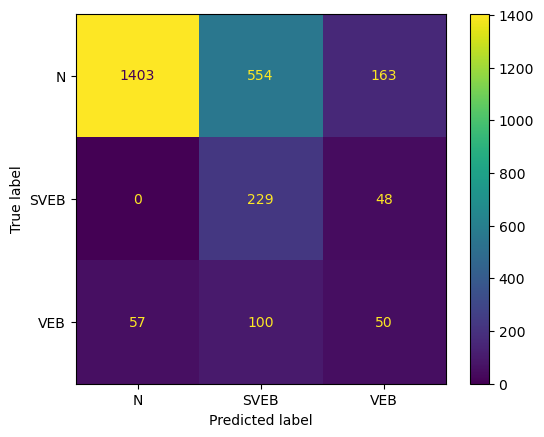

Fold 76:
  Test:  patient=75
              precision    recall  f1-score   support

         0.0       0.97      0.95      0.96      1740
         1.0       0.82      0.84      0.83       523
         2.0       0.92      0.96      0.94       577

    accuracy                           0.93      2840
   macro avg       0.91      0.92      0.91      2840
weighted avg       0.94      0.93      0.93      2840

                   0.0         1.0         2.0  accuracy    macro avg  \
precision     0.974118    0.819703    0.921927  0.933803     0.905249   
recall        0.951724    0.843212    0.961872  0.933803     0.918936   
f1-score      0.962791    0.831291    0.941476  0.933803     0.911853   
support    1740.000000  523.000000  577.000000  0.933803  2840.000000   

           weighted avg  
precision      0.935078  
recall         0.933803  
f1-score       0.934244  
support     2840.000000  


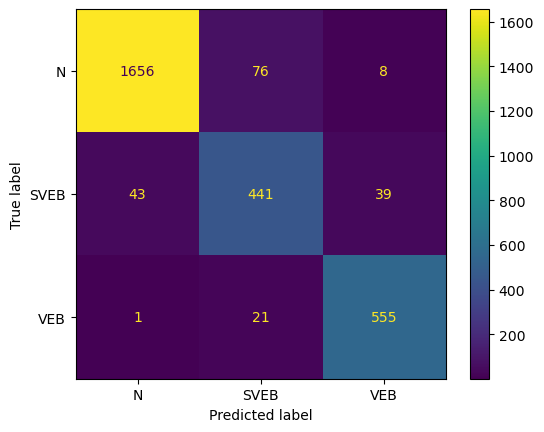

Fold 77:
  Test:  patient=76


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       1.00      0.82      0.90      2188
         1.0       0.00      0.00      0.00         0
         2.0       0.67      0.93      0.78       338

    accuracy                           0.84      2526
   macro avg       0.56      0.58      0.56      2526
weighted avg       0.95      0.84      0.89      2526

                   0.0  1.0         2.0  accuracy    macro avg  weighted avg
precision     0.998890  0.0    0.667377    0.8365     0.555423      0.954531
recall        0.822669  NaN    0.926036    0.8365     0.582902      0.836500
f1-score      0.902256  NaN    0.775713    0.8365     0.559323      0.885323
support    2188.000000  0.0  338.000000    0.8365  2526.000000   2526.000000


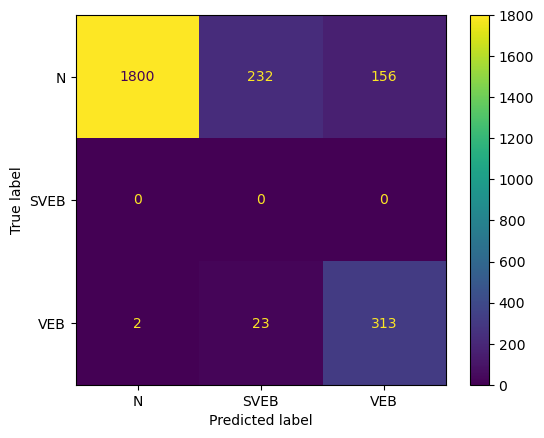

Fold 78:
  Test:  patient=77
              precision    recall  f1-score   support

         0.0       0.99      0.36      0.53      2211
         1.0       0.10      0.39      0.16        80
         2.0       0.04      0.89      0.07        53

    accuracy                           0.37      2344
   macro avg       0.38      0.55      0.25      2344
weighted avg       0.94      0.37      0.51      2344

                   0.0        1.0        2.0  accuracy    macro avg  \
precision     0.992547   0.099042   0.038336  0.374147     0.376641   
recall        0.361375   0.387500   0.886792  0.374147     0.545222   
f1-score      0.529841   0.157761   0.073495  0.374147     0.253699   
support    2211.000000  80.000000  53.000000  0.374147  2344.000000   

           weighted avg  
precision      0.940476  
recall         0.374147  
f1-score       0.506823  
support     2344.000000  


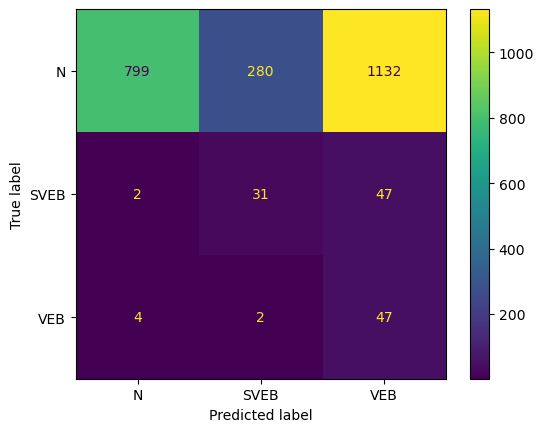

C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\numpy\core\fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\numpy\core\_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [68]:
X=df_sup.drop('type',axis=1)
y=df_sup['type']
groups=df_sup['patient']
skf = LeaveOneGroupOut()


start_time=time.time()
df_PCA_sup, acc_PCA_sup,confusion_matrix_final_PCA_sup,list_sup_PCA = cross_valid(pipe_smote_PCA, skf, X, y,groups)
end_time=time.time()

In [70]:
df_PCA_sup

,0.0,1.0,2.0,macro avg,weighted avg
f1-score,0.911202,0.376924,0.448321,0.548076,0.877209
precision,0.970536,0.342416,0.394661,0.567741,0.940488
recall,0.874591,0.632105,0.608236,0.662879,0.848021
support,2079.423077,156.333333,127.397436,2363.153846,2363.153846


In [81]:
list_normal=retrieve_fscore_avg(list_f1score_sup)
list_smote=retrieve_fscore_avg(list_sup_PCA)
wilcoxon(list_normal, list_smote)

WilcoxonResult(statistic=916.0, pvalue=0.001867836477414477)

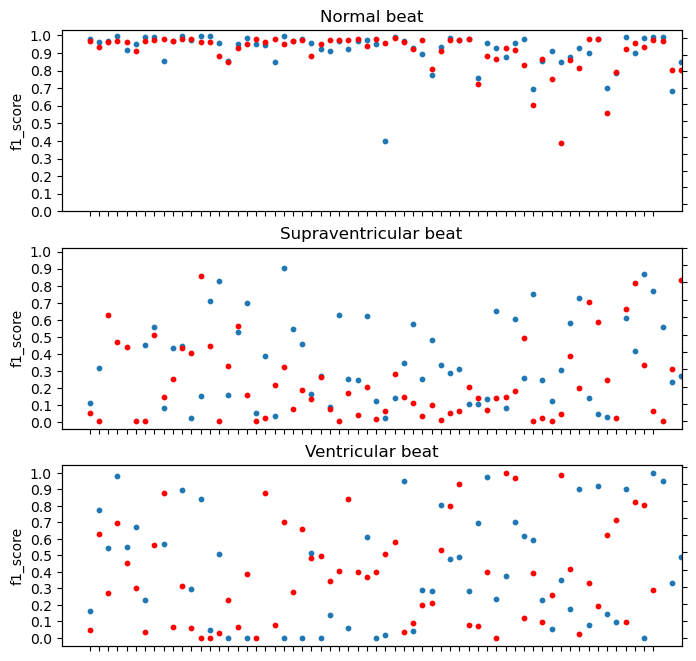

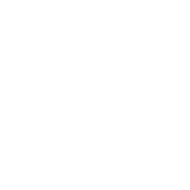

In [82]:
compare_plots(list_f1score_sup,list_sup_PCA)

# Sudden Cardiac Death Holter Database

In [72]:
df4=pd.read_csv('C:/Users/matte/DataMiningJupyter/projectDM/datasets/starting_dataset/Sudden Cardiac Death Holter Database.csv',dtype={"record": "string"})

C:\Users\matte\AppData\Local\Temp\ipykernel_29040\1018658203.py:1: DtypeWarning: Columns (1) have mixed types. Specify dtype option on import or set low_memory=False.
  df4=pd.read_csv('C:/Users/matte/DataMiningJupyter/projectDM/datasets/starting_dataset/Sudden Cardiac Death Holter Database.csv',dtype={"record": "string"})


In [73]:
df4['type'].value_counts()

N       403528
VEB      14723
Q         6520
SVEB      1609
F          211
Name: type, dtype: int64

In [75]:
df_sudden=preprocessed_dataset(df4)

In [76]:
df_sudden['type'].value_counts()

0.0    238887
2.0     11266
1.0      1570
Name: type, dtype: int64

Fold 1:
  Test:  patient=0
              precision    recall  f1-score   support

         0.0       1.00      0.38      0.55       210
         2.0       0.02      1.00      0.04         3

    accuracy                           0.38       213
   macro avg       0.51      0.69      0.30       213
weighted avg       0.99      0.38      0.54       213

                  0.0       2.0  accuracy   macro avg  weighted avg
precision    1.000000  0.022388  0.384977    0.511194      0.986231
recall       0.376190  1.000000  0.384977    0.688095      0.384977
f1-score     0.546713  0.043796  0.384977    0.295254      0.539629
support    210.000000  3.000000  0.384977  213.000000    213.000000


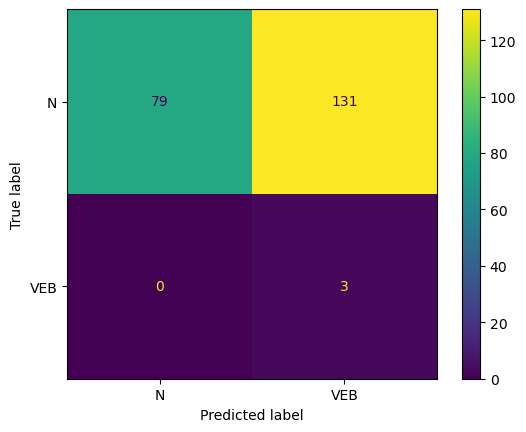

Fold 2:
  Test:  patient=1


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\

              precision    recall  f1-score   support

         0.0       0.92      0.89      0.90     56792
         1.0       0.00      0.00      0.00      1530
         2.0       0.15      0.29      0.20      4060

    accuracy                           0.83     62382
   macro avg       0.36      0.39      0.37     62382
weighted avg       0.85      0.83      0.84     62382

                    0.0     1.0          2.0  accuracy     macro avg  \
precision      0.921588     NaN     0.152349   0.82527      0.357979   
recall         0.885547     0.0     0.293103   0.82527      0.392884   
f1-score       0.903208     NaN     0.200489   0.82527      0.367899   
support    56792.000000  1530.0  4060.000000   0.82527  62382.000000   

           weighted avg  
precision      0.848921  
recall         0.825270  
f1-score       0.835321  
support    62382.000000  


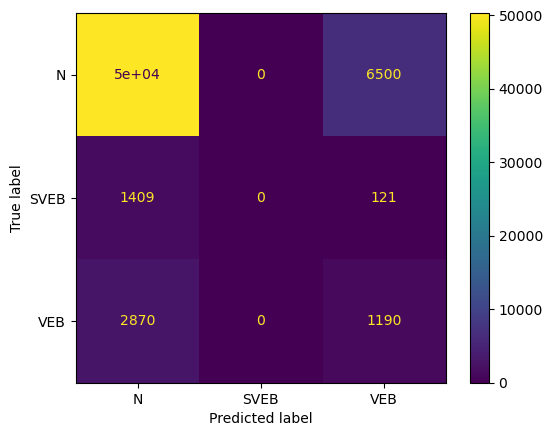

Fold 3:
  Test:  patient=2
              precision    recall  f1-score   support

         0.0       1.00      0.94      0.97     18041
         1.0       0.00      0.00      0.00         5
         2.0       0.01      0.46      0.02        24

    accuracy                           0.94     18070
   macro avg       0.34      0.47      0.33     18070
weighted avg       1.00      0.94      0.97     18070

                    0.0  1.0        2.0  accuracy     macro avg  weighted avg
precision      0.998999  0.0   0.010120  0.939402      0.336373      0.997409
recall         0.940303  0.0   0.458333  0.939402      0.466212      0.939402
f1-score       0.968762  0.0   0.019802  0.939402      0.329521      0.967234
support    18041.000000  5.0  24.000000  0.939402  18070.000000  18070.000000


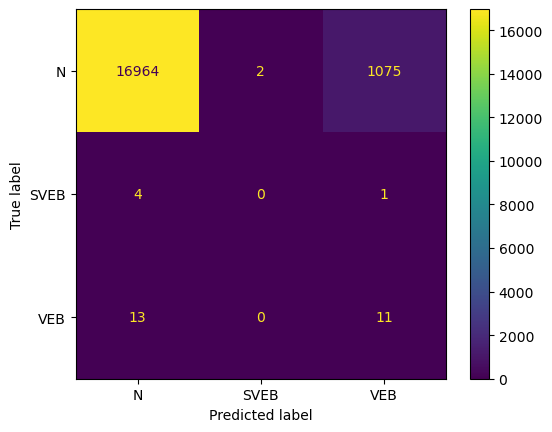

Fold 4:
  Test:  patient=3
              precision    recall  f1-score   support

         0.0       1.00      0.99      0.99     25232
         2.0       0.05      0.42      0.08        33

    accuracy                           0.99     25265
   macro avg       0.52      0.71      0.54     25265
weighted avg       1.00      0.99      0.99     25265

                    0.0        2.0  accuracy     macro avg  weighted avg
precision      0.999239   0.046980  0.988007      0.523109      0.997995
recall         0.988744   0.424242  0.988007      0.706493      0.988007
f1-score       0.993964   0.084592  0.988007      0.539278      0.992776
support    25232.000000  33.000000  0.988007  25265.000000  25265.000000


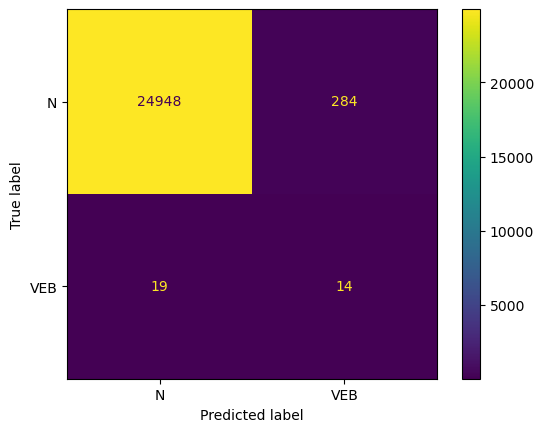

Fold 5:
  Test:  patient=4


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       1.00      0.70      0.82        66
         1.0       0.00      0.00      0.00         0
         2.0       0.00      0.00      0.00         0

    accuracy                           0.70        66
   macro avg       0.33      0.23      0.27        66
weighted avg       1.00      0.70      0.82        66

                 0.0  1.0  2.0  accuracy  macro avg  weighted avg
precision   1.000000  0.0  0.0   0.69697   0.333333      1.000000
recall      0.696970  NaN  NaN   0.69697   0.232323      0.696970
f1-score    0.821429  NaN  NaN   0.69697   0.273810      0.821429
support    66.000000  0.0  0.0   0.69697  66.000000     66.000000


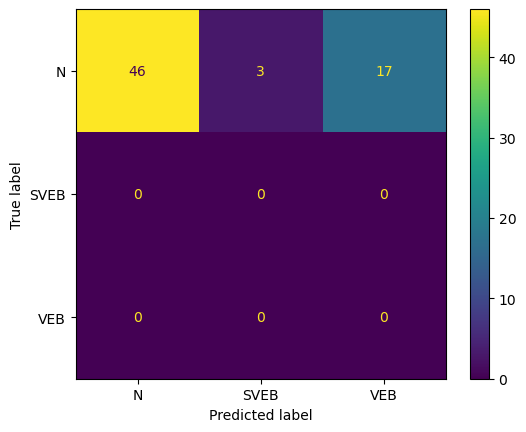

Fold 6:
  Test:  patient=5


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       0.98      0.97      0.97     20894
         1.0       0.00      0.00      0.00         0
         2.0       0.65      0.67      0.66      1538

    accuracy                           0.95     22432
   macro avg       0.54      0.55      0.55     22432
weighted avg       0.95      0.95      0.95     22432

                    0.0  1.0          2.0  accuracy     macro avg  \
precision      0.975800  0.0     0.653190   0.95025      0.542997   
recall         0.970709  NaN     0.672302   0.95025      0.547670   
f1-score       0.973248  NaN     0.662608   0.95025      0.545285   
support    20894.000000  0.0  1538.000000   0.95025  22432.000000   

           weighted avg  
precision      0.953681  
recall         0.950250  
f1-score       0.951950  
support    22432.000000  


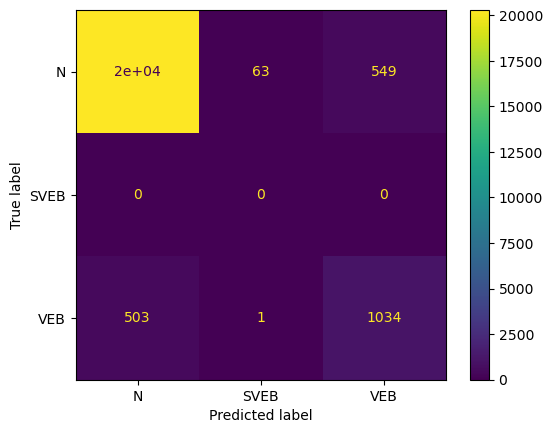

Fold 7:
  Test:  patient=6


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       0.95      0.76      0.84     14088
         1.0       0.00      0.00      0.00         0
         2.0       0.04      0.18      0.06       658

    accuracy                           0.73     14746
   macro avg       0.33      0.31      0.30     14746
weighted avg       0.91      0.73      0.81     14746

                    0.0  1.0         2.0  accuracy     macro avg  weighted avg
precision      0.951683  0.0    0.036268  0.730571      0.329317      0.910836
recall         0.756388  NaN    0.177812  0.730571      0.311400      0.730571
f1-score       0.842871  NaN    0.060247  0.730571      0.301039      0.807949
support    14088.000000  0.0  658.000000  0.730571  14746.000000  14746.000000


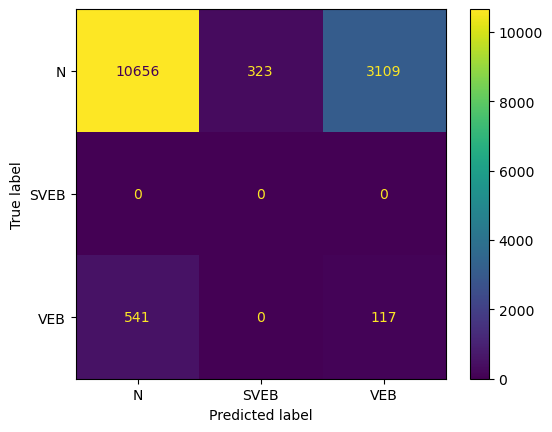

Fold 8:
  Test:  patient=7


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\

              precision    recall  f1-score   support

         0.0       0.93      1.00      0.96      3548
         1.0       0.00      0.00      0.00        11
         2.0       0.92      0.31      0.47       361

    accuracy                           0.93      3920
   macro avg       0.62      0.44      0.48      3920
weighted avg       0.93      0.93      0.92      3920

                   0.0   1.0         2.0  accuracy    macro avg  weighted avg
precision     0.932052   NaN    0.918699  0.931633     0.616917      0.928207
recall        0.997463   0.0    0.313019  0.931633     0.436828      0.931633
f1-score      0.963649   NaN    0.466942  0.931633     0.476864      0.915202
support    3548.000000  11.0  361.000000  0.931633  3920.000000   3920.000000


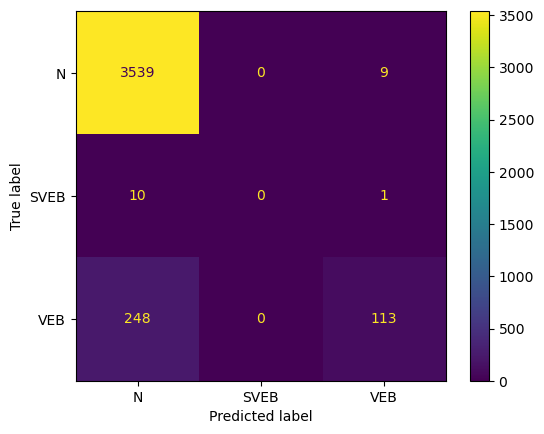

Fold 9:
  Test:  patient=8


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       0.92      0.88      0.90     14681
         1.0       0.00      0.00      0.00         0
         2.0       0.27      0.35      0.30      1835

    accuracy                           0.82     16516
   macro avg       0.40      0.41      0.40     16516
weighted avg       0.85      0.82      0.83     16516

                    0.0  1.0          2.0  accuracy     macro avg  \
precision      0.919169  0.0     0.267335  0.820901      0.395501   
recall         0.879913  NaN     0.348774  0.820901      0.409562   
f1-score       0.899113  NaN     0.302672  0.820901      0.400595   
support    14681.000000  0.0  1835.000000  0.820901  16516.000000   

           weighted avg  
precision      0.846747  
recall         0.820901  
f1-score       0.832845  
support    16516.000000  


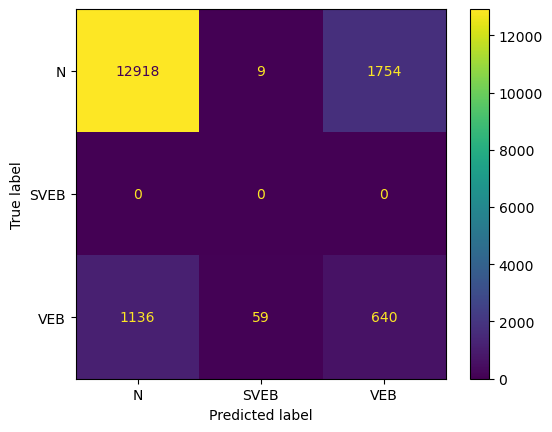

Fold 10:
  Test:  patient=9
              precision    recall  f1-score   support

         0.0       0.98      0.61      0.75     79883
         1.0       0.00      0.00      0.00        23
         2.0       0.05      0.55      0.08      2689

    accuracy                           0.61     82595
   macro avg       0.34      0.39      0.28     82595
weighted avg       0.95      0.61      0.73     82595

                    0.0   1.0          2.0  accuracy     macro avg  \
precision      0.975732   0.0     0.045988  0.612337      0.340573   
recall         0.614549   0.0     0.551878  0.612337      0.388809   
f1-score       0.754125   0.0     0.084902  0.612337      0.279675   
support    79883.000000  23.0  2689.000000  0.612337  82595.000000   

           weighted avg  
precision      0.945191  
recall         0.612337  
f1-score       0.732127  
support    82595.000000  


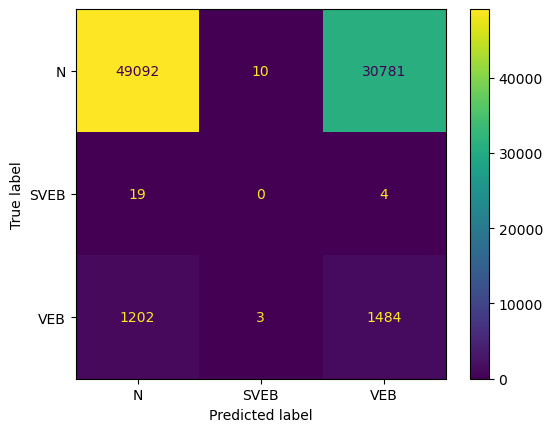

Fold 11:
  Test:  patient=10


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\

              precision    recall  f1-score   support

         0.0       0.99      0.98      0.99      5452
         1.0       0.00      0.00      0.00         1
         2.0       0.17      0.37      0.23        65

    accuracy                           0.97      5518
   macro avg       0.39      0.45      0.41      5518
weighted avg       0.98      0.97      0.98      5518

                   0.0  1.0        2.0  accuracy    macro avg  weighted avg
precision     0.992189  NaN   0.170213  0.971185     0.387467      0.982327
recall        0.978540  0.0   0.369231  0.971185     0.449257      0.971185
f1-score      0.985317  NaN   0.233010  0.971185     0.406109      0.976277
support    5452.000000  1.0  65.000000  0.971185  5518.000000   5518.000000


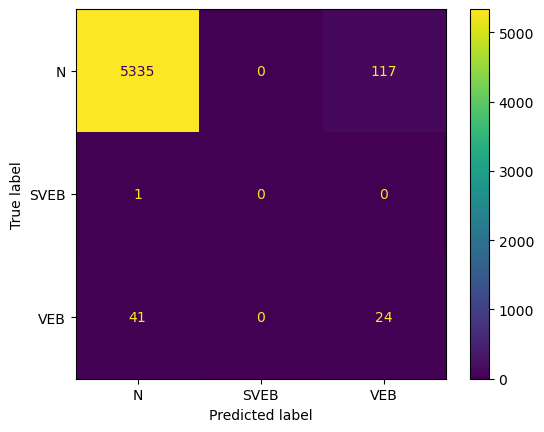

C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\numpy\core\fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\numpy\core\_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [77]:
from sklearn.model_selection import LeaveOneGroupOut
import time
X=df_sudden.drop('type',axis=1)
y=df_sudden['type']
groups=df_sudden['patient']
skf = LeaveOneGroupOut()


start_time=time.time()
df_normal_sudden, acc_normal_sudden,confusion_matrix_final_sudden,list_f1score_sudden = cross_valid(pipe_normal, skf, X, y,groups)
end_time=time.time()

In [78]:
df_normal_sudden

,0.0,2.0,macro avg,weighted avg,1.0
f1-score,0.877491,0.215906,0.383212,0.852067,0.000000
precision,0.969677,0.211230,0.424978,0.945231,0.000000
recall,0.825938,0.460869,0.457230,0.804682,0.000000
support,21717.000000,1024.181818,22883.909091,22883.909091,174.444444


Fold 1:
  Test:  patient=0


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       1.00      0.03      0.06       210
         1.0       0.00      0.00      0.00         0
         2.0       0.01      1.00      0.03         3

    accuracy                           0.04       213
   macro avg       0.34      0.34      0.03       213
weighted avg       0.99      0.04      0.06       213

                  0.0  1.0       2.0  accuracy   macro avg  weighted avg
precision    1.000000  0.0  0.014563  0.042254    0.338188      0.986121
recall       0.028571  NaN  1.000000  0.042254    0.342857      0.042254
f1-score     0.055556  NaN  0.028708  0.042254    0.028088      0.055177
support    210.000000  0.0  3.000000  0.042254  213.000000    213.000000


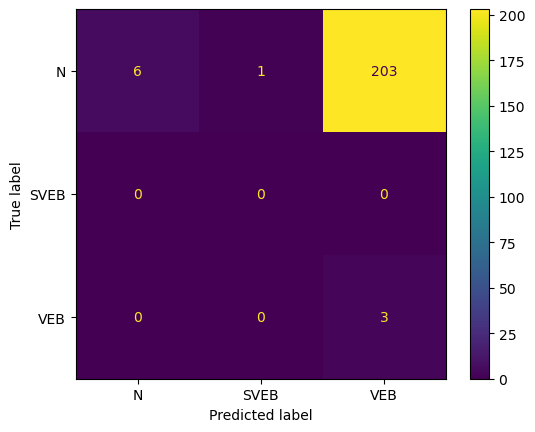

Fold 2:
  Test:  patient=1
              precision    recall  f1-score   support

         0.0       0.95      0.98      0.96     56792
         1.0       0.01      0.01      0.01      1530
         2.0       0.60      0.42      0.49      4060

    accuracy                           0.92     62382
   macro avg       0.52      0.47      0.49     62382
weighted avg       0.90      0.92      0.91     62382

                    0.0          1.0          2.0  accuracy     macro avg  \
precision      0.948563     0.009454     0.602862  0.918743      0.520293   
recall         0.979346     0.005882     0.415025  0.918743      0.466751   
f1-score       0.963709     0.007252     0.491612  0.918743      0.487524   
support    56792.000000  1530.000000  4060.000000  0.918743  62382.000000   

           weighted avg  
precision      0.903031  
recall         0.918743  
f1-score       0.909525  
support    62382.000000  


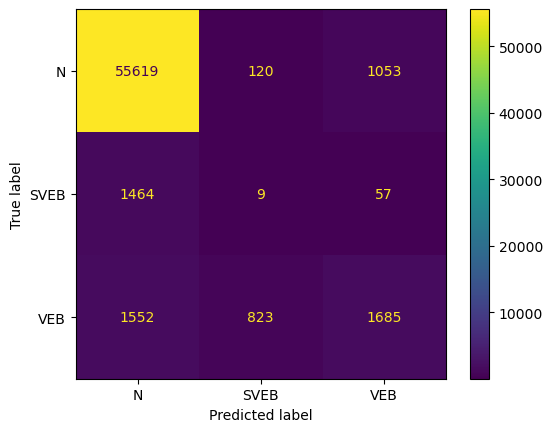

Fold 3:
  Test:  patient=2
              precision    recall  f1-score   support

         0.0       1.00      0.97      0.99     18041
         1.0       0.00      0.40      0.01         5
         2.0       0.64      0.96      0.77        24

    accuracy                           0.97     18070
   macro avg       0.55      0.78      0.59     18070
weighted avg       1.00      0.97      0.99     18070

                    0.0       1.0        2.0  accuracy     macro avg  \
precision      0.999943  0.004073   0.638889  0.972164      0.547635   
recall         0.972341  0.400000   0.958333  0.972164      0.776891   
f1-score       0.985949  0.008065   0.766667  0.972164      0.586893   
support    18041.000000  5.000000  24.000000  0.972164  18070.000000   

           weighted avg  
precision      0.999188  
recall         0.972164  
f1-score       0.985387  
support    18070.000000  


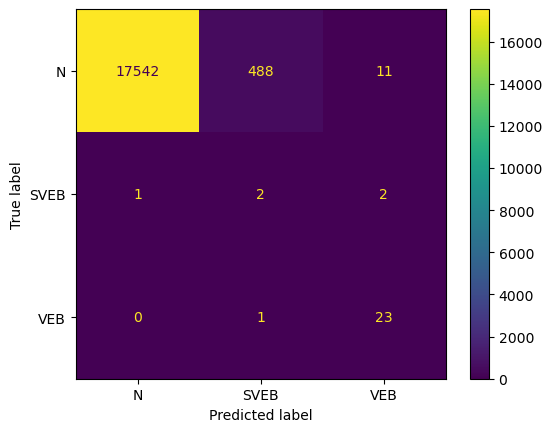

Fold 4:
  Test:  patient=3


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       1.00      0.99      0.99     25232
         1.0       0.00      0.00      0.00         0
         2.0       0.09      0.61      0.15        33

    accuracy                           0.99     25265
   macro avg       0.36      0.53      0.38     25265
weighted avg       1.00      0.99      0.99     25265

                    0.0  1.0        2.0  accuracy     macro avg  weighted avg
precision      0.999480  0.0   0.087719  0.989828      0.362400      0.998289
recall         0.990330  NaN   0.606061  0.989828      0.532130      0.989828
f1-score       0.994884  NaN   0.153257  0.989828      0.382714      0.993785
support    25232.000000  0.0  33.000000  0.989828  25265.000000  25265.000000


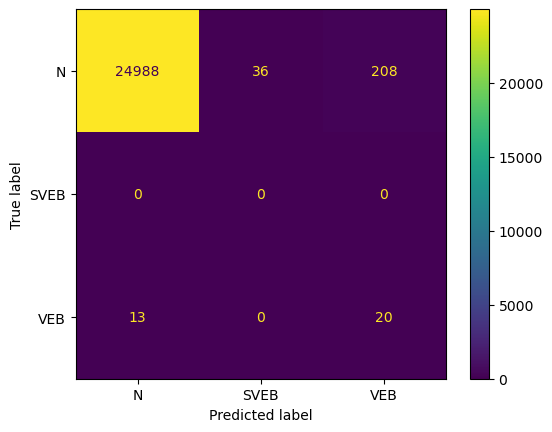

Fold 5:
  Test:  patient=4


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       1.00      0.91      0.95        66
         1.0       0.00      0.00      0.00         0
         2.0       0.00      0.00      0.00         0

    accuracy                           0.91        66
   macro avg       0.33      0.30      0.32        66
weighted avg       1.00      0.91      0.95        66

                 0.0  1.0  2.0  accuracy  macro avg  weighted avg
precision   1.000000  0.0  0.0  0.909091   0.333333      1.000000
recall      0.909091  NaN  NaN  0.909091   0.303030      0.909091
f1-score    0.952381  NaN  NaN  0.909091   0.317460      0.952381
support    66.000000  0.0  0.0  0.909091  66.000000     66.000000


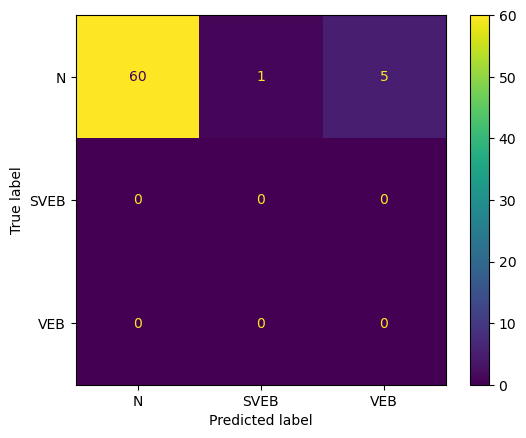

Fold 6:
  Test:  patient=5


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       1.00      0.89      0.94     20894
         1.0       0.00      0.00      0.00         0
         2.0       0.50      0.95      0.66      1538

    accuracy                           0.89     22432
   macro avg       0.50      0.61      0.53     22432
weighted avg       0.96      0.89      0.92     22432

                    0.0  1.0          2.0  accuracy     macro avg  \
precision      0.996552  0.0     0.501025  0.889889      0.499192   
recall         0.885182  NaN     0.953836  0.889889      0.613006   
f1-score       0.937571  NaN     0.656964  0.889889      0.531512   
support    20894.000000  0.0  1538.000000  0.889889  22432.000000   

           weighted avg  
precision      0.962577  
recall         0.889889  
f1-score       0.918332  
support    22432.000000  


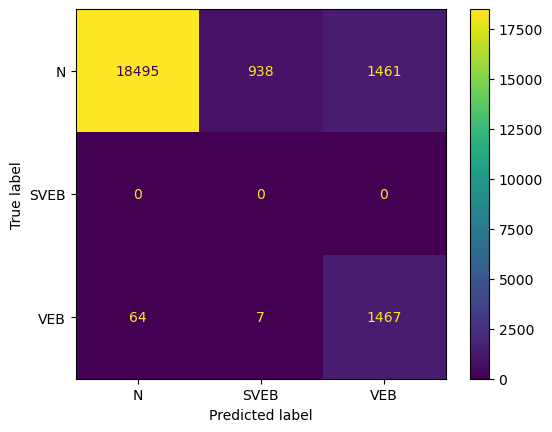

Fold 7:
  Test:  patient=6


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       1.00      0.90      0.95     14088
         1.0       0.00      0.00      0.00         0
         2.0       0.82      0.91      0.86       658

    accuracy                           0.90     14746
   macro avg       0.60      0.60      0.60     14746
weighted avg       0.99      0.90      0.94     14746

                    0.0  1.0         2.0  accuracy     macro avg  weighted avg
precision      0.995532  0.0    0.816576  0.902075      0.604036      0.987547
recall         0.901547  NaN    0.913374  0.902075      0.604974      0.902075
f1-score       0.946212  NaN    0.862267  0.902075      0.602826      0.942466
support    14088.000000  0.0  658.000000  0.902075  14746.000000  14746.000000


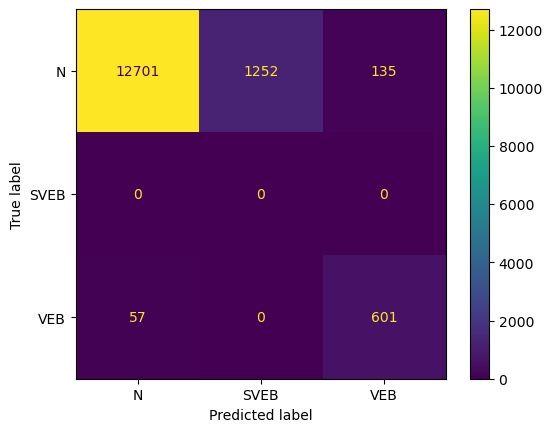

Fold 8:
  Test:  patient=7
              precision    recall  f1-score   support

         0.0       1.00      0.67      0.80      3548
         1.0       0.00      0.00      0.00        11
         2.0       0.23      0.99      0.38       361

    accuracy                           0.70      3920
   macro avg       0.41      0.55      0.39      3920
weighted avg       0.92      0.70      0.76      3920

                   0.0   1.0         2.0  accuracy    macro avg  weighted avg
precision     0.997904   0.0    0.233792  0.698469     0.410565      0.924736
recall        0.671082   0.0    0.988920  0.698469     0.553334      0.698469
f1-score      0.802494   0.0    0.378178  0.698469     0.393557      0.761166
support    3548.000000  11.0  361.000000  0.698469  3920.000000   3920.000000


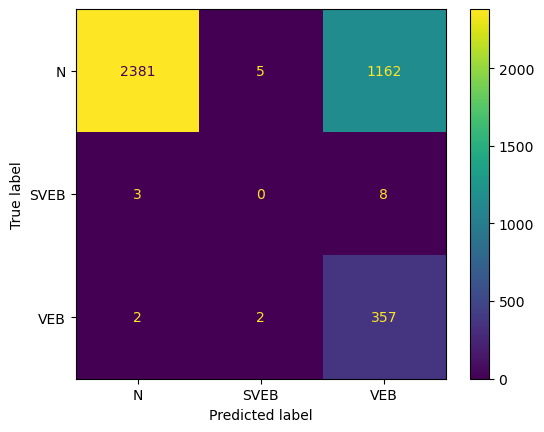

Fold 9:
  Test:  patient=8


C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\anaconda3\envs\DMML\lib\site-packa

              precision    recall  f1-score   support

         0.0       0.95      0.84      0.89     14681
         1.0       0.00      0.00      0.00         0
         2.0       0.38      0.62      0.48      1835

    accuracy                           0.82     16516
   macro avg       0.45      0.49      0.46     16516
weighted avg       0.89      0.82      0.85     16516

                    0.0  1.0          2.0  accuracy     macro avg  \
precision      0.951324  0.0     0.384926  0.819508      0.445417   
recall         0.844016  NaN     0.623433  0.819508      0.489150   
f1-score       0.894463  NaN     0.475973  0.819508      0.456812   
support    14681.000000  0.0  1835.000000  0.819508  16516.000000   

           weighted avg  
precision      0.888395  
recall         0.819508  
f1-score       0.847967  
support    16516.000000  


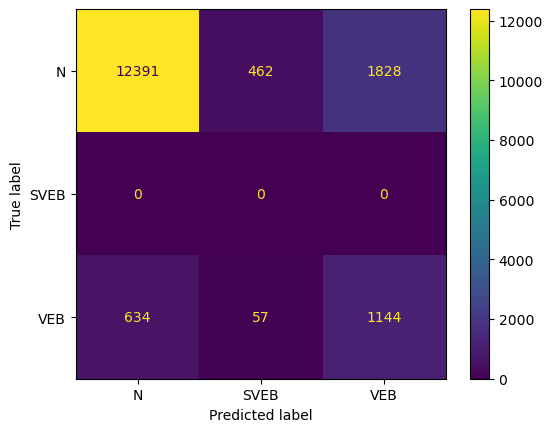

Fold 10:
  Test:  patient=9
              precision    recall  f1-score   support

         0.0       0.98      0.09      0.16     79883
         1.0       0.00      0.00      0.00        23
         2.0       0.03      0.85      0.06      2689

    accuracy                           0.11     82595
   macro avg       0.34      0.31      0.07     82595
weighted avg       0.94      0.11      0.15     82595

                    0.0   1.0          2.0  accuracy     macro avg  \
precision      0.976038   0.0     0.030576  0.110443      0.335538   
recall         0.085663   0.0     0.847527  0.110443      0.311063   
f1-score       0.157502   0.0     0.059022  0.110443      0.072175   
support    79883.000000  23.0  2689.000000  0.110443  82595.000000   

           weighted avg  
precision      0.944985  
recall         0.110443  
f1-score       0.154252  
support    82595.000000  


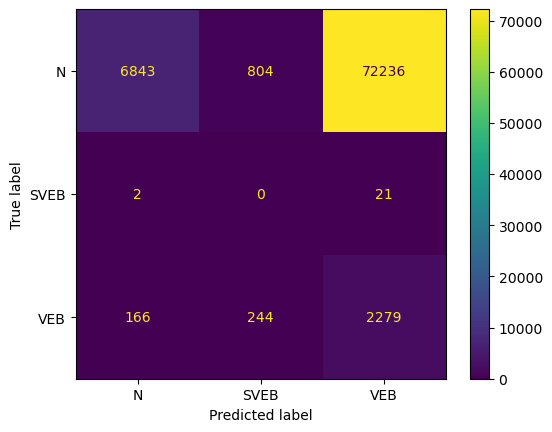

Fold 11:
  Test:  patient=10
              precision    recall  f1-score   support

         0.0       1.00      0.65      0.79      5452
         1.0       0.00      0.00      0.00         1
         2.0       0.03      0.98      0.06        65

    accuracy                           0.65      5518
   macro avg       0.34      0.54      0.28      5518
weighted avg       0.99      0.65      0.78      5518

                   0.0  1.0        2.0  accuracy    macro avg  weighted avg
precision     0.999718  0.0   0.032421  0.653316     0.344046      0.988142
recall        0.649486  0.0   0.984615  0.653316     0.544701      0.653316
f1-score      0.787414  0.0   0.062776  0.653316     0.283397      0.778735
support    5452.000000  1.0  65.000000  0.653316  5518.000000   5518.000000


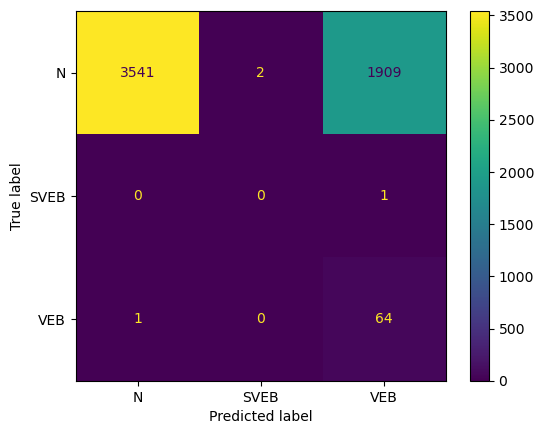

C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\numpy\core\fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\matte\anaconda3\envs\DMML\lib\site-packages\numpy\core\_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [79]:
X=df_sudden.drop('type',axis=1)
y=df_sudden['type']
groups=df_sudden['patient']
skf = LeaveOneGroupOut()


start_time=time.time()
df_PCA_sudden, acc_PCA_sudden,confusion_matrix_final_PCA_sudden,list_sudden_PCA = cross_valid(pipe_smote_PCA, skf, X, y,groups)
end_time=time.time()

In [80]:
df_PCA_sudden

,0.0,1.0,2.0,macro avg,weighted avg
f1-score,0.770739,0.003063,0.393542,0.376633,0.754470
precision,0.987732,0.001230,0.303941,0.430968,0.962092
recall,0.719696,0.081176,0.829112,0.503444,0.718707
support,21717.000000,142.727273,1024.181818,22883.909091,22883.909091


In [83]:
list_normal=retrieve_fscore_avg(list_f1score_sudden)
list_smote=retrieve_fscore_avg(list_sudden_PCA)
wilcoxon(list_normal, list_smote)

WilcoxonResult(statistic=30.0, pvalue=0.8310546875)